In [1]:
import torch
from matplotlib.cm import get_cmap
def is_tensor(data):
    """Checks if data is a torch tensor."""
    return type(data) == torch.Tensor

def depth2inv(depth):
    """
    Invert a depth map to produce an inverse depth map
    Parameters
    ----------
    depth : torch.Tensor or list of torch.Tensor [B,1,H,W]
        Depth map
    Returns
    -------
    inv_depth : torch.Tensor or list of torch.Tensor [B,1,H,W]
        Inverse depth map
    """
    inv_depth = 1. / depth.clamp(min=1e-6)
    inv_depth[depth <= 0.] = 0.
    return inv_depth

def viz_inv_depth(inv_depth, normalizer=None, percentile=95,
                  colormap='plasma', filter_zeros=False):
    """
    Converts an inverse depth map to a colormap for visualization.
    Parameters
    ----------
    inv_depth : torch.Tensor [B,1,H,W]
        Inverse depth map to be converted
    normalizer : float
        Value for inverse depth map normalization
    percentile : float
        Percentile value for automatic normalization
    colormap : str
        Colormap to be used
    filter_zeros : bool
        If True, do not consider zero values during normalization
    Returns
    -------
    colormap : np.array [H,W,3]
        Colormap generated from the inverse depth map
    """
    # If a tensor is provided, convert to numpy
    if is_tensor(inv_depth):
        inv_depth = inv_depth.squeeze(0).squeeze(0)
        # Squeeze if depth channel exists
        # if len(inv_depth.shape) == 3:
        #     inv_depth = inv_depth.squeeze(0)
        inv_depth = inv_depth.detach().cpu().numpy()
    print("inv_depth", inv_depth.shape)
    cm = get_cmap(colormap)
    if normalizer is None:
        normalizer = np.percentile(
            inv_depth[inv_depth > 0] if filter_zeros else inv_depth, percentile)
    inv_depth /= (normalizer + 1e-6)
    print("inv depth", inv_depth.shape)
    return cm(np.clip(inv_depth, 0., 1.0))[:, :, :3]

from PIL import Image
import OpenEXR
import Imath
import numpy

FLOAT = Imath.PixelType(Imath.PixelType.FLOAT)

def exr_to_array(exrfile):
    file = OpenEXR.InputFile(exrfile)
    dw = file.header()['dataWindow']

    channels = file.header()['channels'].keys()
    channels_list = list()
    for c in ('R', 'G', 'B', 'A'):
        if c in channels:
            channels_list.append(c)

    size = (dw.max.x - dw.min.x + 1, dw.max.y - dw.min.y + 1)
    color_channels = file.channels(channels_list, FLOAT)
    channels_tuple = [numpy.fromstring(channel, dtype='f') for channel in color_channels]
    res = numpy.dstack(channels_tuple)
    return res.reshape(size + (len(channels_tuple),))
  
  
def encode_to_srgb(image_array):
    a = 0.055
    return numpy.where(image_array <= 0.0031308,
                       image_array * 12.92,
                       (1 + a) * pow(image_array, 1 / 2.4) - a)
    
    
def exr_to_srgb(exrfile):
    array = exr_to_array(exrfile)
    result = encode_to_srgb(array) * 255.
    present_channels = ["R", "G", "B", "A"][:result.shape[2]]
    channels = "".join(present_channels)
    return Image.fromarray(result.astype('uint8'), channels)

/home/zubair/anaconda3/envs/nerf_pl/lib/python3.6/site-packages/ipykernel_launcher.py:34: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


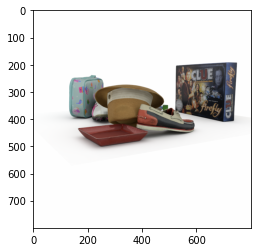

3532
0
float32


ValueError: Images of type float must be between -1 and 1.

In [2]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import OpenEXR
import minexr
import Imath
from PIL import Image
import torch
import cv2
from torchvision import transforms as T
import numpy
# import sys
# numpy.set_printoptions(threshold=sys.maxsize)

exr_rgb = '/home/zubair/Downloads/google_valts/00008/00000.exr'
exr_seg = '/home/zubair/Downloads/google_valts/00008/00000.seg.exr'
exr_depth = '/home/zubair/Downloads/google_valts/00008/00000.depth.exr'


def exr2numpy(exr_path, chanel_name):
    '''
    See:
    https://excamera.com/articles/26/doc/intro.html
    http://www.tobias-weis.de/groundtruth-data-for-computer-vision-with-blender/
    '''
    file = OpenEXR.InputFile(exr_path)
    dw = file.header()['dataWindow']
    size = (dw.max.x - dw.min.x + 1, dw.max.y - dw.min.y + 1)
    
    Float_Type = Imath.PixelType(Imath.PixelType.FLOAT)
    
    channel_str = file.channel(chanel_name, Float_Type)
    
    channel = np.fromstring(channel_str, dtype = np.float32).reshape(size[1],-1)
    
    return(channel)

def load_hdr_as_tensor(img_path):
    """Converts OpenEXR image to torch float tensor."""

    # Read OpenEXR file
    if not OpenEXR.isOpenExrFile(img_path):
        raise ValueError(f'Image {img_path} is not a valid OpenEXR file')
    src = OpenEXR.InputFile(img_path)
    pixel_type = Imath.PixelType(Imath.PixelType.FLOAT)
    dw = src.header()['dataWindow']
    size = (dw.max.x - dw.min.x + 1, dw.max.y - dw.min.y + 1)
    
    # Read into tensor
    tensor = torch.zeros((3, size[1], size[0]))
    for i, c in enumerate('RGB'):
        rgb32f = np.fromstring(src.channel(c, pixel_type), dtype=np.float32)
        tensor[i, :, :] = torch.from_numpy(rgb32f.reshape(size[1], size[0]))
        
    return tensor 

def EncodeToSRGB(v):
    return(np.where(v<=0.0031308,v * 12.92, 1.055*(v**(1.0/2.4)) - 0.055))

channels = []
channel_names = ['R','G','B']
for channel_name in channel_names:
    channel = exr2numpy(exr_rgb, channel_name)
    channels.append(EncodeToSRGB(channel))
    
RGB = np.dstack(channels)

plt.imshow(RGB)
plt.show()
# img = Image.fromarray(np.uint8(RGB*255))

# img = img.resize((400,400), Image.LANCZOS)
# print(RGB.shape)

# img = cv2.imread(exr_rgb, cv2.IMREAD_ANYCOLOR | cv2.IMREAD_ANYDEPTH) 
# plt.imshow(img)
# plt.show()

# img = cv2.resize(img, (400,400), interpolation = cv2.INTER_AREA)

# print(img)
# # img = Image.fromarray(np.uint8(img*255))
# img = img.resize((400,400), Image.LANCZOS)
# plt.imshow(img)
# plt.show()
# mask = cv2.imread(exr_seg, cv2.IMREAD_ANYDEPTH) 
# mask = cv2.resize(mask,(400,400),cv2.INTER_NEAREST)
# mask[mask>3.4028235e+37] = 0
# mask[mask<-3.4028235e+37] = 0 
# mask[mask<= 0] = 0
# mask[mask> 0] = 255            
# mask = mask.astype(np.uint8)
# print(mask.shape)
# mask = np.repeat(mask[...,None],3,axis=2)
# img = Image.fromarray(np.concatenate([np.array(img), mask[:, :, 0:1]], -1), 'RGBA')
# transform = T.ToTensor()
# img = transform(img) # (4, h, w)
# img = img.view(4, -1).permute(1, 0) # (h*w, 4) RGBA
# img = img[:, :3]*img[:, -1:] + (1-img[:, -1:]) # blend A to RGB

# print("img", img.shape)

# img_numpy = img.reshape(400,400,3).numpy()

# fig = plt.figure()
# plt.imshow(RGB)
# plt.colorbar()
# plt.show()

# img = Image.fromarray(np.uint8(RGB*255))
from skimage import img_as_ubyte
# print(RGB)
print((RGB > 1).sum())
print((RGB < -1).sum())
print(RGB.dtype)
img = img_as_ubyte(RGB)
# img = np.uint8(RGB*255)

plt.imshow(img)
plt.colorbar()
plt.show()



img_wh = (400, 400)
# img = img.resize(img_wh, Image.ANTIALIAS)

img = cv2.resize(img, img_wh, interpolation = cv2.INTER_AREA)

plt.imshow(img)
plt.colorbar()
plt.show()

# rgb = exr_to_srgb(exr_rgb)
# plt.imshow(rgb)
# plt.colorbar()
# plt.show()
# plt.imshow(RGB)
# plt.colorbar()
# plt.show()

# tensor = load_hdr_as_tensor(exr_rgb)
# tensor = exr2numpy(exr_rgb, 'RGB')

# plt.imshow(tensor)
# tensor_mask = exr2numpy(exr_seg, 'R')

# print(tensor_mask)
# valid_mask = tensor_mask<10000

# print(valid_mask)

print("mask", mask.shape)

valid_mask = mask

plt.imshow(valid_mask.astype(np.int))
plt.colorbar()
plt.show()

depth = exr2numpy(exr_depth, chanel_name= 'R')


depth_vis = depth2inv(torch.tensor(depth).unsqueeze(0).unsqueeze(0))
print("depth_vis", depth_vis.shape)
depth_vis = viz_inv_depth(depth_vis)


print("depth.shape", depth.shape)
print(depth)
fig = plt.figure()
plt.imshow(depth_vis)
plt.colorbar()
plt.show()

a = tensor_mask == 7

depth = depth[a]

print("masked depth", depth)

plt.imshow(a)

# plt.imshow(tensor.permute(1,2,0).numpy())
# plt.imshow(tensor_mask.permute(1,2,0).numpy())



In [ ]:
from PIL import Image
from torchvision import transforms as T
import matplotlib.pyplot as plt
img = Image.open('/home/zubair/Downloads/google_valts/00007/00000.png')
plt.imshow(img)
plt.show()
img_wh = (400, 400)
img = img.resize(img_wh, Image.LANCZOS)

plt.imshow(img)
transform = T.ToTensor()
img = transform(img)

# print(img.shape)

# img = img.permute(1,2,0).numpy()

import torch

def generate_masked_tensor(input, mask, fill=0):
    masked_tensor = torch.zeros(input.size()) + fill
    masked_tensor[mask] = input[mask]
    return masked_tensor

# if __name__ == "__main__":
#     img = torch.randn(2, 2)
#     mask = torch.tensor([False, True, True, False]).bool().view(2, 2)
#     masked_img = generate_masked_tensor(img, mask)
#     print (masked_img)

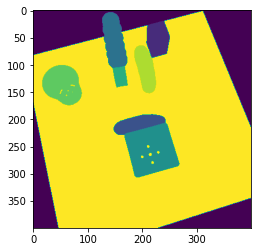

(400, 400)


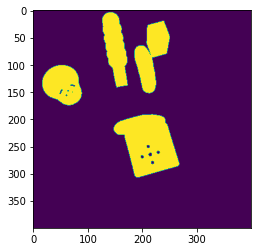

31543


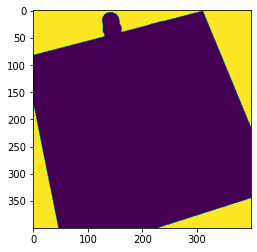

2249


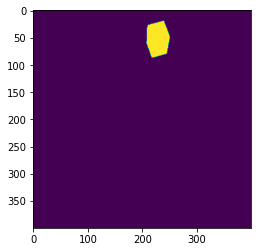

2114


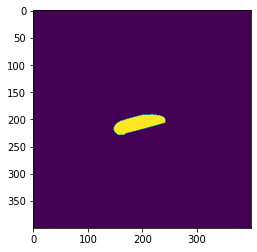

3296


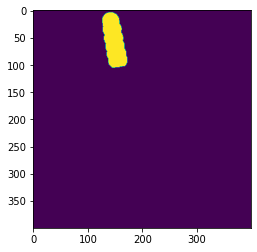

6805


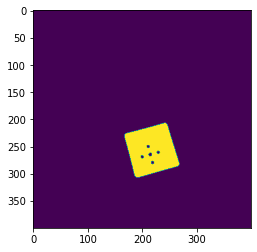

801


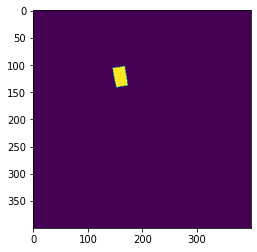

3976


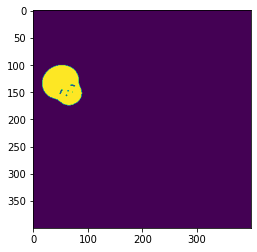

NameError: name 'transform' is not defined

In [6]:
# print(img.shape)
import cv2
import matplotlib.pyplot as plt
import sys
# import numpy
# numpy.set_printoptions(threshold=sys.maxsize)

img_wh = (400,400)
a = cv2.resize(cv2.imread('/home/zubair/Downloads/google_valts/00007/00000.seg.png', cv2.IMREAD_ANYDEPTH),
               img_wh,interpolation=cv2.INTER_NEAREST)

# depth = cv2.imread(
#             '/home/zubair/Downloads/google_scanned/00000/00000.depth.png',
#             cv2.IMREAD_ANYDEPTH,
#         )
# print("depth",depth.shape)
# depth_vis = depth2inv(torch.tensor(depth).unsqueeze(0).unsqueeze(0))
# print("depth_vis", depth_vis.shape)
# depth_vis = viz_inv_depth(depth_vis)

# plt.imshow(depth_vis)
# print(a)
# valid_mask = a>0 
# valid_mask = transform(valid_mask).view(-1)


# valid_mask = valid_mask.view(400,400).numpy()
# print(valid_mask.shape)
# print(a>0)
# print(a)
plt.imshow(a)
plt.show()
print(a.shape)
valid_mask = (a>0) & (a<8)

plt.imshow(valid_mask)
plt.show()
for i in range(7):
    b = a==i
    print(b.sum())
    plt.imshow(b)
    plt.show()

c = transform(b)

print(c.shape)

import numpy.ma as ma


# print(valid_mask)

# valid_mask = np.repeat(valid_mask[...,None],3,axis=2)
# print(img.shape, valid_mask.shape)

valid_mask = transform(valid_mask)
print(valid_mask.shape)

# mx = ma.masked_array(img, mask=valid_mask, fill_value = 0.0)

valid_mask = torch.repeat_interleave(valid_mask, 3, dim=0)
mx = img * valid_mask.int().float()
# print(mx.shape)


mx = generate_masked_tensor(img, valid_mask, 1)
# print(mx.permute(1,2,0).numpy())
plt.imshow(mx.permute(1,2,0).numpy())


In [ ]:
# a = '00149.json'

# print(a.split('.')[0])

y = ma.array([1, 2, 3], mask = [0, 1, 0], fill_value=0)
print(y)

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import sys

np.set_printoptions(threshold=sys.maxsize)
exr_seg = '/home/zubair/Downloads/google_valts/00007/00000.seg.exr'
mask = cv2.imread(exr_seg, cv2.IMREAD_ANYDEPTH)
# mask.astype(int)
mask = cv2.resize(mask,(400,400),cv2.INTER_NEAREST)
mask = mask.astype(np.uint8)
# print(mask)
plt.imshow(mask)
# mask[mask>3.4028235e+37] = 0
# mask[mask<-3.4028235e+37] = 0 

# plt.imshow(mask)

# print(mask)

# a = mask==2

# print(a, a.shape)

# plt.imshow(a)

In [1]:
import numpy as np
print(0.5*800/np.tan(0.5*0.785398))

965.6856480987957


(128, 128, 3)


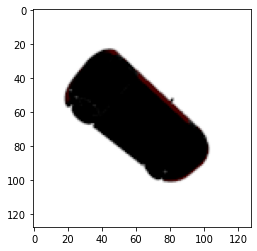

In [7]:
from PIL import Image
from torchvision import transforms as T
def define_transforms(self):
    self.transform = T.ToTensor()
import numpy as np

img_name = '/home/zubair/1a1dcd236a1e6133860800e6696b8284/rgb/000000.png'
img = Image.open(img_name)
img = img.convert('RGB')
im_np = np.array(img)

print(im_np.shape)

import matplotlib.pyplot as plt

plt.imshow(im_np)
plt.show()

transform = T.ToTensor()
img = transform(img)

In [3]:
print(img.shape)

torch.Size([4, 128, 128])


In [1]:
import numpy as np
import torch

a = torch.ones((1,256))

print(a.shape)

torch.Size([1, 256])


In [3]:
print(a.repeat(4096, 1).shape)

torch.Size([4096, 256])


In [21]:
for epoch in range(800):
    print(epoch, 1e-3*(1-epoch/(800*5))**0.99)

0 0.001
1 0.000999752499690599
2 0.0009995049987622916
3 0.0009992574972149217
4 0.0009990099950483327
5 0.000998762492262368
6 0.0009985149888568714
7 0.0009982674848316858
8 0.0009980199801866547
9 0.000997772474921621
10 0.0009975249690364282
11 0.000997277462530919
12 0.0009970299554049366
13 0.0009967824476583237
14 0.000996534939290923
15 0.0009962874303025772
16 0.0009960399206931292
17 0.0009957924104624211
18 0.0009955448996102959
19 0.0009952973881365956
20 0.0009950498760411626
21 0.000994802363323839
22 0.0009945548499844673
23 0.0009943073360228892
24 0.0009940598214389469
25 0.000993812306232482
26 0.0009935647904033367
27 0.0009933172739513526
28 0.0009930697568763713
29 0.0009928222391782345
30 0.0009925747208567837
31 0.0009923272019118602
32 0.0009920796823433054
33 0.0009918321621509604
34 0.0009915846413346668
35 0.0009913371198942654
36 0.0009910895978295974
37 0.0009908420751405034
38 0.0009905945518268245
39 0.0009903470278884014
40 0.0009900995033250751
41 0.000

In [4]:
interval = 250000

for i in range(1000000):
    model_lr = 1e-4
    num_model = i // 250000
    lr1 = model_lr * 2**(-num_model)
    print("i",i, lr1)

i 0 0.0001
i 1 0.0001
i 2 0.0001
i 3 0.0001
i 4 0.0001
i 5 0.0001
i 6 0.0001
i 7 0.0001
i 8 0.0001
i 9 0.0001
i 10 0.0001
i 11 0.0001
i 12 0.0001
i 13 0.0001
i 14 0.0001
i 15 0.0001
i 16 0.0001
i 17 0.0001
i 18 0.0001
i 19 0.0001
i 20 0.0001
i 21 0.0001
i 22 0.0001
i 23 0.0001
i 24 0.0001
i 25 0.0001
i 26 0.0001
i 27 0.0001
i 28 0.0001
i 29 0.0001
i 30 0.0001
i 31 0.0001
i 32 0.0001
i 33 0.0001
i 34 0.0001
i 35 0.0001
i 36 0.0001
i 37 0.0001
i 38 0.0001
i 39 0.0001
i 40 0.0001
i 41 0.0001
i 42 0.0001
i 43 0.0001
i 44 0.0001
i 45 0.0001
i 46 0.0001
i 47 0.0001
i 48 0.0001
i 49 0.0001
i 50 0.0001
i 51 0.0001
i 52 0.0001
i 53 0.0001
i 54 0.0001
i 55 0.0001
i 56 0.0001
i 57 0.0001
i 58 0.0001
i 59 0.0001
i 60 0.0001
i 61 0.0001
i 62 0.0001
i 63 0.0001
i 64 0.0001
i 65 0.0001
i 66 0.0001
i 67 0.0001
i 68 0.0001
i 69 0.0001
i 70 0.0001
i 71 0.0001
i 72 0.0001
i 73 0.0001
i 74 0.0001
i 75 0.0001
i 76 0.0001
i 77 0.0001
i 78 0.0001
i 79 0.0001
i 80 0.0001
i 81 0.0001
i 82 0.0001
i 83 0.0001
i 

i 1469 0.0001
i 1470 0.0001
i 1471 0.0001
i 1472 0.0001
i 1473 0.0001
i 1474 0.0001
i 1475 0.0001
i 1476 0.0001
i 1477 0.0001
i 1478 0.0001
i 1479 0.0001
i 1480 0.0001
i 1481 0.0001
i 1482 0.0001
i 1483 0.0001
i 1484 0.0001
i 1485 0.0001
i 1486 0.0001
i 1487 0.0001
i 1488 0.0001
i 1489 0.0001
i 1490 0.0001
i 1491 0.0001
i 1492 0.0001
i 1493 0.0001
i 1494 0.0001
i 1495 0.0001
i 1496 0.0001
i 1497 0.0001
i 1498 0.0001
i 1499 0.0001
i 1500 0.0001
i 1501 0.0001
i 1502 0.0001
i 1503 0.0001
i 1504 0.0001
i 1505 0.0001
i 1506 0.0001
i 1507 0.0001
i 1508 0.0001
i 1509 0.0001
i 1510 0.0001
i 1511 0.0001
i 1512 0.0001
i 1513 0.0001
i 1514 0.0001
i 1515 0.0001
i 1516 0.0001
i 1517 0.0001
i 1518 0.0001
i 1519 0.0001
i 1520 0.0001
i 1521 0.0001
i 1522 0.0001
i 1523 0.0001
i 1524 0.0001
i 1525 0.0001
i 1526 0.0001
i 1527 0.0001
i 1528 0.0001
i 1529 0.0001
i 1530 0.0001
i 1531 0.0001
i 1532 0.0001
i 1533 0.0001
i 1534 0.0001
i 1535 0.0001
i 1536 0.0001
i 1537 0.0001
i 1538 0.0001
i 1539 0.0001
i 1540

i 2657 0.0001
i 2658 0.0001
i 2659 0.0001
i 2660 0.0001
i 2661 0.0001
i 2662 0.0001
i 2663 0.0001
i 2664 0.0001
i 2665 0.0001
i 2666 0.0001
i 2667 0.0001
i 2668 0.0001
i 2669 0.0001
i 2670 0.0001
i 2671 0.0001
i 2672 0.0001
i 2673 0.0001
i 2674 0.0001
i 2675 0.0001
i 2676 0.0001
i 2677 0.0001
i 2678 0.0001
i 2679 0.0001
i 2680 0.0001
i 2681 0.0001
i 2682 0.0001
i 2683 0.0001
i 2684 0.0001
i 2685 0.0001
i 2686 0.0001
i 2687 0.0001
i 2688 0.0001
i 2689 0.0001
i 2690 0.0001
i 2691 0.0001
i 2692 0.0001
i 2693 0.0001
i 2694 0.0001
i 2695 0.0001
i 2696 0.0001
i 2697 0.0001
i 2698 0.0001
i 2699 0.0001
i 2700 0.0001
i 2701 0.0001
i 2702 0.0001
i 2703 0.0001
i 2704 0.0001
i 2705 0.0001
i 2706 0.0001
i 2707 0.0001
i 2708 0.0001
i 2709 0.0001
i 2710 0.0001
i 2711 0.0001
i 2712 0.0001
i 2713 0.0001
i 2714 0.0001
i 2715 0.0001
i 2716 0.0001
i 2717 0.0001
i 2718 0.0001
i 2719 0.0001
i 2720 0.0001
i 2721 0.0001
i 2722 0.0001
i 2723 0.0001
i 2724 0.0001
i 2725 0.0001
i 2726 0.0001
i 2727 0.0001
i 2728

i 4002 0.0001
i 4003 0.0001
i 4004 0.0001
i 4005 0.0001
i 4006 0.0001
i 4007 0.0001
i 4008 0.0001
i 4009 0.0001
i 4010 0.0001
i 4011 0.0001
i 4012 0.0001
i 4013 0.0001
i 4014 0.0001
i 4015 0.0001
i 4016 0.0001
i 4017 0.0001
i 4018 0.0001
i 4019 0.0001
i 4020 0.0001
i 4021 0.0001
i 4022 0.0001
i 4023 0.0001
i 4024 0.0001
i 4025 0.0001
i 4026 0.0001
i 4027 0.0001
i 4028 0.0001
i 4029 0.0001
i 4030 0.0001
i 4031 0.0001
i 4032 0.0001
i 4033 0.0001
i 4034 0.0001
i 4035 0.0001
i 4036 0.0001
i 4037 0.0001
i 4038 0.0001
i 4039 0.0001
i 4040 0.0001
i 4041 0.0001
i 4042 0.0001
i 4043 0.0001
i 4044 0.0001
i 4045 0.0001
i 4046 0.0001
i 4047 0.0001
i 4048 0.0001
i 4049 0.0001
i 4050 0.0001
i 4051 0.0001
i 4052 0.0001
i 4053 0.0001
i 4054 0.0001
i 4055 0.0001
i 4056 0.0001
i 4057 0.0001
i 4058 0.0001
i 4059 0.0001
i 4060 0.0001
i 4061 0.0001
i 4062 0.0001
i 4063 0.0001
i 4064 0.0001
i 4065 0.0001
i 4066 0.0001
i 4067 0.0001
i 4068 0.0001
i 4069 0.0001
i 4070 0.0001
i 4071 0.0001
i 4072 0.0001
i 4073

i 5282 0.0001
i 5283 0.0001
i 5284 0.0001
i 5285 0.0001
i 5286 0.0001
i 5287 0.0001
i 5288 0.0001
i 5289 0.0001
i 5290 0.0001
i 5291 0.0001
i 5292 0.0001
i 5293 0.0001
i 5294 0.0001
i 5295 0.0001
i 5296 0.0001
i 5297 0.0001
i 5298 0.0001
i 5299 0.0001
i 5300 0.0001
i 5301 0.0001
i 5302 0.0001
i 5303 0.0001
i 5304 0.0001
i 5305 0.0001
i 5306 0.0001
i 5307 0.0001
i 5308 0.0001
i 5309 0.0001
i 5310 0.0001
i 5311 0.0001
i 5312 0.0001
i 5313 0.0001
i 5314 0.0001
i 5315 0.0001
i 5316 0.0001
i 5317 0.0001
i 5318 0.0001
i 5319 0.0001
i 5320 0.0001
i 5321 0.0001
i 5322 0.0001
i 5323 0.0001
i 5324 0.0001
i 5325 0.0001
i 5326 0.0001
i 5327 0.0001
i 5328 0.0001
i 5329 0.0001
i 5330 0.0001
i 5331 0.0001
i 5332 0.0001
i 5333 0.0001
i 5334 0.0001
i 5335 0.0001
i 5336 0.0001
i 5337 0.0001
i 5338 0.0001
i 5339 0.0001
i 5340 0.0001
i 5341 0.0001
i 5342 0.0001
i 5343 0.0001
i 5344 0.0001
i 5345 0.0001
i 5346 0.0001
i 5347 0.0001
i 5348 0.0001
i 5349 0.0001
i 5350 0.0001
i 5351 0.0001
i 5352 0.0001
i 5353

i 6434 0.0001
i 6435 0.0001
i 6436 0.0001
i 6437 0.0001
i 6438 0.0001
i 6439 0.0001
i 6440 0.0001
i 6441 0.0001
i 6442 0.0001
i 6443 0.0001
i 6444 0.0001
i 6445 0.0001
i 6446 0.0001
i 6447 0.0001
i 6448 0.0001
i 6449 0.0001
i 6450 0.0001
i 6451 0.0001
i 6452 0.0001
i 6453 0.0001
i 6454 0.0001
i 6455 0.0001
i 6456 0.0001
i 6457 0.0001
i 6458 0.0001
i 6459 0.0001
i 6460 0.0001
i 6461 0.0001
i 6462 0.0001
i 6463 0.0001
i 6464 0.0001
i 6465 0.0001
i 6466 0.0001
i 6467 0.0001
i 6468 0.0001
i 6469 0.0001
i 6470 0.0001
i 6471 0.0001
i 6472 0.0001
i 6473 0.0001
i 6474 0.0001
i 6475 0.0001
i 6476 0.0001
i 6477 0.0001
i 6478 0.0001
i 6479 0.0001
i 6480 0.0001
i 6481 0.0001
i 6482 0.0001
i 6483 0.0001
i 6484 0.0001
i 6485 0.0001
i 6486 0.0001
i 6487 0.0001
i 6488 0.0001
i 6489 0.0001
i 6490 0.0001
i 6491 0.0001
i 6492 0.0001
i 6493 0.0001
i 6494 0.0001
i 6495 0.0001
i 6496 0.0001
i 6497 0.0001
i 6498 0.0001
i 6499 0.0001
i 6500 0.0001
i 6501 0.0001
i 6502 0.0001
i 6503 0.0001
i 6504 0.0001
i 6505

i 7586 0.0001
i 7587 0.0001
i 7588 0.0001
i 7589 0.0001
i 7590 0.0001
i 7591 0.0001
i 7592 0.0001
i 7593 0.0001
i 7594 0.0001
i 7595 0.0001
i 7596 0.0001
i 7597 0.0001
i 7598 0.0001
i 7599 0.0001
i 7600 0.0001
i 7601 0.0001
i 7602 0.0001
i 7603 0.0001
i 7604 0.0001
i 7605 0.0001
i 7606 0.0001
i 7607 0.0001
i 7608 0.0001
i 7609 0.0001
i 7610 0.0001
i 7611 0.0001
i 7612 0.0001
i 7613 0.0001
i 7614 0.0001
i 7615 0.0001
i 7616 0.0001
i 7617 0.0001
i 7618 0.0001
i 7619 0.0001
i 7620 0.0001
i 7621 0.0001
i 7622 0.0001
i 7623 0.0001
i 7624 0.0001
i 7625 0.0001
i 7626 0.0001
i 7627 0.0001
i 7628 0.0001
i 7629 0.0001
i 7630 0.0001
i 7631 0.0001
i 7632 0.0001
i 7633 0.0001
i 7634 0.0001
i 7635 0.0001
i 7636 0.0001
i 7637 0.0001
i 7638 0.0001
i 7639 0.0001
i 7640 0.0001
i 7641 0.0001
i 7642 0.0001
i 7643 0.0001
i 7644 0.0001
i 7645 0.0001
i 7646 0.0001
i 7647 0.0001
i 7648 0.0001
i 7649 0.0001
i 7650 0.0001
i 7651 0.0001
i 7652 0.0001
i 7653 0.0001
i 7654 0.0001
i 7655 0.0001
i 7656 0.0001
i 7657

i 8908 0.0001
i 8909 0.0001
i 8910 0.0001
i 8911 0.0001
i 8912 0.0001
i 8913 0.0001
i 8914 0.0001
i 8915 0.0001
i 8916 0.0001
i 8917 0.0001
i 8918 0.0001
i 8919 0.0001
i 8920 0.0001
i 8921 0.0001
i 8922 0.0001
i 8923 0.0001
i 8924 0.0001
i 8925 0.0001
i 8926 0.0001
i 8927 0.0001
i 8928 0.0001
i 8929 0.0001
i 8930 0.0001
i 8931 0.0001
i 8932 0.0001
i 8933 0.0001
i 8934 0.0001
i 8935 0.0001
i 8936 0.0001
i 8937 0.0001
i 8938 0.0001
i 8939 0.0001
i 8940 0.0001
i 8941 0.0001
i 8942 0.0001
i 8943 0.0001
i 8944 0.0001
i 8945 0.0001
i 8946 0.0001
i 8947 0.0001
i 8948 0.0001
i 8949 0.0001
i 8950 0.0001
i 8951 0.0001
i 8952 0.0001
i 8953 0.0001
i 8954 0.0001
i 8955 0.0001
i 8956 0.0001
i 8957 0.0001
i 8958 0.0001
i 8959 0.0001
i 8960 0.0001
i 8961 0.0001
i 8962 0.0001
i 8963 0.0001
i 8964 0.0001
i 8965 0.0001
i 8966 0.0001
i 8967 0.0001
i 8968 0.0001
i 8969 0.0001
i 8970 0.0001
i 8971 0.0001
i 8972 0.0001
i 8973 0.0001
i 8974 0.0001
i 8975 0.0001
i 8976 0.0001
i 8977 0.0001
i 8978 0.0001
i 8979

i 10188 0.0001
i 10189 0.0001
i 10190 0.0001
i 10191 0.0001
i 10192 0.0001
i 10193 0.0001
i 10194 0.0001
i 10195 0.0001
i 10196 0.0001
i 10197 0.0001
i 10198 0.0001
i 10199 0.0001
i 10200 0.0001
i 10201 0.0001
i 10202 0.0001
i 10203 0.0001
i 10204 0.0001
i 10205 0.0001
i 10206 0.0001
i 10207 0.0001
i 10208 0.0001
i 10209 0.0001
i 10210 0.0001
i 10211 0.0001
i 10212 0.0001
i 10213 0.0001
i 10214 0.0001
i 10215 0.0001
i 10216 0.0001
i 10217 0.0001
i 10218 0.0001
i 10219 0.0001
i 10220 0.0001
i 10221 0.0001
i 10222 0.0001
i 10223 0.0001
i 10224 0.0001
i 10225 0.0001
i 10226 0.0001
i 10227 0.0001
i 10228 0.0001
i 10229 0.0001
i 10230 0.0001
i 10231 0.0001
i 10232 0.0001
i 10233 0.0001
i 10234 0.0001
i 10235 0.0001
i 10236 0.0001
i 10237 0.0001
i 10238 0.0001
i 10239 0.0001
i 10240 0.0001
i 10241 0.0001
i 10242 0.0001
i 10243 0.0001
i 10244 0.0001
i 10245 0.0001
i 10246 0.0001
i 10247 0.0001
i 10248 0.0001
i 10249 0.0001
i 10250 0.0001
i 10251 0.0001
i 10252 0.0001
i 10253 0.0001
i 10254 0.

i 11596 0.0001
i 11597 0.0001
i 11598 0.0001
i 11599 0.0001
i 11600 0.0001
i 11601 0.0001
i 11602 0.0001
i 11603 0.0001
i 11604 0.0001
i 11605 0.0001
i 11606 0.0001
i 11607 0.0001
i 11608 0.0001
i 11609 0.0001
i 11610 0.0001
i 11611 0.0001
i 11612 0.0001
i 11613 0.0001
i 11614 0.0001
i 11615 0.0001
i 11616 0.0001
i 11617 0.0001
i 11618 0.0001
i 11619 0.0001
i 11620 0.0001
i 11621 0.0001
i 11622 0.0001
i 11623 0.0001
i 11624 0.0001
i 11625 0.0001
i 11626 0.0001
i 11627 0.0001
i 11628 0.0001
i 11629 0.0001
i 11630 0.0001
i 11631 0.0001
i 11632 0.0001
i 11633 0.0001
i 11634 0.0001
i 11635 0.0001
i 11636 0.0001
i 11637 0.0001
i 11638 0.0001
i 11639 0.0001
i 11640 0.0001
i 11641 0.0001
i 11642 0.0001
i 11643 0.0001
i 11644 0.0001
i 11645 0.0001
i 11646 0.0001
i 11647 0.0001
i 11648 0.0001
i 11649 0.0001
i 11650 0.0001
i 11651 0.0001
i 11652 0.0001
i 11653 0.0001
i 11654 0.0001
i 11655 0.0001
i 11656 0.0001
i 11657 0.0001
i 11658 0.0001
i 11659 0.0001
i 11660 0.0001
i 11661 0.0001
i 11662 0.

i 12577 0.0001
i 12578 0.0001
i 12579 0.0001
i 12580 0.0001
i 12581 0.0001
i 12582 0.0001
i 12583 0.0001
i 12584 0.0001
i 12585 0.0001
i 12586 0.0001
i 12587 0.0001
i 12588 0.0001
i 12589 0.0001
i 12590 0.0001
i 12591 0.0001
i 12592 0.0001
i 12593 0.0001
i 12594 0.0001
i 12595 0.0001
i 12596 0.0001
i 12597 0.0001
i 12598 0.0001
i 12599 0.0001
i 12600 0.0001
i 12601 0.0001
i 12602 0.0001
i 12603 0.0001
i 12604 0.0001
i 12605 0.0001
i 12606 0.0001
i 12607 0.0001
i 12608 0.0001
i 12609 0.0001
i 12610 0.0001
i 12611 0.0001
i 12612 0.0001
i 12613 0.0001
i 12614 0.0001
i 12615 0.0001
i 12616 0.0001
i 12617 0.0001
i 12618 0.0001
i 12619 0.0001
i 12620 0.0001
i 12621 0.0001
i 12622 0.0001
i 12623 0.0001
i 12624 0.0001
i 12625 0.0001
i 12626 0.0001
i 12627 0.0001
i 12628 0.0001
i 12629 0.0001
i 12630 0.0001
i 12631 0.0001
i 12632 0.0001
i 12633 0.0001
i 12634 0.0001
i 12635 0.0001
i 12636 0.0001
i 12637 0.0001
i 12638 0.0001
i 12639 0.0001
i 12640 0.0001
i 12641 0.0001
i 12642 0.0001
i 12643 0.

i 13939 0.0001
i 13940 0.0001
i 13941 0.0001
i 13942 0.0001
i 13943 0.0001
i 13944 0.0001
i 13945 0.0001
i 13946 0.0001
i 13947 0.0001
i 13948 0.0001
i 13949 0.0001
i 13950 0.0001
i 13951 0.0001
i 13952 0.0001
i 13953 0.0001
i 13954 0.0001
i 13955 0.0001
i 13956 0.0001
i 13957 0.0001
i 13958 0.0001
i 13959 0.0001
i 13960 0.0001
i 13961 0.0001
i 13962 0.0001
i 13963 0.0001
i 13964 0.0001
i 13965 0.0001
i 13966 0.0001
i 13967 0.0001
i 13968 0.0001
i 13969 0.0001
i 13970 0.0001
i 13971 0.0001
i 13972 0.0001
i 13973 0.0001
i 13974 0.0001
i 13975 0.0001
i 13976 0.0001
i 13977 0.0001
i 13978 0.0001
i 13979 0.0001
i 13980 0.0001
i 13981 0.0001
i 13982 0.0001
i 13983 0.0001
i 13984 0.0001
i 13985 0.0001
i 13986 0.0001
i 13987 0.0001
i 13988 0.0001
i 13989 0.0001
i 13990 0.0001
i 13991 0.0001
i 13992 0.0001
i 13993 0.0001
i 13994 0.0001
i 13995 0.0001
i 13996 0.0001
i 13997 0.0001
i 13998 0.0001
i 13999 0.0001
i 14000 0.0001
i 14001 0.0001
i 14002 0.0001
i 14003 0.0001
i 14004 0.0001
i 14005 0.

i 15009 0.0001
i 15010 0.0001
i 15011 0.0001
i 15012 0.0001
i 15013 0.0001
i 15014 0.0001
i 15015 0.0001
i 15016 0.0001
i 15017 0.0001
i 15018 0.0001
i 15019 0.0001
i 15020 0.0001
i 15021 0.0001
i 15022 0.0001
i 15023 0.0001
i 15024 0.0001
i 15025 0.0001
i 15026 0.0001
i 15027 0.0001
i 15028 0.0001
i 15029 0.0001
i 15030 0.0001
i 15031 0.0001
i 15032 0.0001
i 15033 0.0001
i 15034 0.0001
i 15035 0.0001
i 15036 0.0001
i 15037 0.0001
i 15038 0.0001
i 15039 0.0001
i 15040 0.0001
i 15041 0.0001
i 15042 0.0001
i 15043 0.0001
i 15044 0.0001
i 15045 0.0001
i 15046 0.0001
i 15047 0.0001
i 15048 0.0001
i 15049 0.0001
i 15050 0.0001
i 15051 0.0001
i 15052 0.0001
i 15053 0.0001
i 15054 0.0001
i 15055 0.0001
i 15056 0.0001
i 15057 0.0001
i 15058 0.0001
i 15059 0.0001
i 15060 0.0001
i 15061 0.0001
i 15062 0.0001
i 15063 0.0001
i 15064 0.0001
i 15065 0.0001
i 15066 0.0001
i 15067 0.0001
i 15068 0.0001
i 15069 0.0001
i 15070 0.0001
i 15071 0.0001
i 15072 0.0001
i 15073 0.0001
i 15074 0.0001
i 15075 0.

i 16634 0.0001
i 16635 0.0001
i 16636 0.0001
i 16637 0.0001
i 16638 0.0001
i 16639 0.0001
i 16640 0.0001
i 16641 0.0001
i 16642 0.0001
i 16643 0.0001
i 16644 0.0001
i 16645 0.0001
i 16646 0.0001
i 16647 0.0001
i 16648 0.0001
i 16649 0.0001
i 16650 0.0001
i 16651 0.0001
i 16652 0.0001
i 16653 0.0001
i 16654 0.0001
i 16655 0.0001
i 16656 0.0001
i 16657 0.0001
i 16658 0.0001
i 16659 0.0001
i 16660 0.0001
i 16661 0.0001
i 16662 0.0001
i 16663 0.0001
i 16664 0.0001
i 16665 0.0001
i 16666 0.0001
i 16667 0.0001
i 16668 0.0001
i 16669 0.0001
i 16670 0.0001
i 16671 0.0001
i 16672 0.0001
i 16673 0.0001
i 16674 0.0001
i 16675 0.0001
i 16676 0.0001
i 16677 0.0001
i 16678 0.0001
i 16679 0.0001
i 16680 0.0001
i 16681 0.0001
i 16682 0.0001
i 16683 0.0001
i 16684 0.0001
i 16685 0.0001
i 16686 0.0001
i 16687 0.0001
i 16688 0.0001
i 16689 0.0001
i 16690 0.0001
i 16691 0.0001
i 16692 0.0001
i 16693 0.0001
i 16694 0.0001
i 16695 0.0001
i 16696 0.0001
i 16697 0.0001
i 16698 0.0001
i 16699 0.0001
i 16700 0.

i 17789 0.0001
i 17790 0.0001
i 17791 0.0001
i 17792 0.0001
i 17793 0.0001
i 17794 0.0001
i 17795 0.0001
i 17796 0.0001
i 17797 0.0001
i 17798 0.0001
i 17799 0.0001
i 17800 0.0001
i 17801 0.0001
i 17802 0.0001
i 17803 0.0001
i 17804 0.0001
i 17805 0.0001
i 17806 0.0001
i 17807 0.0001
i 17808 0.0001
i 17809 0.0001
i 17810 0.0001
i 17811 0.0001
i 17812 0.0001
i 17813 0.0001
i 17814 0.0001
i 17815 0.0001
i 17816 0.0001
i 17817 0.0001
i 17818 0.0001
i 17819 0.0001
i 17820 0.0001
i 17821 0.0001
i 17822 0.0001
i 17823 0.0001
i 17824 0.0001
i 17825 0.0001
i 17826 0.0001
i 17827 0.0001
i 17828 0.0001
i 17829 0.0001
i 17830 0.0001
i 17831 0.0001
i 17832 0.0001
i 17833 0.0001
i 17834 0.0001
i 17835 0.0001
i 17836 0.0001
i 17837 0.0001
i 17838 0.0001
i 17839 0.0001
i 17840 0.0001
i 17841 0.0001
i 17842 0.0001
i 17843 0.0001
i 17844 0.0001
i 17845 0.0001
i 17846 0.0001
i 17847 0.0001
i 17848 0.0001
i 17849 0.0001
i 17850 0.0001
i 17851 0.0001
i 17852 0.0001
i 17853 0.0001
i 17854 0.0001
i 17855 0.

i 19074 0.0001
i 19075 0.0001
i 19076 0.0001
i 19077 0.0001
i 19078 0.0001
i 19079 0.0001
i 19080 0.0001
i 19081 0.0001
i 19082 0.0001
i 19083 0.0001
i 19084 0.0001
i 19085 0.0001
i 19086 0.0001
i 19087 0.0001
i 19088 0.0001
i 19089 0.0001
i 19090 0.0001
i 19091 0.0001
i 19092 0.0001
i 19093 0.0001
i 19094 0.0001
i 19095 0.0001
i 19096 0.0001
i 19097 0.0001
i 19098 0.0001
i 19099 0.0001
i 19100 0.0001
i 19101 0.0001
i 19102 0.0001
i 19103 0.0001
i 19104 0.0001
i 19105 0.0001
i 19106 0.0001
i 19107 0.0001
i 19108 0.0001
i 19109 0.0001
i 19110 0.0001
i 19111 0.0001
i 19112 0.0001
i 19113 0.0001
i 19114 0.0001
i 19115 0.0001
i 19116 0.0001
i 19117 0.0001
i 19118 0.0001
i 19119 0.0001
i 19120 0.0001
i 19121 0.0001
i 19122 0.0001
i 19123 0.0001
i 19124 0.0001
i 19125 0.0001
i 19126 0.0001
i 19127 0.0001
i 19128 0.0001
i 19129 0.0001
i 19130 0.0001
i 19131 0.0001
i 19132 0.0001
i 19133 0.0001
i 19134 0.0001
i 19135 0.0001
i 19136 0.0001
i 19137 0.0001
i 19138 0.0001
i 19139 0.0001
i 19140 0.

i 20469 0.0001
i 20470 0.0001
i 20471 0.0001
i 20472 0.0001
i 20473 0.0001
i 20474 0.0001
i 20475 0.0001
i 20476 0.0001
i 20477 0.0001
i 20478 0.0001
i 20479 0.0001
i 20480 0.0001
i 20481 0.0001
i 20482 0.0001
i 20483 0.0001
i 20484 0.0001
i 20485 0.0001
i 20486 0.0001
i 20487 0.0001
i 20488 0.0001
i 20489 0.0001
i 20490 0.0001
i 20491 0.0001
i 20492 0.0001
i 20493 0.0001
i 20494 0.0001
i 20495 0.0001
i 20496 0.0001
i 20497 0.0001
i 20498 0.0001
i 20499 0.0001
i 20500 0.0001
i 20501 0.0001
i 20502 0.0001
i 20503 0.0001
i 20504 0.0001
i 20505 0.0001
i 20506 0.0001
i 20507 0.0001
i 20508 0.0001
i 20509 0.0001
i 20510 0.0001
i 20511 0.0001
i 20512 0.0001
i 20513 0.0001
i 20514 0.0001
i 20515 0.0001
i 20516 0.0001
i 20517 0.0001
i 20518 0.0001
i 20519 0.0001
i 20520 0.0001
i 20521 0.0001
i 20522 0.0001
i 20523 0.0001
i 20524 0.0001
i 20525 0.0001
i 20526 0.0001
i 20527 0.0001
i 20528 0.0001
i 20529 0.0001
i 20530 0.0001
i 20531 0.0001
i 20532 0.0001
i 20533 0.0001
i 20534 0.0001
i 20535 0.

i 21738 0.0001
i 21739 0.0001
i 21740 0.0001
i 21741 0.0001
i 21742 0.0001
i 21743 0.0001
i 21744 0.0001
i 21745 0.0001
i 21746 0.0001
i 21747 0.0001
i 21748 0.0001
i 21749 0.0001
i 21750 0.0001
i 21751 0.0001
i 21752 0.0001
i 21753 0.0001
i 21754 0.0001
i 21755 0.0001
i 21756 0.0001
i 21757 0.0001
i 21758 0.0001
i 21759 0.0001
i 21760 0.0001
i 21761 0.0001
i 21762 0.0001
i 21763 0.0001
i 21764 0.0001
i 21765 0.0001
i 21766 0.0001
i 21767 0.0001
i 21768 0.0001
i 21769 0.0001
i 21770 0.0001
i 21771 0.0001
i 21772 0.0001
i 21773 0.0001
i 21774 0.0001
i 21775 0.0001
i 21776 0.0001
i 21777 0.0001
i 21778 0.0001
i 21779 0.0001
i 21780 0.0001
i 21781 0.0001
i 21782 0.0001
i 21783 0.0001
i 21784 0.0001
i 21785 0.0001
i 21786 0.0001
i 21787 0.0001
i 21788 0.0001
i 21789 0.0001
i 21790 0.0001
i 21791 0.0001
i 21792 0.0001
i 21793 0.0001
i 21794 0.0001
i 21795 0.0001
i 21796 0.0001
i 21797 0.0001
i 21798 0.0001
i 21799 0.0001
i 21800 0.0001
i 21801 0.0001
i 21802 0.0001
i 21803 0.0001
i 21804 0.

i 23072 0.0001
i 23073 0.0001
i 23074 0.0001
i 23075 0.0001
i 23076 0.0001
i 23077 0.0001
i 23078 0.0001
i 23079 0.0001
i 23080 0.0001
i 23081 0.0001
i 23082 0.0001
i 23083 0.0001
i 23084 0.0001
i 23085 0.0001
i 23086 0.0001
i 23087 0.0001
i 23088 0.0001
i 23089 0.0001
i 23090 0.0001
i 23091 0.0001
i 23092 0.0001
i 23093 0.0001
i 23094 0.0001
i 23095 0.0001
i 23096 0.0001
i 23097 0.0001
i 23098 0.0001
i 23099 0.0001
i 23100 0.0001
i 23101 0.0001
i 23102 0.0001
i 23103 0.0001
i 23104 0.0001
i 23105 0.0001
i 23106 0.0001
i 23107 0.0001
i 23108 0.0001
i 23109 0.0001
i 23110 0.0001
i 23111 0.0001
i 23112 0.0001
i 23113 0.0001
i 23114 0.0001
i 23115 0.0001
i 23116 0.0001
i 23117 0.0001
i 23118 0.0001
i 23119 0.0001
i 23120 0.0001
i 23121 0.0001
i 23122 0.0001
i 23123 0.0001
i 23124 0.0001
i 23125 0.0001
i 23126 0.0001
i 23127 0.0001
i 23128 0.0001
i 23129 0.0001
i 23130 0.0001
i 23131 0.0001
i 23132 0.0001
i 23133 0.0001
i 23134 0.0001
i 23135 0.0001
i 23136 0.0001
i 23137 0.0001
i 23138 0.

i 24466 0.0001
i 24467 0.0001
i 24468 0.0001
i 24469 0.0001
i 24470 0.0001
i 24471 0.0001
i 24472 0.0001
i 24473 0.0001
i 24474 0.0001
i 24475 0.0001
i 24476 0.0001
i 24477 0.0001
i 24478 0.0001
i 24479 0.0001
i 24480 0.0001
i 24481 0.0001
i 24482 0.0001
i 24483 0.0001
i 24484 0.0001
i 24485 0.0001
i 24486 0.0001
i 24487 0.0001
i 24488 0.0001
i 24489 0.0001
i 24490 0.0001
i 24491 0.0001
i 24492 0.0001
i 24493 0.0001
i 24494 0.0001
i 24495 0.0001
i 24496 0.0001
i 24497 0.0001
i 24498 0.0001
i 24499 0.0001
i 24500 0.0001
i 24501 0.0001
i 24502 0.0001
i 24503 0.0001
i 24504 0.0001
i 24505 0.0001
i 24506 0.0001
i 24507 0.0001
i 24508 0.0001
i 24509 0.0001
i 24510 0.0001
i 24511 0.0001
i 24512 0.0001
i 24513 0.0001
i 24514 0.0001
i 24515 0.0001
i 24516 0.0001
i 24517 0.0001
i 24518 0.0001
i 24519 0.0001
i 24520 0.0001
i 24521 0.0001
i 24522 0.0001
i 24523 0.0001
i 24524 0.0001
i 24525 0.0001
i 24526 0.0001
i 24527 0.0001
i 24528 0.0001
i 24529 0.0001
i 24530 0.0001
i 24531 0.0001
i 24532 0.

i 25679 0.0001
i 25680 0.0001
i 25681 0.0001
i 25682 0.0001
i 25683 0.0001
i 25684 0.0001
i 25685 0.0001
i 25686 0.0001
i 25687 0.0001
i 25688 0.0001
i 25689 0.0001
i 25690 0.0001
i 25691 0.0001
i 25692 0.0001
i 25693 0.0001
i 25694 0.0001
i 25695 0.0001
i 25696 0.0001
i 25697 0.0001
i 25698 0.0001
i 25699 0.0001
i 25700 0.0001
i 25701 0.0001
i 25702 0.0001
i 25703 0.0001
i 25704 0.0001
i 25705 0.0001
i 25706 0.0001
i 25707 0.0001
i 25708 0.0001
i 25709 0.0001
i 25710 0.0001
i 25711 0.0001
i 25712 0.0001
i 25713 0.0001
i 25714 0.0001
i 25715 0.0001
i 25716 0.0001
i 25717 0.0001
i 25718 0.0001
i 25719 0.0001
i 25720 0.0001
i 25721 0.0001
i 25722 0.0001
i 25723 0.0001
i 25724 0.0001
i 25725 0.0001
i 25726 0.0001
i 25727 0.0001
i 25728 0.0001
i 25729 0.0001
i 25730 0.0001
i 25731 0.0001
i 25732 0.0001
i 25733 0.0001
i 25734 0.0001
i 25735 0.0001
i 25736 0.0001
i 25737 0.0001
i 25738 0.0001
i 25739 0.0001
i 25740 0.0001
i 25741 0.0001
i 25742 0.0001
i 25743 0.0001
i 25744 0.0001
i 25745 0.

i 27114 0.0001
i 27115 0.0001
i 27116 0.0001
i 27117 0.0001
i 27118 0.0001
i 27119 0.0001
i 27120 0.0001
i 27121 0.0001
i 27122 0.0001
i 27123 0.0001
i 27124 0.0001
i 27125 0.0001
i 27126 0.0001
i 27127 0.0001
i 27128 0.0001
i 27129 0.0001
i 27130 0.0001
i 27131 0.0001
i 27132 0.0001
i 27133 0.0001
i 27134 0.0001
i 27135 0.0001
i 27136 0.0001
i 27137 0.0001
i 27138 0.0001
i 27139 0.0001
i 27140 0.0001
i 27141 0.0001
i 27142 0.0001
i 27143 0.0001
i 27144 0.0001
i 27145 0.0001
i 27146 0.0001
i 27147 0.0001
i 27148 0.0001
i 27149 0.0001
i 27150 0.0001
i 27151 0.0001
i 27152 0.0001
i 27153 0.0001
i 27154 0.0001
i 27155 0.0001
i 27156 0.0001
i 27157 0.0001
i 27158 0.0001
i 27159 0.0001
i 27160 0.0001
i 27161 0.0001
i 27162 0.0001
i 27163 0.0001
i 27164 0.0001
i 27165 0.0001
i 27166 0.0001
i 27167 0.0001
i 27168 0.0001
i 27169 0.0001
i 27170 0.0001
i 27171 0.0001
i 27172 0.0001
i 27173 0.0001
i 27174 0.0001
i 27175 0.0001
i 27176 0.0001
i 27177 0.0001
i 27178 0.0001
i 27179 0.0001
i 27180 0.

i 28660 0.0001
i 28661 0.0001
i 28662 0.0001
i 28663 0.0001
i 28664 0.0001
i 28665 0.0001
i 28666 0.0001
i 28667 0.0001
i 28668 0.0001
i 28669 0.0001
i 28670 0.0001
i 28671 0.0001
i 28672 0.0001
i 28673 0.0001
i 28674 0.0001
i 28675 0.0001
i 28676 0.0001
i 28677 0.0001
i 28678 0.0001
i 28679 0.0001
i 28680 0.0001
i 28681 0.0001
i 28682 0.0001
i 28683 0.0001
i 28684 0.0001
i 28685 0.0001
i 28686 0.0001
i 28687 0.0001
i 28688 0.0001
i 28689 0.0001
i 28690 0.0001
i 28691 0.0001
i 28692 0.0001
i 28693 0.0001
i 28694 0.0001
i 28695 0.0001
i 28696 0.0001
i 28697 0.0001
i 28698 0.0001
i 28699 0.0001
i 28700 0.0001
i 28701 0.0001
i 28702 0.0001
i 28703 0.0001
i 28704 0.0001
i 28705 0.0001
i 28706 0.0001
i 28707 0.0001
i 28708 0.0001
i 28709 0.0001
i 28710 0.0001
i 28711 0.0001
i 28712 0.0001
i 28713 0.0001
i 28714 0.0001
i 28715 0.0001
i 28716 0.0001
i 28717 0.0001
i 28718 0.0001
i 28719 0.0001
i 28720 0.0001
i 28721 0.0001
i 28722 0.0001
i 28723 0.0001
i 28724 0.0001
i 28725 0.0001
i 28726 0.

i 30153 0.0001
i 30154 0.0001
i 30155 0.0001
i 30156 0.0001
i 30157 0.0001
i 30158 0.0001
i 30159 0.0001
i 30160 0.0001
i 30161 0.0001
i 30162 0.0001
i 30163 0.0001
i 30164 0.0001
i 30165 0.0001
i 30166 0.0001
i 30167 0.0001
i 30168 0.0001
i 30169 0.0001
i 30170 0.0001
i 30171 0.0001
i 30172 0.0001
i 30173 0.0001
i 30174 0.0001
i 30175 0.0001
i 30176 0.0001
i 30177 0.0001
i 30178 0.0001
i 30179 0.0001
i 30180 0.0001
i 30181 0.0001
i 30182 0.0001
i 30183 0.0001
i 30184 0.0001
i 30185 0.0001
i 30186 0.0001
i 30187 0.0001
i 30188 0.0001
i 30189 0.0001
i 30190 0.0001
i 30191 0.0001
i 30192 0.0001
i 30193 0.0001
i 30194 0.0001
i 30195 0.0001
i 30196 0.0001
i 30197 0.0001
i 30198 0.0001
i 30199 0.0001
i 30200 0.0001
i 30201 0.0001
i 30202 0.0001
i 30203 0.0001
i 30204 0.0001
i 30205 0.0001
i 30206 0.0001
i 30207 0.0001
i 30208 0.0001
i 30209 0.0001
i 30210 0.0001
i 30211 0.0001
i 30212 0.0001
i 30213 0.0001
i 30214 0.0001
i 30215 0.0001
i 30216 0.0001
i 30217 0.0001
i 30218 0.0001
i 30219 0.

i 31692 0.0001
i 31693 0.0001
i 31694 0.0001
i 31695 0.0001
i 31696 0.0001
i 31697 0.0001
i 31698 0.0001
i 31699 0.0001
i 31700 0.0001
i 31701 0.0001
i 31702 0.0001
i 31703 0.0001
i 31704 0.0001
i 31705 0.0001
i 31706 0.0001
i 31707 0.0001
i 31708 0.0001
i 31709 0.0001
i 31710 0.0001
i 31711 0.0001
i 31712 0.0001
i 31713 0.0001
i 31714 0.0001
i 31715 0.0001
i 31716 0.0001
i 31717 0.0001
i 31718 0.0001
i 31719 0.0001
i 31720 0.0001
i 31721 0.0001
i 31722 0.0001
i 31723 0.0001
i 31724 0.0001
i 31725 0.0001
i 31726 0.0001
i 31727 0.0001
i 31728 0.0001
i 31729 0.0001
i 31730 0.0001
i 31731 0.0001
i 31732 0.0001
i 31733 0.0001
i 31734 0.0001
i 31735 0.0001
i 31736 0.0001
i 31737 0.0001
i 31738 0.0001
i 31739 0.0001
i 31740 0.0001
i 31741 0.0001
i 31742 0.0001
i 31743 0.0001
i 31744 0.0001
i 31745 0.0001
i 31746 0.0001
i 31747 0.0001
i 31748 0.0001
i 31749 0.0001
i 31750 0.0001
i 31751 0.0001
i 31752 0.0001
i 31753 0.0001
i 31754 0.0001
i 31755 0.0001
i 31756 0.0001
i 31757 0.0001
i 31758 0.

i 33097 0.0001
i 33098 0.0001
i 33099 0.0001
i 33100 0.0001
i 33101 0.0001
i 33102 0.0001
i 33103 0.0001
i 33104 0.0001
i 33105 0.0001
i 33106 0.0001
i 33107 0.0001
i 33108 0.0001
i 33109 0.0001
i 33110 0.0001
i 33111 0.0001
i 33112 0.0001
i 33113 0.0001
i 33114 0.0001
i 33115 0.0001
i 33116 0.0001
i 33117 0.0001
i 33118 0.0001
i 33119 0.0001
i 33120 0.0001
i 33121 0.0001
i 33122 0.0001
i 33123 0.0001
i 33124 0.0001
i 33125 0.0001
i 33126 0.0001
i 33127 0.0001
i 33128 0.0001
i 33129 0.0001
i 33130 0.0001
i 33131 0.0001
i 33132 0.0001
i 33133 0.0001
i 33134 0.0001
i 33135 0.0001
i 33136 0.0001
i 33137 0.0001
i 33138 0.0001
i 33139 0.0001
i 33140 0.0001
i 33141 0.0001
i 33142 0.0001
i 33143 0.0001
i 33144 0.0001
i 33145 0.0001
i 33146 0.0001
i 33147 0.0001
i 33148 0.0001
i 33149 0.0001
i 33150 0.0001
i 33151 0.0001
i 33152 0.0001
i 33153 0.0001
i 33154 0.0001
i 33155 0.0001
i 33156 0.0001
i 33157 0.0001
i 33158 0.0001
i 33159 0.0001
i 33160 0.0001
i 33161 0.0001
i 33162 0.0001
i 33163 0.

i 34199 0.0001
i 34200 0.0001
i 34201 0.0001
i 34202 0.0001
i 34203 0.0001
i 34204 0.0001
i 34205 0.0001
i 34206 0.0001
i 34207 0.0001
i 34208 0.0001
i 34209 0.0001
i 34210 0.0001
i 34211 0.0001
i 34212 0.0001
i 34213 0.0001
i 34214 0.0001
i 34215 0.0001
i 34216 0.0001
i 34217 0.0001
i 34218 0.0001
i 34219 0.0001
i 34220 0.0001
i 34221 0.0001
i 34222 0.0001
i 34223 0.0001
i 34224 0.0001
i 34225 0.0001
i 34226 0.0001
i 34227 0.0001
i 34228 0.0001
i 34229 0.0001
i 34230 0.0001
i 34231 0.0001
i 34232 0.0001
i 34233 0.0001
i 34234 0.0001
i 34235 0.0001
i 34236 0.0001
i 34237 0.0001
i 34238 0.0001
i 34239 0.0001
i 34240 0.0001
i 34241 0.0001
i 34242 0.0001
i 34243 0.0001
i 34244 0.0001
i 34245 0.0001
i 34246 0.0001
i 34247 0.0001
i 34248 0.0001
i 34249 0.0001
i 34250 0.0001
i 34251 0.0001
i 34252 0.0001
i 34253 0.0001
i 34254 0.0001
i 34255 0.0001
i 34256 0.0001
i 34257 0.0001
i 34258 0.0001
i 34259 0.0001
i 34260 0.0001
i 34261 0.0001
i 34262 0.0001
i 34263 0.0001
i 34264 0.0001
i 34265 0.

i 35418 0.0001
i 35419 0.0001
i 35420 0.0001
i 35421 0.0001
i 35422 0.0001
i 35423 0.0001
i 35424 0.0001
i 35425 0.0001
i 35426 0.0001
i 35427 0.0001
i 35428 0.0001
i 35429 0.0001
i 35430 0.0001
i 35431 0.0001
i 35432 0.0001
i 35433 0.0001
i 35434 0.0001
i 35435 0.0001
i 35436 0.0001
i 35437 0.0001
i 35438 0.0001
i 35439 0.0001
i 35440 0.0001
i 35441 0.0001
i 35442 0.0001
i 35443 0.0001
i 35444 0.0001
i 35445 0.0001
i 35446 0.0001
i 35447 0.0001
i 35448 0.0001
i 35449 0.0001
i 35450 0.0001
i 35451 0.0001
i 35452 0.0001
i 35453 0.0001
i 35454 0.0001
i 35455 0.0001
i 35456 0.0001
i 35457 0.0001
i 35458 0.0001
i 35459 0.0001
i 35460 0.0001
i 35461 0.0001
i 35462 0.0001
i 35463 0.0001
i 35464 0.0001
i 35465 0.0001
i 35466 0.0001
i 35467 0.0001
i 35468 0.0001
i 35469 0.0001
i 35470 0.0001
i 35471 0.0001
i 35472 0.0001
i 35473 0.0001
i 35474 0.0001
i 35475 0.0001
i 35476 0.0001
i 35477 0.0001
i 35478 0.0001
i 35479 0.0001
i 35480 0.0001
i 35481 0.0001
i 35482 0.0001
i 35483 0.0001
i 35484 0.

i 36638 0.0001
i 36639 0.0001
i 36640 0.0001
i 36641 0.0001
i 36642 0.0001
i 36643 0.0001
i 36644 0.0001
i 36645 0.0001
i 36646 0.0001
i 36647 0.0001
i 36648 0.0001
i 36649 0.0001
i 36650 0.0001
i 36651 0.0001
i 36652 0.0001
i 36653 0.0001
i 36654 0.0001
i 36655 0.0001
i 36656 0.0001
i 36657 0.0001
i 36658 0.0001
i 36659 0.0001
i 36660 0.0001
i 36661 0.0001
i 36662 0.0001
i 36663 0.0001
i 36664 0.0001
i 36665 0.0001
i 36666 0.0001
i 36667 0.0001
i 36668 0.0001
i 36669 0.0001
i 36670 0.0001
i 36671 0.0001
i 36672 0.0001
i 36673 0.0001
i 36674 0.0001
i 36675 0.0001
i 36676 0.0001
i 36677 0.0001
i 36678 0.0001
i 36679 0.0001
i 36680 0.0001
i 36681 0.0001
i 36682 0.0001
i 36683 0.0001
i 36684 0.0001
i 36685 0.0001
i 36686 0.0001
i 36687 0.0001
i 36688 0.0001
i 36689 0.0001
i 36690 0.0001
i 36691 0.0001
i 36692 0.0001
i 36693 0.0001
i 36694 0.0001
i 36695 0.0001
i 36696 0.0001
i 36697 0.0001
i 36698 0.0001
i 36699 0.0001
i 36700 0.0001
i 36701 0.0001
i 36702 0.0001
i 36703 0.0001
i 36704 0.

i 38006 0.0001
i 38007 0.0001
i 38008 0.0001
i 38009 0.0001
i 38010 0.0001
i 38011 0.0001
i 38012 0.0001
i 38013 0.0001
i 38014 0.0001
i 38015 0.0001
i 38016 0.0001
i 38017 0.0001
i 38018 0.0001
i 38019 0.0001
i 38020 0.0001
i 38021 0.0001
i 38022 0.0001
i 38023 0.0001
i 38024 0.0001
i 38025 0.0001
i 38026 0.0001
i 38027 0.0001
i 38028 0.0001
i 38029 0.0001
i 38030 0.0001
i 38031 0.0001
i 38032 0.0001
i 38033 0.0001
i 38034 0.0001
i 38035 0.0001
i 38036 0.0001
i 38037 0.0001
i 38038 0.0001
i 38039 0.0001
i 38040 0.0001
i 38041 0.0001
i 38042 0.0001
i 38043 0.0001
i 38044 0.0001
i 38045 0.0001
i 38046 0.0001
i 38047 0.0001
i 38048 0.0001
i 38049 0.0001
i 38050 0.0001
i 38051 0.0001
i 38052 0.0001
i 38053 0.0001
i 38054 0.0001
i 38055 0.0001
i 38056 0.0001
i 38057 0.0001
i 38058 0.0001
i 38059 0.0001
i 38060 0.0001
i 38061 0.0001
i 38062 0.0001
i 38063 0.0001
i 38064 0.0001
i 38065 0.0001
i 38066 0.0001
i 38067 0.0001
i 38068 0.0001
i 38069 0.0001
i 38070 0.0001
i 38071 0.0001
i 38072 0.

i 39453 0.0001
i 39454 0.0001
i 39455 0.0001
i 39456 0.0001
i 39457 0.0001
i 39458 0.0001
i 39459 0.0001
i 39460 0.0001
i 39461 0.0001
i 39462 0.0001
i 39463 0.0001
i 39464 0.0001
i 39465 0.0001
i 39466 0.0001
i 39467 0.0001
i 39468 0.0001
i 39469 0.0001
i 39470 0.0001
i 39471 0.0001
i 39472 0.0001
i 39473 0.0001
i 39474 0.0001
i 39475 0.0001
i 39476 0.0001
i 39477 0.0001
i 39478 0.0001
i 39479 0.0001
i 39480 0.0001
i 39481 0.0001
i 39482 0.0001
i 39483 0.0001
i 39484 0.0001
i 39485 0.0001
i 39486 0.0001
i 39487 0.0001
i 39488 0.0001
i 39489 0.0001
i 39490 0.0001
i 39491 0.0001
i 39492 0.0001
i 39493 0.0001
i 39494 0.0001
i 39495 0.0001
i 39496 0.0001
i 39497 0.0001
i 39498 0.0001
i 39499 0.0001
i 39500 0.0001
i 39501 0.0001
i 39502 0.0001
i 39503 0.0001
i 39504 0.0001
i 39505 0.0001
i 39506 0.0001
i 39507 0.0001
i 39508 0.0001
i 39509 0.0001
i 39510 0.0001
i 39511 0.0001
i 39512 0.0001
i 39513 0.0001
i 39514 0.0001
i 39515 0.0001
i 39516 0.0001
i 39517 0.0001
i 39518 0.0001
i 39519 0.

i 40790 0.0001
i 40791 0.0001
i 40792 0.0001
i 40793 0.0001
i 40794 0.0001
i 40795 0.0001
i 40796 0.0001
i 40797 0.0001
i 40798 0.0001
i 40799 0.0001
i 40800 0.0001
i 40801 0.0001
i 40802 0.0001
i 40803 0.0001
i 40804 0.0001
i 40805 0.0001
i 40806 0.0001
i 40807 0.0001
i 40808 0.0001
i 40809 0.0001
i 40810 0.0001
i 40811 0.0001
i 40812 0.0001
i 40813 0.0001
i 40814 0.0001
i 40815 0.0001
i 40816 0.0001
i 40817 0.0001
i 40818 0.0001
i 40819 0.0001
i 40820 0.0001
i 40821 0.0001
i 40822 0.0001
i 40823 0.0001
i 40824 0.0001
i 40825 0.0001
i 40826 0.0001
i 40827 0.0001
i 40828 0.0001
i 40829 0.0001
i 40830 0.0001
i 40831 0.0001
i 40832 0.0001
i 40833 0.0001
i 40834 0.0001
i 40835 0.0001
i 40836 0.0001
i 40837 0.0001
i 40838 0.0001
i 40839 0.0001
i 40840 0.0001
i 40841 0.0001
i 40842 0.0001
i 40843 0.0001
i 40844 0.0001
i 40845 0.0001
i 40846 0.0001
i 40847 0.0001
i 40848 0.0001
i 40849 0.0001
i 40850 0.0001
i 40851 0.0001
i 40852 0.0001
i 40853 0.0001
i 40854 0.0001
i 40855 0.0001
i 40856 0.

i 42013 0.0001
i 42014 0.0001
i 42015 0.0001
i 42016 0.0001
i 42017 0.0001
i 42018 0.0001
i 42019 0.0001
i 42020 0.0001
i 42021 0.0001
i 42022 0.0001
i 42023 0.0001
i 42024 0.0001
i 42025 0.0001
i 42026 0.0001
i 42027 0.0001
i 42028 0.0001
i 42029 0.0001
i 42030 0.0001
i 42031 0.0001
i 42032 0.0001
i 42033 0.0001
i 42034 0.0001
i 42035 0.0001
i 42036 0.0001
i 42037 0.0001
i 42038 0.0001
i 42039 0.0001
i 42040 0.0001
i 42041 0.0001
i 42042 0.0001
i 42043 0.0001
i 42044 0.0001
i 42045 0.0001
i 42046 0.0001
i 42047 0.0001
i 42048 0.0001
i 42049 0.0001
i 42050 0.0001
i 42051 0.0001
i 42052 0.0001
i 42053 0.0001
i 42054 0.0001
i 42055 0.0001
i 42056 0.0001
i 42057 0.0001
i 42058 0.0001
i 42059 0.0001
i 42060 0.0001
i 42061 0.0001
i 42062 0.0001
i 42063 0.0001
i 42064 0.0001
i 42065 0.0001
i 42066 0.0001
i 42067 0.0001
i 42068 0.0001
i 42069 0.0001
i 42070 0.0001
i 42071 0.0001
i 42072 0.0001
i 42073 0.0001
i 42074 0.0001
i 42075 0.0001
i 42076 0.0001
i 42077 0.0001
i 42078 0.0001
i 42079 0.

i 43549 0.0001
i 43550 0.0001
i 43551 0.0001
i 43552 0.0001
i 43553 0.0001
i 43554 0.0001
i 43555 0.0001
i 43556 0.0001
i 43557 0.0001
i 43558 0.0001
i 43559 0.0001
i 43560 0.0001
i 43561 0.0001
i 43562 0.0001
i 43563 0.0001
i 43564 0.0001
i 43565 0.0001
i 43566 0.0001
i 43567 0.0001
i 43568 0.0001
i 43569 0.0001
i 43570 0.0001
i 43571 0.0001
i 43572 0.0001
i 43573 0.0001
i 43574 0.0001
i 43575 0.0001
i 43576 0.0001
i 43577 0.0001
i 43578 0.0001
i 43579 0.0001
i 43580 0.0001
i 43581 0.0001
i 43582 0.0001
i 43583 0.0001
i 43584 0.0001
i 43585 0.0001
i 43586 0.0001
i 43587 0.0001
i 43588 0.0001
i 43589 0.0001
i 43590 0.0001
i 43591 0.0001
i 43592 0.0001
i 43593 0.0001
i 43594 0.0001
i 43595 0.0001
i 43596 0.0001
i 43597 0.0001
i 43598 0.0001
i 43599 0.0001
i 43600 0.0001
i 43601 0.0001
i 43602 0.0001
i 43603 0.0001
i 43604 0.0001
i 43605 0.0001
i 43606 0.0001
i 43607 0.0001
i 43608 0.0001
i 43609 0.0001
i 43610 0.0001
i 43611 0.0001
i 43612 0.0001
i 43613 0.0001
i 43614 0.0001
i 43615 0.

i 44947 0.0001
i 44948 0.0001
i 44949 0.0001
i 44950 0.0001
i 44951 0.0001
i 44952 0.0001
i 44953 0.0001
i 44954 0.0001
i 44955 0.0001
i 44956 0.0001
i 44957 0.0001
i 44958 0.0001
i 44959 0.0001
i 44960 0.0001
i 44961 0.0001
i 44962 0.0001
i 44963 0.0001
i 44964 0.0001
i 44965 0.0001
i 44966 0.0001
i 44967 0.0001
i 44968 0.0001
i 44969 0.0001
i 44970 0.0001
i 44971 0.0001
i 44972 0.0001
i 44973 0.0001
i 44974 0.0001
i 44975 0.0001
i 44976 0.0001
i 44977 0.0001
i 44978 0.0001
i 44979 0.0001
i 44980 0.0001
i 44981 0.0001
i 44982 0.0001
i 44983 0.0001
i 44984 0.0001
i 44985 0.0001
i 44986 0.0001
i 44987 0.0001
i 44988 0.0001
i 44989 0.0001
i 44990 0.0001
i 44991 0.0001
i 44992 0.0001
i 44993 0.0001
i 44994 0.0001
i 44995 0.0001
i 44996 0.0001
i 44997 0.0001
i 44998 0.0001
i 44999 0.0001
i 45000 0.0001
i 45001 0.0001
i 45002 0.0001
i 45003 0.0001
i 45004 0.0001
i 45005 0.0001
i 45006 0.0001
i 45007 0.0001
i 45008 0.0001
i 45009 0.0001
i 45010 0.0001
i 45011 0.0001
i 45012 0.0001
i 45013 0.

i 46279 0.0001
i 46280 0.0001
i 46281 0.0001
i 46282 0.0001
i 46283 0.0001
i 46284 0.0001
i 46285 0.0001
i 46286 0.0001
i 46287 0.0001
i 46288 0.0001
i 46289 0.0001
i 46290 0.0001
i 46291 0.0001
i 46292 0.0001
i 46293 0.0001
i 46294 0.0001
i 46295 0.0001
i 46296 0.0001
i 46297 0.0001
i 46298 0.0001
i 46299 0.0001
i 46300 0.0001
i 46301 0.0001
i 46302 0.0001
i 46303 0.0001
i 46304 0.0001
i 46305 0.0001
i 46306 0.0001
i 46307 0.0001
i 46308 0.0001
i 46309 0.0001
i 46310 0.0001
i 46311 0.0001
i 46312 0.0001
i 46313 0.0001
i 46314 0.0001
i 46315 0.0001
i 46316 0.0001
i 46317 0.0001
i 46318 0.0001
i 46319 0.0001
i 46320 0.0001
i 46321 0.0001
i 46322 0.0001
i 46323 0.0001
i 46324 0.0001
i 46325 0.0001
i 46326 0.0001
i 46327 0.0001
i 46328 0.0001
i 46329 0.0001
i 46330 0.0001
i 46331 0.0001
i 46332 0.0001
i 46333 0.0001
i 46334 0.0001
i 46335 0.0001
i 46336 0.0001
i 46337 0.0001
i 46338 0.0001
i 46339 0.0001
i 46340 0.0001
i 46341 0.0001
i 46342 0.0001
i 46343 0.0001
i 46344 0.0001
i 46345 0.

i 47630 0.0001
i 47631 0.0001
i 47632 0.0001
i 47633 0.0001
i 47634 0.0001
i 47635 0.0001
i 47636 0.0001
i 47637 0.0001
i 47638 0.0001
i 47639 0.0001
i 47640 0.0001
i 47641 0.0001
i 47642 0.0001
i 47643 0.0001
i 47644 0.0001
i 47645 0.0001
i 47646 0.0001
i 47647 0.0001
i 47648 0.0001
i 47649 0.0001
i 47650 0.0001
i 47651 0.0001
i 47652 0.0001
i 47653 0.0001
i 47654 0.0001
i 47655 0.0001
i 47656 0.0001
i 47657 0.0001
i 47658 0.0001
i 47659 0.0001
i 47660 0.0001
i 47661 0.0001
i 47662 0.0001
i 47663 0.0001
i 47664 0.0001
i 47665 0.0001
i 47666 0.0001
i 47667 0.0001
i 47668 0.0001
i 47669 0.0001
i 47670 0.0001
i 47671 0.0001
i 47672 0.0001
i 47673 0.0001
i 47674 0.0001
i 47675 0.0001
i 47676 0.0001
i 47677 0.0001
i 47678 0.0001
i 47679 0.0001
i 47680 0.0001
i 47681 0.0001
i 47682 0.0001
i 47683 0.0001
i 47684 0.0001
i 47685 0.0001
i 47686 0.0001
i 47687 0.0001
i 47688 0.0001
i 47689 0.0001
i 47690 0.0001
i 47691 0.0001
i 47692 0.0001
i 47693 0.0001
i 47694 0.0001
i 47695 0.0001
i 47696 0.

i 48968 0.0001
i 48969 0.0001
i 48970 0.0001
i 48971 0.0001
i 48972 0.0001
i 48973 0.0001
i 48974 0.0001
i 48975 0.0001
i 48976 0.0001
i 48977 0.0001
i 48978 0.0001
i 48979 0.0001
i 48980 0.0001
i 48981 0.0001
i 48982 0.0001
i 48983 0.0001
i 48984 0.0001
i 48985 0.0001
i 48986 0.0001
i 48987 0.0001
i 48988 0.0001
i 48989 0.0001
i 48990 0.0001
i 48991 0.0001
i 48992 0.0001
i 48993 0.0001
i 48994 0.0001
i 48995 0.0001
i 48996 0.0001
i 48997 0.0001
i 48998 0.0001
i 48999 0.0001
i 49000 0.0001
i 49001 0.0001
i 49002 0.0001
i 49003 0.0001
i 49004 0.0001
i 49005 0.0001
i 49006 0.0001
i 49007 0.0001
i 49008 0.0001
i 49009 0.0001
i 49010 0.0001
i 49011 0.0001
i 49012 0.0001
i 49013 0.0001
i 49014 0.0001
i 49015 0.0001
i 49016 0.0001
i 49017 0.0001
i 49018 0.0001
i 49019 0.0001
i 49020 0.0001
i 49021 0.0001
i 49022 0.0001
i 49023 0.0001
i 49024 0.0001
i 49025 0.0001
i 49026 0.0001
i 49027 0.0001
i 49028 0.0001
i 49029 0.0001
i 49030 0.0001
i 49031 0.0001
i 49032 0.0001
i 49033 0.0001
i 49034 0.

i 50290 0.0001
i 50291 0.0001
i 50292 0.0001
i 50293 0.0001
i 50294 0.0001
i 50295 0.0001
i 50296 0.0001
i 50297 0.0001
i 50298 0.0001
i 50299 0.0001
i 50300 0.0001
i 50301 0.0001
i 50302 0.0001
i 50303 0.0001
i 50304 0.0001
i 50305 0.0001
i 50306 0.0001
i 50307 0.0001
i 50308 0.0001
i 50309 0.0001
i 50310 0.0001
i 50311 0.0001
i 50312 0.0001
i 50313 0.0001
i 50314 0.0001
i 50315 0.0001
i 50316 0.0001
i 50317 0.0001
i 50318 0.0001
i 50319 0.0001
i 50320 0.0001
i 50321 0.0001
i 50322 0.0001
i 50323 0.0001
i 50324 0.0001
i 50325 0.0001
i 50326 0.0001
i 50327 0.0001
i 50328 0.0001
i 50329 0.0001
i 50330 0.0001
i 50331 0.0001
i 50332 0.0001
i 50333 0.0001
i 50334 0.0001
i 50335 0.0001
i 50336 0.0001
i 50337 0.0001
i 50338 0.0001
i 50339 0.0001
i 50340 0.0001
i 50341 0.0001
i 50342 0.0001
i 50343 0.0001
i 50344 0.0001
i 50345 0.0001
i 50346 0.0001
i 50347 0.0001
i 50348 0.0001
i 50349 0.0001
i 50350 0.0001
i 50351 0.0001
i 50352 0.0001
i 50353 0.0001
i 50354 0.0001
i 50355 0.0001
i 50356 0.

i 51484 0.0001
i 51485 0.0001
i 51486 0.0001
i 51487 0.0001
i 51488 0.0001
i 51489 0.0001
i 51490 0.0001
i 51491 0.0001
i 51492 0.0001
i 51493 0.0001
i 51494 0.0001
i 51495 0.0001
i 51496 0.0001
i 51497 0.0001
i 51498 0.0001
i 51499 0.0001
i 51500 0.0001
i 51501 0.0001
i 51502 0.0001
i 51503 0.0001
i 51504 0.0001
i 51505 0.0001
i 51506 0.0001
i 51507 0.0001
i 51508 0.0001
i 51509 0.0001
i 51510 0.0001
i 51511 0.0001
i 51512 0.0001
i 51513 0.0001
i 51514 0.0001
i 51515 0.0001
i 51516 0.0001
i 51517 0.0001
i 51518 0.0001
i 51519 0.0001
i 51520 0.0001
i 51521 0.0001
i 51522 0.0001
i 51523 0.0001
i 51524 0.0001
i 51525 0.0001
i 51526 0.0001
i 51527 0.0001
i 51528 0.0001
i 51529 0.0001
i 51530 0.0001
i 51531 0.0001
i 51532 0.0001
i 51533 0.0001
i 51534 0.0001
i 51535 0.0001
i 51536 0.0001
i 51537 0.0001
i 51538 0.0001
i 51539 0.0001
i 51540 0.0001
i 51541 0.0001
i 51542 0.0001
i 51543 0.0001
i 51544 0.0001
i 51545 0.0001
i 51546 0.0001
i 51547 0.0001
i 51548 0.0001
i 51549 0.0001
i 51550 0.

i 52797 0.0001
i 52798 0.0001
i 52799 0.0001
i 52800 0.0001
i 52801 0.0001
i 52802 0.0001
i 52803 0.0001
i 52804 0.0001
i 52805 0.0001
i 52806 0.0001
i 52807 0.0001
i 52808 0.0001
i 52809 0.0001
i 52810 0.0001
i 52811 0.0001
i 52812 0.0001
i 52813 0.0001
i 52814 0.0001
i 52815 0.0001
i 52816 0.0001
i 52817 0.0001
i 52818 0.0001
i 52819 0.0001
i 52820 0.0001
i 52821 0.0001
i 52822 0.0001
i 52823 0.0001
i 52824 0.0001
i 52825 0.0001
i 52826 0.0001
i 52827 0.0001
i 52828 0.0001
i 52829 0.0001
i 52830 0.0001
i 52831 0.0001
i 52832 0.0001
i 52833 0.0001
i 52834 0.0001
i 52835 0.0001
i 52836 0.0001
i 52837 0.0001
i 52838 0.0001
i 52839 0.0001
i 52840 0.0001
i 52841 0.0001
i 52842 0.0001
i 52843 0.0001
i 52844 0.0001
i 52845 0.0001
i 52846 0.0001
i 52847 0.0001
i 52848 0.0001
i 52849 0.0001
i 52850 0.0001
i 52851 0.0001
i 52852 0.0001
i 52853 0.0001
i 52854 0.0001
i 52855 0.0001
i 52856 0.0001
i 52857 0.0001
i 52858 0.0001
i 52859 0.0001
i 52860 0.0001
i 52861 0.0001
i 52862 0.0001
i 52863 0.

i 54130 0.0001
i 54131 0.0001
i 54132 0.0001
i 54133 0.0001
i 54134 0.0001
i 54135 0.0001
i 54136 0.0001
i 54137 0.0001
i 54138 0.0001
i 54139 0.0001
i 54140 0.0001
i 54141 0.0001
i 54142 0.0001
i 54143 0.0001
i 54144 0.0001
i 54145 0.0001
i 54146 0.0001
i 54147 0.0001
i 54148 0.0001
i 54149 0.0001
i 54150 0.0001
i 54151 0.0001
i 54152 0.0001
i 54153 0.0001
i 54154 0.0001
i 54155 0.0001
i 54156 0.0001
i 54157 0.0001
i 54158 0.0001
i 54159 0.0001
i 54160 0.0001
i 54161 0.0001
i 54162 0.0001
i 54163 0.0001
i 54164 0.0001
i 54165 0.0001
i 54166 0.0001
i 54167 0.0001
i 54168 0.0001
i 54169 0.0001
i 54170 0.0001
i 54171 0.0001
i 54172 0.0001
i 54173 0.0001
i 54174 0.0001
i 54175 0.0001
i 54176 0.0001
i 54177 0.0001
i 54178 0.0001
i 54179 0.0001
i 54180 0.0001
i 54181 0.0001
i 54182 0.0001
i 54183 0.0001
i 54184 0.0001
i 54185 0.0001
i 54186 0.0001
i 54187 0.0001
i 54188 0.0001
i 54189 0.0001
i 54190 0.0001
i 54191 0.0001
i 54192 0.0001
i 54193 0.0001
i 54194 0.0001
i 54195 0.0001
i 54196 0.

i 55452 0.0001
i 55453 0.0001
i 55454 0.0001
i 55455 0.0001
i 55456 0.0001
i 55457 0.0001
i 55458 0.0001
i 55459 0.0001
i 55460 0.0001
i 55461 0.0001
i 55462 0.0001
i 55463 0.0001
i 55464 0.0001
i 55465 0.0001
i 55466 0.0001
i 55467 0.0001
i 55468 0.0001
i 55469 0.0001
i 55470 0.0001
i 55471 0.0001
i 55472 0.0001
i 55473 0.0001
i 55474 0.0001
i 55475 0.0001
i 55476 0.0001
i 55477 0.0001
i 55478 0.0001
i 55479 0.0001
i 55480 0.0001
i 55481 0.0001
i 55482 0.0001
i 55483 0.0001
i 55484 0.0001
i 55485 0.0001
i 55486 0.0001
i 55487 0.0001
i 55488 0.0001
i 55489 0.0001
i 55490 0.0001
i 55491 0.0001
i 55492 0.0001
i 55493 0.0001
i 55494 0.0001
i 55495 0.0001
i 55496 0.0001
i 55497 0.0001
i 55498 0.0001
i 55499 0.0001
i 55500 0.0001
i 55501 0.0001
i 55502 0.0001
i 55503 0.0001
i 55504 0.0001
i 55505 0.0001
i 55506 0.0001
i 55507 0.0001
i 55508 0.0001
i 55509 0.0001
i 55510 0.0001
i 55511 0.0001
i 55512 0.0001
i 55513 0.0001
i 55514 0.0001
i 55515 0.0001
i 55516 0.0001
i 55517 0.0001
i 55518 0.

i 56945 0.0001
i 56946 0.0001
i 56947 0.0001
i 56948 0.0001
i 56949 0.0001
i 56950 0.0001
i 56951 0.0001
i 56952 0.0001
i 56953 0.0001
i 56954 0.0001
i 56955 0.0001
i 56956 0.0001
i 56957 0.0001
i 56958 0.0001
i 56959 0.0001
i 56960 0.0001
i 56961 0.0001
i 56962 0.0001
i 56963 0.0001
i 56964 0.0001
i 56965 0.0001
i 56966 0.0001
i 56967 0.0001
i 56968 0.0001
i 56969 0.0001
i 56970 0.0001
i 56971 0.0001
i 56972 0.0001
i 56973 0.0001
i 56974 0.0001
i 56975 0.0001
i 56976 0.0001
i 56977 0.0001
i 56978 0.0001
i 56979 0.0001
i 56980 0.0001
i 56981 0.0001
i 56982 0.0001
i 56983 0.0001
i 56984 0.0001
i 56985 0.0001
i 56986 0.0001
i 56987 0.0001
i 56988 0.0001
i 56989 0.0001
i 56990 0.0001
i 56991 0.0001
i 56992 0.0001
i 56993 0.0001
i 56994 0.0001
i 56995 0.0001
i 56996 0.0001
i 56997 0.0001
i 56998 0.0001
i 56999 0.0001
i 57000 0.0001
i 57001 0.0001
i 57002 0.0001
i 57003 0.0001
i 57004 0.0001
i 57005 0.0001
i 57006 0.0001
i 57007 0.0001
i 57008 0.0001
i 57009 0.0001
i 57010 0.0001
i 57011 0.

i 58497 0.0001
i 58498 0.0001
i 58499 0.0001
i 58500 0.0001
i 58501 0.0001
i 58502 0.0001
i 58503 0.0001
i 58504 0.0001
i 58505 0.0001
i 58506 0.0001
i 58507 0.0001
i 58508 0.0001
i 58509 0.0001
i 58510 0.0001
i 58511 0.0001
i 58512 0.0001
i 58513 0.0001
i 58514 0.0001
i 58515 0.0001
i 58516 0.0001
i 58517 0.0001
i 58518 0.0001
i 58519 0.0001
i 58520 0.0001
i 58521 0.0001
i 58522 0.0001
i 58523 0.0001
i 58524 0.0001
i 58525 0.0001
i 58526 0.0001
i 58527 0.0001
i 58528 0.0001
i 58529 0.0001
i 58530 0.0001
i 58531 0.0001
i 58532 0.0001
i 58533 0.0001
i 58534 0.0001
i 58535 0.0001
i 58536 0.0001
i 58537 0.0001
i 58538 0.0001
i 58539 0.0001
i 58540 0.0001
i 58541 0.0001
i 58542 0.0001
i 58543 0.0001
i 58544 0.0001
i 58545 0.0001
i 58546 0.0001
i 58547 0.0001
i 58548 0.0001
i 58549 0.0001
i 58550 0.0001
i 58551 0.0001
i 58552 0.0001
i 58553 0.0001
i 58554 0.0001
i 58555 0.0001
i 58556 0.0001
i 58557 0.0001
i 58558 0.0001
i 58559 0.0001
i 58560 0.0001
i 58561 0.0001
i 58562 0.0001
i 58563 0.

i 59931 0.0001
i 59932 0.0001
i 59933 0.0001
i 59934 0.0001
i 59935 0.0001
i 59936 0.0001
i 59937 0.0001
i 59938 0.0001
i 59939 0.0001
i 59940 0.0001
i 59941 0.0001
i 59942 0.0001
i 59943 0.0001
i 59944 0.0001
i 59945 0.0001
i 59946 0.0001
i 59947 0.0001
i 59948 0.0001
i 59949 0.0001
i 59950 0.0001
i 59951 0.0001
i 59952 0.0001
i 59953 0.0001
i 59954 0.0001
i 59955 0.0001
i 59956 0.0001
i 59957 0.0001
i 59958 0.0001
i 59959 0.0001
i 59960 0.0001
i 59961 0.0001
i 59962 0.0001
i 59963 0.0001
i 59964 0.0001
i 59965 0.0001
i 59966 0.0001
i 59967 0.0001
i 59968 0.0001
i 59969 0.0001
i 59970 0.0001
i 59971 0.0001
i 59972 0.0001
i 59973 0.0001
i 59974 0.0001
i 59975 0.0001
i 59976 0.0001
i 59977 0.0001
i 59978 0.0001
i 59979 0.0001
i 59980 0.0001
i 59981 0.0001
i 59982 0.0001
i 59983 0.0001
i 59984 0.0001
i 59985 0.0001
i 59986 0.0001
i 59987 0.0001
i 59988 0.0001
i 59989 0.0001
i 59990 0.0001
i 59991 0.0001
i 59992 0.0001
i 59993 0.0001
i 59994 0.0001
i 59995 0.0001
i 59996 0.0001
i 59997 0.

i 61217 0.0001
i 61218 0.0001
i 61219 0.0001
i 61220 0.0001
i 61221 0.0001
i 61222 0.0001
i 61223 0.0001
i 61224 0.0001
i 61225 0.0001
i 61226 0.0001
i 61227 0.0001
i 61228 0.0001
i 61229 0.0001
i 61230 0.0001
i 61231 0.0001
i 61232 0.0001
i 61233 0.0001
i 61234 0.0001
i 61235 0.0001
i 61236 0.0001
i 61237 0.0001
i 61238 0.0001
i 61239 0.0001
i 61240 0.0001
i 61241 0.0001
i 61242 0.0001
i 61243 0.0001
i 61244 0.0001
i 61245 0.0001
i 61246 0.0001
i 61247 0.0001
i 61248 0.0001
i 61249 0.0001
i 61250 0.0001
i 61251 0.0001
i 61252 0.0001
i 61253 0.0001
i 61254 0.0001
i 61255 0.0001
i 61256 0.0001
i 61257 0.0001
i 61258 0.0001
i 61259 0.0001
i 61260 0.0001
i 61261 0.0001
i 61262 0.0001
i 61263 0.0001
i 61264 0.0001
i 61265 0.0001
i 61266 0.0001
i 61267 0.0001
i 61268 0.0001
i 61269 0.0001
i 61270 0.0001
i 61271 0.0001
i 61272 0.0001
i 61273 0.0001
i 61274 0.0001
i 61275 0.0001
i 61276 0.0001
i 61277 0.0001
i 61278 0.0001
i 61279 0.0001
i 61280 0.0001
i 61281 0.0001
i 61282 0.0001
i 61283 0.

i 62462 0.0001
i 62463 0.0001
i 62464 0.0001
i 62465 0.0001
i 62466 0.0001
i 62467 0.0001
i 62468 0.0001
i 62469 0.0001
i 62470 0.0001
i 62471 0.0001
i 62472 0.0001
i 62473 0.0001
i 62474 0.0001
i 62475 0.0001
i 62476 0.0001
i 62477 0.0001
i 62478 0.0001
i 62479 0.0001
i 62480 0.0001
i 62481 0.0001
i 62482 0.0001
i 62483 0.0001
i 62484 0.0001
i 62485 0.0001
i 62486 0.0001
i 62487 0.0001
i 62488 0.0001
i 62489 0.0001
i 62490 0.0001
i 62491 0.0001
i 62492 0.0001
i 62493 0.0001
i 62494 0.0001
i 62495 0.0001
i 62496 0.0001
i 62497 0.0001
i 62498 0.0001
i 62499 0.0001
i 62500 0.0001
i 62501 0.0001
i 62502 0.0001
i 62503 0.0001
i 62504 0.0001
i 62505 0.0001
i 62506 0.0001
i 62507 0.0001
i 62508 0.0001
i 62509 0.0001
i 62510 0.0001
i 62511 0.0001
i 62512 0.0001
i 62513 0.0001
i 62514 0.0001
i 62515 0.0001
i 62516 0.0001
i 62517 0.0001
i 62518 0.0001
i 62519 0.0001
i 62520 0.0001
i 62521 0.0001
i 62522 0.0001
i 62523 0.0001
i 62524 0.0001
i 62525 0.0001
i 62526 0.0001
i 62527 0.0001
i 62528 0.

i 63643 0.0001
i 63644 0.0001
i 63645 0.0001
i 63646 0.0001
i 63647 0.0001
i 63648 0.0001
i 63649 0.0001
i 63650 0.0001
i 63651 0.0001
i 63652 0.0001
i 63653 0.0001
i 63654 0.0001
i 63655 0.0001
i 63656 0.0001
i 63657 0.0001
i 63658 0.0001
i 63659 0.0001
i 63660 0.0001
i 63661 0.0001
i 63662 0.0001
i 63663 0.0001
i 63664 0.0001
i 63665 0.0001
i 63666 0.0001
i 63667 0.0001
i 63668 0.0001
i 63669 0.0001
i 63670 0.0001
i 63671 0.0001
i 63672 0.0001
i 63673 0.0001
i 63674 0.0001
i 63675 0.0001
i 63676 0.0001
i 63677 0.0001
i 63678 0.0001
i 63679 0.0001
i 63680 0.0001
i 63681 0.0001
i 63682 0.0001
i 63683 0.0001
i 63684 0.0001
i 63685 0.0001
i 63686 0.0001
i 63687 0.0001
i 63688 0.0001
i 63689 0.0001
i 63690 0.0001
i 63691 0.0001
i 63692 0.0001
i 63693 0.0001
i 63694 0.0001
i 63695 0.0001
i 63696 0.0001
i 63697 0.0001
i 63698 0.0001
i 63699 0.0001
i 63700 0.0001
i 63701 0.0001
i 63702 0.0001
i 63703 0.0001
i 63704 0.0001
i 63705 0.0001
i 63706 0.0001
i 63707 0.0001
i 63708 0.0001
i 63709 0.

i 65101 0.0001
i 65102 0.0001
i 65103 0.0001
i 65104 0.0001
i 65105 0.0001
i 65106 0.0001
i 65107 0.0001
i 65108 0.0001
i 65109 0.0001
i 65110 0.0001
i 65111 0.0001
i 65112 0.0001
i 65113 0.0001
i 65114 0.0001
i 65115 0.0001
i 65116 0.0001
i 65117 0.0001
i 65118 0.0001
i 65119 0.0001
i 65120 0.0001
i 65121 0.0001
i 65122 0.0001
i 65123 0.0001
i 65124 0.0001
i 65125 0.0001
i 65126 0.0001
i 65127 0.0001
i 65128 0.0001
i 65129 0.0001
i 65130 0.0001
i 65131 0.0001
i 65132 0.0001
i 65133 0.0001
i 65134 0.0001
i 65135 0.0001
i 65136 0.0001
i 65137 0.0001
i 65138 0.0001
i 65139 0.0001
i 65140 0.0001
i 65141 0.0001
i 65142 0.0001
i 65143 0.0001
i 65144 0.0001
i 65145 0.0001
i 65146 0.0001
i 65147 0.0001
i 65148 0.0001
i 65149 0.0001
i 65150 0.0001
i 65151 0.0001
i 65152 0.0001
i 65153 0.0001
i 65154 0.0001
i 65155 0.0001
i 65156 0.0001
i 65157 0.0001
i 65158 0.0001
i 65159 0.0001
i 65160 0.0001
i 65161 0.0001
i 65162 0.0001
i 65163 0.0001
i 65164 0.0001
i 65165 0.0001
i 65166 0.0001
i 65167 0.

i 66202 0.0001
i 66203 0.0001
i 66204 0.0001
i 66205 0.0001
i 66206 0.0001
i 66207 0.0001
i 66208 0.0001
i 66209 0.0001
i 66210 0.0001
i 66211 0.0001
i 66212 0.0001
i 66213 0.0001
i 66214 0.0001
i 66215 0.0001
i 66216 0.0001
i 66217 0.0001
i 66218 0.0001
i 66219 0.0001
i 66220 0.0001
i 66221 0.0001
i 66222 0.0001
i 66223 0.0001
i 66224 0.0001
i 66225 0.0001
i 66226 0.0001
i 66227 0.0001
i 66228 0.0001
i 66229 0.0001
i 66230 0.0001
i 66231 0.0001
i 66232 0.0001
i 66233 0.0001
i 66234 0.0001
i 66235 0.0001
i 66236 0.0001
i 66237 0.0001
i 66238 0.0001
i 66239 0.0001
i 66240 0.0001
i 66241 0.0001
i 66242 0.0001
i 66243 0.0001
i 66244 0.0001
i 66245 0.0001
i 66246 0.0001
i 66247 0.0001
i 66248 0.0001
i 66249 0.0001
i 66250 0.0001
i 66251 0.0001
i 66252 0.0001
i 66253 0.0001
i 66254 0.0001
i 66255 0.0001
i 66256 0.0001
i 66257 0.0001
i 66258 0.0001
i 66259 0.0001
i 66260 0.0001
i 66261 0.0001
i 66262 0.0001
i 66263 0.0001
i 66264 0.0001
i 66265 0.0001
i 66266 0.0001
i 66267 0.0001
i 66268 0.

i 67482 0.0001
i 67483 0.0001
i 67484 0.0001
i 67485 0.0001
i 67486 0.0001
i 67487 0.0001
i 67488 0.0001
i 67489 0.0001
i 67490 0.0001
i 67491 0.0001
i 67492 0.0001
i 67493 0.0001
i 67494 0.0001
i 67495 0.0001
i 67496 0.0001
i 67497 0.0001
i 67498 0.0001
i 67499 0.0001
i 67500 0.0001
i 67501 0.0001
i 67502 0.0001
i 67503 0.0001
i 67504 0.0001
i 67505 0.0001
i 67506 0.0001
i 67507 0.0001
i 67508 0.0001
i 67509 0.0001
i 67510 0.0001
i 67511 0.0001
i 67512 0.0001
i 67513 0.0001
i 67514 0.0001
i 67515 0.0001
i 67516 0.0001
i 67517 0.0001
i 67518 0.0001
i 67519 0.0001
i 67520 0.0001
i 67521 0.0001
i 67522 0.0001
i 67523 0.0001
i 67524 0.0001
i 67525 0.0001
i 67526 0.0001
i 67527 0.0001
i 67528 0.0001
i 67529 0.0001
i 67530 0.0001
i 67531 0.0001
i 67532 0.0001
i 67533 0.0001
i 67534 0.0001
i 67535 0.0001
i 67536 0.0001
i 67537 0.0001
i 67538 0.0001
i 67539 0.0001
i 67540 0.0001
i 67541 0.0001
i 67542 0.0001
i 67543 0.0001
i 67544 0.0001
i 67545 0.0001
i 67546 0.0001
i 67547 0.0001
i 67548 0.

i 68999 0.0001
i 69000 0.0001
i 69001 0.0001
i 69002 0.0001
i 69003 0.0001
i 69004 0.0001
i 69005 0.0001
i 69006 0.0001
i 69007 0.0001
i 69008 0.0001
i 69009 0.0001
i 69010 0.0001
i 69011 0.0001
i 69012 0.0001
i 69013 0.0001
i 69014 0.0001
i 69015 0.0001
i 69016 0.0001
i 69017 0.0001
i 69018 0.0001
i 69019 0.0001
i 69020 0.0001
i 69021 0.0001
i 69022 0.0001
i 69023 0.0001
i 69024 0.0001
i 69025 0.0001
i 69026 0.0001
i 69027 0.0001
i 69028 0.0001
i 69029 0.0001
i 69030 0.0001
i 69031 0.0001
i 69032 0.0001
i 69033 0.0001
i 69034 0.0001
i 69035 0.0001
i 69036 0.0001
i 69037 0.0001
i 69038 0.0001
i 69039 0.0001
i 69040 0.0001
i 69041 0.0001
i 69042 0.0001
i 69043 0.0001
i 69044 0.0001
i 69045 0.0001
i 69046 0.0001
i 69047 0.0001
i 69048 0.0001
i 69049 0.0001
i 69050 0.0001
i 69051 0.0001
i 69052 0.0001
i 69053 0.0001
i 69054 0.0001
i 69055 0.0001
i 69056 0.0001
i 69057 0.0001
i 69058 0.0001
i 69059 0.0001
i 69060 0.0001
i 69061 0.0001
i 69062 0.0001
i 69063 0.0001
i 69064 0.0001
i 69065 0.

i 70294 0.0001
i 70295 0.0001
i 70296 0.0001
i 70297 0.0001
i 70298 0.0001
i 70299 0.0001
i 70300 0.0001
i 70301 0.0001
i 70302 0.0001
i 70303 0.0001
i 70304 0.0001
i 70305 0.0001
i 70306 0.0001
i 70307 0.0001
i 70308 0.0001
i 70309 0.0001
i 70310 0.0001
i 70311 0.0001
i 70312 0.0001
i 70313 0.0001
i 70314 0.0001
i 70315 0.0001
i 70316 0.0001
i 70317 0.0001
i 70318 0.0001
i 70319 0.0001
i 70320 0.0001
i 70321 0.0001
i 70322 0.0001
i 70323 0.0001
i 70324 0.0001
i 70325 0.0001
i 70326 0.0001
i 70327 0.0001
i 70328 0.0001
i 70329 0.0001
i 70330 0.0001
i 70331 0.0001
i 70332 0.0001
i 70333 0.0001
i 70334 0.0001
i 70335 0.0001
i 70336 0.0001
i 70337 0.0001
i 70338 0.0001
i 70339 0.0001
i 70340 0.0001
i 70341 0.0001
i 70342 0.0001
i 70343 0.0001
i 70344 0.0001
i 70345 0.0001
i 70346 0.0001
i 70347 0.0001
i 70348 0.0001
i 70349 0.0001
i 70350 0.0001
i 70351 0.0001
i 70352 0.0001
i 70353 0.0001
i 70354 0.0001
i 70355 0.0001
i 70356 0.0001
i 70357 0.0001
i 70358 0.0001
i 70359 0.0001
i 70360 0.

i 71578 0.0001
i 71579 0.0001
i 71580 0.0001
i 71581 0.0001
i 71582 0.0001
i 71583 0.0001
i 71584 0.0001
i 71585 0.0001
i 71586 0.0001
i 71587 0.0001
i 71588 0.0001
i 71589 0.0001
i 71590 0.0001
i 71591 0.0001
i 71592 0.0001
i 71593 0.0001
i 71594 0.0001
i 71595 0.0001
i 71596 0.0001
i 71597 0.0001
i 71598 0.0001
i 71599 0.0001
i 71600 0.0001
i 71601 0.0001
i 71602 0.0001
i 71603 0.0001
i 71604 0.0001
i 71605 0.0001
i 71606 0.0001
i 71607 0.0001
i 71608 0.0001
i 71609 0.0001
i 71610 0.0001
i 71611 0.0001
i 71612 0.0001
i 71613 0.0001
i 71614 0.0001
i 71615 0.0001
i 71616 0.0001
i 71617 0.0001
i 71618 0.0001
i 71619 0.0001
i 71620 0.0001
i 71621 0.0001
i 71622 0.0001
i 71623 0.0001
i 71624 0.0001
i 71625 0.0001
i 71626 0.0001
i 71627 0.0001
i 71628 0.0001
i 71629 0.0001
i 71630 0.0001
i 71631 0.0001
i 71632 0.0001
i 71633 0.0001
i 71634 0.0001
i 71635 0.0001
i 71636 0.0001
i 71637 0.0001
i 71638 0.0001
i 71639 0.0001
i 71640 0.0001
i 71641 0.0001
i 71642 0.0001
i 71643 0.0001
i 71644 0.

i 72857 0.0001
i 72858 0.0001
i 72859 0.0001
i 72860 0.0001
i 72861 0.0001
i 72862 0.0001
i 72863 0.0001
i 72864 0.0001
i 72865 0.0001
i 72866 0.0001
i 72867 0.0001
i 72868 0.0001
i 72869 0.0001
i 72870 0.0001
i 72871 0.0001
i 72872 0.0001
i 72873 0.0001
i 72874 0.0001
i 72875 0.0001
i 72876 0.0001
i 72877 0.0001
i 72878 0.0001
i 72879 0.0001
i 72880 0.0001
i 72881 0.0001
i 72882 0.0001
i 72883 0.0001
i 72884 0.0001
i 72885 0.0001
i 72886 0.0001
i 72887 0.0001
i 72888 0.0001
i 72889 0.0001
i 72890 0.0001
i 72891 0.0001
i 72892 0.0001
i 72893 0.0001
i 72894 0.0001
i 72895 0.0001
i 72896 0.0001
i 72897 0.0001
i 72898 0.0001
i 72899 0.0001
i 72900 0.0001
i 72901 0.0001
i 72902 0.0001
i 72903 0.0001
i 72904 0.0001
i 72905 0.0001
i 72906 0.0001
i 72907 0.0001
i 72908 0.0001
i 72909 0.0001
i 72910 0.0001
i 72911 0.0001
i 72912 0.0001
i 72913 0.0001
i 72914 0.0001
i 72915 0.0001
i 72916 0.0001
i 72917 0.0001
i 72918 0.0001
i 72919 0.0001
i 72920 0.0001
i 72921 0.0001
i 72922 0.0001
i 72923 0.

i 74265 0.0001
i 74266 0.0001
i 74267 0.0001
i 74268 0.0001
i 74269 0.0001
i 74270 0.0001
i 74271 0.0001
i 74272 0.0001
i 74273 0.0001
i 74274 0.0001
i 74275 0.0001
i 74276 0.0001
i 74277 0.0001
i 74278 0.0001
i 74279 0.0001
i 74280 0.0001
i 74281 0.0001
i 74282 0.0001
i 74283 0.0001
i 74284 0.0001
i 74285 0.0001
i 74286 0.0001
i 74287 0.0001
i 74288 0.0001
i 74289 0.0001
i 74290 0.0001
i 74291 0.0001
i 74292 0.0001
i 74293 0.0001
i 74294 0.0001
i 74295 0.0001
i 74296 0.0001
i 74297 0.0001
i 74298 0.0001
i 74299 0.0001
i 74300 0.0001
i 74301 0.0001
i 74302 0.0001
i 74303 0.0001
i 74304 0.0001
i 74305 0.0001
i 74306 0.0001
i 74307 0.0001
i 74308 0.0001
i 74309 0.0001
i 74310 0.0001
i 74311 0.0001
i 74312 0.0001
i 74313 0.0001
i 74314 0.0001
i 74315 0.0001
i 74316 0.0001
i 74317 0.0001
i 74318 0.0001
i 74319 0.0001
i 74320 0.0001
i 74321 0.0001
i 74322 0.0001
i 74323 0.0001
i 74324 0.0001
i 74325 0.0001
i 74326 0.0001
i 74327 0.0001
i 74328 0.0001
i 74329 0.0001
i 74330 0.0001
i 74331 0.

i 75418 0.0001
i 75419 0.0001
i 75420 0.0001
i 75421 0.0001
i 75422 0.0001
i 75423 0.0001
i 75424 0.0001
i 75425 0.0001
i 75426 0.0001
i 75427 0.0001
i 75428 0.0001
i 75429 0.0001
i 75430 0.0001
i 75431 0.0001
i 75432 0.0001
i 75433 0.0001
i 75434 0.0001
i 75435 0.0001
i 75436 0.0001
i 75437 0.0001
i 75438 0.0001
i 75439 0.0001
i 75440 0.0001
i 75441 0.0001
i 75442 0.0001
i 75443 0.0001
i 75444 0.0001
i 75445 0.0001
i 75446 0.0001
i 75447 0.0001
i 75448 0.0001
i 75449 0.0001
i 75450 0.0001
i 75451 0.0001
i 75452 0.0001
i 75453 0.0001
i 75454 0.0001
i 75455 0.0001
i 75456 0.0001
i 75457 0.0001
i 75458 0.0001
i 75459 0.0001
i 75460 0.0001
i 75461 0.0001
i 75462 0.0001
i 75463 0.0001
i 75464 0.0001
i 75465 0.0001
i 75466 0.0001
i 75467 0.0001
i 75468 0.0001
i 75469 0.0001
i 75470 0.0001
i 75471 0.0001
i 75472 0.0001
i 75473 0.0001
i 75474 0.0001
i 75475 0.0001
i 75476 0.0001
i 75477 0.0001
i 75478 0.0001
i 75479 0.0001
i 75480 0.0001
i 75481 0.0001
i 75482 0.0001
i 75483 0.0001
i 75484 0.

i 76526 0.0001
i 76527 0.0001
i 76528 0.0001
i 76529 0.0001
i 76530 0.0001
i 76531 0.0001
i 76532 0.0001
i 76533 0.0001
i 76534 0.0001
i 76535 0.0001
i 76536 0.0001
i 76537 0.0001
i 76538 0.0001
i 76539 0.0001
i 76540 0.0001
i 76541 0.0001
i 76542 0.0001
i 76543 0.0001
i 76544 0.0001
i 76545 0.0001
i 76546 0.0001
i 76547 0.0001
i 76548 0.0001
i 76549 0.0001
i 76550 0.0001
i 76551 0.0001
i 76552 0.0001
i 76553 0.0001
i 76554 0.0001
i 76555 0.0001
i 76556 0.0001
i 76557 0.0001
i 76558 0.0001
i 76559 0.0001
i 76560 0.0001
i 76561 0.0001
i 76562 0.0001
i 76563 0.0001
i 76564 0.0001
i 76565 0.0001
i 76566 0.0001
i 76567 0.0001
i 76568 0.0001
i 76569 0.0001
i 76570 0.0001
i 76571 0.0001
i 76572 0.0001
i 76573 0.0001
i 76574 0.0001
i 76575 0.0001
i 76576 0.0001
i 76577 0.0001
i 76578 0.0001
i 76579 0.0001
i 76580 0.0001
i 76581 0.0001
i 76582 0.0001
i 76583 0.0001
i 76584 0.0001
i 76585 0.0001
i 76586 0.0001
i 76587 0.0001
i 76588 0.0001
i 76589 0.0001
i 76590 0.0001
i 76591 0.0001
i 76592 0.

i 77794 0.0001
i 77795 0.0001
i 77796 0.0001
i 77797 0.0001
i 77798 0.0001
i 77799 0.0001
i 77800 0.0001
i 77801 0.0001
i 77802 0.0001
i 77803 0.0001
i 77804 0.0001
i 77805 0.0001
i 77806 0.0001
i 77807 0.0001
i 77808 0.0001
i 77809 0.0001
i 77810 0.0001
i 77811 0.0001
i 77812 0.0001
i 77813 0.0001
i 77814 0.0001
i 77815 0.0001
i 77816 0.0001
i 77817 0.0001
i 77818 0.0001
i 77819 0.0001
i 77820 0.0001
i 77821 0.0001
i 77822 0.0001
i 77823 0.0001
i 77824 0.0001
i 77825 0.0001
i 77826 0.0001
i 77827 0.0001
i 77828 0.0001
i 77829 0.0001
i 77830 0.0001
i 77831 0.0001
i 77832 0.0001
i 77833 0.0001
i 77834 0.0001
i 77835 0.0001
i 77836 0.0001
i 77837 0.0001
i 77838 0.0001
i 77839 0.0001
i 77840 0.0001
i 77841 0.0001
i 77842 0.0001
i 77843 0.0001
i 77844 0.0001
i 77845 0.0001
i 77846 0.0001
i 77847 0.0001
i 77848 0.0001
i 77849 0.0001
i 77850 0.0001
i 77851 0.0001
i 77852 0.0001
i 77853 0.0001
i 77854 0.0001
i 77855 0.0001
i 77856 0.0001
i 77857 0.0001
i 77858 0.0001
i 77859 0.0001
i 77860 0.

i 79087 0.0001
i 79088 0.0001
i 79089 0.0001
i 79090 0.0001
i 79091 0.0001
i 79092 0.0001
i 79093 0.0001
i 79094 0.0001
i 79095 0.0001
i 79096 0.0001
i 79097 0.0001
i 79098 0.0001
i 79099 0.0001
i 79100 0.0001
i 79101 0.0001
i 79102 0.0001
i 79103 0.0001
i 79104 0.0001
i 79105 0.0001
i 79106 0.0001
i 79107 0.0001
i 79108 0.0001
i 79109 0.0001
i 79110 0.0001
i 79111 0.0001
i 79112 0.0001
i 79113 0.0001
i 79114 0.0001
i 79115 0.0001
i 79116 0.0001
i 79117 0.0001
i 79118 0.0001
i 79119 0.0001
i 79120 0.0001
i 79121 0.0001
i 79122 0.0001
i 79123 0.0001
i 79124 0.0001
i 79125 0.0001
i 79126 0.0001
i 79127 0.0001
i 79128 0.0001
i 79129 0.0001
i 79130 0.0001
i 79131 0.0001
i 79132 0.0001
i 79133 0.0001
i 79134 0.0001
i 79135 0.0001
i 79136 0.0001
i 79137 0.0001
i 79138 0.0001
i 79139 0.0001
i 79140 0.0001
i 79141 0.0001
i 79142 0.0001
i 79143 0.0001
i 79144 0.0001
i 79145 0.0001
i 79146 0.0001
i 79147 0.0001
i 79148 0.0001
i 79149 0.0001
i 79150 0.0001
i 79151 0.0001
i 79152 0.0001
i 79153 0.

i 80280 0.0001
i 80281 0.0001
i 80282 0.0001
i 80283 0.0001
i 80284 0.0001
i 80285 0.0001
i 80286 0.0001
i 80287 0.0001
i 80288 0.0001
i 80289 0.0001
i 80290 0.0001
i 80291 0.0001
i 80292 0.0001
i 80293 0.0001
i 80294 0.0001
i 80295 0.0001
i 80296 0.0001
i 80297 0.0001
i 80298 0.0001
i 80299 0.0001
i 80300 0.0001
i 80301 0.0001
i 80302 0.0001
i 80303 0.0001
i 80304 0.0001
i 80305 0.0001
i 80306 0.0001
i 80307 0.0001
i 80308 0.0001
i 80309 0.0001
i 80310 0.0001
i 80311 0.0001
i 80312 0.0001
i 80313 0.0001
i 80314 0.0001
i 80315 0.0001
i 80316 0.0001
i 80317 0.0001
i 80318 0.0001
i 80319 0.0001
i 80320 0.0001
i 80321 0.0001
i 80322 0.0001
i 80323 0.0001
i 80324 0.0001
i 80325 0.0001
i 80326 0.0001
i 80327 0.0001
i 80328 0.0001
i 80329 0.0001
i 80330 0.0001
i 80331 0.0001
i 80332 0.0001
i 80333 0.0001
i 80334 0.0001
i 80335 0.0001
i 80336 0.0001
i 80337 0.0001
i 80338 0.0001
i 80339 0.0001
i 80340 0.0001
i 80341 0.0001
i 80342 0.0001
i 80343 0.0001
i 80344 0.0001
i 80345 0.0001
i 80346 0.

i 81547 0.0001
i 81548 0.0001
i 81549 0.0001
i 81550 0.0001
i 81551 0.0001
i 81552 0.0001
i 81553 0.0001
i 81554 0.0001
i 81555 0.0001
i 81556 0.0001
i 81557 0.0001
i 81558 0.0001
i 81559 0.0001
i 81560 0.0001
i 81561 0.0001
i 81562 0.0001
i 81563 0.0001
i 81564 0.0001
i 81565 0.0001
i 81566 0.0001
i 81567 0.0001
i 81568 0.0001
i 81569 0.0001
i 81570 0.0001
i 81571 0.0001
i 81572 0.0001
i 81573 0.0001
i 81574 0.0001
i 81575 0.0001
i 81576 0.0001
i 81577 0.0001
i 81578 0.0001
i 81579 0.0001
i 81580 0.0001
i 81581 0.0001
i 81582 0.0001
i 81583 0.0001
i 81584 0.0001
i 81585 0.0001
i 81586 0.0001
i 81587 0.0001
i 81588 0.0001
i 81589 0.0001
i 81590 0.0001
i 81591 0.0001
i 81592 0.0001
i 81593 0.0001
i 81594 0.0001
i 81595 0.0001
i 81596 0.0001
i 81597 0.0001
i 81598 0.0001
i 81599 0.0001
i 81600 0.0001
i 81601 0.0001
i 81602 0.0001
i 81603 0.0001
i 81604 0.0001
i 81605 0.0001
i 81606 0.0001
i 81607 0.0001
i 81608 0.0001
i 81609 0.0001
i 81610 0.0001
i 81611 0.0001
i 81612 0.0001
i 81613 0.

i 82797 0.0001
i 82798 0.0001
i 82799 0.0001
i 82800 0.0001
i 82801 0.0001
i 82802 0.0001
i 82803 0.0001
i 82804 0.0001
i 82805 0.0001
i 82806 0.0001
i 82807 0.0001
i 82808 0.0001
i 82809 0.0001
i 82810 0.0001
i 82811 0.0001
i 82812 0.0001
i 82813 0.0001
i 82814 0.0001
i 82815 0.0001
i 82816 0.0001
i 82817 0.0001
i 82818 0.0001
i 82819 0.0001
i 82820 0.0001
i 82821 0.0001
i 82822 0.0001
i 82823 0.0001
i 82824 0.0001
i 82825 0.0001
i 82826 0.0001
i 82827 0.0001
i 82828 0.0001
i 82829 0.0001
i 82830 0.0001
i 82831 0.0001
i 82832 0.0001
i 82833 0.0001
i 82834 0.0001
i 82835 0.0001
i 82836 0.0001
i 82837 0.0001
i 82838 0.0001
i 82839 0.0001
i 82840 0.0001
i 82841 0.0001
i 82842 0.0001
i 82843 0.0001
i 82844 0.0001
i 82845 0.0001
i 82846 0.0001
i 82847 0.0001
i 82848 0.0001
i 82849 0.0001
i 82850 0.0001
i 82851 0.0001
i 82852 0.0001
i 82853 0.0001
i 82854 0.0001
i 82855 0.0001
i 82856 0.0001
i 82857 0.0001
i 82858 0.0001
i 82859 0.0001
i 82860 0.0001
i 82861 0.0001
i 82862 0.0001
i 82863 0.

i 84077 0.0001
i 84078 0.0001
i 84079 0.0001
i 84080 0.0001
i 84081 0.0001
i 84082 0.0001
i 84083 0.0001
i 84084 0.0001
i 84085 0.0001
i 84086 0.0001
i 84087 0.0001
i 84088 0.0001
i 84089 0.0001
i 84090 0.0001
i 84091 0.0001
i 84092 0.0001
i 84093 0.0001
i 84094 0.0001
i 84095 0.0001
i 84096 0.0001
i 84097 0.0001
i 84098 0.0001
i 84099 0.0001
i 84100 0.0001
i 84101 0.0001
i 84102 0.0001
i 84103 0.0001
i 84104 0.0001
i 84105 0.0001
i 84106 0.0001
i 84107 0.0001
i 84108 0.0001
i 84109 0.0001
i 84110 0.0001
i 84111 0.0001
i 84112 0.0001
i 84113 0.0001
i 84114 0.0001
i 84115 0.0001
i 84116 0.0001
i 84117 0.0001
i 84118 0.0001
i 84119 0.0001
i 84120 0.0001
i 84121 0.0001
i 84122 0.0001
i 84123 0.0001
i 84124 0.0001
i 84125 0.0001
i 84126 0.0001
i 84127 0.0001
i 84128 0.0001
i 84129 0.0001
i 84130 0.0001
i 84131 0.0001
i 84132 0.0001
i 84133 0.0001
i 84134 0.0001
i 84135 0.0001
i 84136 0.0001
i 84137 0.0001
i 84138 0.0001
i 84139 0.0001
i 84140 0.0001
i 84141 0.0001
i 84142 0.0001
i 84143 0.

i 85187 0.0001
i 85188 0.0001
i 85189 0.0001
i 85190 0.0001
i 85191 0.0001
i 85192 0.0001
i 85193 0.0001
i 85194 0.0001
i 85195 0.0001
i 85196 0.0001
i 85197 0.0001
i 85198 0.0001
i 85199 0.0001
i 85200 0.0001
i 85201 0.0001
i 85202 0.0001
i 85203 0.0001
i 85204 0.0001
i 85205 0.0001
i 85206 0.0001
i 85207 0.0001
i 85208 0.0001
i 85209 0.0001
i 85210 0.0001
i 85211 0.0001
i 85212 0.0001
i 85213 0.0001
i 85214 0.0001
i 85215 0.0001
i 85216 0.0001
i 85217 0.0001
i 85218 0.0001
i 85219 0.0001
i 85220 0.0001
i 85221 0.0001
i 85222 0.0001
i 85223 0.0001
i 85224 0.0001
i 85225 0.0001
i 85226 0.0001
i 85227 0.0001
i 85228 0.0001
i 85229 0.0001
i 85230 0.0001
i 85231 0.0001
i 85232 0.0001
i 85233 0.0001
i 85234 0.0001
i 85235 0.0001
i 85236 0.0001
i 85237 0.0001
i 85238 0.0001
i 85239 0.0001
i 85240 0.0001
i 85241 0.0001
i 85242 0.0001
i 85243 0.0001
i 85244 0.0001
i 85245 0.0001
i 85246 0.0001
i 85247 0.0001
i 85248 0.0001
i 85249 0.0001
i 85250 0.0001
i 85251 0.0001
i 85252 0.0001
i 85253 0.

i 86459 0.0001
i 86460 0.0001
i 86461 0.0001
i 86462 0.0001
i 86463 0.0001
i 86464 0.0001
i 86465 0.0001
i 86466 0.0001
i 86467 0.0001
i 86468 0.0001
i 86469 0.0001
i 86470 0.0001
i 86471 0.0001
i 86472 0.0001
i 86473 0.0001
i 86474 0.0001
i 86475 0.0001
i 86476 0.0001
i 86477 0.0001
i 86478 0.0001
i 86479 0.0001
i 86480 0.0001
i 86481 0.0001
i 86482 0.0001
i 86483 0.0001
i 86484 0.0001
i 86485 0.0001
i 86486 0.0001
i 86487 0.0001
i 86488 0.0001
i 86489 0.0001
i 86490 0.0001
i 86491 0.0001
i 86492 0.0001
i 86493 0.0001
i 86494 0.0001
i 86495 0.0001
i 86496 0.0001
i 86497 0.0001
i 86498 0.0001
i 86499 0.0001
i 86500 0.0001
i 86501 0.0001
i 86502 0.0001
i 86503 0.0001
i 86504 0.0001
i 86505 0.0001
i 86506 0.0001
i 86507 0.0001
i 86508 0.0001
i 86509 0.0001
i 86510 0.0001
i 86511 0.0001
i 86512 0.0001
i 86513 0.0001
i 86514 0.0001
i 86515 0.0001
i 86516 0.0001
i 86517 0.0001
i 86518 0.0001
i 86519 0.0001
i 86520 0.0001
i 86521 0.0001
i 86522 0.0001
i 86523 0.0001
i 86524 0.0001
i 86525 0.

i 87692 0.0001
i 87693 0.0001
i 87694 0.0001
i 87695 0.0001
i 87696 0.0001
i 87697 0.0001
i 87698 0.0001
i 87699 0.0001
i 87700 0.0001
i 87701 0.0001
i 87702 0.0001
i 87703 0.0001
i 87704 0.0001
i 87705 0.0001
i 87706 0.0001
i 87707 0.0001
i 87708 0.0001
i 87709 0.0001
i 87710 0.0001
i 87711 0.0001
i 87712 0.0001
i 87713 0.0001
i 87714 0.0001
i 87715 0.0001
i 87716 0.0001
i 87717 0.0001
i 87718 0.0001
i 87719 0.0001
i 87720 0.0001
i 87721 0.0001
i 87722 0.0001
i 87723 0.0001
i 87724 0.0001
i 87725 0.0001
i 87726 0.0001
i 87727 0.0001
i 87728 0.0001
i 87729 0.0001
i 87730 0.0001
i 87731 0.0001
i 87732 0.0001
i 87733 0.0001
i 87734 0.0001
i 87735 0.0001
i 87736 0.0001
i 87737 0.0001
i 87738 0.0001
i 87739 0.0001
i 87740 0.0001
i 87741 0.0001
i 87742 0.0001
i 87743 0.0001
i 87744 0.0001
i 87745 0.0001
i 87746 0.0001
i 87747 0.0001
i 87748 0.0001
i 87749 0.0001
i 87750 0.0001
i 87751 0.0001
i 87752 0.0001
i 87753 0.0001
i 87754 0.0001
i 87755 0.0001
i 87756 0.0001
i 87757 0.0001
i 87758 0.

i 88983 0.0001
i 88984 0.0001
i 88985 0.0001
i 88986 0.0001
i 88987 0.0001
i 88988 0.0001
i 88989 0.0001
i 88990 0.0001
i 88991 0.0001
i 88992 0.0001
i 88993 0.0001
i 88994 0.0001
i 88995 0.0001
i 88996 0.0001
i 88997 0.0001
i 88998 0.0001
i 88999 0.0001
i 89000 0.0001
i 89001 0.0001
i 89002 0.0001
i 89003 0.0001
i 89004 0.0001
i 89005 0.0001
i 89006 0.0001
i 89007 0.0001
i 89008 0.0001
i 89009 0.0001
i 89010 0.0001
i 89011 0.0001
i 89012 0.0001
i 89013 0.0001
i 89014 0.0001
i 89015 0.0001
i 89016 0.0001
i 89017 0.0001
i 89018 0.0001
i 89019 0.0001
i 89020 0.0001
i 89021 0.0001
i 89022 0.0001
i 89023 0.0001
i 89024 0.0001
i 89025 0.0001
i 89026 0.0001
i 89027 0.0001
i 89028 0.0001
i 89029 0.0001
i 89030 0.0001
i 89031 0.0001
i 89032 0.0001
i 89033 0.0001
i 89034 0.0001
i 89035 0.0001
i 89036 0.0001
i 89037 0.0001
i 89038 0.0001
i 89039 0.0001
i 89040 0.0001
i 89041 0.0001
i 89042 0.0001
i 89043 0.0001
i 89044 0.0001
i 89045 0.0001
i 89046 0.0001
i 89047 0.0001
i 89048 0.0001
i 89049 0.

i 90261 0.0001
i 90262 0.0001
i 90263 0.0001
i 90264 0.0001
i 90265 0.0001
i 90266 0.0001
i 90267 0.0001
i 90268 0.0001
i 90269 0.0001
i 90270 0.0001
i 90271 0.0001
i 90272 0.0001
i 90273 0.0001
i 90274 0.0001
i 90275 0.0001
i 90276 0.0001
i 90277 0.0001
i 90278 0.0001
i 90279 0.0001
i 90280 0.0001
i 90281 0.0001
i 90282 0.0001
i 90283 0.0001
i 90284 0.0001
i 90285 0.0001
i 90286 0.0001
i 90287 0.0001
i 90288 0.0001
i 90289 0.0001
i 90290 0.0001
i 90291 0.0001
i 90292 0.0001
i 90293 0.0001
i 90294 0.0001
i 90295 0.0001
i 90296 0.0001
i 90297 0.0001
i 90298 0.0001
i 90299 0.0001
i 90300 0.0001
i 90301 0.0001
i 90302 0.0001
i 90303 0.0001
i 90304 0.0001
i 90305 0.0001
i 90306 0.0001
i 90307 0.0001
i 90308 0.0001
i 90309 0.0001
i 90310 0.0001
i 90311 0.0001
i 90312 0.0001
i 90313 0.0001
i 90314 0.0001
i 90315 0.0001
i 90316 0.0001
i 90317 0.0001
i 90318 0.0001
i 90319 0.0001
i 90320 0.0001
i 90321 0.0001
i 90322 0.0001
i 90323 0.0001
i 90324 0.0001
i 90325 0.0001
i 90326 0.0001
i 90327 0.

i 91723 0.0001
i 91724 0.0001
i 91725 0.0001
i 91726 0.0001
i 91727 0.0001
i 91728 0.0001
i 91729 0.0001
i 91730 0.0001
i 91731 0.0001
i 91732 0.0001
i 91733 0.0001
i 91734 0.0001
i 91735 0.0001
i 91736 0.0001
i 91737 0.0001
i 91738 0.0001
i 91739 0.0001
i 91740 0.0001
i 91741 0.0001
i 91742 0.0001
i 91743 0.0001
i 91744 0.0001
i 91745 0.0001
i 91746 0.0001
i 91747 0.0001
i 91748 0.0001
i 91749 0.0001
i 91750 0.0001
i 91751 0.0001
i 91752 0.0001
i 91753 0.0001
i 91754 0.0001
i 91755 0.0001
i 91756 0.0001
i 91757 0.0001
i 91758 0.0001
i 91759 0.0001
i 91760 0.0001
i 91761 0.0001
i 91762 0.0001
i 91763 0.0001
i 91764 0.0001
i 91765 0.0001
i 91766 0.0001
i 91767 0.0001
i 91768 0.0001
i 91769 0.0001
i 91770 0.0001
i 91771 0.0001
i 91772 0.0001
i 91773 0.0001
i 91774 0.0001
i 91775 0.0001
i 91776 0.0001
i 91777 0.0001
i 91778 0.0001
i 91779 0.0001
i 91780 0.0001
i 91781 0.0001
i 91782 0.0001
i 91783 0.0001
i 91784 0.0001
i 91785 0.0001
i 91786 0.0001
i 91787 0.0001
i 91788 0.0001
i 91789 0.

i 93292 0.0001
i 93293 0.0001
i 93294 0.0001
i 93295 0.0001
i 93296 0.0001
i 93297 0.0001
i 93298 0.0001
i 93299 0.0001
i 93300 0.0001
i 93301 0.0001
i 93302 0.0001
i 93303 0.0001
i 93304 0.0001
i 93305 0.0001
i 93306 0.0001
i 93307 0.0001
i 93308 0.0001
i 93309 0.0001
i 93310 0.0001
i 93311 0.0001
i 93312 0.0001
i 93313 0.0001
i 93314 0.0001
i 93315 0.0001
i 93316 0.0001
i 93317 0.0001
i 93318 0.0001
i 93319 0.0001
i 93320 0.0001
i 93321 0.0001
i 93322 0.0001
i 93323 0.0001
i 93324 0.0001
i 93325 0.0001
i 93326 0.0001
i 93327 0.0001
i 93328 0.0001
i 93329 0.0001
i 93330 0.0001
i 93331 0.0001
i 93332 0.0001
i 93333 0.0001
i 93334 0.0001
i 93335 0.0001
i 93336 0.0001
i 93337 0.0001
i 93338 0.0001
i 93339 0.0001
i 93340 0.0001
i 93341 0.0001
i 93342 0.0001
i 93343 0.0001
i 93344 0.0001
i 93345 0.0001
i 93346 0.0001
i 93347 0.0001
i 93348 0.0001
i 93349 0.0001
i 93350 0.0001
i 93351 0.0001
i 93352 0.0001
i 93353 0.0001
i 93354 0.0001
i 93355 0.0001
i 93356 0.0001
i 93357 0.0001
i 93358 0.

i 94791 0.0001
i 94792 0.0001
i 94793 0.0001
i 94794 0.0001
i 94795 0.0001
i 94796 0.0001
i 94797 0.0001
i 94798 0.0001
i 94799 0.0001
i 94800 0.0001
i 94801 0.0001
i 94802 0.0001
i 94803 0.0001
i 94804 0.0001
i 94805 0.0001
i 94806 0.0001
i 94807 0.0001
i 94808 0.0001
i 94809 0.0001
i 94810 0.0001
i 94811 0.0001
i 94812 0.0001
i 94813 0.0001
i 94814 0.0001
i 94815 0.0001
i 94816 0.0001
i 94817 0.0001
i 94818 0.0001
i 94819 0.0001
i 94820 0.0001
i 94821 0.0001
i 94822 0.0001
i 94823 0.0001
i 94824 0.0001
i 94825 0.0001
i 94826 0.0001
i 94827 0.0001
i 94828 0.0001
i 94829 0.0001
i 94830 0.0001
i 94831 0.0001
i 94832 0.0001
i 94833 0.0001
i 94834 0.0001
i 94835 0.0001
i 94836 0.0001
i 94837 0.0001
i 94838 0.0001
i 94839 0.0001
i 94840 0.0001
i 94841 0.0001
i 94842 0.0001
i 94843 0.0001
i 94844 0.0001
i 94845 0.0001
i 94846 0.0001
i 94847 0.0001
i 94848 0.0001
i 94849 0.0001
i 94850 0.0001
i 94851 0.0001
i 94852 0.0001
i 94853 0.0001
i 94854 0.0001
i 94855 0.0001
i 94856 0.0001
i 94857 0.

i 96065 0.0001
i 96066 0.0001
i 96067 0.0001
i 96068 0.0001
i 96069 0.0001
i 96070 0.0001
i 96071 0.0001
i 96072 0.0001
i 96073 0.0001
i 96074 0.0001
i 96075 0.0001
i 96076 0.0001
i 96077 0.0001
i 96078 0.0001
i 96079 0.0001
i 96080 0.0001
i 96081 0.0001
i 96082 0.0001
i 96083 0.0001
i 96084 0.0001
i 96085 0.0001
i 96086 0.0001
i 96087 0.0001
i 96088 0.0001
i 96089 0.0001
i 96090 0.0001
i 96091 0.0001
i 96092 0.0001
i 96093 0.0001
i 96094 0.0001
i 96095 0.0001
i 96096 0.0001
i 96097 0.0001
i 96098 0.0001
i 96099 0.0001
i 96100 0.0001
i 96101 0.0001
i 96102 0.0001
i 96103 0.0001
i 96104 0.0001
i 96105 0.0001
i 96106 0.0001
i 96107 0.0001
i 96108 0.0001
i 96109 0.0001
i 96110 0.0001
i 96111 0.0001
i 96112 0.0001
i 96113 0.0001
i 96114 0.0001
i 96115 0.0001
i 96116 0.0001
i 96117 0.0001
i 96118 0.0001
i 96119 0.0001
i 96120 0.0001
i 96121 0.0001
i 96122 0.0001
i 96123 0.0001
i 96124 0.0001
i 96125 0.0001
i 96126 0.0001
i 96127 0.0001
i 96128 0.0001
i 96129 0.0001
i 96130 0.0001
i 96131 0.

i 97550 0.0001
i 97551 0.0001
i 97552 0.0001
i 97553 0.0001
i 97554 0.0001
i 97555 0.0001
i 97556 0.0001
i 97557 0.0001
i 97558 0.0001
i 97559 0.0001
i 97560 0.0001
i 97561 0.0001
i 97562 0.0001
i 97563 0.0001
i 97564 0.0001
i 97565 0.0001
i 97566 0.0001
i 97567 0.0001
i 97568 0.0001
i 97569 0.0001
i 97570 0.0001
i 97571 0.0001
i 97572 0.0001
i 97573 0.0001
i 97574 0.0001
i 97575 0.0001
i 97576 0.0001
i 97577 0.0001
i 97578 0.0001
i 97579 0.0001
i 97580 0.0001
i 97581 0.0001
i 97582 0.0001
i 97583 0.0001
i 97584 0.0001
i 97585 0.0001
i 97586 0.0001
i 97587 0.0001
i 97588 0.0001
i 97589 0.0001
i 97590 0.0001
i 97591 0.0001
i 97592 0.0001
i 97593 0.0001
i 97594 0.0001
i 97595 0.0001
i 97596 0.0001
i 97597 0.0001
i 97598 0.0001
i 97599 0.0001
i 97600 0.0001
i 97601 0.0001
i 97602 0.0001
i 97603 0.0001
i 97604 0.0001
i 97605 0.0001
i 97606 0.0001
i 97607 0.0001
i 97608 0.0001
i 97609 0.0001
i 97610 0.0001
i 97611 0.0001
i 97612 0.0001
i 97613 0.0001
i 97614 0.0001
i 97615 0.0001
i 97616 0.

i 98582 0.0001
i 98583 0.0001
i 98584 0.0001
i 98585 0.0001
i 98586 0.0001
i 98587 0.0001
i 98588 0.0001
i 98589 0.0001
i 98590 0.0001
i 98591 0.0001
i 98592 0.0001
i 98593 0.0001
i 98594 0.0001
i 98595 0.0001
i 98596 0.0001
i 98597 0.0001
i 98598 0.0001
i 98599 0.0001
i 98600 0.0001
i 98601 0.0001
i 98602 0.0001
i 98603 0.0001
i 98604 0.0001
i 98605 0.0001
i 98606 0.0001
i 98607 0.0001
i 98608 0.0001
i 98609 0.0001
i 98610 0.0001
i 98611 0.0001
i 98612 0.0001
i 98613 0.0001
i 98614 0.0001
i 98615 0.0001
i 98616 0.0001
i 98617 0.0001
i 98618 0.0001
i 98619 0.0001
i 98620 0.0001
i 98621 0.0001
i 98622 0.0001
i 98623 0.0001
i 98624 0.0001
i 98625 0.0001
i 98626 0.0001
i 98627 0.0001
i 98628 0.0001
i 98629 0.0001
i 98630 0.0001
i 98631 0.0001
i 98632 0.0001
i 98633 0.0001
i 98634 0.0001
i 98635 0.0001
i 98636 0.0001
i 98637 0.0001
i 98638 0.0001
i 98639 0.0001
i 98640 0.0001
i 98641 0.0001
i 98642 0.0001
i 98643 0.0001
i 98644 0.0001
i 98645 0.0001
i 98646 0.0001
i 98647 0.0001
i 98648 0.

i 99819 0.0001
i 99820 0.0001
i 99821 0.0001
i 99822 0.0001
i 99823 0.0001
i 99824 0.0001
i 99825 0.0001
i 99826 0.0001
i 99827 0.0001
i 99828 0.0001
i 99829 0.0001
i 99830 0.0001
i 99831 0.0001
i 99832 0.0001
i 99833 0.0001
i 99834 0.0001
i 99835 0.0001
i 99836 0.0001
i 99837 0.0001
i 99838 0.0001
i 99839 0.0001
i 99840 0.0001
i 99841 0.0001
i 99842 0.0001
i 99843 0.0001
i 99844 0.0001
i 99845 0.0001
i 99846 0.0001
i 99847 0.0001
i 99848 0.0001
i 99849 0.0001
i 99850 0.0001
i 99851 0.0001
i 99852 0.0001
i 99853 0.0001
i 99854 0.0001
i 99855 0.0001
i 99856 0.0001
i 99857 0.0001
i 99858 0.0001
i 99859 0.0001
i 99860 0.0001
i 99861 0.0001
i 99862 0.0001
i 99863 0.0001
i 99864 0.0001
i 99865 0.0001
i 99866 0.0001
i 99867 0.0001
i 99868 0.0001
i 99869 0.0001
i 99870 0.0001
i 99871 0.0001
i 99872 0.0001
i 99873 0.0001
i 99874 0.0001
i 99875 0.0001
i 99876 0.0001
i 99877 0.0001
i 99878 0.0001
i 99879 0.0001
i 99880 0.0001
i 99881 0.0001
i 99882 0.0001
i 99883 0.0001
i 99884 0.0001
i 99885 0.

i 101099 0.0001
i 101100 0.0001
i 101101 0.0001
i 101102 0.0001
i 101103 0.0001
i 101104 0.0001
i 101105 0.0001
i 101106 0.0001
i 101107 0.0001
i 101108 0.0001
i 101109 0.0001
i 101110 0.0001
i 101111 0.0001
i 101112 0.0001
i 101113 0.0001
i 101114 0.0001
i 101115 0.0001
i 101116 0.0001
i 101117 0.0001
i 101118 0.0001
i 101119 0.0001
i 101120 0.0001
i 101121 0.0001
i 101122 0.0001
i 101123 0.0001
i 101124 0.0001
i 101125 0.0001
i 101126 0.0001
i 101127 0.0001
i 101128 0.0001
i 101129 0.0001
i 101130 0.0001
i 101131 0.0001
i 101132 0.0001
i 101133 0.0001
i 101134 0.0001
i 101135 0.0001
i 101136 0.0001
i 101137 0.0001
i 101138 0.0001
i 101139 0.0001
i 101140 0.0001
i 101141 0.0001
i 101142 0.0001
i 101143 0.0001
i 101144 0.0001
i 101145 0.0001
i 101146 0.0001
i 101147 0.0001
i 101148 0.0001
i 101149 0.0001
i 101150 0.0001
i 101151 0.0001
i 101152 0.0001
i 101153 0.0001
i 101154 0.0001
i 101155 0.0001
i 101156 0.0001
i 101157 0.0001
i 101158 0.0001
i 101159 0.0001
i 101160 0.0001
i 101161

i 102623 0.0001
i 102624 0.0001
i 102625 0.0001
i 102626 0.0001
i 102627 0.0001
i 102628 0.0001
i 102629 0.0001
i 102630 0.0001
i 102631 0.0001
i 102632 0.0001
i 102633 0.0001
i 102634 0.0001
i 102635 0.0001
i 102636 0.0001
i 102637 0.0001
i 102638 0.0001
i 102639 0.0001
i 102640 0.0001
i 102641 0.0001
i 102642 0.0001
i 102643 0.0001
i 102644 0.0001
i 102645 0.0001
i 102646 0.0001
i 102647 0.0001
i 102648 0.0001
i 102649 0.0001
i 102650 0.0001
i 102651 0.0001
i 102652 0.0001
i 102653 0.0001
i 102654 0.0001
i 102655 0.0001
i 102656 0.0001
i 102657 0.0001
i 102658 0.0001
i 102659 0.0001
i 102660 0.0001
i 102661 0.0001
i 102662 0.0001
i 102663 0.0001
i 102664 0.0001
i 102665 0.0001
i 102666 0.0001
i 102667 0.0001
i 102668 0.0001
i 102669 0.0001
i 102670 0.0001
i 102671 0.0001
i 102672 0.0001
i 102673 0.0001
i 102674 0.0001
i 102675 0.0001
i 102676 0.0001
i 102677 0.0001
i 102678 0.0001
i 102679 0.0001
i 102680 0.0001
i 102681 0.0001
i 102682 0.0001
i 102683 0.0001
i 102684 0.0001
i 102685

i 103744 0.0001
i 103745 0.0001
i 103746 0.0001
i 103747 0.0001
i 103748 0.0001
i 103749 0.0001
i 103750 0.0001
i 103751 0.0001
i 103752 0.0001
i 103753 0.0001
i 103754 0.0001
i 103755 0.0001
i 103756 0.0001
i 103757 0.0001
i 103758 0.0001
i 103759 0.0001
i 103760 0.0001
i 103761 0.0001
i 103762 0.0001
i 103763 0.0001
i 103764 0.0001
i 103765 0.0001
i 103766 0.0001
i 103767 0.0001
i 103768 0.0001
i 103769 0.0001
i 103770 0.0001
i 103771 0.0001
i 103772 0.0001
i 103773 0.0001
i 103774 0.0001
i 103775 0.0001
i 103776 0.0001
i 103777 0.0001
i 103778 0.0001
i 103779 0.0001
i 103780 0.0001
i 103781 0.0001
i 103782 0.0001
i 103783 0.0001
i 103784 0.0001
i 103785 0.0001
i 103786 0.0001
i 103787 0.0001
i 103788 0.0001
i 103789 0.0001
i 103790 0.0001
i 103791 0.0001
i 103792 0.0001
i 103793 0.0001
i 103794 0.0001
i 103795 0.0001
i 103796 0.0001
i 103797 0.0001
i 103798 0.0001
i 103799 0.0001
i 103800 0.0001
i 103801 0.0001
i 103802 0.0001
i 103803 0.0001
i 103804 0.0001
i 103805 0.0001
i 103806

i 104981 0.0001
i 104982 0.0001
i 104983 0.0001
i 104984 0.0001
i 104985 0.0001
i 104986 0.0001
i 104987 0.0001
i 104988 0.0001
i 104989 0.0001
i 104990 0.0001
i 104991 0.0001
i 104992 0.0001
i 104993 0.0001
i 104994 0.0001
i 104995 0.0001
i 104996 0.0001
i 104997 0.0001
i 104998 0.0001
i 104999 0.0001
i 105000 0.0001
i 105001 0.0001
i 105002 0.0001
i 105003 0.0001
i 105004 0.0001
i 105005 0.0001
i 105006 0.0001
i 105007 0.0001
i 105008 0.0001
i 105009 0.0001
i 105010 0.0001
i 105011 0.0001
i 105012 0.0001
i 105013 0.0001
i 105014 0.0001
i 105015 0.0001
i 105016 0.0001
i 105017 0.0001
i 105018 0.0001
i 105019 0.0001
i 105020 0.0001
i 105021 0.0001
i 105022 0.0001
i 105023 0.0001
i 105024 0.0001
i 105025 0.0001
i 105026 0.0001
i 105027 0.0001
i 105028 0.0001
i 105029 0.0001
i 105030 0.0001
i 105031 0.0001
i 105032 0.0001
i 105033 0.0001
i 105034 0.0001
i 105035 0.0001
i 105036 0.0001
i 105037 0.0001
i 105038 0.0001
i 105039 0.0001
i 105040 0.0001
i 105041 0.0001
i 105042 0.0001
i 105043

i 106244 0.0001
i 106245 0.0001
i 106246 0.0001
i 106247 0.0001
i 106248 0.0001
i 106249 0.0001
i 106250 0.0001
i 106251 0.0001
i 106252 0.0001
i 106253 0.0001
i 106254 0.0001
i 106255 0.0001
i 106256 0.0001
i 106257 0.0001
i 106258 0.0001
i 106259 0.0001
i 106260 0.0001
i 106261 0.0001
i 106262 0.0001
i 106263 0.0001
i 106264 0.0001
i 106265 0.0001
i 106266 0.0001
i 106267 0.0001
i 106268 0.0001
i 106269 0.0001
i 106270 0.0001
i 106271 0.0001
i 106272 0.0001
i 106273 0.0001
i 106274 0.0001
i 106275 0.0001
i 106276 0.0001
i 106277 0.0001
i 106278 0.0001
i 106279 0.0001
i 106280 0.0001
i 106281 0.0001
i 106282 0.0001
i 106283 0.0001
i 106284 0.0001
i 106285 0.0001
i 106286 0.0001
i 106287 0.0001
i 106288 0.0001
i 106289 0.0001
i 106290 0.0001
i 106291 0.0001
i 106292 0.0001
i 106293 0.0001
i 106294 0.0001
i 106295 0.0001
i 106296 0.0001
i 106297 0.0001
i 106298 0.0001
i 106299 0.0001
i 106300 0.0001
i 106301 0.0001
i 106302 0.0001
i 106303 0.0001
i 106304 0.0001
i 106305 0.0001
i 106306

i 107400 0.0001
i 107401 0.0001
i 107402 0.0001
i 107403 0.0001
i 107404 0.0001
i 107405 0.0001
i 107406 0.0001
i 107407 0.0001
i 107408 0.0001
i 107409 0.0001
i 107410 0.0001
i 107411 0.0001
i 107412 0.0001
i 107413 0.0001
i 107414 0.0001
i 107415 0.0001
i 107416 0.0001
i 107417 0.0001
i 107418 0.0001
i 107419 0.0001
i 107420 0.0001
i 107421 0.0001
i 107422 0.0001
i 107423 0.0001
i 107424 0.0001
i 107425 0.0001
i 107426 0.0001
i 107427 0.0001
i 107428 0.0001
i 107429 0.0001
i 107430 0.0001
i 107431 0.0001
i 107432 0.0001
i 107433 0.0001
i 107434 0.0001
i 107435 0.0001
i 107436 0.0001
i 107437 0.0001
i 107438 0.0001
i 107439 0.0001
i 107440 0.0001
i 107441 0.0001
i 107442 0.0001
i 107443 0.0001
i 107444 0.0001
i 107445 0.0001
i 107446 0.0001
i 107447 0.0001
i 107448 0.0001
i 107449 0.0001
i 107450 0.0001
i 107451 0.0001
i 107452 0.0001
i 107453 0.0001
i 107454 0.0001
i 107455 0.0001
i 107456 0.0001
i 107457 0.0001
i 107458 0.0001
i 107459 0.0001
i 107460 0.0001
i 107461 0.0001
i 107462

i 108650 0.0001
i 108651 0.0001
i 108652 0.0001
i 108653 0.0001
i 108654 0.0001
i 108655 0.0001
i 108656 0.0001
i 108657 0.0001
i 108658 0.0001
i 108659 0.0001
i 108660 0.0001
i 108661 0.0001
i 108662 0.0001
i 108663 0.0001
i 108664 0.0001
i 108665 0.0001
i 108666 0.0001
i 108667 0.0001
i 108668 0.0001
i 108669 0.0001
i 108670 0.0001
i 108671 0.0001
i 108672 0.0001
i 108673 0.0001
i 108674 0.0001
i 108675 0.0001
i 108676 0.0001
i 108677 0.0001
i 108678 0.0001
i 108679 0.0001
i 108680 0.0001
i 108681 0.0001
i 108682 0.0001
i 108683 0.0001
i 108684 0.0001
i 108685 0.0001
i 108686 0.0001
i 108687 0.0001
i 108688 0.0001
i 108689 0.0001
i 108690 0.0001
i 108691 0.0001
i 108692 0.0001
i 108693 0.0001
i 108694 0.0001
i 108695 0.0001
i 108696 0.0001
i 108697 0.0001
i 108698 0.0001
i 108699 0.0001
i 108700 0.0001
i 108701 0.0001
i 108702 0.0001
i 108703 0.0001
i 108704 0.0001
i 108705 0.0001
i 108706 0.0001
i 108707 0.0001
i 108708 0.0001
i 108709 0.0001
i 108710 0.0001
i 108711 0.0001
i 108712

i 109888 0.0001
i 109889 0.0001
i 109890 0.0001
i 109891 0.0001
i 109892 0.0001
i 109893 0.0001
i 109894 0.0001
i 109895 0.0001
i 109896 0.0001
i 109897 0.0001
i 109898 0.0001
i 109899 0.0001
i 109900 0.0001
i 109901 0.0001
i 109902 0.0001
i 109903 0.0001
i 109904 0.0001
i 109905 0.0001
i 109906 0.0001
i 109907 0.0001
i 109908 0.0001
i 109909 0.0001
i 109910 0.0001
i 109911 0.0001
i 109912 0.0001
i 109913 0.0001
i 109914 0.0001
i 109915 0.0001
i 109916 0.0001
i 109917 0.0001
i 109918 0.0001
i 109919 0.0001
i 109920 0.0001
i 109921 0.0001
i 109922 0.0001
i 109923 0.0001
i 109924 0.0001
i 109925 0.0001
i 109926 0.0001
i 109927 0.0001
i 109928 0.0001
i 109929 0.0001
i 109930 0.0001
i 109931 0.0001
i 109932 0.0001
i 109933 0.0001
i 109934 0.0001
i 109935 0.0001
i 109936 0.0001
i 109937 0.0001
i 109938 0.0001
i 109939 0.0001
i 109940 0.0001
i 109941 0.0001
i 109942 0.0001
i 109943 0.0001
i 109944 0.0001
i 109945 0.0001
i 109946 0.0001
i 109947 0.0001
i 109948 0.0001
i 109949 0.0001
i 109950

i 111124 0.0001
i 111125 0.0001
i 111126 0.0001
i 111127 0.0001
i 111128 0.0001
i 111129 0.0001
i 111130 0.0001
i 111131 0.0001
i 111132 0.0001
i 111133 0.0001
i 111134 0.0001
i 111135 0.0001
i 111136 0.0001
i 111137 0.0001
i 111138 0.0001
i 111139 0.0001
i 111140 0.0001
i 111141 0.0001
i 111142 0.0001
i 111143 0.0001
i 111144 0.0001
i 111145 0.0001
i 111146 0.0001
i 111147 0.0001
i 111148 0.0001
i 111149 0.0001
i 111150 0.0001
i 111151 0.0001
i 111152 0.0001
i 111153 0.0001
i 111154 0.0001
i 111155 0.0001
i 111156 0.0001
i 111157 0.0001
i 111158 0.0001
i 111159 0.0001
i 111160 0.0001
i 111161 0.0001
i 111162 0.0001
i 111163 0.0001
i 111164 0.0001
i 111165 0.0001
i 111166 0.0001
i 111167 0.0001
i 111168 0.0001
i 111169 0.0001
i 111170 0.0001
i 111171 0.0001
i 111172 0.0001
i 111173 0.0001
i 111174 0.0001
i 111175 0.0001
i 111176 0.0001
i 111177 0.0001
i 111178 0.0001
i 111179 0.0001
i 111180 0.0001
i 111181 0.0001
i 111182 0.0001
i 111183 0.0001
i 111184 0.0001
i 111185 0.0001
i 111186

i 112397 0.0001
i 112398 0.0001
i 112399 0.0001
i 112400 0.0001
i 112401 0.0001
i 112402 0.0001
i 112403 0.0001
i 112404 0.0001
i 112405 0.0001
i 112406 0.0001
i 112407 0.0001
i 112408 0.0001
i 112409 0.0001
i 112410 0.0001
i 112411 0.0001
i 112412 0.0001
i 112413 0.0001
i 112414 0.0001
i 112415 0.0001
i 112416 0.0001
i 112417 0.0001
i 112418 0.0001
i 112419 0.0001
i 112420 0.0001
i 112421 0.0001
i 112422 0.0001
i 112423 0.0001
i 112424 0.0001
i 112425 0.0001
i 112426 0.0001
i 112427 0.0001
i 112428 0.0001
i 112429 0.0001
i 112430 0.0001
i 112431 0.0001
i 112432 0.0001
i 112433 0.0001
i 112434 0.0001
i 112435 0.0001
i 112436 0.0001
i 112437 0.0001
i 112438 0.0001
i 112439 0.0001
i 112440 0.0001
i 112441 0.0001
i 112442 0.0001
i 112443 0.0001
i 112444 0.0001
i 112445 0.0001
i 112446 0.0001
i 112447 0.0001
i 112448 0.0001
i 112449 0.0001
i 112450 0.0001
i 112451 0.0001
i 112452 0.0001
i 112453 0.0001
i 112454 0.0001
i 112455 0.0001
i 112456 0.0001
i 112457 0.0001
i 112458 0.0001
i 112459

i 113684 0.0001
i 113685 0.0001
i 113686 0.0001
i 113687 0.0001
i 113688 0.0001
i 113689 0.0001
i 113690 0.0001
i 113691 0.0001
i 113692 0.0001
i 113693 0.0001
i 113694 0.0001
i 113695 0.0001
i 113696 0.0001
i 113697 0.0001
i 113698 0.0001
i 113699 0.0001
i 113700 0.0001
i 113701 0.0001
i 113702 0.0001
i 113703 0.0001
i 113704 0.0001
i 113705 0.0001
i 113706 0.0001
i 113707 0.0001
i 113708 0.0001
i 113709 0.0001
i 113710 0.0001
i 113711 0.0001
i 113712 0.0001
i 113713 0.0001
i 113714 0.0001
i 113715 0.0001
i 113716 0.0001
i 113717 0.0001
i 113718 0.0001
i 113719 0.0001
i 113720 0.0001
i 113721 0.0001
i 113722 0.0001
i 113723 0.0001
i 113724 0.0001
i 113725 0.0001
i 113726 0.0001
i 113727 0.0001
i 113728 0.0001
i 113729 0.0001
i 113730 0.0001
i 113731 0.0001
i 113732 0.0001
i 113733 0.0001
i 113734 0.0001
i 113735 0.0001
i 113736 0.0001
i 113737 0.0001
i 113738 0.0001
i 113739 0.0001
i 113740 0.0001
i 113741 0.0001
i 113742 0.0001
i 113743 0.0001
i 113744 0.0001
i 113745 0.0001
i 113746

i 115007 0.0001
i 115008 0.0001
i 115009 0.0001
i 115010 0.0001
i 115011 0.0001
i 115012 0.0001
i 115013 0.0001
i 115014 0.0001
i 115015 0.0001
i 115016 0.0001
i 115017 0.0001
i 115018 0.0001
i 115019 0.0001
i 115020 0.0001
i 115021 0.0001
i 115022 0.0001
i 115023 0.0001
i 115024 0.0001
i 115025 0.0001
i 115026 0.0001
i 115027 0.0001
i 115028 0.0001
i 115029 0.0001
i 115030 0.0001
i 115031 0.0001
i 115032 0.0001
i 115033 0.0001
i 115034 0.0001
i 115035 0.0001
i 115036 0.0001
i 115037 0.0001
i 115038 0.0001
i 115039 0.0001
i 115040 0.0001
i 115041 0.0001
i 115042 0.0001
i 115043 0.0001
i 115044 0.0001
i 115045 0.0001
i 115046 0.0001
i 115047 0.0001
i 115048 0.0001
i 115049 0.0001
i 115050 0.0001
i 115051 0.0001
i 115052 0.0001
i 115053 0.0001
i 115054 0.0001
i 115055 0.0001
i 115056 0.0001
i 115057 0.0001
i 115058 0.0001
i 115059 0.0001
i 115060 0.0001
i 115061 0.0001
i 115062 0.0001
i 115063 0.0001
i 115064 0.0001
i 115065 0.0001
i 115066 0.0001
i 115067 0.0001
i 115068 0.0001
i 115069

i 116280 0.0001
i 116281 0.0001
i 116282 0.0001
i 116283 0.0001
i 116284 0.0001
i 116285 0.0001
i 116286 0.0001
i 116287 0.0001
i 116288 0.0001
i 116289 0.0001
i 116290 0.0001
i 116291 0.0001
i 116292 0.0001
i 116293 0.0001
i 116294 0.0001
i 116295 0.0001
i 116296 0.0001
i 116297 0.0001
i 116298 0.0001
i 116299 0.0001
i 116300 0.0001
i 116301 0.0001
i 116302 0.0001
i 116303 0.0001
i 116304 0.0001
i 116305 0.0001
i 116306 0.0001
i 116307 0.0001
i 116308 0.0001
i 116309 0.0001
i 116310 0.0001
i 116311 0.0001
i 116312 0.0001
i 116313 0.0001
i 116314 0.0001
i 116315 0.0001
i 116316 0.0001
i 116317 0.0001
i 116318 0.0001
i 116319 0.0001
i 116320 0.0001
i 116321 0.0001
i 116322 0.0001
i 116323 0.0001
i 116324 0.0001
i 116325 0.0001
i 116326 0.0001
i 116327 0.0001
i 116328 0.0001
i 116329 0.0001
i 116330 0.0001
i 116331 0.0001
i 116332 0.0001
i 116333 0.0001
i 116334 0.0001
i 116335 0.0001
i 116336 0.0001
i 116337 0.0001
i 116338 0.0001
i 116339 0.0001
i 116340 0.0001
i 116341 0.0001
i 116342

i 117566 0.0001
i 117567 0.0001
i 117568 0.0001
i 117569 0.0001
i 117570 0.0001
i 117571 0.0001
i 117572 0.0001
i 117573 0.0001
i 117574 0.0001
i 117575 0.0001
i 117576 0.0001
i 117577 0.0001
i 117578 0.0001
i 117579 0.0001
i 117580 0.0001
i 117581 0.0001
i 117582 0.0001
i 117583 0.0001
i 117584 0.0001
i 117585 0.0001
i 117586 0.0001
i 117587 0.0001
i 117588 0.0001
i 117589 0.0001
i 117590 0.0001
i 117591 0.0001
i 117592 0.0001
i 117593 0.0001
i 117594 0.0001
i 117595 0.0001
i 117596 0.0001
i 117597 0.0001
i 117598 0.0001
i 117599 0.0001
i 117600 0.0001
i 117601 0.0001
i 117602 0.0001
i 117603 0.0001
i 117604 0.0001
i 117605 0.0001
i 117606 0.0001
i 117607 0.0001
i 117608 0.0001
i 117609 0.0001
i 117610 0.0001
i 117611 0.0001
i 117612 0.0001
i 117613 0.0001
i 117614 0.0001
i 117615 0.0001
i 117616 0.0001
i 117617 0.0001
i 117618 0.0001
i 117619 0.0001
i 117620 0.0001
i 117621 0.0001
i 117622 0.0001
i 117623 0.0001
i 117624 0.0001
i 117625 0.0001
i 117626 0.0001
i 117627 0.0001
i 117628

i 118761 0.0001
i 118762 0.0001
i 118763 0.0001
i 118764 0.0001
i 118765 0.0001
i 118766 0.0001
i 118767 0.0001
i 118768 0.0001
i 118769 0.0001
i 118770 0.0001
i 118771 0.0001
i 118772 0.0001
i 118773 0.0001
i 118774 0.0001
i 118775 0.0001
i 118776 0.0001
i 118777 0.0001
i 118778 0.0001
i 118779 0.0001
i 118780 0.0001
i 118781 0.0001
i 118782 0.0001
i 118783 0.0001
i 118784 0.0001
i 118785 0.0001
i 118786 0.0001
i 118787 0.0001
i 118788 0.0001
i 118789 0.0001
i 118790 0.0001
i 118791 0.0001
i 118792 0.0001
i 118793 0.0001
i 118794 0.0001
i 118795 0.0001
i 118796 0.0001
i 118797 0.0001
i 118798 0.0001
i 118799 0.0001
i 118800 0.0001
i 118801 0.0001
i 118802 0.0001
i 118803 0.0001
i 118804 0.0001
i 118805 0.0001
i 118806 0.0001
i 118807 0.0001
i 118808 0.0001
i 118809 0.0001
i 118810 0.0001
i 118811 0.0001
i 118812 0.0001
i 118813 0.0001
i 118814 0.0001
i 118815 0.0001
i 118816 0.0001
i 118817 0.0001
i 118818 0.0001
i 118819 0.0001
i 118820 0.0001
i 118821 0.0001
i 118822 0.0001
i 118823

i 119913 0.0001
i 119914 0.0001
i 119915 0.0001
i 119916 0.0001
i 119917 0.0001
i 119918 0.0001
i 119919 0.0001
i 119920 0.0001
i 119921 0.0001
i 119922 0.0001
i 119923 0.0001
i 119924 0.0001
i 119925 0.0001
i 119926 0.0001
i 119927 0.0001
i 119928 0.0001
i 119929 0.0001
i 119930 0.0001
i 119931 0.0001
i 119932 0.0001
i 119933 0.0001
i 119934 0.0001
i 119935 0.0001
i 119936 0.0001
i 119937 0.0001
i 119938 0.0001
i 119939 0.0001
i 119940 0.0001
i 119941 0.0001
i 119942 0.0001
i 119943 0.0001
i 119944 0.0001
i 119945 0.0001
i 119946 0.0001
i 119947 0.0001
i 119948 0.0001
i 119949 0.0001
i 119950 0.0001
i 119951 0.0001
i 119952 0.0001
i 119953 0.0001
i 119954 0.0001
i 119955 0.0001
i 119956 0.0001
i 119957 0.0001
i 119958 0.0001
i 119959 0.0001
i 119960 0.0001
i 119961 0.0001
i 119962 0.0001
i 119963 0.0001
i 119964 0.0001
i 119965 0.0001
i 119966 0.0001
i 119967 0.0001
i 119968 0.0001
i 119969 0.0001
i 119970 0.0001
i 119971 0.0001
i 119972 0.0001
i 119973 0.0001
i 119974 0.0001
i 119975

i 121235 0.0001
i 121236 0.0001
i 121237 0.0001
i 121238 0.0001
i 121239 0.0001
i 121240 0.0001
i 121241 0.0001
i 121242 0.0001
i 121243 0.0001
i 121244 0.0001
i 121245 0.0001
i 121246 0.0001
i 121247 0.0001
i 121248 0.0001
i 121249 0.0001
i 121250 0.0001
i 121251 0.0001
i 121252 0.0001
i 121253 0.0001
i 121254 0.0001
i 121255 0.0001
i 121256 0.0001
i 121257 0.0001
i 121258 0.0001
i 121259 0.0001
i 121260 0.0001
i 121261 0.0001
i 121262 0.0001
i 121263 0.0001
i 121264 0.0001
i 121265 0.0001
i 121266 0.0001
i 121267 0.0001
i 121268 0.0001
i 121269 0.0001
i 121270 0.0001
i 121271 0.0001
i 121272 0.0001
i 121273 0.0001
i 121274 0.0001
i 121275 0.0001
i 121276 0.0001
i 121277 0.0001
i 121278 0.0001
i 121279 0.0001
i 121280 0.0001
i 121281 0.0001
i 121282 0.0001
i 121283 0.0001
i 121284 0.0001
i 121285 0.0001
i 121286 0.0001
i 121287 0.0001
i 121288 0.0001
i 121289 0.0001
i 121290 0.0001
i 121291 0.0001
i 121292 0.0001
i 121293 0.0001
i 121294 0.0001
i 121295 0.0001
i 121296 0.0001
i 121297

i 122515 0.0001
i 122516 0.0001
i 122517 0.0001
i 122518 0.0001
i 122519 0.0001
i 122520 0.0001
i 122521 0.0001
i 122522 0.0001
i 122523 0.0001
i 122524 0.0001
i 122525 0.0001
i 122526 0.0001
i 122527 0.0001
i 122528 0.0001
i 122529 0.0001
i 122530 0.0001
i 122531 0.0001
i 122532 0.0001
i 122533 0.0001
i 122534 0.0001
i 122535 0.0001
i 122536 0.0001
i 122537 0.0001
i 122538 0.0001
i 122539 0.0001
i 122540 0.0001
i 122541 0.0001
i 122542 0.0001
i 122543 0.0001
i 122544 0.0001
i 122545 0.0001
i 122546 0.0001
i 122547 0.0001
i 122548 0.0001
i 122549 0.0001
i 122550 0.0001
i 122551 0.0001
i 122552 0.0001
i 122553 0.0001
i 122554 0.0001
i 122555 0.0001
i 122556 0.0001
i 122557 0.0001
i 122558 0.0001
i 122559 0.0001
i 122560 0.0001
i 122561 0.0001
i 122562 0.0001
i 122563 0.0001
i 122564 0.0001
i 122565 0.0001
i 122566 0.0001
i 122567 0.0001
i 122568 0.0001
i 122569 0.0001
i 122570 0.0001
i 122571 0.0001
i 122572 0.0001
i 122573 0.0001
i 122574 0.0001
i 122575 0.0001
i 122576 0.0001
i 122577

i 123881 0.0001
i 123882 0.0001
i 123883 0.0001
i 123884 0.0001
i 123885 0.0001
i 123886 0.0001
i 123887 0.0001
i 123888 0.0001
i 123889 0.0001
i 123890 0.0001
i 123891 0.0001
i 123892 0.0001
i 123893 0.0001
i 123894 0.0001
i 123895 0.0001
i 123896 0.0001
i 123897 0.0001
i 123898 0.0001
i 123899 0.0001
i 123900 0.0001
i 123901 0.0001
i 123902 0.0001
i 123903 0.0001
i 123904 0.0001
i 123905 0.0001
i 123906 0.0001
i 123907 0.0001
i 123908 0.0001
i 123909 0.0001
i 123910 0.0001
i 123911 0.0001
i 123912 0.0001
i 123913 0.0001
i 123914 0.0001
i 123915 0.0001
i 123916 0.0001
i 123917 0.0001
i 123918 0.0001
i 123919 0.0001
i 123920 0.0001
i 123921 0.0001
i 123922 0.0001
i 123923 0.0001
i 123924 0.0001
i 123925 0.0001
i 123926 0.0001
i 123927 0.0001
i 123928 0.0001
i 123929 0.0001
i 123930 0.0001
i 123931 0.0001
i 123932 0.0001
i 123933 0.0001
i 123934 0.0001
i 123935 0.0001
i 123936 0.0001
i 123937 0.0001
i 123938 0.0001
i 123939 0.0001
i 123940 0.0001
i 123941 0.0001
i 123942 0.0001
i 123943

i 125347 0.0001
i 125348 0.0001
i 125349 0.0001
i 125350 0.0001
i 125351 0.0001
i 125352 0.0001
i 125353 0.0001
i 125354 0.0001
i 125355 0.0001
i 125356 0.0001
i 125357 0.0001
i 125358 0.0001
i 125359 0.0001
i 125360 0.0001
i 125361 0.0001
i 125362 0.0001
i 125363 0.0001
i 125364 0.0001
i 125365 0.0001
i 125366 0.0001
i 125367 0.0001
i 125368 0.0001
i 125369 0.0001
i 125370 0.0001
i 125371 0.0001
i 125372 0.0001
i 125373 0.0001
i 125374 0.0001
i 125375 0.0001
i 125376 0.0001
i 125377 0.0001
i 125378 0.0001
i 125379 0.0001
i 125380 0.0001
i 125381 0.0001
i 125382 0.0001
i 125383 0.0001
i 125384 0.0001
i 125385 0.0001
i 125386 0.0001
i 125387 0.0001
i 125388 0.0001
i 125389 0.0001
i 125390 0.0001
i 125391 0.0001
i 125392 0.0001
i 125393 0.0001
i 125394 0.0001
i 125395 0.0001
i 125396 0.0001
i 125397 0.0001
i 125398 0.0001
i 125399 0.0001
i 125400 0.0001
i 125401 0.0001
i 125402 0.0001
i 125403 0.0001
i 125404 0.0001
i 125405 0.0001
i 125406 0.0001
i 125407 0.0001
i 125408 0.0001
i 125409

i 126909 0.0001
i 126910 0.0001
i 126911 0.0001
i 126912 0.0001
i 126913 0.0001
i 126914 0.0001
i 126915 0.0001
i 126916 0.0001
i 126917 0.0001
i 126918 0.0001
i 126919 0.0001
i 126920 0.0001
i 126921 0.0001
i 126922 0.0001
i 126923 0.0001
i 126924 0.0001
i 126925 0.0001
i 126926 0.0001
i 126927 0.0001
i 126928 0.0001
i 126929 0.0001
i 126930 0.0001
i 126931 0.0001
i 126932 0.0001
i 126933 0.0001
i 126934 0.0001
i 126935 0.0001
i 126936 0.0001
i 126937 0.0001
i 126938 0.0001
i 126939 0.0001
i 126940 0.0001
i 126941 0.0001
i 126942 0.0001
i 126943 0.0001
i 126944 0.0001
i 126945 0.0001
i 126946 0.0001
i 126947 0.0001
i 126948 0.0001
i 126949 0.0001
i 126950 0.0001
i 126951 0.0001
i 126952 0.0001
i 126953 0.0001
i 126954 0.0001
i 126955 0.0001
i 126956 0.0001
i 126957 0.0001
i 126958 0.0001
i 126959 0.0001
i 126960 0.0001
i 126961 0.0001
i 126962 0.0001
i 126963 0.0001
i 126964 0.0001
i 126965 0.0001
i 126966 0.0001
i 126967 0.0001
i 126968 0.0001
i 126969 0.0001
i 126970 0.0001
i 126971

i 128176 0.0001
i 128177 0.0001
i 128178 0.0001
i 128179 0.0001
i 128180 0.0001
i 128181 0.0001
i 128182 0.0001
i 128183 0.0001
i 128184 0.0001
i 128185 0.0001
i 128186 0.0001
i 128187 0.0001
i 128188 0.0001
i 128189 0.0001
i 128190 0.0001
i 128191 0.0001
i 128192 0.0001
i 128193 0.0001
i 128194 0.0001
i 128195 0.0001
i 128196 0.0001
i 128197 0.0001
i 128198 0.0001
i 128199 0.0001
i 128200 0.0001
i 128201 0.0001
i 128202 0.0001
i 128203 0.0001
i 128204 0.0001
i 128205 0.0001
i 128206 0.0001
i 128207 0.0001
i 128208 0.0001
i 128209 0.0001
i 128210 0.0001
i 128211 0.0001
i 128212 0.0001
i 128213 0.0001
i 128214 0.0001
i 128215 0.0001
i 128216 0.0001
i 128217 0.0001
i 128218 0.0001
i 128219 0.0001
i 128220 0.0001
i 128221 0.0001
i 128222 0.0001
i 128223 0.0001
i 128224 0.0001
i 128225 0.0001
i 128226 0.0001
i 128227 0.0001
i 128228 0.0001
i 128229 0.0001
i 128230 0.0001
i 128231 0.0001
i 128232 0.0001
i 128233 0.0001
i 128234 0.0001
i 128235 0.0001
i 128236 0.0001
i 128237 0.0001
i 128238

i 129537 0.0001
i 129538 0.0001
i 129539 0.0001
i 129540 0.0001
i 129541 0.0001
i 129542 0.0001
i 129543 0.0001
i 129544 0.0001
i 129545 0.0001
i 129546 0.0001
i 129547 0.0001
i 129548 0.0001
i 129549 0.0001
i 129550 0.0001
i 129551 0.0001
i 129552 0.0001
i 129553 0.0001
i 129554 0.0001
i 129555 0.0001
i 129556 0.0001
i 129557 0.0001
i 129558 0.0001
i 129559 0.0001
i 129560 0.0001
i 129561 0.0001
i 129562 0.0001
i 129563 0.0001
i 129564 0.0001
i 129565 0.0001
i 129566 0.0001
i 129567 0.0001
i 129568 0.0001
i 129569 0.0001
i 129570 0.0001
i 129571 0.0001
i 129572 0.0001
i 129573 0.0001
i 129574 0.0001
i 129575 0.0001
i 129576 0.0001
i 129577 0.0001
i 129578 0.0001
i 129579 0.0001
i 129580 0.0001
i 129581 0.0001
i 129582 0.0001
i 129583 0.0001
i 129584 0.0001
i 129585 0.0001
i 129586 0.0001
i 129587 0.0001
i 129588 0.0001
i 129589 0.0001
i 129590 0.0001
i 129591 0.0001
i 129592 0.0001
i 129593 0.0001
i 129594 0.0001
i 129595 0.0001
i 129596 0.0001
i 129597 0.0001
i 129598 0.0001
i 129599

i 131046 0.0001
i 131047 0.0001
i 131048 0.0001
i 131049 0.0001
i 131050 0.0001
i 131051 0.0001
i 131052 0.0001
i 131053 0.0001
i 131054 0.0001
i 131055 0.0001
i 131056 0.0001
i 131057 0.0001
i 131058 0.0001
i 131059 0.0001
i 131060 0.0001
i 131061 0.0001
i 131062 0.0001
i 131063 0.0001
i 131064 0.0001
i 131065 0.0001
i 131066 0.0001
i 131067 0.0001
i 131068 0.0001
i 131069 0.0001
i 131070 0.0001
i 131071 0.0001
i 131072 0.0001
i 131073 0.0001
i 131074 0.0001
i 131075 0.0001
i 131076 0.0001
i 131077 0.0001
i 131078 0.0001
i 131079 0.0001
i 131080 0.0001
i 131081 0.0001
i 131082 0.0001
i 131083 0.0001
i 131084 0.0001
i 131085 0.0001
i 131086 0.0001
i 131087 0.0001
i 131088 0.0001
i 131089 0.0001
i 131090 0.0001
i 131091 0.0001
i 131092 0.0001
i 131093 0.0001
i 131094 0.0001
i 131095 0.0001
i 131096 0.0001
i 131097 0.0001
i 131098 0.0001
i 131099 0.0001
i 131100 0.0001
i 131101 0.0001
i 131102 0.0001
i 131103 0.0001
i 131104 0.0001
i 131105 0.0001
i 131106 0.0001
i 131107 0.0001
i 131108

i 132562 0.0001
i 132563 0.0001
i 132564 0.0001
i 132565 0.0001
i 132566 0.0001
i 132567 0.0001
i 132568 0.0001
i 132569 0.0001
i 132570 0.0001
i 132571 0.0001
i 132572 0.0001
i 132573 0.0001
i 132574 0.0001
i 132575 0.0001
i 132576 0.0001
i 132577 0.0001
i 132578 0.0001
i 132579 0.0001
i 132580 0.0001
i 132581 0.0001
i 132582 0.0001
i 132583 0.0001
i 132584 0.0001
i 132585 0.0001
i 132586 0.0001
i 132587 0.0001
i 132588 0.0001
i 132589 0.0001
i 132590 0.0001
i 132591 0.0001
i 132592 0.0001
i 132593 0.0001
i 132594 0.0001
i 132595 0.0001
i 132596 0.0001
i 132597 0.0001
i 132598 0.0001
i 132599 0.0001
i 132600 0.0001
i 132601 0.0001
i 132602 0.0001
i 132603 0.0001
i 132604 0.0001
i 132605 0.0001
i 132606 0.0001
i 132607 0.0001
i 132608 0.0001
i 132609 0.0001
i 132610 0.0001
i 132611 0.0001
i 132612 0.0001
i 132613 0.0001
i 132614 0.0001
i 132615 0.0001
i 132616 0.0001
i 132617 0.0001
i 132618 0.0001
i 132619 0.0001
i 132620 0.0001
i 132621 0.0001
i 132622 0.0001
i 132623 0.0001
i 132624

i 134077 0.0001
i 134078 0.0001
i 134079 0.0001
i 134080 0.0001
i 134081 0.0001
i 134082 0.0001
i 134083 0.0001
i 134084 0.0001
i 134085 0.0001
i 134086 0.0001
i 134087 0.0001
i 134088 0.0001
i 134089 0.0001
i 134090 0.0001
i 134091 0.0001
i 134092 0.0001
i 134093 0.0001
i 134094 0.0001
i 134095 0.0001
i 134096 0.0001
i 134097 0.0001
i 134098 0.0001
i 134099 0.0001
i 134100 0.0001
i 134101 0.0001
i 134102 0.0001
i 134103 0.0001
i 134104 0.0001
i 134105 0.0001
i 134106 0.0001
i 134107 0.0001
i 134108 0.0001
i 134109 0.0001
i 134110 0.0001
i 134111 0.0001
i 134112 0.0001
i 134113 0.0001
i 134114 0.0001
i 134115 0.0001
i 134116 0.0001
i 134117 0.0001
i 134118 0.0001
i 134119 0.0001
i 134120 0.0001
i 134121 0.0001
i 134122 0.0001
i 134123 0.0001
i 134124 0.0001
i 134125 0.0001
i 134126 0.0001
i 134127 0.0001
i 134128 0.0001
i 134129 0.0001
i 134130 0.0001
i 134131 0.0001
i 134132 0.0001
i 134133 0.0001
i 134134 0.0001
i 134135 0.0001
i 134136 0.0001
i 134137 0.0001
i 134138 0.0001
i 134139

i 135569 0.0001
i 135570 0.0001
i 135571 0.0001
i 135572 0.0001
i 135573 0.0001
i 135574 0.0001
i 135575 0.0001
i 135576 0.0001
i 135577 0.0001
i 135578 0.0001
i 135579 0.0001
i 135580 0.0001
i 135581 0.0001
i 135582 0.0001
i 135583 0.0001
i 135584 0.0001
i 135585 0.0001
i 135586 0.0001
i 135587 0.0001
i 135588 0.0001
i 135589 0.0001
i 135590 0.0001
i 135591 0.0001
i 135592 0.0001
i 135593 0.0001
i 135594 0.0001
i 135595 0.0001
i 135596 0.0001
i 135597 0.0001
i 135598 0.0001
i 135599 0.0001
i 135600 0.0001
i 135601 0.0001
i 135602 0.0001
i 135603 0.0001
i 135604 0.0001
i 135605 0.0001
i 135606 0.0001
i 135607 0.0001
i 135608 0.0001
i 135609 0.0001
i 135610 0.0001
i 135611 0.0001
i 135612 0.0001
i 135613 0.0001
i 135614 0.0001
i 135615 0.0001
i 135616 0.0001
i 135617 0.0001
i 135618 0.0001
i 135619 0.0001
i 135620 0.0001
i 135621 0.0001
i 135622 0.0001
i 135623 0.0001
i 135624 0.0001
i 135625 0.0001
i 135626 0.0001
i 135627 0.0001
i 135628 0.0001
i 135629 0.0001
i 135630 0.0001
i 135631

i 137107 0.0001
i 137108 0.0001
i 137109 0.0001
i 137110 0.0001
i 137111 0.0001
i 137112 0.0001
i 137113 0.0001
i 137114 0.0001
i 137115 0.0001
i 137116 0.0001
i 137117 0.0001
i 137118 0.0001
i 137119 0.0001
i 137120 0.0001
i 137121 0.0001
i 137122 0.0001
i 137123 0.0001
i 137124 0.0001
i 137125 0.0001
i 137126 0.0001
i 137127 0.0001
i 137128 0.0001
i 137129 0.0001
i 137130 0.0001
i 137131 0.0001
i 137132 0.0001
i 137133 0.0001
i 137134 0.0001
i 137135 0.0001
i 137136 0.0001
i 137137 0.0001
i 137138 0.0001
i 137139 0.0001
i 137140 0.0001
i 137141 0.0001
i 137142 0.0001
i 137143 0.0001
i 137144 0.0001
i 137145 0.0001
i 137146 0.0001
i 137147 0.0001
i 137148 0.0001
i 137149 0.0001
i 137150 0.0001
i 137151 0.0001
i 137152 0.0001
i 137153 0.0001
i 137154 0.0001
i 137155 0.0001
i 137156 0.0001
i 137157 0.0001
i 137158 0.0001
i 137159 0.0001
i 137160 0.0001
i 137161 0.0001
i 137162 0.0001
i 137163 0.0001
i 137164 0.0001
i 137165 0.0001
i 137166 0.0001
i 137167 0.0001
i 137168 0.0001
i 137169

i 138535 0.0001
i 138536 0.0001
i 138537 0.0001
i 138538 0.0001
i 138539 0.0001
i 138540 0.0001
i 138541 0.0001
i 138542 0.0001
i 138543 0.0001
i 138544 0.0001
i 138545 0.0001
i 138546 0.0001
i 138547 0.0001
i 138548 0.0001
i 138549 0.0001
i 138550 0.0001
i 138551 0.0001
i 138552 0.0001
i 138553 0.0001
i 138554 0.0001
i 138555 0.0001
i 138556 0.0001
i 138557 0.0001
i 138558 0.0001
i 138559 0.0001
i 138560 0.0001
i 138561 0.0001
i 138562 0.0001
i 138563 0.0001
i 138564 0.0001
i 138565 0.0001
i 138566 0.0001
i 138567 0.0001
i 138568 0.0001
i 138569 0.0001
i 138570 0.0001
i 138571 0.0001
i 138572 0.0001
i 138573 0.0001
i 138574 0.0001
i 138575 0.0001
i 138576 0.0001
i 138577 0.0001
i 138578 0.0001
i 138579 0.0001
i 138580 0.0001
i 138581 0.0001
i 138582 0.0001
i 138583 0.0001
i 138584 0.0001
i 138585 0.0001
i 138586 0.0001
i 138587 0.0001
i 138588 0.0001
i 138589 0.0001
i 138590 0.0001
i 138591 0.0001
i 138592 0.0001
i 138593 0.0001
i 138594 0.0001
i 138595 0.0001
i 138596 0.0001
i 138597

i 139622 0.0001
i 139623 0.0001
i 139624 0.0001
i 139625 0.0001
i 139626 0.0001
i 139627 0.0001
i 139628 0.0001
i 139629 0.0001
i 139630 0.0001
i 139631 0.0001
i 139632 0.0001
i 139633 0.0001
i 139634 0.0001
i 139635 0.0001
i 139636 0.0001
i 139637 0.0001
i 139638 0.0001
i 139639 0.0001
i 139640 0.0001
i 139641 0.0001
i 139642 0.0001
i 139643 0.0001
i 139644 0.0001
i 139645 0.0001
i 139646 0.0001
i 139647 0.0001
i 139648 0.0001
i 139649 0.0001
i 139650 0.0001
i 139651 0.0001
i 139652 0.0001
i 139653 0.0001
i 139654 0.0001
i 139655 0.0001
i 139656 0.0001
i 139657 0.0001
i 139658 0.0001
i 139659 0.0001
i 139660 0.0001
i 139661 0.0001
i 139662 0.0001
i 139663 0.0001
i 139664 0.0001
i 139665 0.0001
i 139666 0.0001
i 139667 0.0001
i 139668 0.0001
i 139669 0.0001
i 139670 0.0001
i 139671 0.0001
i 139672 0.0001
i 139673 0.0001
i 139674 0.0001
i 139675 0.0001
i 139676 0.0001
i 139677 0.0001
i 139678 0.0001
i 139679 0.0001
i 139680 0.0001
i 139681 0.0001
i 139682 0.0001
i 139683 0.0001
i 139684

i 141285 0.0001
i 141286 0.0001
i 141287 0.0001
i 141288 0.0001
i 141289 0.0001
i 141290 0.0001
i 141291 0.0001
i 141292 0.0001
i 141293 0.0001
i 141294 0.0001
i 141295 0.0001
i 141296 0.0001
i 141297 0.0001
i 141298 0.0001
i 141299 0.0001
i 141300 0.0001
i 141301 0.0001
i 141302 0.0001
i 141303 0.0001
i 141304 0.0001
i 141305 0.0001
i 141306 0.0001
i 141307 0.0001
i 141308 0.0001
i 141309 0.0001
i 141310 0.0001
i 141311 0.0001
i 141312 0.0001
i 141313 0.0001
i 141314 0.0001
i 141315 0.0001
i 141316 0.0001
i 141317 0.0001
i 141318 0.0001
i 141319 0.0001
i 141320 0.0001
i 141321 0.0001
i 141322 0.0001
i 141323 0.0001
i 141324 0.0001
i 141325 0.0001
i 141326 0.0001
i 141327 0.0001
i 141328 0.0001
i 141329 0.0001
i 141330 0.0001
i 141331 0.0001
i 141332 0.0001
i 141333 0.0001
i 141334 0.0001
i 141335 0.0001
i 141336 0.0001
i 141337 0.0001
i 141338 0.0001
i 141339 0.0001
i 141340 0.0001
i 141341 0.0001
i 141342 0.0001
i 141343 0.0001
i 141344 0.0001
i 141345 0.0001
i 141346 0.0001
i 141347

i 142779 0.0001
i 142780 0.0001
i 142781 0.0001
i 142782 0.0001
i 142783 0.0001
i 142784 0.0001
i 142785 0.0001
i 142786 0.0001
i 142787 0.0001
i 142788 0.0001
i 142789 0.0001
i 142790 0.0001
i 142791 0.0001
i 142792 0.0001
i 142793 0.0001
i 142794 0.0001
i 142795 0.0001
i 142796 0.0001
i 142797 0.0001
i 142798 0.0001
i 142799 0.0001
i 142800 0.0001
i 142801 0.0001
i 142802 0.0001
i 142803 0.0001
i 142804 0.0001
i 142805 0.0001
i 142806 0.0001
i 142807 0.0001
i 142808 0.0001
i 142809 0.0001
i 142810 0.0001
i 142811 0.0001
i 142812 0.0001
i 142813 0.0001
i 142814 0.0001
i 142815 0.0001
i 142816 0.0001
i 142817 0.0001
i 142818 0.0001
i 142819 0.0001
i 142820 0.0001
i 142821 0.0001
i 142822 0.0001
i 142823 0.0001
i 142824 0.0001
i 142825 0.0001
i 142826 0.0001
i 142827 0.0001
i 142828 0.0001
i 142829 0.0001
i 142830 0.0001
i 142831 0.0001
i 142832 0.0001
i 142833 0.0001
i 142834 0.0001
i 142835 0.0001
i 142836 0.0001
i 142837 0.0001
i 142838 0.0001
i 142839 0.0001
i 142840 0.0001
i 142841

i 144275 0.0001
i 144276 0.0001
i 144277 0.0001
i 144278 0.0001
i 144279 0.0001
i 144280 0.0001
i 144281 0.0001
i 144282 0.0001
i 144283 0.0001
i 144284 0.0001
i 144285 0.0001
i 144286 0.0001
i 144287 0.0001
i 144288 0.0001
i 144289 0.0001
i 144290 0.0001
i 144291 0.0001
i 144292 0.0001
i 144293 0.0001
i 144294 0.0001
i 144295 0.0001
i 144296 0.0001
i 144297 0.0001
i 144298 0.0001
i 144299 0.0001
i 144300 0.0001
i 144301 0.0001
i 144302 0.0001
i 144303 0.0001
i 144304 0.0001
i 144305 0.0001
i 144306 0.0001
i 144307 0.0001
i 144308 0.0001
i 144309 0.0001
i 144310 0.0001
i 144311 0.0001
i 144312 0.0001
i 144313 0.0001
i 144314 0.0001
i 144315 0.0001
i 144316 0.0001
i 144317 0.0001
i 144318 0.0001
i 144319 0.0001
i 144320 0.0001
i 144321 0.0001
i 144322 0.0001
i 144323 0.0001
i 144324 0.0001
i 144325 0.0001
i 144326 0.0001
i 144327 0.0001
i 144328 0.0001
i 144329 0.0001
i 144330 0.0001
i 144331 0.0001
i 144332 0.0001
i 144333 0.0001
i 144334 0.0001
i 144335 0.0001
i 144336 0.0001
i 144337

i 145783 0.0001
i 145784 0.0001
i 145785 0.0001
i 145786 0.0001
i 145787 0.0001
i 145788 0.0001
i 145789 0.0001
i 145790 0.0001
i 145791 0.0001
i 145792 0.0001
i 145793 0.0001
i 145794 0.0001
i 145795 0.0001
i 145796 0.0001
i 145797 0.0001
i 145798 0.0001
i 145799 0.0001
i 145800 0.0001
i 145801 0.0001
i 145802 0.0001
i 145803 0.0001
i 145804 0.0001
i 145805 0.0001
i 145806 0.0001
i 145807 0.0001
i 145808 0.0001
i 145809 0.0001
i 145810 0.0001
i 145811 0.0001
i 145812 0.0001
i 145813 0.0001
i 145814 0.0001
i 145815 0.0001
i 145816 0.0001
i 145817 0.0001
i 145818 0.0001
i 145819 0.0001
i 145820 0.0001
i 145821 0.0001
i 145822 0.0001
i 145823 0.0001
i 145824 0.0001
i 145825 0.0001
i 145826 0.0001
i 145827 0.0001
i 145828 0.0001
i 145829 0.0001
i 145830 0.0001
i 145831 0.0001
i 145832 0.0001
i 145833 0.0001
i 145834 0.0001
i 145835 0.0001
i 145836 0.0001
i 145837 0.0001
i 145838 0.0001
i 145839 0.0001
i 145840 0.0001
i 145841 0.0001
i 145842 0.0001
i 145843 0.0001
i 145844 0.0001
i 145845

i 147285 0.0001
i 147286 0.0001
i 147287 0.0001
i 147288 0.0001
i 147289 0.0001
i 147290 0.0001
i 147291 0.0001
i 147292 0.0001
i 147293 0.0001
i 147294 0.0001
i 147295 0.0001
i 147296 0.0001
i 147297 0.0001
i 147298 0.0001
i 147299 0.0001
i 147300 0.0001
i 147301 0.0001
i 147302 0.0001
i 147303 0.0001
i 147304 0.0001
i 147305 0.0001
i 147306 0.0001
i 147307 0.0001
i 147308 0.0001
i 147309 0.0001
i 147310 0.0001
i 147311 0.0001
i 147312 0.0001
i 147313 0.0001
i 147314 0.0001
i 147315 0.0001
i 147316 0.0001
i 147317 0.0001
i 147318 0.0001
i 147319 0.0001
i 147320 0.0001
i 147321 0.0001
i 147322 0.0001
i 147323 0.0001
i 147324 0.0001
i 147325 0.0001
i 147326 0.0001
i 147327 0.0001
i 147328 0.0001
i 147329 0.0001
i 147330 0.0001
i 147331 0.0001
i 147332 0.0001
i 147333 0.0001
i 147334 0.0001
i 147335 0.0001
i 147336 0.0001
i 147337 0.0001
i 147338 0.0001
i 147339 0.0001
i 147340 0.0001
i 147341 0.0001
i 147342 0.0001
i 147343 0.0001
i 147344 0.0001
i 147345 0.0001
i 147346 0.0001
i 147347

i 148851 0.0001
i 148852 0.0001
i 148853 0.0001
i 148854 0.0001
i 148855 0.0001
i 148856 0.0001
i 148857 0.0001
i 148858 0.0001
i 148859 0.0001
i 148860 0.0001
i 148861 0.0001
i 148862 0.0001
i 148863 0.0001
i 148864 0.0001
i 148865 0.0001
i 148866 0.0001
i 148867 0.0001
i 148868 0.0001
i 148869 0.0001
i 148870 0.0001
i 148871 0.0001
i 148872 0.0001
i 148873 0.0001
i 148874 0.0001
i 148875 0.0001
i 148876 0.0001
i 148877 0.0001
i 148878 0.0001
i 148879 0.0001
i 148880 0.0001
i 148881 0.0001
i 148882 0.0001
i 148883 0.0001
i 148884 0.0001
i 148885 0.0001
i 148886 0.0001
i 148887 0.0001
i 148888 0.0001
i 148889 0.0001
i 148890 0.0001
i 148891 0.0001
i 148892 0.0001
i 148893 0.0001
i 148894 0.0001
i 148895 0.0001
i 148896 0.0001
i 148897 0.0001
i 148898 0.0001
i 148899 0.0001
i 148900 0.0001
i 148901 0.0001
i 148902 0.0001
i 148903 0.0001
i 148904 0.0001
i 148905 0.0001
i 148906 0.0001
i 148907 0.0001
i 148908 0.0001
i 148909 0.0001
i 148910 0.0001
i 148911 0.0001
i 148912 0.0001
i 148913

i 150074 0.0001
i 150075 0.0001
i 150076 0.0001
i 150077 0.0001
i 150078 0.0001
i 150079 0.0001
i 150080 0.0001
i 150081 0.0001
i 150082 0.0001
i 150083 0.0001
i 150084 0.0001
i 150085 0.0001
i 150086 0.0001
i 150087 0.0001
i 150088 0.0001
i 150089 0.0001
i 150090 0.0001
i 150091 0.0001
i 150092 0.0001
i 150093 0.0001
i 150094 0.0001
i 150095 0.0001
i 150096 0.0001
i 150097 0.0001
i 150098 0.0001
i 150099 0.0001
i 150100 0.0001
i 150101 0.0001
i 150102 0.0001
i 150103 0.0001
i 150104 0.0001
i 150105 0.0001
i 150106 0.0001
i 150107 0.0001
i 150108 0.0001
i 150109 0.0001
i 150110 0.0001
i 150111 0.0001
i 150112 0.0001
i 150113 0.0001
i 150114 0.0001
i 150115 0.0001
i 150116 0.0001
i 150117 0.0001
i 150118 0.0001
i 150119 0.0001
i 150120 0.0001
i 150121 0.0001
i 150122 0.0001
i 150123 0.0001
i 150124 0.0001
i 150125 0.0001
i 150126 0.0001
i 150127 0.0001
i 150128 0.0001
i 150129 0.0001
i 150130 0.0001
i 150131 0.0001
i 150132 0.0001
i 150133 0.0001
i 150134 0.0001
i 150135 0.0001
i 150136

i 151441 0.0001
i 151442 0.0001
i 151443 0.0001
i 151444 0.0001
i 151445 0.0001
i 151446 0.0001
i 151447 0.0001
i 151448 0.0001
i 151449 0.0001
i 151450 0.0001
i 151451 0.0001
i 151452 0.0001
i 151453 0.0001
i 151454 0.0001
i 151455 0.0001
i 151456 0.0001
i 151457 0.0001
i 151458 0.0001
i 151459 0.0001
i 151460 0.0001
i 151461 0.0001
i 151462 0.0001
i 151463 0.0001
i 151464 0.0001
i 151465 0.0001
i 151466 0.0001
i 151467 0.0001
i 151468 0.0001
i 151469 0.0001
i 151470 0.0001
i 151471 0.0001
i 151472 0.0001
i 151473 0.0001
i 151474 0.0001
i 151475 0.0001
i 151476 0.0001
i 151477 0.0001
i 151478 0.0001
i 151479 0.0001
i 151480 0.0001
i 151481 0.0001
i 151482 0.0001
i 151483 0.0001
i 151484 0.0001
i 151485 0.0001
i 151486 0.0001
i 151487 0.0001
i 151488 0.0001
i 151489 0.0001
i 151490 0.0001
i 151491 0.0001
i 151492 0.0001
i 151493 0.0001
i 151494 0.0001
i 151495 0.0001
i 151496 0.0001
i 151497 0.0001
i 151498 0.0001
i 151499 0.0001
i 151500 0.0001
i 151501 0.0001
i 151502 0.0001
i 151503

i 153117 0.0001
i 153118 0.0001
i 153119 0.0001
i 153120 0.0001
i 153121 0.0001
i 153122 0.0001
i 153123 0.0001
i 153124 0.0001
i 153125 0.0001
i 153126 0.0001
i 153127 0.0001
i 153128 0.0001
i 153129 0.0001
i 153130 0.0001
i 153131 0.0001
i 153132 0.0001
i 153133 0.0001
i 153134 0.0001
i 153135 0.0001
i 153136 0.0001
i 153137 0.0001
i 153138 0.0001
i 153139 0.0001
i 153140 0.0001
i 153141 0.0001
i 153142 0.0001
i 153143 0.0001
i 153144 0.0001
i 153145 0.0001
i 153146 0.0001
i 153147 0.0001
i 153148 0.0001
i 153149 0.0001
i 153150 0.0001
i 153151 0.0001
i 153152 0.0001
i 153153 0.0001
i 153154 0.0001
i 153155 0.0001
i 153156 0.0001
i 153157 0.0001
i 153158 0.0001
i 153159 0.0001
i 153160 0.0001
i 153161 0.0001
i 153162 0.0001
i 153163 0.0001
i 153164 0.0001
i 153165 0.0001
i 153166 0.0001
i 153167 0.0001
i 153168 0.0001
i 153169 0.0001
i 153170 0.0001
i 153171 0.0001
i 153172 0.0001
i 153173 0.0001
i 153174 0.0001
i 153175 0.0001
i 153176 0.0001
i 153177 0.0001
i 153178 0.0001
i 153179

i 154597 0.0001
i 154598 0.0001
i 154599 0.0001
i 154600 0.0001
i 154601 0.0001
i 154602 0.0001
i 154603 0.0001
i 154604 0.0001
i 154605 0.0001
i 154606 0.0001
i 154607 0.0001
i 154608 0.0001
i 154609 0.0001
i 154610 0.0001
i 154611 0.0001
i 154612 0.0001
i 154613 0.0001
i 154614 0.0001
i 154615 0.0001
i 154616 0.0001
i 154617 0.0001
i 154618 0.0001
i 154619 0.0001
i 154620 0.0001
i 154621 0.0001
i 154622 0.0001
i 154623 0.0001
i 154624 0.0001
i 154625 0.0001
i 154626 0.0001
i 154627 0.0001
i 154628 0.0001
i 154629 0.0001
i 154630 0.0001
i 154631 0.0001
i 154632 0.0001
i 154633 0.0001
i 154634 0.0001
i 154635 0.0001
i 154636 0.0001
i 154637 0.0001
i 154638 0.0001
i 154639 0.0001
i 154640 0.0001
i 154641 0.0001
i 154642 0.0001
i 154643 0.0001
i 154644 0.0001
i 154645 0.0001
i 154646 0.0001
i 154647 0.0001
i 154648 0.0001
i 154649 0.0001
i 154650 0.0001
i 154651 0.0001
i 154652 0.0001
i 154653 0.0001
i 154654 0.0001
i 154655 0.0001
i 154656 0.0001
i 154657 0.0001
i 154658 0.0001
i 154659

i 155970 0.0001
i 155971 0.0001
i 155972 0.0001
i 155973 0.0001
i 155974 0.0001
i 155975 0.0001
i 155976 0.0001
i 155977 0.0001
i 155978 0.0001
i 155979 0.0001
i 155980 0.0001
i 155981 0.0001
i 155982 0.0001
i 155983 0.0001
i 155984 0.0001
i 155985 0.0001
i 155986 0.0001
i 155987 0.0001
i 155988 0.0001
i 155989 0.0001
i 155990 0.0001
i 155991 0.0001
i 155992 0.0001
i 155993 0.0001
i 155994 0.0001
i 155995 0.0001
i 155996 0.0001
i 155997 0.0001
i 155998 0.0001
i 155999 0.0001
i 156000 0.0001
i 156001 0.0001
i 156002 0.0001
i 156003 0.0001
i 156004 0.0001
i 156005 0.0001
i 156006 0.0001
i 156007 0.0001
i 156008 0.0001
i 156009 0.0001
i 156010 0.0001
i 156011 0.0001
i 156012 0.0001
i 156013 0.0001
i 156014 0.0001
i 156015 0.0001
i 156016 0.0001
i 156017 0.0001
i 156018 0.0001
i 156019 0.0001
i 156020 0.0001
i 156021 0.0001
i 156022 0.0001
i 156023 0.0001
i 156024 0.0001
i 156025 0.0001
i 156026 0.0001
i 156027 0.0001
i 156028 0.0001
i 156029 0.0001
i 156030 0.0001
i 156031 0.0001
i 156032

i 157412 0.0001
i 157413 0.0001
i 157414 0.0001
i 157415 0.0001
i 157416 0.0001
i 157417 0.0001
i 157418 0.0001
i 157419 0.0001
i 157420 0.0001
i 157421 0.0001
i 157422 0.0001
i 157423 0.0001
i 157424 0.0001
i 157425 0.0001
i 157426 0.0001
i 157427 0.0001
i 157428 0.0001
i 157429 0.0001
i 157430 0.0001
i 157431 0.0001
i 157432 0.0001
i 157433 0.0001
i 157434 0.0001
i 157435 0.0001
i 157436 0.0001
i 157437 0.0001
i 157438 0.0001
i 157439 0.0001
i 157440 0.0001
i 157441 0.0001
i 157442 0.0001
i 157443 0.0001
i 157444 0.0001
i 157445 0.0001
i 157446 0.0001
i 157447 0.0001
i 157448 0.0001
i 157449 0.0001
i 157450 0.0001
i 157451 0.0001
i 157452 0.0001
i 157453 0.0001
i 157454 0.0001
i 157455 0.0001
i 157456 0.0001
i 157457 0.0001
i 157458 0.0001
i 157459 0.0001
i 157460 0.0001
i 157461 0.0001
i 157462 0.0001
i 157463 0.0001
i 157464 0.0001
i 157465 0.0001
i 157466 0.0001
i 157467 0.0001
i 157468 0.0001
i 157469 0.0001
i 157470 0.0001
i 157471 0.0001
i 157472 0.0001
i 157473 0.0001
i 157474

i 158950 0.0001
i 158951 0.0001
i 158952 0.0001
i 158953 0.0001
i 158954 0.0001
i 158955 0.0001
i 158956 0.0001
i 158957 0.0001
i 158958 0.0001
i 158959 0.0001
i 158960 0.0001
i 158961 0.0001
i 158962 0.0001
i 158963 0.0001
i 158964 0.0001
i 158965 0.0001
i 158966 0.0001
i 158967 0.0001
i 158968 0.0001
i 158969 0.0001
i 158970 0.0001
i 158971 0.0001
i 158972 0.0001
i 158973 0.0001
i 158974 0.0001
i 158975 0.0001
i 158976 0.0001
i 158977 0.0001
i 158978 0.0001
i 158979 0.0001
i 158980 0.0001
i 158981 0.0001
i 158982 0.0001
i 158983 0.0001
i 158984 0.0001
i 158985 0.0001
i 158986 0.0001
i 158987 0.0001
i 158988 0.0001
i 158989 0.0001
i 158990 0.0001
i 158991 0.0001
i 158992 0.0001
i 158993 0.0001
i 158994 0.0001
i 158995 0.0001
i 158996 0.0001
i 158997 0.0001
i 158998 0.0001
i 158999 0.0001
i 159000 0.0001
i 159001 0.0001
i 159002 0.0001
i 159003 0.0001
i 159004 0.0001
i 159005 0.0001
i 159006 0.0001
i 159007 0.0001
i 159008 0.0001
i 159009 0.0001
i 159010 0.0001
i 159011 0.0001
i 159012

i 160283 0.0001
i 160284 0.0001
i 160285 0.0001
i 160286 0.0001
i 160287 0.0001
i 160288 0.0001
i 160289 0.0001
i 160290 0.0001
i 160291 0.0001
i 160292 0.0001
i 160293 0.0001
i 160294 0.0001
i 160295 0.0001
i 160296 0.0001
i 160297 0.0001
i 160298 0.0001
i 160299 0.0001
i 160300 0.0001
i 160301 0.0001
i 160302 0.0001
i 160303 0.0001
i 160304 0.0001
i 160305 0.0001
i 160306 0.0001
i 160307 0.0001
i 160308 0.0001
i 160309 0.0001
i 160310 0.0001
i 160311 0.0001
i 160312 0.0001
i 160313 0.0001
i 160314 0.0001
i 160315 0.0001
i 160316 0.0001
i 160317 0.0001
i 160318 0.0001
i 160319 0.0001
i 160320 0.0001
i 160321 0.0001
i 160322 0.0001
i 160323 0.0001
i 160324 0.0001
i 160325 0.0001
i 160326 0.0001
i 160327 0.0001
i 160328 0.0001
i 160329 0.0001
i 160330 0.0001
i 160331 0.0001
i 160332 0.0001
i 160333 0.0001
i 160334 0.0001
i 160335 0.0001
i 160336 0.0001
i 160337 0.0001
i 160338 0.0001
i 160339 0.0001
i 160340 0.0001
i 160341 0.0001
i 160342 0.0001
i 160343 0.0001
i 160344 0.0001
i 160345

i 161721 0.0001
i 161722 0.0001
i 161723 0.0001
i 161724 0.0001
i 161725 0.0001
i 161726 0.0001
i 161727 0.0001
i 161728 0.0001
i 161729 0.0001
i 161730 0.0001
i 161731 0.0001
i 161732 0.0001
i 161733 0.0001
i 161734 0.0001
i 161735 0.0001
i 161736 0.0001
i 161737 0.0001
i 161738 0.0001
i 161739 0.0001
i 161740 0.0001
i 161741 0.0001
i 161742 0.0001
i 161743 0.0001
i 161744 0.0001
i 161745 0.0001
i 161746 0.0001
i 161747 0.0001
i 161748 0.0001
i 161749 0.0001
i 161750 0.0001
i 161751 0.0001
i 161752 0.0001
i 161753 0.0001
i 161754 0.0001
i 161755 0.0001
i 161756 0.0001
i 161757 0.0001
i 161758 0.0001
i 161759 0.0001
i 161760 0.0001
i 161761 0.0001
i 161762 0.0001
i 161763 0.0001
i 161764 0.0001
i 161765 0.0001
i 161766 0.0001
i 161767 0.0001
i 161768 0.0001
i 161769 0.0001
i 161770 0.0001
i 161771 0.0001
i 161772 0.0001
i 161773 0.0001
i 161774 0.0001
i 161775 0.0001
i 161776 0.0001
i 161777 0.0001
i 161778 0.0001
i 161779 0.0001
i 161780 0.0001
i 161781 0.0001
i 161782 0.0001
i 161783

i 163430 0.0001
i 163431 0.0001
i 163432 0.0001
i 163433 0.0001
i 163434 0.0001
i 163435 0.0001
i 163436 0.0001
i 163437 0.0001
i 163438 0.0001
i 163439 0.0001
i 163440 0.0001
i 163441 0.0001
i 163442 0.0001
i 163443 0.0001
i 163444 0.0001
i 163445 0.0001
i 163446 0.0001
i 163447 0.0001
i 163448 0.0001
i 163449 0.0001
i 163450 0.0001
i 163451 0.0001
i 163452 0.0001
i 163453 0.0001
i 163454 0.0001
i 163455 0.0001
i 163456 0.0001
i 163457 0.0001
i 163458 0.0001
i 163459 0.0001
i 163460 0.0001
i 163461 0.0001
i 163462 0.0001
i 163463 0.0001
i 163464 0.0001
i 163465 0.0001
i 163466 0.0001
i 163467 0.0001
i 163468 0.0001
i 163469 0.0001
i 163470 0.0001
i 163471 0.0001
i 163472 0.0001
i 163473 0.0001
i 163474 0.0001
i 163475 0.0001
i 163476 0.0001
i 163477 0.0001
i 163478 0.0001
i 163479 0.0001
i 163480 0.0001
i 163481 0.0001
i 163482 0.0001
i 163483 0.0001
i 163484 0.0001
i 163485 0.0001
i 163486 0.0001
i 163487 0.0001
i 163488 0.0001
i 163489 0.0001
i 163490 0.0001
i 163491 0.0001
i 163492

i 164707 0.0001
i 164708 0.0001
i 164709 0.0001
i 164710 0.0001
i 164711 0.0001
i 164712 0.0001
i 164713 0.0001
i 164714 0.0001
i 164715 0.0001
i 164716 0.0001
i 164717 0.0001
i 164718 0.0001
i 164719 0.0001
i 164720 0.0001
i 164721 0.0001
i 164722 0.0001
i 164723 0.0001
i 164724 0.0001
i 164725 0.0001
i 164726 0.0001
i 164727 0.0001
i 164728 0.0001
i 164729 0.0001
i 164730 0.0001
i 164731 0.0001
i 164732 0.0001
i 164733 0.0001
i 164734 0.0001
i 164735 0.0001
i 164736 0.0001
i 164737 0.0001
i 164738 0.0001
i 164739 0.0001
i 164740 0.0001
i 164741 0.0001
i 164742 0.0001
i 164743 0.0001
i 164744 0.0001
i 164745 0.0001
i 164746 0.0001
i 164747 0.0001
i 164748 0.0001
i 164749 0.0001
i 164750 0.0001
i 164751 0.0001
i 164752 0.0001
i 164753 0.0001
i 164754 0.0001
i 164755 0.0001
i 164756 0.0001
i 164757 0.0001
i 164758 0.0001
i 164759 0.0001
i 164760 0.0001
i 164761 0.0001
i 164762 0.0001
i 164763 0.0001
i 164764 0.0001
i 164765 0.0001
i 164766 0.0001
i 164767 0.0001
i 164768 0.0001
i 164769

i 166237 0.0001
i 166238 0.0001
i 166239 0.0001
i 166240 0.0001
i 166241 0.0001
i 166242 0.0001
i 166243 0.0001
i 166244 0.0001
i 166245 0.0001
i 166246 0.0001
i 166247 0.0001
i 166248 0.0001
i 166249 0.0001
i 166250 0.0001
i 166251 0.0001
i 166252 0.0001
i 166253 0.0001
i 166254 0.0001
i 166255 0.0001
i 166256 0.0001
i 166257 0.0001
i 166258 0.0001
i 166259 0.0001
i 166260 0.0001
i 166261 0.0001
i 166262 0.0001
i 166263 0.0001
i 166264 0.0001
i 166265 0.0001
i 166266 0.0001
i 166267 0.0001
i 166268 0.0001
i 166269 0.0001
i 166270 0.0001
i 166271 0.0001
i 166272 0.0001
i 166273 0.0001
i 166274 0.0001
i 166275 0.0001
i 166276 0.0001
i 166277 0.0001
i 166278 0.0001
i 166279 0.0001
i 166280 0.0001
i 166281 0.0001
i 166282 0.0001
i 166283 0.0001
i 166284 0.0001
i 166285 0.0001
i 166286 0.0001
i 166287 0.0001
i 166288 0.0001
i 166289 0.0001
i 166290 0.0001
i 166291 0.0001
i 166292 0.0001
i 166293 0.0001
i 166294 0.0001
i 166295 0.0001
i 166296 0.0001
i 166297 0.0001
i 166298 0.0001
i 166299

i 167566 0.0001
i 167567 0.0001
i 167568 0.0001
i 167569 0.0001
i 167570 0.0001
i 167571 0.0001
i 167572 0.0001
i 167573 0.0001
i 167574 0.0001
i 167575 0.0001
i 167576 0.0001
i 167577 0.0001
i 167578 0.0001
i 167579 0.0001
i 167580 0.0001
i 167581 0.0001
i 167582 0.0001
i 167583 0.0001
i 167584 0.0001
i 167585 0.0001
i 167586 0.0001
i 167587 0.0001
i 167588 0.0001
i 167589 0.0001
i 167590 0.0001
i 167591 0.0001
i 167592 0.0001
i 167593 0.0001
i 167594 0.0001
i 167595 0.0001
i 167596 0.0001
i 167597 0.0001
i 167598 0.0001
i 167599 0.0001
i 167600 0.0001
i 167601 0.0001
i 167602 0.0001
i 167603 0.0001
i 167604 0.0001
i 167605 0.0001
i 167606 0.0001
i 167607 0.0001
i 167608 0.0001
i 167609 0.0001
i 167610 0.0001
i 167611 0.0001
i 167612 0.0001
i 167613 0.0001
i 167614 0.0001
i 167615 0.0001
i 167616 0.0001
i 167617 0.0001
i 167618 0.0001
i 167619 0.0001
i 167620 0.0001
i 167621 0.0001
i 167622 0.0001
i 167623 0.0001
i 167624 0.0001
i 167625 0.0001
i 167626 0.0001
i 167627 0.0001
i 167628

i 168977 0.0001
i 168978 0.0001
i 168979 0.0001
i 168980 0.0001
i 168981 0.0001
i 168982 0.0001
i 168983 0.0001
i 168984 0.0001
i 168985 0.0001
i 168986 0.0001
i 168987 0.0001
i 168988 0.0001
i 168989 0.0001
i 168990 0.0001
i 168991 0.0001
i 168992 0.0001
i 168993 0.0001
i 168994 0.0001
i 168995 0.0001
i 168996 0.0001
i 168997 0.0001
i 168998 0.0001
i 168999 0.0001
i 169000 0.0001
i 169001 0.0001
i 169002 0.0001
i 169003 0.0001
i 169004 0.0001
i 169005 0.0001
i 169006 0.0001
i 169007 0.0001
i 169008 0.0001
i 169009 0.0001
i 169010 0.0001
i 169011 0.0001
i 169012 0.0001
i 169013 0.0001
i 169014 0.0001
i 169015 0.0001
i 169016 0.0001
i 169017 0.0001
i 169018 0.0001
i 169019 0.0001
i 169020 0.0001
i 169021 0.0001
i 169022 0.0001
i 169023 0.0001
i 169024 0.0001
i 169025 0.0001
i 169026 0.0001
i 169027 0.0001
i 169028 0.0001
i 169029 0.0001
i 169030 0.0001
i 169031 0.0001
i 169032 0.0001
i 169033 0.0001
i 169034 0.0001
i 169035 0.0001
i 169036 0.0001
i 169037 0.0001
i 169038 0.0001
i 169039

i 170083 0.0001
i 170084 0.0001
i 170085 0.0001
i 170086 0.0001
i 170087 0.0001
i 170088 0.0001
i 170089 0.0001
i 170090 0.0001
i 170091 0.0001
i 170092 0.0001
i 170093 0.0001
i 170094 0.0001
i 170095 0.0001
i 170096 0.0001
i 170097 0.0001
i 170098 0.0001
i 170099 0.0001
i 170100 0.0001
i 170101 0.0001
i 170102 0.0001
i 170103 0.0001
i 170104 0.0001
i 170105 0.0001
i 170106 0.0001
i 170107 0.0001
i 170108 0.0001
i 170109 0.0001
i 170110 0.0001
i 170111 0.0001
i 170112 0.0001
i 170113 0.0001
i 170114 0.0001
i 170115 0.0001
i 170116 0.0001
i 170117 0.0001
i 170118 0.0001
i 170119 0.0001
i 170120 0.0001
i 170121 0.0001
i 170122 0.0001
i 170123 0.0001
i 170124 0.0001
i 170125 0.0001
i 170126 0.0001
i 170127 0.0001
i 170128 0.0001
i 170129 0.0001
i 170130 0.0001
i 170131 0.0001
i 170132 0.0001
i 170133 0.0001
i 170134 0.0001
i 170135 0.0001
i 170136 0.0001
i 170137 0.0001
i 170138 0.0001
i 170139 0.0001
i 170140 0.0001
i 170141 0.0001
i 170142 0.0001
i 170143 0.0001
i 170144 0.0001
i 170145

i 171309 0.0001
i 171310 0.0001
i 171311 0.0001
i 171312 0.0001
i 171313 0.0001
i 171314 0.0001
i 171315 0.0001
i 171316 0.0001
i 171317 0.0001
i 171318 0.0001
i 171319 0.0001
i 171320 0.0001
i 171321 0.0001
i 171322 0.0001
i 171323 0.0001
i 171324 0.0001
i 171325 0.0001
i 171326 0.0001
i 171327 0.0001
i 171328 0.0001
i 171329 0.0001
i 171330 0.0001
i 171331 0.0001
i 171332 0.0001
i 171333 0.0001
i 171334 0.0001
i 171335 0.0001
i 171336 0.0001
i 171337 0.0001
i 171338 0.0001
i 171339 0.0001
i 171340 0.0001
i 171341 0.0001
i 171342 0.0001
i 171343 0.0001
i 171344 0.0001
i 171345 0.0001
i 171346 0.0001
i 171347 0.0001
i 171348 0.0001
i 171349 0.0001
i 171350 0.0001
i 171351 0.0001
i 171352 0.0001
i 171353 0.0001
i 171354 0.0001
i 171355 0.0001
i 171356 0.0001
i 171357 0.0001
i 171358 0.0001
i 171359 0.0001
i 171360 0.0001
i 171361 0.0001
i 171362 0.0001
i 171363 0.0001
i 171364 0.0001
i 171365 0.0001
i 171366 0.0001
i 171367 0.0001
i 171368 0.0001
i 171369 0.0001
i 171370 0.0001
i 171371

i 172770 0.0001
i 172771 0.0001
i 172772 0.0001
i 172773 0.0001
i 172774 0.0001
i 172775 0.0001
i 172776 0.0001
i 172777 0.0001
i 172778 0.0001
i 172779 0.0001
i 172780 0.0001
i 172781 0.0001
i 172782 0.0001
i 172783 0.0001
i 172784 0.0001
i 172785 0.0001
i 172786 0.0001
i 172787 0.0001
i 172788 0.0001
i 172789 0.0001
i 172790 0.0001
i 172791 0.0001
i 172792 0.0001
i 172793 0.0001
i 172794 0.0001
i 172795 0.0001
i 172796 0.0001
i 172797 0.0001
i 172798 0.0001
i 172799 0.0001
i 172800 0.0001
i 172801 0.0001
i 172802 0.0001
i 172803 0.0001
i 172804 0.0001
i 172805 0.0001
i 172806 0.0001
i 172807 0.0001
i 172808 0.0001
i 172809 0.0001
i 172810 0.0001
i 172811 0.0001
i 172812 0.0001
i 172813 0.0001
i 172814 0.0001
i 172815 0.0001
i 172816 0.0001
i 172817 0.0001
i 172818 0.0001
i 172819 0.0001
i 172820 0.0001
i 172821 0.0001
i 172822 0.0001
i 172823 0.0001
i 172824 0.0001
i 172825 0.0001
i 172826 0.0001
i 172827 0.0001
i 172828 0.0001
i 172829 0.0001
i 172830 0.0001
i 172831 0.0001
i 172832

i 174093 0.0001
i 174094 0.0001
i 174095 0.0001
i 174096 0.0001
i 174097 0.0001
i 174098 0.0001
i 174099 0.0001
i 174100 0.0001
i 174101 0.0001
i 174102 0.0001
i 174103 0.0001
i 174104 0.0001
i 174105 0.0001
i 174106 0.0001
i 174107 0.0001
i 174108 0.0001
i 174109 0.0001
i 174110 0.0001
i 174111 0.0001
i 174112 0.0001
i 174113 0.0001
i 174114 0.0001
i 174115 0.0001
i 174116 0.0001
i 174117 0.0001
i 174118 0.0001
i 174119 0.0001
i 174120 0.0001
i 174121 0.0001
i 174122 0.0001
i 174123 0.0001
i 174124 0.0001
i 174125 0.0001
i 174126 0.0001
i 174127 0.0001
i 174128 0.0001
i 174129 0.0001
i 174130 0.0001
i 174131 0.0001
i 174132 0.0001
i 174133 0.0001
i 174134 0.0001
i 174135 0.0001
i 174136 0.0001
i 174137 0.0001
i 174138 0.0001
i 174139 0.0001
i 174140 0.0001
i 174141 0.0001
i 174142 0.0001
i 174143 0.0001
i 174144 0.0001
i 174145 0.0001
i 174146 0.0001
i 174147 0.0001
i 174148 0.0001
i 174149 0.0001
i 174150 0.0001
i 174151 0.0001
i 174152 0.0001
i 174153 0.0001
i 174154 0.0001
i 174155

i 175157 0.0001
i 175158 0.0001
i 175159 0.0001
i 175160 0.0001
i 175161 0.0001
i 175162 0.0001
i 175163 0.0001
i 175164 0.0001
i 175165 0.0001
i 175166 0.0001
i 175167 0.0001
i 175168 0.0001
i 175169 0.0001
i 175170 0.0001
i 175171 0.0001
i 175172 0.0001
i 175173 0.0001
i 175174 0.0001
i 175175 0.0001
i 175176 0.0001
i 175177 0.0001
i 175178 0.0001
i 175179 0.0001
i 175180 0.0001
i 175181 0.0001
i 175182 0.0001
i 175183 0.0001
i 175184 0.0001
i 175185 0.0001
i 175186 0.0001
i 175187 0.0001
i 175188 0.0001
i 175189 0.0001
i 175190 0.0001
i 175191 0.0001
i 175192 0.0001
i 175193 0.0001
i 175194 0.0001
i 175195 0.0001
i 175196 0.0001
i 175197 0.0001
i 175198 0.0001
i 175199 0.0001
i 175200 0.0001
i 175201 0.0001
i 175202 0.0001
i 175203 0.0001
i 175204 0.0001
i 175205 0.0001
i 175206 0.0001
i 175207 0.0001
i 175208 0.0001
i 175209 0.0001
i 175210 0.0001
i 175211 0.0001
i 175212 0.0001
i 175213 0.0001
i 175214 0.0001
i 175215 0.0001
i 175216 0.0001
i 175217 0.0001
i 175218 0.0001
i 175219

i 176397 0.0001
i 176398 0.0001
i 176399 0.0001
i 176400 0.0001
i 176401 0.0001
i 176402 0.0001
i 176403 0.0001
i 176404 0.0001
i 176405 0.0001
i 176406 0.0001
i 176407 0.0001
i 176408 0.0001
i 176409 0.0001
i 176410 0.0001
i 176411 0.0001
i 176412 0.0001
i 176413 0.0001
i 176414 0.0001
i 176415 0.0001
i 176416 0.0001
i 176417 0.0001
i 176418 0.0001
i 176419 0.0001
i 176420 0.0001
i 176421 0.0001
i 176422 0.0001
i 176423 0.0001
i 176424 0.0001
i 176425 0.0001
i 176426 0.0001
i 176427 0.0001
i 176428 0.0001
i 176429 0.0001
i 176430 0.0001
i 176431 0.0001
i 176432 0.0001
i 176433 0.0001
i 176434 0.0001
i 176435 0.0001
i 176436 0.0001
i 176437 0.0001
i 176438 0.0001
i 176439 0.0001
i 176440 0.0001
i 176441 0.0001
i 176442 0.0001
i 176443 0.0001
i 176444 0.0001
i 176445 0.0001
i 176446 0.0001
i 176447 0.0001
i 176448 0.0001
i 176449 0.0001
i 176450 0.0001
i 176451 0.0001
i 176452 0.0001
i 176453 0.0001
i 176454 0.0001
i 176455 0.0001
i 176456 0.0001
i 176457 0.0001
i 176458 0.0001
i 176459

i 177741 0.0001
i 177742 0.0001
i 177743 0.0001
i 177744 0.0001
i 177745 0.0001
i 177746 0.0001
i 177747 0.0001
i 177748 0.0001
i 177749 0.0001
i 177750 0.0001
i 177751 0.0001
i 177752 0.0001
i 177753 0.0001
i 177754 0.0001
i 177755 0.0001
i 177756 0.0001
i 177757 0.0001
i 177758 0.0001
i 177759 0.0001
i 177760 0.0001
i 177761 0.0001
i 177762 0.0001
i 177763 0.0001
i 177764 0.0001
i 177765 0.0001
i 177766 0.0001
i 177767 0.0001
i 177768 0.0001
i 177769 0.0001
i 177770 0.0001
i 177771 0.0001
i 177772 0.0001
i 177773 0.0001
i 177774 0.0001
i 177775 0.0001
i 177776 0.0001
i 177777 0.0001
i 177778 0.0001
i 177779 0.0001
i 177780 0.0001
i 177781 0.0001
i 177782 0.0001
i 177783 0.0001
i 177784 0.0001
i 177785 0.0001
i 177786 0.0001
i 177787 0.0001
i 177788 0.0001
i 177789 0.0001
i 177790 0.0001
i 177791 0.0001
i 177792 0.0001
i 177793 0.0001
i 177794 0.0001
i 177795 0.0001
i 177796 0.0001
i 177797 0.0001
i 177798 0.0001
i 177799 0.0001
i 177800 0.0001
i 177801 0.0001
i 177802 0.0001
i 177803

i 179114 0.0001
i 179115 0.0001
i 179116 0.0001
i 179117 0.0001
i 179118 0.0001
i 179119 0.0001
i 179120 0.0001
i 179121 0.0001
i 179122 0.0001
i 179123 0.0001
i 179124 0.0001
i 179125 0.0001
i 179126 0.0001
i 179127 0.0001
i 179128 0.0001
i 179129 0.0001
i 179130 0.0001
i 179131 0.0001
i 179132 0.0001
i 179133 0.0001
i 179134 0.0001
i 179135 0.0001
i 179136 0.0001
i 179137 0.0001
i 179138 0.0001
i 179139 0.0001
i 179140 0.0001
i 179141 0.0001
i 179142 0.0001
i 179143 0.0001
i 179144 0.0001
i 179145 0.0001
i 179146 0.0001
i 179147 0.0001
i 179148 0.0001
i 179149 0.0001
i 179150 0.0001
i 179151 0.0001
i 179152 0.0001
i 179153 0.0001
i 179154 0.0001
i 179155 0.0001
i 179156 0.0001
i 179157 0.0001
i 179158 0.0001
i 179159 0.0001
i 179160 0.0001
i 179161 0.0001
i 179162 0.0001
i 179163 0.0001
i 179164 0.0001
i 179165 0.0001
i 179166 0.0001
i 179167 0.0001
i 179168 0.0001
i 179169 0.0001
i 179170 0.0001
i 179171 0.0001
i 179172 0.0001
i 179173 0.0001
i 179174 0.0001
i 179175 0.0001
i 179176

i 180389 0.0001
i 180390 0.0001
i 180391 0.0001
i 180392 0.0001
i 180393 0.0001
i 180394 0.0001
i 180395 0.0001
i 180396 0.0001
i 180397 0.0001
i 180398 0.0001
i 180399 0.0001
i 180400 0.0001
i 180401 0.0001
i 180402 0.0001
i 180403 0.0001
i 180404 0.0001
i 180405 0.0001
i 180406 0.0001
i 180407 0.0001
i 180408 0.0001
i 180409 0.0001
i 180410 0.0001
i 180411 0.0001
i 180412 0.0001
i 180413 0.0001
i 180414 0.0001
i 180415 0.0001
i 180416 0.0001
i 180417 0.0001
i 180418 0.0001
i 180419 0.0001
i 180420 0.0001
i 180421 0.0001
i 180422 0.0001
i 180423 0.0001
i 180424 0.0001
i 180425 0.0001
i 180426 0.0001
i 180427 0.0001
i 180428 0.0001
i 180429 0.0001
i 180430 0.0001
i 180431 0.0001
i 180432 0.0001
i 180433 0.0001
i 180434 0.0001
i 180435 0.0001
i 180436 0.0001
i 180437 0.0001
i 180438 0.0001
i 180439 0.0001
i 180440 0.0001
i 180441 0.0001
i 180442 0.0001
i 180443 0.0001
i 180444 0.0001
i 180445 0.0001
i 180446 0.0001
i 180447 0.0001
i 180448 0.0001
i 180449 0.0001
i 180450 0.0001
i 180451

i 181423 0.0001
i 181424 0.0001
i 181425 0.0001
i 181426 0.0001
i 181427 0.0001
i 181428 0.0001
i 181429 0.0001
i 181430 0.0001
i 181431 0.0001
i 181432 0.0001
i 181433 0.0001
i 181434 0.0001
i 181435 0.0001
i 181436 0.0001
i 181437 0.0001
i 181438 0.0001
i 181439 0.0001
i 181440 0.0001
i 181441 0.0001
i 181442 0.0001
i 181443 0.0001
i 181444 0.0001
i 181445 0.0001
i 181446 0.0001
i 181447 0.0001
i 181448 0.0001
i 181449 0.0001
i 181450 0.0001
i 181451 0.0001
i 181452 0.0001
i 181453 0.0001
i 181454 0.0001
i 181455 0.0001
i 181456 0.0001
i 181457 0.0001
i 181458 0.0001
i 181459 0.0001
i 181460 0.0001
i 181461 0.0001
i 181462 0.0001
i 181463 0.0001
i 181464 0.0001
i 181465 0.0001
i 181466 0.0001
i 181467 0.0001
i 181468 0.0001
i 181469 0.0001
i 181470 0.0001
i 181471 0.0001
i 181472 0.0001
i 181473 0.0001
i 181474 0.0001
i 181475 0.0001
i 181476 0.0001
i 181477 0.0001
i 181478 0.0001
i 181479 0.0001
i 181480 0.0001
i 181481 0.0001
i 181482 0.0001
i 181483 0.0001
i 181484 0.0001
i 181485

i 182710 0.0001
i 182711 0.0001
i 182712 0.0001
i 182713 0.0001
i 182714 0.0001
i 182715 0.0001
i 182716 0.0001
i 182717 0.0001
i 182718 0.0001
i 182719 0.0001
i 182720 0.0001
i 182721 0.0001
i 182722 0.0001
i 182723 0.0001
i 182724 0.0001
i 182725 0.0001
i 182726 0.0001
i 182727 0.0001
i 182728 0.0001
i 182729 0.0001
i 182730 0.0001
i 182731 0.0001
i 182732 0.0001
i 182733 0.0001
i 182734 0.0001
i 182735 0.0001
i 182736 0.0001
i 182737 0.0001
i 182738 0.0001
i 182739 0.0001
i 182740 0.0001
i 182741 0.0001
i 182742 0.0001
i 182743 0.0001
i 182744 0.0001
i 182745 0.0001
i 182746 0.0001
i 182747 0.0001
i 182748 0.0001
i 182749 0.0001
i 182750 0.0001
i 182751 0.0001
i 182752 0.0001
i 182753 0.0001
i 182754 0.0001
i 182755 0.0001
i 182756 0.0001
i 182757 0.0001
i 182758 0.0001
i 182759 0.0001
i 182760 0.0001
i 182761 0.0001
i 182762 0.0001
i 182763 0.0001
i 182764 0.0001
i 182765 0.0001
i 182766 0.0001
i 182767 0.0001
i 182768 0.0001
i 182769 0.0001
i 182770 0.0001
i 182771 0.0001
i 182772

i 184052 0.0001
i 184053 0.0001
i 184054 0.0001
i 184055 0.0001
i 184056 0.0001
i 184057 0.0001
i 184058 0.0001
i 184059 0.0001
i 184060 0.0001
i 184061 0.0001
i 184062 0.0001
i 184063 0.0001
i 184064 0.0001
i 184065 0.0001
i 184066 0.0001
i 184067 0.0001
i 184068 0.0001
i 184069 0.0001
i 184070 0.0001
i 184071 0.0001
i 184072 0.0001
i 184073 0.0001
i 184074 0.0001
i 184075 0.0001
i 184076 0.0001
i 184077 0.0001
i 184078 0.0001
i 184079 0.0001
i 184080 0.0001
i 184081 0.0001
i 184082 0.0001
i 184083 0.0001
i 184084 0.0001
i 184085 0.0001
i 184086 0.0001
i 184087 0.0001
i 184088 0.0001
i 184089 0.0001
i 184090 0.0001
i 184091 0.0001
i 184092 0.0001
i 184093 0.0001
i 184094 0.0001
i 184095 0.0001
i 184096 0.0001
i 184097 0.0001
i 184098 0.0001
i 184099 0.0001
i 184100 0.0001
i 184101 0.0001
i 184102 0.0001
i 184103 0.0001
i 184104 0.0001
i 184105 0.0001
i 184106 0.0001
i 184107 0.0001
i 184108 0.0001
i 184109 0.0001
i 184110 0.0001
i 184111 0.0001
i 184112 0.0001
i 184113 0.0001
i 184114

i 185386 0.0001
i 185387 0.0001
i 185388 0.0001
i 185389 0.0001
i 185390 0.0001
i 185391 0.0001
i 185392 0.0001
i 185393 0.0001
i 185394 0.0001
i 185395 0.0001
i 185396 0.0001
i 185397 0.0001
i 185398 0.0001
i 185399 0.0001
i 185400 0.0001
i 185401 0.0001
i 185402 0.0001
i 185403 0.0001
i 185404 0.0001
i 185405 0.0001
i 185406 0.0001
i 185407 0.0001
i 185408 0.0001
i 185409 0.0001
i 185410 0.0001
i 185411 0.0001
i 185412 0.0001
i 185413 0.0001
i 185414 0.0001
i 185415 0.0001
i 185416 0.0001
i 185417 0.0001
i 185418 0.0001
i 185419 0.0001
i 185420 0.0001
i 185421 0.0001
i 185422 0.0001
i 185423 0.0001
i 185424 0.0001
i 185425 0.0001
i 185426 0.0001
i 185427 0.0001
i 185428 0.0001
i 185429 0.0001
i 185430 0.0001
i 185431 0.0001
i 185432 0.0001
i 185433 0.0001
i 185434 0.0001
i 185435 0.0001
i 185436 0.0001
i 185437 0.0001
i 185438 0.0001
i 185439 0.0001
i 185440 0.0001
i 185441 0.0001
i 185442 0.0001
i 185443 0.0001
i 185444 0.0001
i 185445 0.0001
i 185446 0.0001
i 185447 0.0001
i 185448

i 187019 0.0001
i 187020 0.0001
i 187021 0.0001
i 187022 0.0001
i 187023 0.0001
i 187024 0.0001
i 187025 0.0001
i 187026 0.0001
i 187027 0.0001
i 187028 0.0001
i 187029 0.0001
i 187030 0.0001
i 187031 0.0001
i 187032 0.0001
i 187033 0.0001
i 187034 0.0001
i 187035 0.0001
i 187036 0.0001
i 187037 0.0001
i 187038 0.0001
i 187039 0.0001
i 187040 0.0001
i 187041 0.0001
i 187042 0.0001
i 187043 0.0001
i 187044 0.0001
i 187045 0.0001
i 187046 0.0001
i 187047 0.0001
i 187048 0.0001
i 187049 0.0001
i 187050 0.0001
i 187051 0.0001
i 187052 0.0001
i 187053 0.0001
i 187054 0.0001
i 187055 0.0001
i 187056 0.0001
i 187057 0.0001
i 187058 0.0001
i 187059 0.0001
i 187060 0.0001
i 187061 0.0001
i 187062 0.0001
i 187063 0.0001
i 187064 0.0001
i 187065 0.0001
i 187066 0.0001
i 187067 0.0001
i 187068 0.0001
i 187069 0.0001
i 187070 0.0001
i 187071 0.0001
i 187072 0.0001
i 187073 0.0001
i 187074 0.0001
i 187075 0.0001
i 187076 0.0001
i 187077 0.0001
i 187078 0.0001
i 187079 0.0001
i 187080 0.0001
i 187081

i 188514 0.0001
i 188515 0.0001
i 188516 0.0001
i 188517 0.0001
i 188518 0.0001
i 188519 0.0001
i 188520 0.0001
i 188521 0.0001
i 188522 0.0001
i 188523 0.0001
i 188524 0.0001
i 188525 0.0001
i 188526 0.0001
i 188527 0.0001
i 188528 0.0001
i 188529 0.0001
i 188530 0.0001
i 188531 0.0001
i 188532 0.0001
i 188533 0.0001
i 188534 0.0001
i 188535 0.0001
i 188536 0.0001
i 188537 0.0001
i 188538 0.0001
i 188539 0.0001
i 188540 0.0001
i 188541 0.0001
i 188542 0.0001
i 188543 0.0001
i 188544 0.0001
i 188545 0.0001
i 188546 0.0001
i 188547 0.0001
i 188548 0.0001
i 188549 0.0001
i 188550 0.0001
i 188551 0.0001
i 188552 0.0001
i 188553 0.0001
i 188554 0.0001
i 188555 0.0001
i 188556 0.0001
i 188557 0.0001
i 188558 0.0001
i 188559 0.0001
i 188560 0.0001
i 188561 0.0001
i 188562 0.0001
i 188563 0.0001
i 188564 0.0001
i 188565 0.0001
i 188566 0.0001
i 188567 0.0001
i 188568 0.0001
i 188569 0.0001
i 188570 0.0001
i 188571 0.0001
i 188572 0.0001
i 188573 0.0001
i 188574 0.0001
i 188575 0.0001
i 188576

i 190016 0.0001
i 190017 0.0001
i 190018 0.0001
i 190019 0.0001
i 190020 0.0001
i 190021 0.0001
i 190022 0.0001
i 190023 0.0001
i 190024 0.0001
i 190025 0.0001
i 190026 0.0001
i 190027 0.0001
i 190028 0.0001
i 190029 0.0001
i 190030 0.0001
i 190031 0.0001
i 190032 0.0001
i 190033 0.0001
i 190034 0.0001
i 190035 0.0001
i 190036 0.0001
i 190037 0.0001
i 190038 0.0001
i 190039 0.0001
i 190040 0.0001
i 190041 0.0001
i 190042 0.0001
i 190043 0.0001
i 190044 0.0001
i 190045 0.0001
i 190046 0.0001
i 190047 0.0001
i 190048 0.0001
i 190049 0.0001
i 190050 0.0001
i 190051 0.0001
i 190052 0.0001
i 190053 0.0001
i 190054 0.0001
i 190055 0.0001
i 190056 0.0001
i 190057 0.0001
i 190058 0.0001
i 190059 0.0001
i 190060 0.0001
i 190061 0.0001
i 190062 0.0001
i 190063 0.0001
i 190064 0.0001
i 190065 0.0001
i 190066 0.0001
i 190067 0.0001
i 190068 0.0001
i 190069 0.0001
i 190070 0.0001
i 190071 0.0001
i 190072 0.0001
i 190073 0.0001
i 190074 0.0001
i 190075 0.0001
i 190076 0.0001
i 190077 0.0001
i 190078

i 191612 0.0001
i 191613 0.0001
i 191614 0.0001
i 191615 0.0001
i 191616 0.0001
i 191617 0.0001
i 191618 0.0001
i 191619 0.0001
i 191620 0.0001
i 191621 0.0001
i 191622 0.0001
i 191623 0.0001
i 191624 0.0001
i 191625 0.0001
i 191626 0.0001
i 191627 0.0001
i 191628 0.0001
i 191629 0.0001
i 191630 0.0001
i 191631 0.0001
i 191632 0.0001
i 191633 0.0001
i 191634 0.0001
i 191635 0.0001
i 191636 0.0001
i 191637 0.0001
i 191638 0.0001
i 191639 0.0001
i 191640 0.0001
i 191641 0.0001
i 191642 0.0001
i 191643 0.0001
i 191644 0.0001
i 191645 0.0001
i 191646 0.0001
i 191647 0.0001
i 191648 0.0001
i 191649 0.0001
i 191650 0.0001
i 191651 0.0001
i 191652 0.0001
i 191653 0.0001
i 191654 0.0001
i 191655 0.0001
i 191656 0.0001
i 191657 0.0001
i 191658 0.0001
i 191659 0.0001
i 191660 0.0001
i 191661 0.0001
i 191662 0.0001
i 191663 0.0001
i 191664 0.0001
i 191665 0.0001
i 191666 0.0001
i 191667 0.0001
i 191668 0.0001
i 191669 0.0001
i 191670 0.0001
i 191671 0.0001
i 191672 0.0001
i 191673 0.0001
i 191674

i 192907 0.0001
i 192908 0.0001
i 192909 0.0001
i 192910 0.0001
i 192911 0.0001
i 192912 0.0001
i 192913 0.0001
i 192914 0.0001
i 192915 0.0001
i 192916 0.0001
i 192917 0.0001
i 192918 0.0001
i 192919 0.0001
i 192920 0.0001
i 192921 0.0001
i 192922 0.0001
i 192923 0.0001
i 192924 0.0001
i 192925 0.0001
i 192926 0.0001
i 192927 0.0001
i 192928 0.0001
i 192929 0.0001
i 192930 0.0001
i 192931 0.0001
i 192932 0.0001
i 192933 0.0001
i 192934 0.0001
i 192935 0.0001
i 192936 0.0001
i 192937 0.0001
i 192938 0.0001
i 192939 0.0001
i 192940 0.0001
i 192941 0.0001
i 192942 0.0001
i 192943 0.0001
i 192944 0.0001
i 192945 0.0001
i 192946 0.0001
i 192947 0.0001
i 192948 0.0001
i 192949 0.0001
i 192950 0.0001
i 192951 0.0001
i 192952 0.0001
i 192953 0.0001
i 192954 0.0001
i 192955 0.0001
i 192956 0.0001
i 192957 0.0001
i 192958 0.0001
i 192959 0.0001
i 192960 0.0001
i 192961 0.0001
i 192962 0.0001
i 192963 0.0001
i 192964 0.0001
i 192965 0.0001
i 192966 0.0001
i 192967 0.0001
i 192968 0.0001
i 192969

i 194279 0.0001
i 194280 0.0001
i 194281 0.0001
i 194282 0.0001
i 194283 0.0001
i 194284 0.0001
i 194285 0.0001
i 194286 0.0001
i 194287 0.0001
i 194288 0.0001
i 194289 0.0001
i 194290 0.0001
i 194291 0.0001
i 194292 0.0001
i 194293 0.0001
i 194294 0.0001
i 194295 0.0001
i 194296 0.0001
i 194297 0.0001
i 194298 0.0001
i 194299 0.0001
i 194300 0.0001
i 194301 0.0001
i 194302 0.0001
i 194303 0.0001
i 194304 0.0001
i 194305 0.0001
i 194306 0.0001
i 194307 0.0001
i 194308 0.0001
i 194309 0.0001
i 194310 0.0001
i 194311 0.0001
i 194312 0.0001
i 194313 0.0001
i 194314 0.0001
i 194315 0.0001
i 194316 0.0001
i 194317 0.0001
i 194318 0.0001
i 194319 0.0001
i 194320 0.0001
i 194321 0.0001
i 194322 0.0001
i 194323 0.0001
i 194324 0.0001
i 194325 0.0001
i 194326 0.0001
i 194327 0.0001
i 194328 0.0001
i 194329 0.0001
i 194330 0.0001
i 194331 0.0001
i 194332 0.0001
i 194333 0.0001
i 194334 0.0001
i 194335 0.0001
i 194336 0.0001
i 194337 0.0001
i 194338 0.0001
i 194339 0.0001
i 194340 0.0001
i 194341

i 195674 0.0001
i 195675 0.0001
i 195676 0.0001
i 195677 0.0001
i 195678 0.0001
i 195679 0.0001
i 195680 0.0001
i 195681 0.0001
i 195682 0.0001
i 195683 0.0001
i 195684 0.0001
i 195685 0.0001
i 195686 0.0001
i 195687 0.0001
i 195688 0.0001
i 195689 0.0001
i 195690 0.0001
i 195691 0.0001
i 195692 0.0001
i 195693 0.0001
i 195694 0.0001
i 195695 0.0001
i 195696 0.0001
i 195697 0.0001
i 195698 0.0001
i 195699 0.0001
i 195700 0.0001
i 195701 0.0001
i 195702 0.0001
i 195703 0.0001
i 195704 0.0001
i 195705 0.0001
i 195706 0.0001
i 195707 0.0001
i 195708 0.0001
i 195709 0.0001
i 195710 0.0001
i 195711 0.0001
i 195712 0.0001
i 195713 0.0001
i 195714 0.0001
i 195715 0.0001
i 195716 0.0001
i 195717 0.0001
i 195718 0.0001
i 195719 0.0001
i 195720 0.0001
i 195721 0.0001
i 195722 0.0001
i 195723 0.0001
i 195724 0.0001
i 195725 0.0001
i 195726 0.0001
i 195727 0.0001
i 195728 0.0001
i 195729 0.0001
i 195730 0.0001
i 195731 0.0001
i 195732 0.0001
i 195733 0.0001
i 195734 0.0001
i 195735 0.0001
i 195736

i 197181 0.0001
i 197182 0.0001
i 197183 0.0001
i 197184 0.0001
i 197185 0.0001
i 197186 0.0001
i 197187 0.0001
i 197188 0.0001
i 197189 0.0001
i 197190 0.0001
i 197191 0.0001
i 197192 0.0001
i 197193 0.0001
i 197194 0.0001
i 197195 0.0001
i 197196 0.0001
i 197197 0.0001
i 197198 0.0001
i 197199 0.0001
i 197200 0.0001
i 197201 0.0001
i 197202 0.0001
i 197203 0.0001
i 197204 0.0001
i 197205 0.0001
i 197206 0.0001
i 197207 0.0001
i 197208 0.0001
i 197209 0.0001
i 197210 0.0001
i 197211 0.0001
i 197212 0.0001
i 197213 0.0001
i 197214 0.0001
i 197215 0.0001
i 197216 0.0001
i 197217 0.0001
i 197218 0.0001
i 197219 0.0001
i 197220 0.0001
i 197221 0.0001
i 197222 0.0001
i 197223 0.0001
i 197224 0.0001
i 197225 0.0001
i 197226 0.0001
i 197227 0.0001
i 197228 0.0001
i 197229 0.0001
i 197230 0.0001
i 197231 0.0001
i 197232 0.0001
i 197233 0.0001
i 197234 0.0001
i 197235 0.0001
i 197236 0.0001
i 197237 0.0001
i 197238 0.0001
i 197239 0.0001
i 197240 0.0001
i 197241 0.0001
i 197242 0.0001
i 197243

i 198582 0.0001
i 198583 0.0001
i 198584 0.0001
i 198585 0.0001
i 198586 0.0001
i 198587 0.0001
i 198588 0.0001
i 198589 0.0001
i 198590 0.0001
i 198591 0.0001
i 198592 0.0001
i 198593 0.0001
i 198594 0.0001
i 198595 0.0001
i 198596 0.0001
i 198597 0.0001
i 198598 0.0001
i 198599 0.0001
i 198600 0.0001
i 198601 0.0001
i 198602 0.0001
i 198603 0.0001
i 198604 0.0001
i 198605 0.0001
i 198606 0.0001
i 198607 0.0001
i 198608 0.0001
i 198609 0.0001
i 198610 0.0001
i 198611 0.0001
i 198612 0.0001
i 198613 0.0001
i 198614 0.0001
i 198615 0.0001
i 198616 0.0001
i 198617 0.0001
i 198618 0.0001
i 198619 0.0001
i 198620 0.0001
i 198621 0.0001
i 198622 0.0001
i 198623 0.0001
i 198624 0.0001
i 198625 0.0001
i 198626 0.0001
i 198627 0.0001
i 198628 0.0001
i 198629 0.0001
i 198630 0.0001
i 198631 0.0001
i 198632 0.0001
i 198633 0.0001
i 198634 0.0001
i 198635 0.0001
i 198636 0.0001
i 198637 0.0001
i 198638 0.0001
i 198639 0.0001
i 198640 0.0001
i 198641 0.0001
i 198642 0.0001
i 198643 0.0001
i 198644

i 199647 0.0001
i 199648 0.0001
i 199649 0.0001
i 199650 0.0001
i 199651 0.0001
i 199652 0.0001
i 199653 0.0001
i 199654 0.0001
i 199655 0.0001
i 199656 0.0001
i 199657 0.0001
i 199658 0.0001
i 199659 0.0001
i 199660 0.0001
i 199661 0.0001
i 199662 0.0001
i 199663 0.0001
i 199664 0.0001
i 199665 0.0001
i 199666 0.0001
i 199667 0.0001
i 199668 0.0001
i 199669 0.0001
i 199670 0.0001
i 199671 0.0001
i 199672 0.0001
i 199673 0.0001
i 199674 0.0001
i 199675 0.0001
i 199676 0.0001
i 199677 0.0001
i 199678 0.0001
i 199679 0.0001
i 199680 0.0001
i 199681 0.0001
i 199682 0.0001
i 199683 0.0001
i 199684 0.0001
i 199685 0.0001
i 199686 0.0001
i 199687 0.0001
i 199688 0.0001
i 199689 0.0001
i 199690 0.0001
i 199691 0.0001
i 199692 0.0001
i 199693 0.0001
i 199694 0.0001
i 199695 0.0001
i 199696 0.0001
i 199697 0.0001
i 199698 0.0001
i 199699 0.0001
i 199700 0.0001
i 199701 0.0001
i 199702 0.0001
i 199703 0.0001
i 199704 0.0001
i 199705 0.0001
i 199706 0.0001
i 199707 0.0001
i 199708 0.0001
i 199709

i 200970 0.0001
i 200971 0.0001
i 200972 0.0001
i 200973 0.0001
i 200974 0.0001
i 200975 0.0001
i 200976 0.0001
i 200977 0.0001
i 200978 0.0001
i 200979 0.0001
i 200980 0.0001
i 200981 0.0001
i 200982 0.0001
i 200983 0.0001
i 200984 0.0001
i 200985 0.0001
i 200986 0.0001
i 200987 0.0001
i 200988 0.0001
i 200989 0.0001
i 200990 0.0001
i 200991 0.0001
i 200992 0.0001
i 200993 0.0001
i 200994 0.0001
i 200995 0.0001
i 200996 0.0001
i 200997 0.0001
i 200998 0.0001
i 200999 0.0001
i 201000 0.0001
i 201001 0.0001
i 201002 0.0001
i 201003 0.0001
i 201004 0.0001
i 201005 0.0001
i 201006 0.0001
i 201007 0.0001
i 201008 0.0001
i 201009 0.0001
i 201010 0.0001
i 201011 0.0001
i 201012 0.0001
i 201013 0.0001
i 201014 0.0001
i 201015 0.0001
i 201016 0.0001
i 201017 0.0001
i 201018 0.0001
i 201019 0.0001
i 201020 0.0001
i 201021 0.0001
i 201022 0.0001
i 201023 0.0001
i 201024 0.0001
i 201025 0.0001
i 201026 0.0001
i 201027 0.0001
i 201028 0.0001
i 201029 0.0001
i 201030 0.0001
i 201031 0.0001
i 201032

i 202444 0.0001
i 202445 0.0001
i 202446 0.0001
i 202447 0.0001
i 202448 0.0001
i 202449 0.0001
i 202450 0.0001
i 202451 0.0001
i 202452 0.0001
i 202453 0.0001
i 202454 0.0001
i 202455 0.0001
i 202456 0.0001
i 202457 0.0001
i 202458 0.0001
i 202459 0.0001
i 202460 0.0001
i 202461 0.0001
i 202462 0.0001
i 202463 0.0001
i 202464 0.0001
i 202465 0.0001
i 202466 0.0001
i 202467 0.0001
i 202468 0.0001
i 202469 0.0001
i 202470 0.0001
i 202471 0.0001
i 202472 0.0001
i 202473 0.0001
i 202474 0.0001
i 202475 0.0001
i 202476 0.0001
i 202477 0.0001
i 202478 0.0001
i 202479 0.0001
i 202480 0.0001
i 202481 0.0001
i 202482 0.0001
i 202483 0.0001
i 202484 0.0001
i 202485 0.0001
i 202486 0.0001
i 202487 0.0001
i 202488 0.0001
i 202489 0.0001
i 202490 0.0001
i 202491 0.0001
i 202492 0.0001
i 202493 0.0001
i 202494 0.0001
i 202495 0.0001
i 202496 0.0001
i 202497 0.0001
i 202498 0.0001
i 202499 0.0001
i 202500 0.0001
i 202501 0.0001
i 202502 0.0001
i 202503 0.0001
i 202504 0.0001
i 202505 0.0001
i 202506

i 203778 0.0001
i 203779 0.0001
i 203780 0.0001
i 203781 0.0001
i 203782 0.0001
i 203783 0.0001
i 203784 0.0001
i 203785 0.0001
i 203786 0.0001
i 203787 0.0001
i 203788 0.0001
i 203789 0.0001
i 203790 0.0001
i 203791 0.0001
i 203792 0.0001
i 203793 0.0001
i 203794 0.0001
i 203795 0.0001
i 203796 0.0001
i 203797 0.0001
i 203798 0.0001
i 203799 0.0001
i 203800 0.0001
i 203801 0.0001
i 203802 0.0001
i 203803 0.0001
i 203804 0.0001
i 203805 0.0001
i 203806 0.0001
i 203807 0.0001
i 203808 0.0001
i 203809 0.0001
i 203810 0.0001
i 203811 0.0001
i 203812 0.0001
i 203813 0.0001
i 203814 0.0001
i 203815 0.0001
i 203816 0.0001
i 203817 0.0001
i 203818 0.0001
i 203819 0.0001
i 203820 0.0001
i 203821 0.0001
i 203822 0.0001
i 203823 0.0001
i 203824 0.0001
i 203825 0.0001
i 203826 0.0001
i 203827 0.0001
i 203828 0.0001
i 203829 0.0001
i 203830 0.0001
i 203831 0.0001
i 203832 0.0001
i 203833 0.0001
i 203834 0.0001
i 203835 0.0001
i 203836 0.0001
i 203837 0.0001
i 203838 0.0001
i 203839 0.0001
i 203840

i 205193 0.0001
i 205194 0.0001
i 205195 0.0001
i 205196 0.0001
i 205197 0.0001
i 205198 0.0001
i 205199 0.0001
i 205200 0.0001
i 205201 0.0001
i 205202 0.0001
i 205203 0.0001
i 205204 0.0001
i 205205 0.0001
i 205206 0.0001
i 205207 0.0001
i 205208 0.0001
i 205209 0.0001
i 205210 0.0001
i 205211 0.0001
i 205212 0.0001
i 205213 0.0001
i 205214 0.0001
i 205215 0.0001
i 205216 0.0001
i 205217 0.0001
i 205218 0.0001
i 205219 0.0001
i 205220 0.0001
i 205221 0.0001
i 205222 0.0001
i 205223 0.0001
i 205224 0.0001
i 205225 0.0001
i 205226 0.0001
i 205227 0.0001
i 205228 0.0001
i 205229 0.0001
i 205230 0.0001
i 205231 0.0001
i 205232 0.0001
i 205233 0.0001
i 205234 0.0001
i 205235 0.0001
i 205236 0.0001
i 205237 0.0001
i 205238 0.0001
i 205239 0.0001
i 205240 0.0001
i 205241 0.0001
i 205242 0.0001
i 205243 0.0001
i 205244 0.0001
i 205245 0.0001
i 205246 0.0001
i 205247 0.0001
i 205248 0.0001
i 205249 0.0001
i 205250 0.0001
i 205251 0.0001
i 205252 0.0001
i 205253 0.0001
i 205254 0.0001
i 205255

i 206772 0.0001
i 206773 0.0001
i 206774 0.0001
i 206775 0.0001
i 206776 0.0001
i 206777 0.0001
i 206778 0.0001
i 206779 0.0001
i 206780 0.0001
i 206781 0.0001
i 206782 0.0001
i 206783 0.0001
i 206784 0.0001
i 206785 0.0001
i 206786 0.0001
i 206787 0.0001
i 206788 0.0001
i 206789 0.0001
i 206790 0.0001
i 206791 0.0001
i 206792 0.0001
i 206793 0.0001
i 206794 0.0001
i 206795 0.0001
i 206796 0.0001
i 206797 0.0001
i 206798 0.0001
i 206799 0.0001
i 206800 0.0001
i 206801 0.0001
i 206802 0.0001
i 206803 0.0001
i 206804 0.0001
i 206805 0.0001
i 206806 0.0001
i 206807 0.0001
i 206808 0.0001
i 206809 0.0001
i 206810 0.0001
i 206811 0.0001
i 206812 0.0001
i 206813 0.0001
i 206814 0.0001
i 206815 0.0001
i 206816 0.0001
i 206817 0.0001
i 206818 0.0001
i 206819 0.0001
i 206820 0.0001
i 206821 0.0001
i 206822 0.0001
i 206823 0.0001
i 206824 0.0001
i 206825 0.0001
i 206826 0.0001
i 206827 0.0001
i 206828 0.0001
i 206829 0.0001
i 206830 0.0001
i 206831 0.0001
i 206832 0.0001
i 206833 0.0001
i 206834

i 208223 0.0001
i 208224 0.0001
i 208225 0.0001
i 208226 0.0001
i 208227 0.0001
i 208228 0.0001
i 208229 0.0001
i 208230 0.0001
i 208231 0.0001
i 208232 0.0001
i 208233 0.0001
i 208234 0.0001
i 208235 0.0001
i 208236 0.0001
i 208237 0.0001
i 208238 0.0001
i 208239 0.0001
i 208240 0.0001
i 208241 0.0001
i 208242 0.0001
i 208243 0.0001
i 208244 0.0001
i 208245 0.0001
i 208246 0.0001
i 208247 0.0001
i 208248 0.0001
i 208249 0.0001
i 208250 0.0001
i 208251 0.0001
i 208252 0.0001
i 208253 0.0001
i 208254 0.0001
i 208255 0.0001
i 208256 0.0001
i 208257 0.0001
i 208258 0.0001
i 208259 0.0001
i 208260 0.0001
i 208261 0.0001
i 208262 0.0001
i 208263 0.0001
i 208264 0.0001
i 208265 0.0001
i 208266 0.0001
i 208267 0.0001
i 208268 0.0001
i 208269 0.0001
i 208270 0.0001
i 208271 0.0001
i 208272 0.0001
i 208273 0.0001
i 208274 0.0001
i 208275 0.0001
i 208276 0.0001
i 208277 0.0001
i 208278 0.0001
i 208279 0.0001
i 208280 0.0001
i 208281 0.0001
i 208282 0.0001
i 208283 0.0001
i 208284 0.0001
i 208285

i 209777 0.0001
i 209778 0.0001
i 209779 0.0001
i 209780 0.0001
i 209781 0.0001
i 209782 0.0001
i 209783 0.0001
i 209784 0.0001
i 209785 0.0001
i 209786 0.0001
i 209787 0.0001
i 209788 0.0001
i 209789 0.0001
i 209790 0.0001
i 209791 0.0001
i 209792 0.0001
i 209793 0.0001
i 209794 0.0001
i 209795 0.0001
i 209796 0.0001
i 209797 0.0001
i 209798 0.0001
i 209799 0.0001
i 209800 0.0001
i 209801 0.0001
i 209802 0.0001
i 209803 0.0001
i 209804 0.0001
i 209805 0.0001
i 209806 0.0001
i 209807 0.0001
i 209808 0.0001
i 209809 0.0001
i 209810 0.0001
i 209811 0.0001
i 209812 0.0001
i 209813 0.0001
i 209814 0.0001
i 209815 0.0001
i 209816 0.0001
i 209817 0.0001
i 209818 0.0001
i 209819 0.0001
i 209820 0.0001
i 209821 0.0001
i 209822 0.0001
i 209823 0.0001
i 209824 0.0001
i 209825 0.0001
i 209826 0.0001
i 209827 0.0001
i 209828 0.0001
i 209829 0.0001
i 209830 0.0001
i 209831 0.0001
i 209832 0.0001
i 209833 0.0001
i 209834 0.0001
i 209835 0.0001
i 209836 0.0001
i 209837 0.0001
i 209838 0.0001
i 209839

i 210952 0.0001
i 210953 0.0001
i 210954 0.0001
i 210955 0.0001
i 210956 0.0001
i 210957 0.0001
i 210958 0.0001
i 210959 0.0001
i 210960 0.0001
i 210961 0.0001
i 210962 0.0001
i 210963 0.0001
i 210964 0.0001
i 210965 0.0001
i 210966 0.0001
i 210967 0.0001
i 210968 0.0001
i 210969 0.0001
i 210970 0.0001
i 210971 0.0001
i 210972 0.0001
i 210973 0.0001
i 210974 0.0001
i 210975 0.0001
i 210976 0.0001
i 210977 0.0001
i 210978 0.0001
i 210979 0.0001
i 210980 0.0001
i 210981 0.0001
i 210982 0.0001
i 210983 0.0001
i 210984 0.0001
i 210985 0.0001
i 210986 0.0001
i 210987 0.0001
i 210988 0.0001
i 210989 0.0001
i 210990 0.0001
i 210991 0.0001
i 210992 0.0001
i 210993 0.0001
i 210994 0.0001
i 210995 0.0001
i 210996 0.0001
i 210997 0.0001
i 210998 0.0001
i 210999 0.0001
i 211000 0.0001
i 211001 0.0001
i 211002 0.0001
i 211003 0.0001
i 211004 0.0001
i 211005 0.0001
i 211006 0.0001
i 211007 0.0001
i 211008 0.0001
i 211009 0.0001
i 211010 0.0001
i 211011 0.0001
i 211012 0.0001
i 211013 0.0001
i 211014

i 212232 0.0001
i 212233 0.0001
i 212234 0.0001
i 212235 0.0001
i 212236 0.0001
i 212237 0.0001
i 212238 0.0001
i 212239 0.0001
i 212240 0.0001
i 212241 0.0001
i 212242 0.0001
i 212243 0.0001
i 212244 0.0001
i 212245 0.0001
i 212246 0.0001
i 212247 0.0001
i 212248 0.0001
i 212249 0.0001
i 212250 0.0001
i 212251 0.0001
i 212252 0.0001
i 212253 0.0001
i 212254 0.0001
i 212255 0.0001
i 212256 0.0001
i 212257 0.0001
i 212258 0.0001
i 212259 0.0001
i 212260 0.0001
i 212261 0.0001
i 212262 0.0001
i 212263 0.0001
i 212264 0.0001
i 212265 0.0001
i 212266 0.0001
i 212267 0.0001
i 212268 0.0001
i 212269 0.0001
i 212270 0.0001
i 212271 0.0001
i 212272 0.0001
i 212273 0.0001
i 212274 0.0001
i 212275 0.0001
i 212276 0.0001
i 212277 0.0001
i 212278 0.0001
i 212279 0.0001
i 212280 0.0001
i 212281 0.0001
i 212282 0.0001
i 212283 0.0001
i 212284 0.0001
i 212285 0.0001
i 212286 0.0001
i 212287 0.0001
i 212288 0.0001
i 212289 0.0001
i 212290 0.0001
i 212291 0.0001
i 212292 0.0001
i 212293 0.0001
i 212294

i 213597 0.0001
i 213598 0.0001
i 213599 0.0001
i 213600 0.0001
i 213601 0.0001
i 213602 0.0001
i 213603 0.0001
i 213604 0.0001
i 213605 0.0001
i 213606 0.0001
i 213607 0.0001
i 213608 0.0001
i 213609 0.0001
i 213610 0.0001
i 213611 0.0001
i 213612 0.0001
i 213613 0.0001
i 213614 0.0001
i 213615 0.0001
i 213616 0.0001
i 213617 0.0001
i 213618 0.0001
i 213619 0.0001
i 213620 0.0001
i 213621 0.0001
i 213622 0.0001
i 213623 0.0001
i 213624 0.0001
i 213625 0.0001
i 213626 0.0001
i 213627 0.0001
i 213628 0.0001
i 213629 0.0001
i 213630 0.0001
i 213631 0.0001
i 213632 0.0001
i 213633 0.0001
i 213634 0.0001
i 213635 0.0001
i 213636 0.0001
i 213637 0.0001
i 213638 0.0001
i 213639 0.0001
i 213640 0.0001
i 213641 0.0001
i 213642 0.0001
i 213643 0.0001
i 213644 0.0001
i 213645 0.0001
i 213646 0.0001
i 213647 0.0001
i 213648 0.0001
i 213649 0.0001
i 213650 0.0001
i 213651 0.0001
i 213652 0.0001
i 213653 0.0001
i 213654 0.0001
i 213655 0.0001
i 213656 0.0001
i 213657 0.0001
i 213658 0.0001
i 213659

i 215133 0.0001
i 215134 0.0001
i 215135 0.0001
i 215136 0.0001
i 215137 0.0001
i 215138 0.0001
i 215139 0.0001
i 215140 0.0001
i 215141 0.0001
i 215142 0.0001
i 215143 0.0001
i 215144 0.0001
i 215145 0.0001
i 215146 0.0001
i 215147 0.0001
i 215148 0.0001
i 215149 0.0001
i 215150 0.0001
i 215151 0.0001
i 215152 0.0001
i 215153 0.0001
i 215154 0.0001
i 215155 0.0001
i 215156 0.0001
i 215157 0.0001
i 215158 0.0001
i 215159 0.0001
i 215160 0.0001
i 215161 0.0001
i 215162 0.0001
i 215163 0.0001
i 215164 0.0001
i 215165 0.0001
i 215166 0.0001
i 215167 0.0001
i 215168 0.0001
i 215169 0.0001
i 215170 0.0001
i 215171 0.0001
i 215172 0.0001
i 215173 0.0001
i 215174 0.0001
i 215175 0.0001
i 215176 0.0001
i 215177 0.0001
i 215178 0.0001
i 215179 0.0001
i 215180 0.0001
i 215181 0.0001
i 215182 0.0001
i 215183 0.0001
i 215184 0.0001
i 215185 0.0001
i 215186 0.0001
i 215187 0.0001
i 215188 0.0001
i 215189 0.0001
i 215190 0.0001
i 215191 0.0001
i 215192 0.0001
i 215193 0.0001
i 215194 0.0001
i 215195

i 216626 0.0001
i 216627 0.0001
i 216628 0.0001
i 216629 0.0001
i 216630 0.0001
i 216631 0.0001
i 216632 0.0001
i 216633 0.0001
i 216634 0.0001
i 216635 0.0001
i 216636 0.0001
i 216637 0.0001
i 216638 0.0001
i 216639 0.0001
i 216640 0.0001
i 216641 0.0001
i 216642 0.0001
i 216643 0.0001
i 216644 0.0001
i 216645 0.0001
i 216646 0.0001
i 216647 0.0001
i 216648 0.0001
i 216649 0.0001
i 216650 0.0001
i 216651 0.0001
i 216652 0.0001
i 216653 0.0001
i 216654 0.0001
i 216655 0.0001
i 216656 0.0001
i 216657 0.0001
i 216658 0.0001
i 216659 0.0001
i 216660 0.0001
i 216661 0.0001
i 216662 0.0001
i 216663 0.0001
i 216664 0.0001
i 216665 0.0001
i 216666 0.0001
i 216667 0.0001
i 216668 0.0001
i 216669 0.0001
i 216670 0.0001
i 216671 0.0001
i 216672 0.0001
i 216673 0.0001
i 216674 0.0001
i 216675 0.0001
i 216676 0.0001
i 216677 0.0001
i 216678 0.0001
i 216679 0.0001
i 216680 0.0001
i 216681 0.0001
i 216682 0.0001
i 216683 0.0001
i 216684 0.0001
i 216685 0.0001
i 216686 0.0001
i 216687 0.0001
i 216688

i 218077 0.0001
i 218078 0.0001
i 218079 0.0001
i 218080 0.0001
i 218081 0.0001
i 218082 0.0001
i 218083 0.0001
i 218084 0.0001
i 218085 0.0001
i 218086 0.0001
i 218087 0.0001
i 218088 0.0001
i 218089 0.0001
i 218090 0.0001
i 218091 0.0001
i 218092 0.0001
i 218093 0.0001
i 218094 0.0001
i 218095 0.0001
i 218096 0.0001
i 218097 0.0001
i 218098 0.0001
i 218099 0.0001
i 218100 0.0001
i 218101 0.0001
i 218102 0.0001
i 218103 0.0001
i 218104 0.0001
i 218105 0.0001
i 218106 0.0001
i 218107 0.0001
i 218108 0.0001
i 218109 0.0001
i 218110 0.0001
i 218111 0.0001
i 218112 0.0001
i 218113 0.0001
i 218114 0.0001
i 218115 0.0001
i 218116 0.0001
i 218117 0.0001
i 218118 0.0001
i 218119 0.0001
i 218120 0.0001
i 218121 0.0001
i 218122 0.0001
i 218123 0.0001
i 218124 0.0001
i 218125 0.0001
i 218126 0.0001
i 218127 0.0001
i 218128 0.0001
i 218129 0.0001
i 218130 0.0001
i 218131 0.0001
i 218132 0.0001
i 218133 0.0001
i 218134 0.0001
i 218135 0.0001
i 218136 0.0001
i 218137 0.0001
i 218138 0.0001
i 218139

i 219609 0.0001
i 219610 0.0001
i 219611 0.0001
i 219612 0.0001
i 219613 0.0001
i 219614 0.0001
i 219615 0.0001
i 219616 0.0001
i 219617 0.0001
i 219618 0.0001
i 219619 0.0001
i 219620 0.0001
i 219621 0.0001
i 219622 0.0001
i 219623 0.0001
i 219624 0.0001
i 219625 0.0001
i 219626 0.0001
i 219627 0.0001
i 219628 0.0001
i 219629 0.0001
i 219630 0.0001
i 219631 0.0001
i 219632 0.0001
i 219633 0.0001
i 219634 0.0001
i 219635 0.0001
i 219636 0.0001
i 219637 0.0001
i 219638 0.0001
i 219639 0.0001
i 219640 0.0001
i 219641 0.0001
i 219642 0.0001
i 219643 0.0001
i 219644 0.0001
i 219645 0.0001
i 219646 0.0001
i 219647 0.0001
i 219648 0.0001
i 219649 0.0001
i 219650 0.0001
i 219651 0.0001
i 219652 0.0001
i 219653 0.0001
i 219654 0.0001
i 219655 0.0001
i 219656 0.0001
i 219657 0.0001
i 219658 0.0001
i 219659 0.0001
i 219660 0.0001
i 219661 0.0001
i 219662 0.0001
i 219663 0.0001
i 219664 0.0001
i 219665 0.0001
i 219666 0.0001
i 219667 0.0001
i 219668 0.0001
i 219669 0.0001
i 219670 0.0001
i 219671

i 220877 0.0001
i 220878 0.0001
i 220879 0.0001
i 220880 0.0001
i 220881 0.0001
i 220882 0.0001
i 220883 0.0001
i 220884 0.0001
i 220885 0.0001
i 220886 0.0001
i 220887 0.0001
i 220888 0.0001
i 220889 0.0001
i 220890 0.0001
i 220891 0.0001
i 220892 0.0001
i 220893 0.0001
i 220894 0.0001
i 220895 0.0001
i 220896 0.0001
i 220897 0.0001
i 220898 0.0001
i 220899 0.0001
i 220900 0.0001
i 220901 0.0001
i 220902 0.0001
i 220903 0.0001
i 220904 0.0001
i 220905 0.0001
i 220906 0.0001
i 220907 0.0001
i 220908 0.0001
i 220909 0.0001
i 220910 0.0001
i 220911 0.0001
i 220912 0.0001
i 220913 0.0001
i 220914 0.0001
i 220915 0.0001
i 220916 0.0001
i 220917 0.0001
i 220918 0.0001
i 220919 0.0001
i 220920 0.0001
i 220921 0.0001
i 220922 0.0001
i 220923 0.0001
i 220924 0.0001
i 220925 0.0001
i 220926 0.0001
i 220927 0.0001
i 220928 0.0001
i 220929 0.0001
i 220930 0.0001
i 220931 0.0001
i 220932 0.0001
i 220933 0.0001
i 220934 0.0001
i 220935 0.0001
i 220936 0.0001
i 220937 0.0001
i 220938 0.0001
i 220939

i 222429 0.0001
i 222430 0.0001
i 222431 0.0001
i 222432 0.0001
i 222433 0.0001
i 222434 0.0001
i 222435 0.0001
i 222436 0.0001
i 222437 0.0001
i 222438 0.0001
i 222439 0.0001
i 222440 0.0001
i 222441 0.0001
i 222442 0.0001
i 222443 0.0001
i 222444 0.0001
i 222445 0.0001
i 222446 0.0001
i 222447 0.0001
i 222448 0.0001
i 222449 0.0001
i 222450 0.0001
i 222451 0.0001
i 222452 0.0001
i 222453 0.0001
i 222454 0.0001
i 222455 0.0001
i 222456 0.0001
i 222457 0.0001
i 222458 0.0001
i 222459 0.0001
i 222460 0.0001
i 222461 0.0001
i 222462 0.0001
i 222463 0.0001
i 222464 0.0001
i 222465 0.0001
i 222466 0.0001
i 222467 0.0001
i 222468 0.0001
i 222469 0.0001
i 222470 0.0001
i 222471 0.0001
i 222472 0.0001
i 222473 0.0001
i 222474 0.0001
i 222475 0.0001
i 222476 0.0001
i 222477 0.0001
i 222478 0.0001
i 222479 0.0001
i 222480 0.0001
i 222481 0.0001
i 222482 0.0001
i 222483 0.0001
i 222484 0.0001
i 222485 0.0001
i 222486 0.0001
i 222487 0.0001
i 222488 0.0001
i 222489 0.0001
i 222490 0.0001
i 222491

i 223751 0.0001
i 223752 0.0001
i 223753 0.0001
i 223754 0.0001
i 223755 0.0001
i 223756 0.0001
i 223757 0.0001
i 223758 0.0001
i 223759 0.0001
i 223760 0.0001
i 223761 0.0001
i 223762 0.0001
i 223763 0.0001
i 223764 0.0001
i 223765 0.0001
i 223766 0.0001
i 223767 0.0001
i 223768 0.0001
i 223769 0.0001
i 223770 0.0001
i 223771 0.0001
i 223772 0.0001
i 223773 0.0001
i 223774 0.0001
i 223775 0.0001
i 223776 0.0001
i 223777 0.0001
i 223778 0.0001
i 223779 0.0001
i 223780 0.0001
i 223781 0.0001
i 223782 0.0001
i 223783 0.0001
i 223784 0.0001
i 223785 0.0001
i 223786 0.0001
i 223787 0.0001
i 223788 0.0001
i 223789 0.0001
i 223790 0.0001
i 223791 0.0001
i 223792 0.0001
i 223793 0.0001
i 223794 0.0001
i 223795 0.0001
i 223796 0.0001
i 223797 0.0001
i 223798 0.0001
i 223799 0.0001
i 223800 0.0001
i 223801 0.0001
i 223802 0.0001
i 223803 0.0001
i 223804 0.0001
i 223805 0.0001
i 223806 0.0001
i 223807 0.0001
i 223808 0.0001
i 223809 0.0001
i 223810 0.0001
i 223811 0.0001
i 223812 0.0001
i 223813

i 225108 0.0001
i 225109 0.0001
i 225110 0.0001
i 225111 0.0001
i 225112 0.0001
i 225113 0.0001
i 225114 0.0001
i 225115 0.0001
i 225116 0.0001
i 225117 0.0001
i 225118 0.0001
i 225119 0.0001
i 225120 0.0001
i 225121 0.0001
i 225122 0.0001
i 225123 0.0001
i 225124 0.0001
i 225125 0.0001
i 225126 0.0001
i 225127 0.0001
i 225128 0.0001
i 225129 0.0001
i 225130 0.0001
i 225131 0.0001
i 225132 0.0001
i 225133 0.0001
i 225134 0.0001
i 225135 0.0001
i 225136 0.0001
i 225137 0.0001
i 225138 0.0001
i 225139 0.0001
i 225140 0.0001
i 225141 0.0001
i 225142 0.0001
i 225143 0.0001
i 225144 0.0001
i 225145 0.0001
i 225146 0.0001
i 225147 0.0001
i 225148 0.0001
i 225149 0.0001
i 225150 0.0001
i 225151 0.0001
i 225152 0.0001
i 225153 0.0001
i 225154 0.0001
i 225155 0.0001
i 225156 0.0001
i 225157 0.0001
i 225158 0.0001
i 225159 0.0001
i 225160 0.0001
i 225161 0.0001
i 225162 0.0001
i 225163 0.0001
i 225164 0.0001
i 225165 0.0001
i 225166 0.0001
i 225167 0.0001
i 225168 0.0001
i 225169 0.0001
i 225170

i 226652 0.0001
i 226653 0.0001
i 226654 0.0001
i 226655 0.0001
i 226656 0.0001
i 226657 0.0001
i 226658 0.0001
i 226659 0.0001
i 226660 0.0001
i 226661 0.0001
i 226662 0.0001
i 226663 0.0001
i 226664 0.0001
i 226665 0.0001
i 226666 0.0001
i 226667 0.0001
i 226668 0.0001
i 226669 0.0001
i 226670 0.0001
i 226671 0.0001
i 226672 0.0001
i 226673 0.0001
i 226674 0.0001
i 226675 0.0001
i 226676 0.0001
i 226677 0.0001
i 226678 0.0001
i 226679 0.0001
i 226680 0.0001
i 226681 0.0001
i 226682 0.0001
i 226683 0.0001
i 226684 0.0001
i 226685 0.0001
i 226686 0.0001
i 226687 0.0001
i 226688 0.0001
i 226689 0.0001
i 226690 0.0001
i 226691 0.0001
i 226692 0.0001
i 226693 0.0001
i 226694 0.0001
i 226695 0.0001
i 226696 0.0001
i 226697 0.0001
i 226698 0.0001
i 226699 0.0001
i 226700 0.0001
i 226701 0.0001
i 226702 0.0001
i 226703 0.0001
i 226704 0.0001
i 226705 0.0001
i 226706 0.0001
i 226707 0.0001
i 226708 0.0001
i 226709 0.0001
i 226710 0.0001
i 226711 0.0001
i 226712 0.0001
i 226713 0.0001
i 226714

i 228176 0.0001
i 228177 0.0001
i 228178 0.0001
i 228179 0.0001
i 228180 0.0001
i 228181 0.0001
i 228182 0.0001
i 228183 0.0001
i 228184 0.0001
i 228185 0.0001
i 228186 0.0001
i 228187 0.0001
i 228188 0.0001
i 228189 0.0001
i 228190 0.0001
i 228191 0.0001
i 228192 0.0001
i 228193 0.0001
i 228194 0.0001
i 228195 0.0001
i 228196 0.0001
i 228197 0.0001
i 228198 0.0001
i 228199 0.0001
i 228200 0.0001
i 228201 0.0001
i 228202 0.0001
i 228203 0.0001
i 228204 0.0001
i 228205 0.0001
i 228206 0.0001
i 228207 0.0001
i 228208 0.0001
i 228209 0.0001
i 228210 0.0001
i 228211 0.0001
i 228212 0.0001
i 228213 0.0001
i 228214 0.0001
i 228215 0.0001
i 228216 0.0001
i 228217 0.0001
i 228218 0.0001
i 228219 0.0001
i 228220 0.0001
i 228221 0.0001
i 228222 0.0001
i 228223 0.0001
i 228224 0.0001
i 228225 0.0001
i 228226 0.0001
i 228227 0.0001
i 228228 0.0001
i 228229 0.0001
i 228230 0.0001
i 228231 0.0001
i 228232 0.0001
i 228233 0.0001
i 228234 0.0001
i 228235 0.0001
i 228236 0.0001
i 228237 0.0001
i 228238

i 229510 0.0001
i 229511 0.0001
i 229512 0.0001
i 229513 0.0001
i 229514 0.0001
i 229515 0.0001
i 229516 0.0001
i 229517 0.0001
i 229518 0.0001
i 229519 0.0001
i 229520 0.0001
i 229521 0.0001
i 229522 0.0001
i 229523 0.0001
i 229524 0.0001
i 229525 0.0001
i 229526 0.0001
i 229527 0.0001
i 229528 0.0001
i 229529 0.0001
i 229530 0.0001
i 229531 0.0001
i 229532 0.0001
i 229533 0.0001
i 229534 0.0001
i 229535 0.0001
i 229536 0.0001
i 229537 0.0001
i 229538 0.0001
i 229539 0.0001
i 229540 0.0001
i 229541 0.0001
i 229542 0.0001
i 229543 0.0001
i 229544 0.0001
i 229545 0.0001
i 229546 0.0001
i 229547 0.0001
i 229548 0.0001
i 229549 0.0001
i 229550 0.0001
i 229551 0.0001
i 229552 0.0001
i 229553 0.0001
i 229554 0.0001
i 229555 0.0001
i 229556 0.0001
i 229557 0.0001
i 229558 0.0001
i 229559 0.0001
i 229560 0.0001
i 229561 0.0001
i 229562 0.0001
i 229563 0.0001
i 229564 0.0001
i 229565 0.0001
i 229566 0.0001
i 229567 0.0001
i 229568 0.0001
i 229569 0.0001
i 229570 0.0001
i 229571 0.0001
i 229572

i 230918 0.0001
i 230919 0.0001
i 230920 0.0001
i 230921 0.0001
i 230922 0.0001
i 230923 0.0001
i 230924 0.0001
i 230925 0.0001
i 230926 0.0001
i 230927 0.0001
i 230928 0.0001
i 230929 0.0001
i 230930 0.0001
i 230931 0.0001
i 230932 0.0001
i 230933 0.0001
i 230934 0.0001
i 230935 0.0001
i 230936 0.0001
i 230937 0.0001
i 230938 0.0001
i 230939 0.0001
i 230940 0.0001
i 230941 0.0001
i 230942 0.0001
i 230943 0.0001
i 230944 0.0001
i 230945 0.0001
i 230946 0.0001
i 230947 0.0001
i 230948 0.0001
i 230949 0.0001
i 230950 0.0001
i 230951 0.0001
i 230952 0.0001
i 230953 0.0001
i 230954 0.0001
i 230955 0.0001
i 230956 0.0001
i 230957 0.0001
i 230958 0.0001
i 230959 0.0001
i 230960 0.0001
i 230961 0.0001
i 230962 0.0001
i 230963 0.0001
i 230964 0.0001
i 230965 0.0001
i 230966 0.0001
i 230967 0.0001
i 230968 0.0001
i 230969 0.0001
i 230970 0.0001
i 230971 0.0001
i 230972 0.0001
i 230973 0.0001
i 230974 0.0001
i 230975 0.0001
i 230976 0.0001
i 230977 0.0001
i 230978 0.0001
i 230979 0.0001
i 230980

i 231960 0.0001
i 231961 0.0001
i 231962 0.0001
i 231963 0.0001
i 231964 0.0001
i 231965 0.0001
i 231966 0.0001
i 231967 0.0001
i 231968 0.0001
i 231969 0.0001
i 231970 0.0001
i 231971 0.0001
i 231972 0.0001
i 231973 0.0001
i 231974 0.0001
i 231975 0.0001
i 231976 0.0001
i 231977 0.0001
i 231978 0.0001
i 231979 0.0001
i 231980 0.0001
i 231981 0.0001
i 231982 0.0001
i 231983 0.0001
i 231984 0.0001
i 231985 0.0001
i 231986 0.0001
i 231987 0.0001
i 231988 0.0001
i 231989 0.0001
i 231990 0.0001
i 231991 0.0001
i 231992 0.0001
i 231993 0.0001
i 231994 0.0001
i 231995 0.0001
i 231996 0.0001
i 231997 0.0001
i 231998 0.0001
i 231999 0.0001
i 232000 0.0001
i 232001 0.0001
i 232002 0.0001
i 232003 0.0001
i 232004 0.0001
i 232005 0.0001
i 232006 0.0001
i 232007 0.0001
i 232008 0.0001
i 232009 0.0001
i 232010 0.0001
i 232011 0.0001
i 232012 0.0001
i 232013 0.0001
i 232014 0.0001
i 232015 0.0001
i 232016 0.0001
i 232017 0.0001
i 232018 0.0001
i 232019 0.0001
i 232020 0.0001
i 232021 0.0001
i 232022

i 233266 0.0001
i 233267 0.0001
i 233268 0.0001
i 233269 0.0001
i 233270 0.0001
i 233271 0.0001
i 233272 0.0001
i 233273 0.0001
i 233274 0.0001
i 233275 0.0001
i 233276 0.0001
i 233277 0.0001
i 233278 0.0001
i 233279 0.0001
i 233280 0.0001
i 233281 0.0001
i 233282 0.0001
i 233283 0.0001
i 233284 0.0001
i 233285 0.0001
i 233286 0.0001
i 233287 0.0001
i 233288 0.0001
i 233289 0.0001
i 233290 0.0001
i 233291 0.0001
i 233292 0.0001
i 233293 0.0001
i 233294 0.0001
i 233295 0.0001
i 233296 0.0001
i 233297 0.0001
i 233298 0.0001
i 233299 0.0001
i 233300 0.0001
i 233301 0.0001
i 233302 0.0001
i 233303 0.0001
i 233304 0.0001
i 233305 0.0001
i 233306 0.0001
i 233307 0.0001
i 233308 0.0001
i 233309 0.0001
i 233310 0.0001
i 233311 0.0001
i 233312 0.0001
i 233313 0.0001
i 233314 0.0001
i 233315 0.0001
i 233316 0.0001
i 233317 0.0001
i 233318 0.0001
i 233319 0.0001
i 233320 0.0001
i 233321 0.0001
i 233322 0.0001
i 233323 0.0001
i 233324 0.0001
i 233325 0.0001
i 233326 0.0001
i 233327 0.0001
i 233328

i 234673 0.0001
i 234674 0.0001
i 234675 0.0001
i 234676 0.0001
i 234677 0.0001
i 234678 0.0001
i 234679 0.0001
i 234680 0.0001
i 234681 0.0001
i 234682 0.0001
i 234683 0.0001
i 234684 0.0001
i 234685 0.0001
i 234686 0.0001
i 234687 0.0001
i 234688 0.0001
i 234689 0.0001
i 234690 0.0001
i 234691 0.0001
i 234692 0.0001
i 234693 0.0001
i 234694 0.0001
i 234695 0.0001
i 234696 0.0001
i 234697 0.0001
i 234698 0.0001
i 234699 0.0001
i 234700 0.0001
i 234701 0.0001
i 234702 0.0001
i 234703 0.0001
i 234704 0.0001
i 234705 0.0001
i 234706 0.0001
i 234707 0.0001
i 234708 0.0001
i 234709 0.0001
i 234710 0.0001
i 234711 0.0001
i 234712 0.0001
i 234713 0.0001
i 234714 0.0001
i 234715 0.0001
i 234716 0.0001
i 234717 0.0001
i 234718 0.0001
i 234719 0.0001
i 234720 0.0001
i 234721 0.0001
i 234722 0.0001
i 234723 0.0001
i 234724 0.0001
i 234725 0.0001
i 234726 0.0001
i 234727 0.0001
i 234728 0.0001
i 234729 0.0001
i 234730 0.0001
i 234731 0.0001
i 234732 0.0001
i 234733 0.0001
i 234734 0.0001
i 234735

i 235995 0.0001
i 235996 0.0001
i 235997 0.0001
i 235998 0.0001
i 235999 0.0001
i 236000 0.0001
i 236001 0.0001
i 236002 0.0001
i 236003 0.0001
i 236004 0.0001
i 236005 0.0001
i 236006 0.0001
i 236007 0.0001
i 236008 0.0001
i 236009 0.0001
i 236010 0.0001
i 236011 0.0001
i 236012 0.0001
i 236013 0.0001
i 236014 0.0001
i 236015 0.0001
i 236016 0.0001
i 236017 0.0001
i 236018 0.0001
i 236019 0.0001
i 236020 0.0001
i 236021 0.0001
i 236022 0.0001
i 236023 0.0001
i 236024 0.0001
i 236025 0.0001
i 236026 0.0001
i 236027 0.0001
i 236028 0.0001
i 236029 0.0001
i 236030 0.0001
i 236031 0.0001
i 236032 0.0001
i 236033 0.0001
i 236034 0.0001
i 236035 0.0001
i 236036 0.0001
i 236037 0.0001
i 236038 0.0001
i 236039 0.0001
i 236040 0.0001
i 236041 0.0001
i 236042 0.0001
i 236043 0.0001
i 236044 0.0001
i 236045 0.0001
i 236046 0.0001
i 236047 0.0001
i 236048 0.0001
i 236049 0.0001
i 236050 0.0001
i 236051 0.0001
i 236052 0.0001
i 236053 0.0001
i 236054 0.0001
i 236055 0.0001
i 236056 0.0001
i 236057

i 237403 0.0001
i 237404 0.0001
i 237405 0.0001
i 237406 0.0001
i 237407 0.0001
i 237408 0.0001
i 237409 0.0001
i 237410 0.0001
i 237411 0.0001
i 237412 0.0001
i 237413 0.0001
i 237414 0.0001
i 237415 0.0001
i 237416 0.0001
i 237417 0.0001
i 237418 0.0001
i 237419 0.0001
i 237420 0.0001
i 237421 0.0001
i 237422 0.0001
i 237423 0.0001
i 237424 0.0001
i 237425 0.0001
i 237426 0.0001
i 237427 0.0001
i 237428 0.0001
i 237429 0.0001
i 237430 0.0001
i 237431 0.0001
i 237432 0.0001
i 237433 0.0001
i 237434 0.0001
i 237435 0.0001
i 237436 0.0001
i 237437 0.0001
i 237438 0.0001
i 237439 0.0001
i 237440 0.0001
i 237441 0.0001
i 237442 0.0001
i 237443 0.0001
i 237444 0.0001
i 237445 0.0001
i 237446 0.0001
i 237447 0.0001
i 237448 0.0001
i 237449 0.0001
i 237450 0.0001
i 237451 0.0001
i 237452 0.0001
i 237453 0.0001
i 237454 0.0001
i 237455 0.0001
i 237456 0.0001
i 237457 0.0001
i 237458 0.0001
i 237459 0.0001
i 237460 0.0001
i 237461 0.0001
i 237462 0.0001
i 237463 0.0001
i 237464 0.0001
i 237465

i 238678 0.0001
i 238679 0.0001
i 238680 0.0001
i 238681 0.0001
i 238682 0.0001
i 238683 0.0001
i 238684 0.0001
i 238685 0.0001
i 238686 0.0001
i 238687 0.0001
i 238688 0.0001
i 238689 0.0001
i 238690 0.0001
i 238691 0.0001
i 238692 0.0001
i 238693 0.0001
i 238694 0.0001
i 238695 0.0001
i 238696 0.0001
i 238697 0.0001
i 238698 0.0001
i 238699 0.0001
i 238700 0.0001
i 238701 0.0001
i 238702 0.0001
i 238703 0.0001
i 238704 0.0001
i 238705 0.0001
i 238706 0.0001
i 238707 0.0001
i 238708 0.0001
i 238709 0.0001
i 238710 0.0001
i 238711 0.0001
i 238712 0.0001
i 238713 0.0001
i 238714 0.0001
i 238715 0.0001
i 238716 0.0001
i 238717 0.0001
i 238718 0.0001
i 238719 0.0001
i 238720 0.0001
i 238721 0.0001
i 238722 0.0001
i 238723 0.0001
i 238724 0.0001
i 238725 0.0001
i 238726 0.0001
i 238727 0.0001
i 238728 0.0001
i 238729 0.0001
i 238730 0.0001
i 238731 0.0001
i 238732 0.0001
i 238733 0.0001
i 238734 0.0001
i 238735 0.0001
i 238736 0.0001
i 238737 0.0001
i 238738 0.0001
i 238739 0.0001
i 238740

i 239877 0.0001
i 239878 0.0001
i 239879 0.0001
i 239880 0.0001
i 239881 0.0001
i 239882 0.0001
i 239883 0.0001
i 239884 0.0001
i 239885 0.0001
i 239886 0.0001
i 239887 0.0001
i 239888 0.0001
i 239889 0.0001
i 239890 0.0001
i 239891 0.0001
i 239892 0.0001
i 239893 0.0001
i 239894 0.0001
i 239895 0.0001
i 239896 0.0001
i 239897 0.0001
i 239898 0.0001
i 239899 0.0001
i 239900 0.0001
i 239901 0.0001
i 239902 0.0001
i 239903 0.0001
i 239904 0.0001
i 239905 0.0001
i 239906 0.0001
i 239907 0.0001
i 239908 0.0001
i 239909 0.0001
i 239910 0.0001
i 239911 0.0001
i 239912 0.0001
i 239913 0.0001
i 239914 0.0001
i 239915 0.0001
i 239916 0.0001
i 239917 0.0001
i 239918 0.0001
i 239919 0.0001
i 239920 0.0001
i 239921 0.0001
i 239922 0.0001
i 239923 0.0001
i 239924 0.0001
i 239925 0.0001
i 239926 0.0001
i 239927 0.0001
i 239928 0.0001
i 239929 0.0001
i 239930 0.0001
i 239931 0.0001
i 239932 0.0001
i 239933 0.0001
i 239934 0.0001
i 239935 0.0001
i 239936 0.0001
i 239937 0.0001
i 239938 0.0001
i 239939

i 241200 0.0001
i 241201 0.0001
i 241202 0.0001
i 241203 0.0001
i 241204 0.0001
i 241205 0.0001
i 241206 0.0001
i 241207 0.0001
i 241208 0.0001
i 241209 0.0001
i 241210 0.0001
i 241211 0.0001
i 241212 0.0001
i 241213 0.0001
i 241214 0.0001
i 241215 0.0001
i 241216 0.0001
i 241217 0.0001
i 241218 0.0001
i 241219 0.0001
i 241220 0.0001
i 241221 0.0001
i 241222 0.0001
i 241223 0.0001
i 241224 0.0001
i 241225 0.0001
i 241226 0.0001
i 241227 0.0001
i 241228 0.0001
i 241229 0.0001
i 241230 0.0001
i 241231 0.0001
i 241232 0.0001
i 241233 0.0001
i 241234 0.0001
i 241235 0.0001
i 241236 0.0001
i 241237 0.0001
i 241238 0.0001
i 241239 0.0001
i 241240 0.0001
i 241241 0.0001
i 241242 0.0001
i 241243 0.0001
i 241244 0.0001
i 241245 0.0001
i 241246 0.0001
i 241247 0.0001
i 241248 0.0001
i 241249 0.0001
i 241250 0.0001
i 241251 0.0001
i 241252 0.0001
i 241253 0.0001
i 241254 0.0001
i 241255 0.0001
i 241256 0.0001
i 241257 0.0001
i 241258 0.0001
i 241259 0.0001
i 241260 0.0001
i 241261 0.0001
i 241262

i 242309 0.0001
i 242310 0.0001
i 242311 0.0001
i 242312 0.0001
i 242313 0.0001
i 242314 0.0001
i 242315 0.0001
i 242316 0.0001
i 242317 0.0001
i 242318 0.0001
i 242319 0.0001
i 242320 0.0001
i 242321 0.0001
i 242322 0.0001
i 242323 0.0001
i 242324 0.0001
i 242325 0.0001
i 242326 0.0001
i 242327 0.0001
i 242328 0.0001
i 242329 0.0001
i 242330 0.0001
i 242331 0.0001
i 242332 0.0001
i 242333 0.0001
i 242334 0.0001
i 242335 0.0001
i 242336 0.0001
i 242337 0.0001
i 242338 0.0001
i 242339 0.0001
i 242340 0.0001
i 242341 0.0001
i 242342 0.0001
i 242343 0.0001
i 242344 0.0001
i 242345 0.0001
i 242346 0.0001
i 242347 0.0001
i 242348 0.0001
i 242349 0.0001
i 242350 0.0001
i 242351 0.0001
i 242352 0.0001
i 242353 0.0001
i 242354 0.0001
i 242355 0.0001
i 242356 0.0001
i 242357 0.0001
i 242358 0.0001
i 242359 0.0001
i 242360 0.0001
i 242361 0.0001
i 242362 0.0001
i 242363 0.0001
i 242364 0.0001
i 242365 0.0001
i 242366 0.0001
i 242367 0.0001
i 242368 0.0001
i 242369 0.0001
i 242370 0.0001
i 242371

i 243546 0.0001
i 243547 0.0001
i 243548 0.0001
i 243549 0.0001
i 243550 0.0001
i 243551 0.0001
i 243552 0.0001
i 243553 0.0001
i 243554 0.0001
i 243555 0.0001
i 243556 0.0001
i 243557 0.0001
i 243558 0.0001
i 243559 0.0001
i 243560 0.0001
i 243561 0.0001
i 243562 0.0001
i 243563 0.0001
i 243564 0.0001
i 243565 0.0001
i 243566 0.0001
i 243567 0.0001
i 243568 0.0001
i 243569 0.0001
i 243570 0.0001
i 243571 0.0001
i 243572 0.0001
i 243573 0.0001
i 243574 0.0001
i 243575 0.0001
i 243576 0.0001
i 243577 0.0001
i 243578 0.0001
i 243579 0.0001
i 243580 0.0001
i 243581 0.0001
i 243582 0.0001
i 243583 0.0001
i 243584 0.0001
i 243585 0.0001
i 243586 0.0001
i 243587 0.0001
i 243588 0.0001
i 243589 0.0001
i 243590 0.0001
i 243591 0.0001
i 243592 0.0001
i 243593 0.0001
i 243594 0.0001
i 243595 0.0001
i 243596 0.0001
i 243597 0.0001
i 243598 0.0001
i 243599 0.0001
i 243600 0.0001
i 243601 0.0001
i 243602 0.0001
i 243603 0.0001
i 243604 0.0001
i 243605 0.0001
i 243606 0.0001
i 243607 0.0001
i 243608

i 244939 0.0001
i 244940 0.0001
i 244941 0.0001
i 244942 0.0001
i 244943 0.0001
i 244944 0.0001
i 244945 0.0001
i 244946 0.0001
i 244947 0.0001
i 244948 0.0001
i 244949 0.0001
i 244950 0.0001
i 244951 0.0001
i 244952 0.0001
i 244953 0.0001
i 244954 0.0001
i 244955 0.0001
i 244956 0.0001
i 244957 0.0001
i 244958 0.0001
i 244959 0.0001
i 244960 0.0001
i 244961 0.0001
i 244962 0.0001
i 244963 0.0001
i 244964 0.0001
i 244965 0.0001
i 244966 0.0001
i 244967 0.0001
i 244968 0.0001
i 244969 0.0001
i 244970 0.0001
i 244971 0.0001
i 244972 0.0001
i 244973 0.0001
i 244974 0.0001
i 244975 0.0001
i 244976 0.0001
i 244977 0.0001
i 244978 0.0001
i 244979 0.0001
i 244980 0.0001
i 244981 0.0001
i 244982 0.0001
i 244983 0.0001
i 244984 0.0001
i 244985 0.0001
i 244986 0.0001
i 244987 0.0001
i 244988 0.0001
i 244989 0.0001
i 244990 0.0001
i 244991 0.0001
i 244992 0.0001
i 244993 0.0001
i 244994 0.0001
i 244995 0.0001
i 244996 0.0001
i 244997 0.0001
i 244998 0.0001
i 244999 0.0001
i 245000 0.0001
i 245001

i 246300 0.0001
i 246301 0.0001
i 246302 0.0001
i 246303 0.0001
i 246304 0.0001
i 246305 0.0001
i 246306 0.0001
i 246307 0.0001
i 246308 0.0001
i 246309 0.0001
i 246310 0.0001
i 246311 0.0001
i 246312 0.0001
i 246313 0.0001
i 246314 0.0001
i 246315 0.0001
i 246316 0.0001
i 246317 0.0001
i 246318 0.0001
i 246319 0.0001
i 246320 0.0001
i 246321 0.0001
i 246322 0.0001
i 246323 0.0001
i 246324 0.0001
i 246325 0.0001
i 246326 0.0001
i 246327 0.0001
i 246328 0.0001
i 246329 0.0001
i 246330 0.0001
i 246331 0.0001
i 246332 0.0001
i 246333 0.0001
i 246334 0.0001
i 246335 0.0001
i 246336 0.0001
i 246337 0.0001
i 246338 0.0001
i 246339 0.0001
i 246340 0.0001
i 246341 0.0001
i 246342 0.0001
i 246343 0.0001
i 246344 0.0001
i 246345 0.0001
i 246346 0.0001
i 246347 0.0001
i 246348 0.0001
i 246349 0.0001
i 246350 0.0001
i 246351 0.0001
i 246352 0.0001
i 246353 0.0001
i 246354 0.0001
i 246355 0.0001
i 246356 0.0001
i 246357 0.0001
i 246358 0.0001
i 246359 0.0001
i 246360 0.0001
i 246361 0.0001
i 246362

i 247888 0.0001
i 247889 0.0001
i 247890 0.0001
i 247891 0.0001
i 247892 0.0001
i 247893 0.0001
i 247894 0.0001
i 247895 0.0001
i 247896 0.0001
i 247897 0.0001
i 247898 0.0001
i 247899 0.0001
i 247900 0.0001
i 247901 0.0001
i 247902 0.0001
i 247903 0.0001
i 247904 0.0001
i 247905 0.0001
i 247906 0.0001
i 247907 0.0001
i 247908 0.0001
i 247909 0.0001
i 247910 0.0001
i 247911 0.0001
i 247912 0.0001
i 247913 0.0001
i 247914 0.0001
i 247915 0.0001
i 247916 0.0001
i 247917 0.0001
i 247918 0.0001
i 247919 0.0001
i 247920 0.0001
i 247921 0.0001
i 247922 0.0001
i 247923 0.0001
i 247924 0.0001
i 247925 0.0001
i 247926 0.0001
i 247927 0.0001
i 247928 0.0001
i 247929 0.0001
i 247930 0.0001
i 247931 0.0001
i 247932 0.0001
i 247933 0.0001
i 247934 0.0001
i 247935 0.0001
i 247936 0.0001
i 247937 0.0001
i 247938 0.0001
i 247939 0.0001
i 247940 0.0001
i 247941 0.0001
i 247942 0.0001
i 247943 0.0001
i 247944 0.0001
i 247945 0.0001
i 247946 0.0001
i 247947 0.0001
i 247948 0.0001
i 247949 0.0001
i 247950

i 249348 0.0001
i 249349 0.0001
i 249350 0.0001
i 249351 0.0001
i 249352 0.0001
i 249353 0.0001
i 249354 0.0001
i 249355 0.0001
i 249356 0.0001
i 249357 0.0001
i 249358 0.0001
i 249359 0.0001
i 249360 0.0001
i 249361 0.0001
i 249362 0.0001
i 249363 0.0001
i 249364 0.0001
i 249365 0.0001
i 249366 0.0001
i 249367 0.0001
i 249368 0.0001
i 249369 0.0001
i 249370 0.0001
i 249371 0.0001
i 249372 0.0001
i 249373 0.0001
i 249374 0.0001
i 249375 0.0001
i 249376 0.0001
i 249377 0.0001
i 249378 0.0001
i 249379 0.0001
i 249380 0.0001
i 249381 0.0001
i 249382 0.0001
i 249383 0.0001
i 249384 0.0001
i 249385 0.0001
i 249386 0.0001
i 249387 0.0001
i 249388 0.0001
i 249389 0.0001
i 249390 0.0001
i 249391 0.0001
i 249392 0.0001
i 249393 0.0001
i 249394 0.0001
i 249395 0.0001
i 249396 0.0001
i 249397 0.0001
i 249398 0.0001
i 249399 0.0001
i 249400 0.0001
i 249401 0.0001
i 249402 0.0001
i 249403 0.0001
i 249404 0.0001
i 249405 0.0001
i 249406 0.0001
i 249407 0.0001
i 249408 0.0001
i 249409 0.0001
i 249410

i 250756 5e-05
i 250757 5e-05
i 250758 5e-05
i 250759 5e-05
i 250760 5e-05
i 250761 5e-05
i 250762 5e-05
i 250763 5e-05
i 250764 5e-05
i 250765 5e-05
i 250766 5e-05
i 250767 5e-05
i 250768 5e-05
i 250769 5e-05
i 250770 5e-05
i 250771 5e-05
i 250772 5e-05
i 250773 5e-05
i 250774 5e-05
i 250775 5e-05
i 250776 5e-05
i 250777 5e-05
i 250778 5e-05
i 250779 5e-05
i 250780 5e-05
i 250781 5e-05
i 250782 5e-05
i 250783 5e-05
i 250784 5e-05
i 250785 5e-05
i 250786 5e-05
i 250787 5e-05
i 250788 5e-05
i 250789 5e-05
i 250790 5e-05
i 250791 5e-05
i 250792 5e-05
i 250793 5e-05
i 250794 5e-05
i 250795 5e-05
i 250796 5e-05
i 250797 5e-05
i 250798 5e-05
i 250799 5e-05
i 250800 5e-05
i 250801 5e-05
i 250802 5e-05
i 250803 5e-05
i 250804 5e-05
i 250805 5e-05
i 250806 5e-05
i 250807 5e-05
i 250808 5e-05
i 250809 5e-05
i 250810 5e-05
i 250811 5e-05
i 250812 5e-05
i 250813 5e-05
i 250814 5e-05
i 250815 5e-05
i 250816 5e-05
i 250817 5e-05
i 250818 5e-05
i 250819 5e-05
i 250820 5e-05
i 250821 5e-05
i 250822 5

i 251938 5e-05
i 251939 5e-05
i 251940 5e-05
i 251941 5e-05
i 251942 5e-05
i 251943 5e-05
i 251944 5e-05
i 251945 5e-05
i 251946 5e-05
i 251947 5e-05
i 251948 5e-05
i 251949 5e-05
i 251950 5e-05
i 251951 5e-05
i 251952 5e-05
i 251953 5e-05
i 251954 5e-05
i 251955 5e-05
i 251956 5e-05
i 251957 5e-05
i 251958 5e-05
i 251959 5e-05
i 251960 5e-05
i 251961 5e-05
i 251962 5e-05
i 251963 5e-05
i 251964 5e-05
i 251965 5e-05
i 251966 5e-05
i 251967 5e-05
i 251968 5e-05
i 251969 5e-05
i 251970 5e-05
i 251971 5e-05
i 251972 5e-05
i 251973 5e-05
i 251974 5e-05
i 251975 5e-05
i 251976 5e-05
i 251977 5e-05
i 251978 5e-05
i 251979 5e-05
i 251980 5e-05
i 251981 5e-05
i 251982 5e-05
i 251983 5e-05
i 251984 5e-05
i 251985 5e-05
i 251986 5e-05
i 251987 5e-05
i 251988 5e-05
i 251989 5e-05
i 251990 5e-05
i 251991 5e-05
i 251992 5e-05
i 251993 5e-05
i 251994 5e-05
i 251995 5e-05
i 251996 5e-05
i 251997 5e-05
i 251998 5e-05
i 251999 5e-05
i 252000 5e-05
i 252001 5e-05
i 252002 5e-05
i 252003 5e-05
i 252004 5

i 253105 5e-05
i 253106 5e-05
i 253107 5e-05
i 253108 5e-05
i 253109 5e-05
i 253110 5e-05
i 253111 5e-05
i 253112 5e-05
i 253113 5e-05
i 253114 5e-05
i 253115 5e-05
i 253116 5e-05
i 253117 5e-05
i 253118 5e-05
i 253119 5e-05
i 253120 5e-05
i 253121 5e-05
i 253122 5e-05
i 253123 5e-05
i 253124 5e-05
i 253125 5e-05
i 253126 5e-05
i 253127 5e-05
i 253128 5e-05
i 253129 5e-05
i 253130 5e-05
i 253131 5e-05
i 253132 5e-05
i 253133 5e-05
i 253134 5e-05
i 253135 5e-05
i 253136 5e-05
i 253137 5e-05
i 253138 5e-05
i 253139 5e-05
i 253140 5e-05
i 253141 5e-05
i 253142 5e-05
i 253143 5e-05
i 253144 5e-05
i 253145 5e-05
i 253146 5e-05
i 253147 5e-05
i 253148 5e-05
i 253149 5e-05
i 253150 5e-05
i 253151 5e-05
i 253152 5e-05
i 253153 5e-05
i 253154 5e-05
i 253155 5e-05
i 253156 5e-05
i 253157 5e-05
i 253158 5e-05
i 253159 5e-05
i 253160 5e-05
i 253161 5e-05
i 253162 5e-05
i 253163 5e-05
i 253164 5e-05
i 253165 5e-05
i 253166 5e-05
i 253167 5e-05
i 253168 5e-05
i 253169 5e-05
i 253170 5e-05
i 253171 5

i 254605 5e-05
i 254606 5e-05
i 254607 5e-05
i 254608 5e-05
i 254609 5e-05
i 254610 5e-05
i 254611 5e-05
i 254612 5e-05
i 254613 5e-05
i 254614 5e-05
i 254615 5e-05
i 254616 5e-05
i 254617 5e-05
i 254618 5e-05
i 254619 5e-05
i 254620 5e-05
i 254621 5e-05
i 254622 5e-05
i 254623 5e-05
i 254624 5e-05
i 254625 5e-05
i 254626 5e-05
i 254627 5e-05
i 254628 5e-05
i 254629 5e-05
i 254630 5e-05
i 254631 5e-05
i 254632 5e-05
i 254633 5e-05
i 254634 5e-05
i 254635 5e-05
i 254636 5e-05
i 254637 5e-05
i 254638 5e-05
i 254639 5e-05
i 254640 5e-05
i 254641 5e-05
i 254642 5e-05
i 254643 5e-05
i 254644 5e-05
i 254645 5e-05
i 254646 5e-05
i 254647 5e-05
i 254648 5e-05
i 254649 5e-05
i 254650 5e-05
i 254651 5e-05
i 254652 5e-05
i 254653 5e-05
i 254654 5e-05
i 254655 5e-05
i 254656 5e-05
i 254657 5e-05
i 254658 5e-05
i 254659 5e-05
i 254660 5e-05
i 254661 5e-05
i 254662 5e-05
i 254663 5e-05
i 254664 5e-05
i 254665 5e-05
i 254666 5e-05
i 254667 5e-05
i 254668 5e-05
i 254669 5e-05
i 254670 5e-05
i 254671 5

i 255832 5e-05
i 255833 5e-05
i 255834 5e-05
i 255835 5e-05
i 255836 5e-05
i 255837 5e-05
i 255838 5e-05
i 255839 5e-05
i 255840 5e-05
i 255841 5e-05
i 255842 5e-05
i 255843 5e-05
i 255844 5e-05
i 255845 5e-05
i 255846 5e-05
i 255847 5e-05
i 255848 5e-05
i 255849 5e-05
i 255850 5e-05
i 255851 5e-05
i 255852 5e-05
i 255853 5e-05
i 255854 5e-05
i 255855 5e-05
i 255856 5e-05
i 255857 5e-05
i 255858 5e-05
i 255859 5e-05
i 255860 5e-05
i 255861 5e-05
i 255862 5e-05
i 255863 5e-05
i 255864 5e-05
i 255865 5e-05
i 255866 5e-05
i 255867 5e-05
i 255868 5e-05
i 255869 5e-05
i 255870 5e-05
i 255871 5e-05
i 255872 5e-05
i 255873 5e-05
i 255874 5e-05
i 255875 5e-05
i 255876 5e-05
i 255877 5e-05
i 255878 5e-05
i 255879 5e-05
i 255880 5e-05
i 255881 5e-05
i 255882 5e-05
i 255883 5e-05
i 255884 5e-05
i 255885 5e-05
i 255886 5e-05
i 255887 5e-05
i 255888 5e-05
i 255889 5e-05
i 255890 5e-05
i 255891 5e-05
i 255892 5e-05
i 255893 5e-05
i 255894 5e-05
i 255895 5e-05
i 255896 5e-05
i 255897 5e-05
i 255898 5

i 257172 5e-05
i 257173 5e-05
i 257174 5e-05
i 257175 5e-05
i 257176 5e-05
i 257177 5e-05
i 257178 5e-05
i 257179 5e-05
i 257180 5e-05
i 257181 5e-05
i 257182 5e-05
i 257183 5e-05
i 257184 5e-05
i 257185 5e-05
i 257186 5e-05
i 257187 5e-05
i 257188 5e-05
i 257189 5e-05
i 257190 5e-05
i 257191 5e-05
i 257192 5e-05
i 257193 5e-05
i 257194 5e-05
i 257195 5e-05
i 257196 5e-05
i 257197 5e-05
i 257198 5e-05
i 257199 5e-05
i 257200 5e-05
i 257201 5e-05
i 257202 5e-05
i 257203 5e-05
i 257204 5e-05
i 257205 5e-05
i 257206 5e-05
i 257207 5e-05
i 257208 5e-05
i 257209 5e-05
i 257210 5e-05
i 257211 5e-05
i 257212 5e-05
i 257213 5e-05
i 257214 5e-05
i 257215 5e-05
i 257216 5e-05
i 257217 5e-05
i 257218 5e-05
i 257219 5e-05
i 257220 5e-05
i 257221 5e-05
i 257222 5e-05
i 257223 5e-05
i 257224 5e-05
i 257225 5e-05
i 257226 5e-05
i 257227 5e-05
i 257228 5e-05
i 257229 5e-05
i 257230 5e-05
i 257231 5e-05
i 257232 5e-05
i 257233 5e-05
i 257234 5e-05
i 257235 5e-05
i 257236 5e-05
i 257237 5e-05
i 257238 5

i 258515 5e-05
i 258516 5e-05
i 258517 5e-05
i 258518 5e-05
i 258519 5e-05
i 258520 5e-05
i 258521 5e-05
i 258522 5e-05
i 258523 5e-05
i 258524 5e-05
i 258525 5e-05
i 258526 5e-05
i 258527 5e-05
i 258528 5e-05
i 258529 5e-05
i 258530 5e-05
i 258531 5e-05
i 258532 5e-05
i 258533 5e-05
i 258534 5e-05
i 258535 5e-05
i 258536 5e-05
i 258537 5e-05
i 258538 5e-05
i 258539 5e-05
i 258540 5e-05
i 258541 5e-05
i 258542 5e-05
i 258543 5e-05
i 258544 5e-05
i 258545 5e-05
i 258546 5e-05
i 258547 5e-05
i 258548 5e-05
i 258549 5e-05
i 258550 5e-05
i 258551 5e-05
i 258552 5e-05
i 258553 5e-05
i 258554 5e-05
i 258555 5e-05
i 258556 5e-05
i 258557 5e-05
i 258558 5e-05
i 258559 5e-05
i 258560 5e-05
i 258561 5e-05
i 258562 5e-05
i 258563 5e-05
i 258564 5e-05
i 258565 5e-05
i 258566 5e-05
i 258567 5e-05
i 258568 5e-05
i 258569 5e-05
i 258570 5e-05
i 258571 5e-05
i 258572 5e-05
i 258573 5e-05
i 258574 5e-05
i 258575 5e-05
i 258576 5e-05
i 258577 5e-05
i 258578 5e-05
i 258579 5e-05
i 258580 5e-05
i 258581 5

i 259854 5e-05
i 259855 5e-05
i 259856 5e-05
i 259857 5e-05
i 259858 5e-05
i 259859 5e-05
i 259860 5e-05
i 259861 5e-05
i 259862 5e-05
i 259863 5e-05
i 259864 5e-05
i 259865 5e-05
i 259866 5e-05
i 259867 5e-05
i 259868 5e-05
i 259869 5e-05
i 259870 5e-05
i 259871 5e-05
i 259872 5e-05
i 259873 5e-05
i 259874 5e-05
i 259875 5e-05
i 259876 5e-05
i 259877 5e-05
i 259878 5e-05
i 259879 5e-05
i 259880 5e-05
i 259881 5e-05
i 259882 5e-05
i 259883 5e-05
i 259884 5e-05
i 259885 5e-05
i 259886 5e-05
i 259887 5e-05
i 259888 5e-05
i 259889 5e-05
i 259890 5e-05
i 259891 5e-05
i 259892 5e-05
i 259893 5e-05
i 259894 5e-05
i 259895 5e-05
i 259896 5e-05
i 259897 5e-05
i 259898 5e-05
i 259899 5e-05
i 259900 5e-05
i 259901 5e-05
i 259902 5e-05
i 259903 5e-05
i 259904 5e-05
i 259905 5e-05
i 259906 5e-05
i 259907 5e-05
i 259908 5e-05
i 259909 5e-05
i 259910 5e-05
i 259911 5e-05
i 259912 5e-05
i 259913 5e-05
i 259914 5e-05
i 259915 5e-05
i 259916 5e-05
i 259917 5e-05
i 259918 5e-05
i 259919 5e-05
i 259920 5

i 261293 5e-05
i 261294 5e-05
i 261295 5e-05
i 261296 5e-05
i 261297 5e-05
i 261298 5e-05
i 261299 5e-05
i 261300 5e-05
i 261301 5e-05
i 261302 5e-05
i 261303 5e-05
i 261304 5e-05
i 261305 5e-05
i 261306 5e-05
i 261307 5e-05
i 261308 5e-05
i 261309 5e-05
i 261310 5e-05
i 261311 5e-05
i 261312 5e-05
i 261313 5e-05
i 261314 5e-05
i 261315 5e-05
i 261316 5e-05
i 261317 5e-05
i 261318 5e-05
i 261319 5e-05
i 261320 5e-05
i 261321 5e-05
i 261322 5e-05
i 261323 5e-05
i 261324 5e-05
i 261325 5e-05
i 261326 5e-05
i 261327 5e-05
i 261328 5e-05
i 261329 5e-05
i 261330 5e-05
i 261331 5e-05
i 261332 5e-05
i 261333 5e-05
i 261334 5e-05
i 261335 5e-05
i 261336 5e-05
i 261337 5e-05
i 261338 5e-05
i 261339 5e-05
i 261340 5e-05
i 261341 5e-05
i 261342 5e-05
i 261343 5e-05
i 261344 5e-05
i 261345 5e-05
i 261346 5e-05
i 261347 5e-05
i 261348 5e-05
i 261349 5e-05
i 261350 5e-05
i 261351 5e-05
i 261352 5e-05
i 261353 5e-05
i 261354 5e-05
i 261355 5e-05
i 261356 5e-05
i 261357 5e-05
i 261358 5e-05
i 261359 5

i 262437 5e-05
i 262438 5e-05
i 262439 5e-05
i 262440 5e-05
i 262441 5e-05
i 262442 5e-05
i 262443 5e-05
i 262444 5e-05
i 262445 5e-05
i 262446 5e-05
i 262447 5e-05
i 262448 5e-05
i 262449 5e-05
i 262450 5e-05
i 262451 5e-05
i 262452 5e-05
i 262453 5e-05
i 262454 5e-05
i 262455 5e-05
i 262456 5e-05
i 262457 5e-05
i 262458 5e-05
i 262459 5e-05
i 262460 5e-05
i 262461 5e-05
i 262462 5e-05
i 262463 5e-05
i 262464 5e-05
i 262465 5e-05
i 262466 5e-05
i 262467 5e-05
i 262468 5e-05
i 262469 5e-05
i 262470 5e-05
i 262471 5e-05
i 262472 5e-05
i 262473 5e-05
i 262474 5e-05
i 262475 5e-05
i 262476 5e-05
i 262477 5e-05
i 262478 5e-05
i 262479 5e-05
i 262480 5e-05
i 262481 5e-05
i 262482 5e-05
i 262483 5e-05
i 262484 5e-05
i 262485 5e-05
i 262486 5e-05
i 262487 5e-05
i 262488 5e-05
i 262489 5e-05
i 262490 5e-05
i 262491 5e-05
i 262492 5e-05
i 262493 5e-05
i 262494 5e-05
i 262495 5e-05
i 262496 5e-05
i 262497 5e-05
i 262498 5e-05
i 262499 5e-05
i 262500 5e-05
i 262501 5e-05
i 262502 5e-05
i 262503 5

i 263999 5e-05
i 264000 5e-05
i 264001 5e-05
i 264002 5e-05
i 264003 5e-05
i 264004 5e-05
i 264005 5e-05
i 264006 5e-05
i 264007 5e-05
i 264008 5e-05
i 264009 5e-05
i 264010 5e-05
i 264011 5e-05
i 264012 5e-05
i 264013 5e-05
i 264014 5e-05
i 264015 5e-05
i 264016 5e-05
i 264017 5e-05
i 264018 5e-05
i 264019 5e-05
i 264020 5e-05
i 264021 5e-05
i 264022 5e-05
i 264023 5e-05
i 264024 5e-05
i 264025 5e-05
i 264026 5e-05
i 264027 5e-05
i 264028 5e-05
i 264029 5e-05
i 264030 5e-05
i 264031 5e-05
i 264032 5e-05
i 264033 5e-05
i 264034 5e-05
i 264035 5e-05
i 264036 5e-05
i 264037 5e-05
i 264038 5e-05
i 264039 5e-05
i 264040 5e-05
i 264041 5e-05
i 264042 5e-05
i 264043 5e-05
i 264044 5e-05
i 264045 5e-05
i 264046 5e-05
i 264047 5e-05
i 264048 5e-05
i 264049 5e-05
i 264050 5e-05
i 264051 5e-05
i 264052 5e-05
i 264053 5e-05
i 264054 5e-05
i 264055 5e-05
i 264056 5e-05
i 264057 5e-05
i 264058 5e-05
i 264059 5e-05
i 264060 5e-05
i 264061 5e-05
i 264062 5e-05
i 264063 5e-05
i 264064 5e-05
i 264065 5

i 265431 5e-05
i 265432 5e-05
i 265433 5e-05
i 265434 5e-05
i 265435 5e-05
i 265436 5e-05
i 265437 5e-05
i 265438 5e-05
i 265439 5e-05
i 265440 5e-05
i 265441 5e-05
i 265442 5e-05
i 265443 5e-05
i 265444 5e-05
i 265445 5e-05
i 265446 5e-05
i 265447 5e-05
i 265448 5e-05
i 265449 5e-05
i 265450 5e-05
i 265451 5e-05
i 265452 5e-05
i 265453 5e-05
i 265454 5e-05
i 265455 5e-05
i 265456 5e-05
i 265457 5e-05
i 265458 5e-05
i 265459 5e-05
i 265460 5e-05
i 265461 5e-05
i 265462 5e-05
i 265463 5e-05
i 265464 5e-05
i 265465 5e-05
i 265466 5e-05
i 265467 5e-05
i 265468 5e-05
i 265469 5e-05
i 265470 5e-05
i 265471 5e-05
i 265472 5e-05
i 265473 5e-05
i 265474 5e-05
i 265475 5e-05
i 265476 5e-05
i 265477 5e-05
i 265478 5e-05
i 265479 5e-05
i 265480 5e-05
i 265481 5e-05
i 265482 5e-05
i 265483 5e-05
i 265484 5e-05
i 265485 5e-05
i 265486 5e-05
i 265487 5e-05
i 265488 5e-05
i 265489 5e-05
i 265490 5e-05
i 265491 5e-05
i 265492 5e-05
i 265493 5e-05
i 265494 5e-05
i 265495 5e-05
i 265496 5e-05
i 265497 5

i 266626 5e-05
i 266627 5e-05
i 266628 5e-05
i 266629 5e-05
i 266630 5e-05
i 266631 5e-05
i 266632 5e-05
i 266633 5e-05
i 266634 5e-05
i 266635 5e-05
i 266636 5e-05
i 266637 5e-05
i 266638 5e-05
i 266639 5e-05
i 266640 5e-05
i 266641 5e-05
i 266642 5e-05
i 266643 5e-05
i 266644 5e-05
i 266645 5e-05
i 266646 5e-05
i 266647 5e-05
i 266648 5e-05
i 266649 5e-05
i 266650 5e-05
i 266651 5e-05
i 266652 5e-05
i 266653 5e-05
i 266654 5e-05
i 266655 5e-05
i 266656 5e-05
i 266657 5e-05
i 266658 5e-05
i 266659 5e-05
i 266660 5e-05
i 266661 5e-05
i 266662 5e-05
i 266663 5e-05
i 266664 5e-05
i 266665 5e-05
i 266666 5e-05
i 266667 5e-05
i 266668 5e-05
i 266669 5e-05
i 266670 5e-05
i 266671 5e-05
i 266672 5e-05
i 266673 5e-05
i 266674 5e-05
i 266675 5e-05
i 266676 5e-05
i 266677 5e-05
i 266678 5e-05
i 266679 5e-05
i 266680 5e-05
i 266681 5e-05
i 266682 5e-05
i 266683 5e-05
i 266684 5e-05
i 266685 5e-05
i 266686 5e-05
i 266687 5e-05
i 266688 5e-05
i 266689 5e-05
i 266690 5e-05
i 266691 5e-05
i 266692 5

i 268103 5e-05
i 268104 5e-05
i 268105 5e-05
i 268106 5e-05
i 268107 5e-05
i 268108 5e-05
i 268109 5e-05
i 268110 5e-05
i 268111 5e-05
i 268112 5e-05
i 268113 5e-05
i 268114 5e-05
i 268115 5e-05
i 268116 5e-05
i 268117 5e-05
i 268118 5e-05
i 268119 5e-05
i 268120 5e-05
i 268121 5e-05
i 268122 5e-05
i 268123 5e-05
i 268124 5e-05
i 268125 5e-05
i 268126 5e-05
i 268127 5e-05
i 268128 5e-05
i 268129 5e-05
i 268130 5e-05
i 268131 5e-05
i 268132 5e-05
i 268133 5e-05
i 268134 5e-05
i 268135 5e-05
i 268136 5e-05
i 268137 5e-05
i 268138 5e-05
i 268139 5e-05
i 268140 5e-05
i 268141 5e-05
i 268142 5e-05
i 268143 5e-05
i 268144 5e-05
i 268145 5e-05
i 268146 5e-05
i 268147 5e-05
i 268148 5e-05
i 268149 5e-05
i 268150 5e-05
i 268151 5e-05
i 268152 5e-05
i 268153 5e-05
i 268154 5e-05
i 268155 5e-05
i 268156 5e-05
i 268157 5e-05
i 268158 5e-05
i 268159 5e-05
i 268160 5e-05
i 268161 5e-05
i 268162 5e-05
i 268163 5e-05
i 268164 5e-05
i 268165 5e-05
i 268166 5e-05
i 268167 5e-05
i 268168 5e-05
i 268169 5

i 269220 5e-05
i 269221 5e-05
i 269222 5e-05
i 269223 5e-05
i 269224 5e-05
i 269225 5e-05
i 269226 5e-05
i 269227 5e-05
i 269228 5e-05
i 269229 5e-05
i 269230 5e-05
i 269231 5e-05
i 269232 5e-05
i 269233 5e-05
i 269234 5e-05
i 269235 5e-05
i 269236 5e-05
i 269237 5e-05
i 269238 5e-05
i 269239 5e-05
i 269240 5e-05
i 269241 5e-05
i 269242 5e-05
i 269243 5e-05
i 269244 5e-05
i 269245 5e-05
i 269246 5e-05
i 269247 5e-05
i 269248 5e-05
i 269249 5e-05
i 269250 5e-05
i 269251 5e-05
i 269252 5e-05
i 269253 5e-05
i 269254 5e-05
i 269255 5e-05
i 269256 5e-05
i 269257 5e-05
i 269258 5e-05
i 269259 5e-05
i 269260 5e-05
i 269261 5e-05
i 269262 5e-05
i 269263 5e-05
i 269264 5e-05
i 269265 5e-05
i 269266 5e-05
i 269267 5e-05
i 269268 5e-05
i 269269 5e-05
i 269270 5e-05
i 269271 5e-05
i 269272 5e-05
i 269273 5e-05
i 269274 5e-05
i 269275 5e-05
i 269276 5e-05
i 269277 5e-05
i 269278 5e-05
i 269279 5e-05
i 269280 5e-05
i 269281 5e-05
i 269282 5e-05
i 269283 5e-05
i 269284 5e-05
i 269285 5e-05
i 269286 5

i 270678 5e-05
i 270679 5e-05
i 270680 5e-05
i 270681 5e-05
i 270682 5e-05
i 270683 5e-05
i 270684 5e-05
i 270685 5e-05
i 270686 5e-05
i 270687 5e-05
i 270688 5e-05
i 270689 5e-05
i 270690 5e-05
i 270691 5e-05
i 270692 5e-05
i 270693 5e-05
i 270694 5e-05
i 270695 5e-05
i 270696 5e-05
i 270697 5e-05
i 270698 5e-05
i 270699 5e-05
i 270700 5e-05
i 270701 5e-05
i 270702 5e-05
i 270703 5e-05
i 270704 5e-05
i 270705 5e-05
i 270706 5e-05
i 270707 5e-05
i 270708 5e-05
i 270709 5e-05
i 270710 5e-05
i 270711 5e-05
i 270712 5e-05
i 270713 5e-05
i 270714 5e-05
i 270715 5e-05
i 270716 5e-05
i 270717 5e-05
i 270718 5e-05
i 270719 5e-05
i 270720 5e-05
i 270721 5e-05
i 270722 5e-05
i 270723 5e-05
i 270724 5e-05
i 270725 5e-05
i 270726 5e-05
i 270727 5e-05
i 270728 5e-05
i 270729 5e-05
i 270730 5e-05
i 270731 5e-05
i 270732 5e-05
i 270733 5e-05
i 270734 5e-05
i 270735 5e-05
i 270736 5e-05
i 270737 5e-05
i 270738 5e-05
i 270739 5e-05
i 270740 5e-05
i 270741 5e-05
i 270742 5e-05
i 270743 5e-05
i 270744 5

i 271873 5e-05
i 271874 5e-05
i 271875 5e-05
i 271876 5e-05
i 271877 5e-05
i 271878 5e-05
i 271879 5e-05
i 271880 5e-05
i 271881 5e-05
i 271882 5e-05
i 271883 5e-05
i 271884 5e-05
i 271885 5e-05
i 271886 5e-05
i 271887 5e-05
i 271888 5e-05
i 271889 5e-05
i 271890 5e-05
i 271891 5e-05
i 271892 5e-05
i 271893 5e-05
i 271894 5e-05
i 271895 5e-05
i 271896 5e-05
i 271897 5e-05
i 271898 5e-05
i 271899 5e-05
i 271900 5e-05
i 271901 5e-05
i 271902 5e-05
i 271903 5e-05
i 271904 5e-05
i 271905 5e-05
i 271906 5e-05
i 271907 5e-05
i 271908 5e-05
i 271909 5e-05
i 271910 5e-05
i 271911 5e-05
i 271912 5e-05
i 271913 5e-05
i 271914 5e-05
i 271915 5e-05
i 271916 5e-05
i 271917 5e-05
i 271918 5e-05
i 271919 5e-05
i 271920 5e-05
i 271921 5e-05
i 271922 5e-05
i 271923 5e-05
i 271924 5e-05
i 271925 5e-05
i 271926 5e-05
i 271927 5e-05
i 271928 5e-05
i 271929 5e-05
i 271930 5e-05
i 271931 5e-05
i 271932 5e-05
i 271933 5e-05
i 271934 5e-05
i 271935 5e-05
i 271936 5e-05
i 271937 5e-05
i 271938 5e-05
i 271939 5

i 273068 5e-05
i 273069 5e-05
i 273070 5e-05
i 273071 5e-05
i 273072 5e-05
i 273073 5e-05
i 273074 5e-05
i 273075 5e-05
i 273076 5e-05
i 273077 5e-05
i 273078 5e-05
i 273079 5e-05
i 273080 5e-05
i 273081 5e-05
i 273082 5e-05
i 273083 5e-05
i 273084 5e-05
i 273085 5e-05
i 273086 5e-05
i 273087 5e-05
i 273088 5e-05
i 273089 5e-05
i 273090 5e-05
i 273091 5e-05
i 273092 5e-05
i 273093 5e-05
i 273094 5e-05
i 273095 5e-05
i 273096 5e-05
i 273097 5e-05
i 273098 5e-05
i 273099 5e-05
i 273100 5e-05
i 273101 5e-05
i 273102 5e-05
i 273103 5e-05
i 273104 5e-05
i 273105 5e-05
i 273106 5e-05
i 273107 5e-05
i 273108 5e-05
i 273109 5e-05
i 273110 5e-05
i 273111 5e-05
i 273112 5e-05
i 273113 5e-05
i 273114 5e-05
i 273115 5e-05
i 273116 5e-05
i 273117 5e-05
i 273118 5e-05
i 273119 5e-05
i 273120 5e-05
i 273121 5e-05
i 273122 5e-05
i 273123 5e-05
i 273124 5e-05
i 273125 5e-05
i 273126 5e-05
i 273127 5e-05
i 273128 5e-05
i 273129 5e-05
i 273130 5e-05
i 273131 5e-05
i 273132 5e-05
i 273133 5e-05
i 273134 5

i 274347 5e-05
i 274348 5e-05
i 274349 5e-05
i 274350 5e-05
i 274351 5e-05
i 274352 5e-05
i 274353 5e-05
i 274354 5e-05
i 274355 5e-05
i 274356 5e-05
i 274357 5e-05
i 274358 5e-05
i 274359 5e-05
i 274360 5e-05
i 274361 5e-05
i 274362 5e-05
i 274363 5e-05
i 274364 5e-05
i 274365 5e-05
i 274366 5e-05
i 274367 5e-05
i 274368 5e-05
i 274369 5e-05
i 274370 5e-05
i 274371 5e-05
i 274372 5e-05
i 274373 5e-05
i 274374 5e-05
i 274375 5e-05
i 274376 5e-05
i 274377 5e-05
i 274378 5e-05
i 274379 5e-05
i 274380 5e-05
i 274381 5e-05
i 274382 5e-05
i 274383 5e-05
i 274384 5e-05
i 274385 5e-05
i 274386 5e-05
i 274387 5e-05
i 274388 5e-05
i 274389 5e-05
i 274390 5e-05
i 274391 5e-05
i 274392 5e-05
i 274393 5e-05
i 274394 5e-05
i 274395 5e-05
i 274396 5e-05
i 274397 5e-05
i 274398 5e-05
i 274399 5e-05
i 274400 5e-05
i 274401 5e-05
i 274402 5e-05
i 274403 5e-05
i 274404 5e-05
i 274405 5e-05
i 274406 5e-05
i 274407 5e-05
i 274408 5e-05
i 274409 5e-05
i 274410 5e-05
i 274411 5e-05
i 274412 5e-05
i 274413 5

i 275627 5e-05
i 275628 5e-05
i 275629 5e-05
i 275630 5e-05
i 275631 5e-05
i 275632 5e-05
i 275633 5e-05
i 275634 5e-05
i 275635 5e-05
i 275636 5e-05
i 275637 5e-05
i 275638 5e-05
i 275639 5e-05
i 275640 5e-05
i 275641 5e-05
i 275642 5e-05
i 275643 5e-05
i 275644 5e-05
i 275645 5e-05
i 275646 5e-05
i 275647 5e-05
i 275648 5e-05
i 275649 5e-05
i 275650 5e-05
i 275651 5e-05
i 275652 5e-05
i 275653 5e-05
i 275654 5e-05
i 275655 5e-05
i 275656 5e-05
i 275657 5e-05
i 275658 5e-05
i 275659 5e-05
i 275660 5e-05
i 275661 5e-05
i 275662 5e-05
i 275663 5e-05
i 275664 5e-05
i 275665 5e-05
i 275666 5e-05
i 275667 5e-05
i 275668 5e-05
i 275669 5e-05
i 275670 5e-05
i 275671 5e-05
i 275672 5e-05
i 275673 5e-05
i 275674 5e-05
i 275675 5e-05
i 275676 5e-05
i 275677 5e-05
i 275678 5e-05
i 275679 5e-05
i 275680 5e-05
i 275681 5e-05
i 275682 5e-05
i 275683 5e-05
i 275684 5e-05
i 275685 5e-05
i 275686 5e-05
i 275687 5e-05
i 275688 5e-05
i 275689 5e-05
i 275690 5e-05
i 275691 5e-05
i 275692 5e-05
i 275693 5

i 276950 5e-05
i 276951 5e-05
i 276952 5e-05
i 276953 5e-05
i 276954 5e-05
i 276955 5e-05
i 276956 5e-05
i 276957 5e-05
i 276958 5e-05
i 276959 5e-05
i 276960 5e-05
i 276961 5e-05
i 276962 5e-05
i 276963 5e-05
i 276964 5e-05
i 276965 5e-05
i 276966 5e-05
i 276967 5e-05
i 276968 5e-05
i 276969 5e-05
i 276970 5e-05
i 276971 5e-05
i 276972 5e-05
i 276973 5e-05
i 276974 5e-05
i 276975 5e-05
i 276976 5e-05
i 276977 5e-05
i 276978 5e-05
i 276979 5e-05
i 276980 5e-05
i 276981 5e-05
i 276982 5e-05
i 276983 5e-05
i 276984 5e-05
i 276985 5e-05
i 276986 5e-05
i 276987 5e-05
i 276988 5e-05
i 276989 5e-05
i 276990 5e-05
i 276991 5e-05
i 276992 5e-05
i 276993 5e-05
i 276994 5e-05
i 276995 5e-05
i 276996 5e-05
i 276997 5e-05
i 276998 5e-05
i 276999 5e-05
i 277000 5e-05
i 277001 5e-05
i 277002 5e-05
i 277003 5e-05
i 277004 5e-05
i 277005 5e-05
i 277006 5e-05
i 277007 5e-05
i 277008 5e-05
i 277009 5e-05
i 277010 5e-05
i 277011 5e-05
i 277012 5e-05
i 277013 5e-05
i 277014 5e-05
i 277015 5e-05
i 277016 5

i 278187 5e-05
i 278188 5e-05
i 278189 5e-05
i 278190 5e-05
i 278191 5e-05
i 278192 5e-05
i 278193 5e-05
i 278194 5e-05
i 278195 5e-05
i 278196 5e-05
i 278197 5e-05
i 278198 5e-05
i 278199 5e-05
i 278200 5e-05
i 278201 5e-05
i 278202 5e-05
i 278203 5e-05
i 278204 5e-05
i 278205 5e-05
i 278206 5e-05
i 278207 5e-05
i 278208 5e-05
i 278209 5e-05
i 278210 5e-05
i 278211 5e-05
i 278212 5e-05
i 278213 5e-05
i 278214 5e-05
i 278215 5e-05
i 278216 5e-05
i 278217 5e-05
i 278218 5e-05
i 278219 5e-05
i 278220 5e-05
i 278221 5e-05
i 278222 5e-05
i 278223 5e-05
i 278224 5e-05
i 278225 5e-05
i 278226 5e-05
i 278227 5e-05
i 278228 5e-05
i 278229 5e-05
i 278230 5e-05
i 278231 5e-05
i 278232 5e-05
i 278233 5e-05
i 278234 5e-05
i 278235 5e-05
i 278236 5e-05
i 278237 5e-05
i 278238 5e-05
i 278239 5e-05
i 278240 5e-05
i 278241 5e-05
i 278242 5e-05
i 278243 5e-05
i 278244 5e-05
i 278245 5e-05
i 278246 5e-05
i 278247 5e-05
i 278248 5e-05
i 278249 5e-05
i 278250 5e-05
i 278251 5e-05
i 278252 5e-05
i 278253 5

i 279339 5e-05
i 279340 5e-05
i 279341 5e-05
i 279342 5e-05
i 279343 5e-05
i 279344 5e-05
i 279345 5e-05
i 279346 5e-05
i 279347 5e-05
i 279348 5e-05
i 279349 5e-05
i 279350 5e-05
i 279351 5e-05
i 279352 5e-05
i 279353 5e-05
i 279354 5e-05
i 279355 5e-05
i 279356 5e-05
i 279357 5e-05
i 279358 5e-05
i 279359 5e-05
i 279360 5e-05
i 279361 5e-05
i 279362 5e-05
i 279363 5e-05
i 279364 5e-05
i 279365 5e-05
i 279366 5e-05
i 279367 5e-05
i 279368 5e-05
i 279369 5e-05
i 279370 5e-05
i 279371 5e-05
i 279372 5e-05
i 279373 5e-05
i 279374 5e-05
i 279375 5e-05
i 279376 5e-05
i 279377 5e-05
i 279378 5e-05
i 279379 5e-05
i 279380 5e-05
i 279381 5e-05
i 279382 5e-05
i 279383 5e-05
i 279384 5e-05
i 279385 5e-05
i 279386 5e-05
i 279387 5e-05
i 279388 5e-05
i 279389 5e-05
i 279390 5e-05
i 279391 5e-05
i 279392 5e-05
i 279393 5e-05
i 279394 5e-05
i 279395 5e-05
i 279396 5e-05
i 279397 5e-05
i 279398 5e-05
i 279399 5e-05
i 279400 5e-05
i 279401 5e-05
i 279402 5e-05
i 279403 5e-05
i 279404 5e-05
i 279405 5

i 280618 5e-05
i 280619 5e-05
i 280620 5e-05
i 280621 5e-05
i 280622 5e-05
i 280623 5e-05
i 280624 5e-05
i 280625 5e-05
i 280626 5e-05
i 280627 5e-05
i 280628 5e-05
i 280629 5e-05
i 280630 5e-05
i 280631 5e-05
i 280632 5e-05
i 280633 5e-05
i 280634 5e-05
i 280635 5e-05
i 280636 5e-05
i 280637 5e-05
i 280638 5e-05
i 280639 5e-05
i 280640 5e-05
i 280641 5e-05
i 280642 5e-05
i 280643 5e-05
i 280644 5e-05
i 280645 5e-05
i 280646 5e-05
i 280647 5e-05
i 280648 5e-05
i 280649 5e-05
i 280650 5e-05
i 280651 5e-05
i 280652 5e-05
i 280653 5e-05
i 280654 5e-05
i 280655 5e-05
i 280656 5e-05
i 280657 5e-05
i 280658 5e-05
i 280659 5e-05
i 280660 5e-05
i 280661 5e-05
i 280662 5e-05
i 280663 5e-05
i 280664 5e-05
i 280665 5e-05
i 280666 5e-05
i 280667 5e-05
i 280668 5e-05
i 280669 5e-05
i 280670 5e-05
i 280671 5e-05
i 280672 5e-05
i 280673 5e-05
i 280674 5e-05
i 280675 5e-05
i 280676 5e-05
i 280677 5e-05
i 280678 5e-05
i 280679 5e-05
i 280680 5e-05
i 280681 5e-05
i 280682 5e-05
i 280683 5e-05
i 280684 5

i 281898 5e-05
i 281899 5e-05
i 281900 5e-05
i 281901 5e-05
i 281902 5e-05
i 281903 5e-05
i 281904 5e-05
i 281905 5e-05
i 281906 5e-05
i 281907 5e-05
i 281908 5e-05
i 281909 5e-05
i 281910 5e-05
i 281911 5e-05
i 281912 5e-05
i 281913 5e-05
i 281914 5e-05
i 281915 5e-05
i 281916 5e-05
i 281917 5e-05
i 281918 5e-05
i 281919 5e-05
i 281920 5e-05
i 281921 5e-05
i 281922 5e-05
i 281923 5e-05
i 281924 5e-05
i 281925 5e-05
i 281926 5e-05
i 281927 5e-05
i 281928 5e-05
i 281929 5e-05
i 281930 5e-05
i 281931 5e-05
i 281932 5e-05
i 281933 5e-05
i 281934 5e-05
i 281935 5e-05
i 281936 5e-05
i 281937 5e-05
i 281938 5e-05
i 281939 5e-05
i 281940 5e-05
i 281941 5e-05
i 281942 5e-05
i 281943 5e-05
i 281944 5e-05
i 281945 5e-05
i 281946 5e-05
i 281947 5e-05
i 281948 5e-05
i 281949 5e-05
i 281950 5e-05
i 281951 5e-05
i 281952 5e-05
i 281953 5e-05
i 281954 5e-05
i 281955 5e-05
i 281956 5e-05
i 281957 5e-05
i 281958 5e-05
i 281959 5e-05
i 281960 5e-05
i 281961 5e-05
i 281962 5e-05
i 281963 5e-05
i 281964 5

i 282965 5e-05
i 282966 5e-05
i 282967 5e-05
i 282968 5e-05
i 282969 5e-05
i 282970 5e-05
i 282971 5e-05
i 282972 5e-05
i 282973 5e-05
i 282974 5e-05
i 282975 5e-05
i 282976 5e-05
i 282977 5e-05
i 282978 5e-05
i 282979 5e-05
i 282980 5e-05
i 282981 5e-05
i 282982 5e-05
i 282983 5e-05
i 282984 5e-05
i 282985 5e-05
i 282986 5e-05
i 282987 5e-05
i 282988 5e-05
i 282989 5e-05
i 282990 5e-05
i 282991 5e-05
i 282992 5e-05
i 282993 5e-05
i 282994 5e-05
i 282995 5e-05
i 282996 5e-05
i 282997 5e-05
i 282998 5e-05
i 282999 5e-05
i 283000 5e-05
i 283001 5e-05
i 283002 5e-05
i 283003 5e-05
i 283004 5e-05
i 283005 5e-05
i 283006 5e-05
i 283007 5e-05
i 283008 5e-05
i 283009 5e-05
i 283010 5e-05
i 283011 5e-05
i 283012 5e-05
i 283013 5e-05
i 283014 5e-05
i 283015 5e-05
i 283016 5e-05
i 283017 5e-05
i 283018 5e-05
i 283019 5e-05
i 283020 5e-05
i 283021 5e-05
i 283022 5e-05
i 283023 5e-05
i 283024 5e-05
i 283025 5e-05
i 283026 5e-05
i 283027 5e-05
i 283028 5e-05
i 283029 5e-05
i 283030 5e-05
i 283031 5

i 284176 5e-05
i 284177 5e-05
i 284178 5e-05
i 284179 5e-05
i 284180 5e-05
i 284181 5e-05
i 284182 5e-05
i 284183 5e-05
i 284184 5e-05
i 284185 5e-05
i 284186 5e-05
i 284187 5e-05
i 284188 5e-05
i 284189 5e-05
i 284190 5e-05
i 284191 5e-05
i 284192 5e-05
i 284193 5e-05
i 284194 5e-05
i 284195 5e-05
i 284196 5e-05
i 284197 5e-05
i 284198 5e-05
i 284199 5e-05
i 284200 5e-05
i 284201 5e-05
i 284202 5e-05
i 284203 5e-05
i 284204 5e-05
i 284205 5e-05
i 284206 5e-05
i 284207 5e-05
i 284208 5e-05
i 284209 5e-05
i 284210 5e-05
i 284211 5e-05
i 284212 5e-05
i 284213 5e-05
i 284214 5e-05
i 284215 5e-05
i 284216 5e-05
i 284217 5e-05
i 284218 5e-05
i 284219 5e-05
i 284220 5e-05
i 284221 5e-05
i 284222 5e-05
i 284223 5e-05
i 284224 5e-05
i 284225 5e-05
i 284226 5e-05
i 284227 5e-05
i 284228 5e-05
i 284229 5e-05
i 284230 5e-05
i 284231 5e-05
i 284232 5e-05
i 284233 5e-05
i 284234 5e-05
i 284235 5e-05
i 284236 5e-05
i 284237 5e-05
i 284238 5e-05
i 284239 5e-05
i 284240 5e-05
i 284241 5e-05
i 284242 5

i 285439 5e-05
i 285440 5e-05
i 285441 5e-05
i 285442 5e-05
i 285443 5e-05
i 285444 5e-05
i 285445 5e-05
i 285446 5e-05
i 285447 5e-05
i 285448 5e-05
i 285449 5e-05
i 285450 5e-05
i 285451 5e-05
i 285452 5e-05
i 285453 5e-05
i 285454 5e-05
i 285455 5e-05
i 285456 5e-05
i 285457 5e-05
i 285458 5e-05
i 285459 5e-05
i 285460 5e-05
i 285461 5e-05
i 285462 5e-05
i 285463 5e-05
i 285464 5e-05
i 285465 5e-05
i 285466 5e-05
i 285467 5e-05
i 285468 5e-05
i 285469 5e-05
i 285470 5e-05
i 285471 5e-05
i 285472 5e-05
i 285473 5e-05
i 285474 5e-05
i 285475 5e-05
i 285476 5e-05
i 285477 5e-05
i 285478 5e-05
i 285479 5e-05
i 285480 5e-05
i 285481 5e-05
i 285482 5e-05
i 285483 5e-05
i 285484 5e-05
i 285485 5e-05
i 285486 5e-05
i 285487 5e-05
i 285488 5e-05
i 285489 5e-05
i 285490 5e-05
i 285491 5e-05
i 285492 5e-05
i 285493 5e-05
i 285494 5e-05
i 285495 5e-05
i 285496 5e-05
i 285497 5e-05
i 285498 5e-05
i 285499 5e-05
i 285500 5e-05
i 285501 5e-05
i 285502 5e-05
i 285503 5e-05
i 285504 5e-05
i 285505 5

i 286651 5e-05
i 286652 5e-05
i 286653 5e-05
i 286654 5e-05
i 286655 5e-05
i 286656 5e-05
i 286657 5e-05
i 286658 5e-05
i 286659 5e-05
i 286660 5e-05
i 286661 5e-05
i 286662 5e-05
i 286663 5e-05
i 286664 5e-05
i 286665 5e-05
i 286666 5e-05
i 286667 5e-05
i 286668 5e-05
i 286669 5e-05
i 286670 5e-05
i 286671 5e-05
i 286672 5e-05
i 286673 5e-05
i 286674 5e-05
i 286675 5e-05
i 286676 5e-05
i 286677 5e-05
i 286678 5e-05
i 286679 5e-05
i 286680 5e-05
i 286681 5e-05
i 286682 5e-05
i 286683 5e-05
i 286684 5e-05
i 286685 5e-05
i 286686 5e-05
i 286687 5e-05
i 286688 5e-05
i 286689 5e-05
i 286690 5e-05
i 286691 5e-05
i 286692 5e-05
i 286693 5e-05
i 286694 5e-05
i 286695 5e-05
i 286696 5e-05
i 286697 5e-05
i 286698 5e-05
i 286699 5e-05
i 286700 5e-05
i 286701 5e-05
i 286702 5e-05
i 286703 5e-05
i 286704 5e-05
i 286705 5e-05
i 286706 5e-05
i 286707 5e-05
i 286708 5e-05
i 286709 5e-05
i 286710 5e-05
i 286711 5e-05
i 286712 5e-05
i 286713 5e-05
i 286714 5e-05
i 286715 5e-05
i 286716 5e-05
i 286717 5

i 287928 5e-05
i 287929 5e-05
i 287930 5e-05
i 287931 5e-05
i 287932 5e-05
i 287933 5e-05
i 287934 5e-05
i 287935 5e-05
i 287936 5e-05
i 287937 5e-05
i 287938 5e-05
i 287939 5e-05
i 287940 5e-05
i 287941 5e-05
i 287942 5e-05
i 287943 5e-05
i 287944 5e-05
i 287945 5e-05
i 287946 5e-05
i 287947 5e-05
i 287948 5e-05
i 287949 5e-05
i 287950 5e-05
i 287951 5e-05
i 287952 5e-05
i 287953 5e-05
i 287954 5e-05
i 287955 5e-05
i 287956 5e-05
i 287957 5e-05
i 287958 5e-05
i 287959 5e-05
i 287960 5e-05
i 287961 5e-05
i 287962 5e-05
i 287963 5e-05
i 287964 5e-05
i 287965 5e-05
i 287966 5e-05
i 287967 5e-05
i 287968 5e-05
i 287969 5e-05
i 287970 5e-05
i 287971 5e-05
i 287972 5e-05
i 287973 5e-05
i 287974 5e-05
i 287975 5e-05
i 287976 5e-05
i 287977 5e-05
i 287978 5e-05
i 287979 5e-05
i 287980 5e-05
i 287981 5e-05
i 287982 5e-05
i 287983 5e-05
i 287984 5e-05
i 287985 5e-05
i 287986 5e-05
i 287987 5e-05
i 287988 5e-05
i 287989 5e-05
i 287990 5e-05
i 287991 5e-05
i 287992 5e-05
i 287993 5e-05
i 287994 5

i 289143 5e-05
i 289144 5e-05
i 289145 5e-05
i 289146 5e-05
i 289147 5e-05
i 289148 5e-05
i 289149 5e-05
i 289150 5e-05
i 289151 5e-05
i 289152 5e-05
i 289153 5e-05
i 289154 5e-05
i 289155 5e-05
i 289156 5e-05
i 289157 5e-05
i 289158 5e-05
i 289159 5e-05
i 289160 5e-05
i 289161 5e-05
i 289162 5e-05
i 289163 5e-05
i 289164 5e-05
i 289165 5e-05
i 289166 5e-05
i 289167 5e-05
i 289168 5e-05
i 289169 5e-05
i 289170 5e-05
i 289171 5e-05
i 289172 5e-05
i 289173 5e-05
i 289174 5e-05
i 289175 5e-05
i 289176 5e-05
i 289177 5e-05
i 289178 5e-05
i 289179 5e-05
i 289180 5e-05
i 289181 5e-05
i 289182 5e-05
i 289183 5e-05
i 289184 5e-05
i 289185 5e-05
i 289186 5e-05
i 289187 5e-05
i 289188 5e-05
i 289189 5e-05
i 289190 5e-05
i 289191 5e-05
i 289192 5e-05
i 289193 5e-05
i 289194 5e-05
i 289195 5e-05
i 289196 5e-05
i 289197 5e-05
i 289198 5e-05
i 289199 5e-05
i 289200 5e-05
i 289201 5e-05
i 289202 5e-05
i 289203 5e-05
i 289204 5e-05
i 289205 5e-05
i 289206 5e-05
i 289207 5e-05
i 289208 5e-05
i 289209 5

i 290411 5e-05
i 290412 5e-05
i 290413 5e-05
i 290414 5e-05
i 290415 5e-05
i 290416 5e-05
i 290417 5e-05
i 290418 5e-05
i 290419 5e-05
i 290420 5e-05
i 290421 5e-05
i 290422 5e-05
i 290423 5e-05
i 290424 5e-05
i 290425 5e-05
i 290426 5e-05
i 290427 5e-05
i 290428 5e-05
i 290429 5e-05
i 290430 5e-05
i 290431 5e-05
i 290432 5e-05
i 290433 5e-05
i 290434 5e-05
i 290435 5e-05
i 290436 5e-05
i 290437 5e-05
i 290438 5e-05
i 290439 5e-05
i 290440 5e-05
i 290441 5e-05
i 290442 5e-05
i 290443 5e-05
i 290444 5e-05
i 290445 5e-05
i 290446 5e-05
i 290447 5e-05
i 290448 5e-05
i 290449 5e-05
i 290450 5e-05
i 290451 5e-05
i 290452 5e-05
i 290453 5e-05
i 290454 5e-05
i 290455 5e-05
i 290456 5e-05
i 290457 5e-05
i 290458 5e-05
i 290459 5e-05
i 290460 5e-05
i 290461 5e-05
i 290462 5e-05
i 290463 5e-05
i 290464 5e-05
i 290465 5e-05
i 290466 5e-05
i 290467 5e-05
i 290468 5e-05
i 290469 5e-05
i 290470 5e-05
i 290471 5e-05
i 290472 5e-05
i 290473 5e-05
i 290474 5e-05
i 290475 5e-05
i 290476 5e-05
i 290477 5

i 291650 5e-05
i 291651 5e-05
i 291652 5e-05
i 291653 5e-05
i 291654 5e-05
i 291655 5e-05
i 291656 5e-05
i 291657 5e-05
i 291658 5e-05
i 291659 5e-05
i 291660 5e-05
i 291661 5e-05
i 291662 5e-05
i 291663 5e-05
i 291664 5e-05
i 291665 5e-05
i 291666 5e-05
i 291667 5e-05
i 291668 5e-05
i 291669 5e-05
i 291670 5e-05
i 291671 5e-05
i 291672 5e-05
i 291673 5e-05
i 291674 5e-05
i 291675 5e-05
i 291676 5e-05
i 291677 5e-05
i 291678 5e-05
i 291679 5e-05
i 291680 5e-05
i 291681 5e-05
i 291682 5e-05
i 291683 5e-05
i 291684 5e-05
i 291685 5e-05
i 291686 5e-05
i 291687 5e-05
i 291688 5e-05
i 291689 5e-05
i 291690 5e-05
i 291691 5e-05
i 291692 5e-05
i 291693 5e-05
i 291694 5e-05
i 291695 5e-05
i 291696 5e-05
i 291697 5e-05
i 291698 5e-05
i 291699 5e-05
i 291700 5e-05
i 291701 5e-05
i 291702 5e-05
i 291703 5e-05
i 291704 5e-05
i 291705 5e-05
i 291706 5e-05
i 291707 5e-05
i 291708 5e-05
i 291709 5e-05
i 291710 5e-05
i 291711 5e-05
i 291712 5e-05
i 291713 5e-05
i 291714 5e-05
i 291715 5e-05
i 291716 5

i 292905 5e-05
i 292906 5e-05
i 292907 5e-05
i 292908 5e-05
i 292909 5e-05
i 292910 5e-05
i 292911 5e-05
i 292912 5e-05
i 292913 5e-05
i 292914 5e-05
i 292915 5e-05
i 292916 5e-05
i 292917 5e-05
i 292918 5e-05
i 292919 5e-05
i 292920 5e-05
i 292921 5e-05
i 292922 5e-05
i 292923 5e-05
i 292924 5e-05
i 292925 5e-05
i 292926 5e-05
i 292927 5e-05
i 292928 5e-05
i 292929 5e-05
i 292930 5e-05
i 292931 5e-05
i 292932 5e-05
i 292933 5e-05
i 292934 5e-05
i 292935 5e-05
i 292936 5e-05
i 292937 5e-05
i 292938 5e-05
i 292939 5e-05
i 292940 5e-05
i 292941 5e-05
i 292942 5e-05
i 292943 5e-05
i 292944 5e-05
i 292945 5e-05
i 292946 5e-05
i 292947 5e-05
i 292948 5e-05
i 292949 5e-05
i 292950 5e-05
i 292951 5e-05
i 292952 5e-05
i 292953 5e-05
i 292954 5e-05
i 292955 5e-05
i 292956 5e-05
i 292957 5e-05
i 292958 5e-05
i 292959 5e-05
i 292960 5e-05
i 292961 5e-05
i 292962 5e-05
i 292963 5e-05
i 292964 5e-05
i 292965 5e-05
i 292966 5e-05
i 292967 5e-05
i 292968 5e-05
i 292969 5e-05
i 292970 5e-05
i 292971 5

i 294227 5e-05
i 294228 5e-05
i 294229 5e-05
i 294230 5e-05
i 294231 5e-05
i 294232 5e-05
i 294233 5e-05
i 294234 5e-05
i 294235 5e-05
i 294236 5e-05
i 294237 5e-05
i 294238 5e-05
i 294239 5e-05
i 294240 5e-05
i 294241 5e-05
i 294242 5e-05
i 294243 5e-05
i 294244 5e-05
i 294245 5e-05
i 294246 5e-05
i 294247 5e-05
i 294248 5e-05
i 294249 5e-05
i 294250 5e-05
i 294251 5e-05
i 294252 5e-05
i 294253 5e-05
i 294254 5e-05
i 294255 5e-05
i 294256 5e-05
i 294257 5e-05
i 294258 5e-05
i 294259 5e-05
i 294260 5e-05
i 294261 5e-05
i 294262 5e-05
i 294263 5e-05
i 294264 5e-05
i 294265 5e-05
i 294266 5e-05
i 294267 5e-05
i 294268 5e-05
i 294269 5e-05
i 294270 5e-05
i 294271 5e-05
i 294272 5e-05
i 294273 5e-05
i 294274 5e-05
i 294275 5e-05
i 294276 5e-05
i 294277 5e-05
i 294278 5e-05
i 294279 5e-05
i 294280 5e-05
i 294281 5e-05
i 294282 5e-05
i 294283 5e-05
i 294284 5e-05
i 294285 5e-05
i 294286 5e-05
i 294287 5e-05
i 294288 5e-05
i 294289 5e-05
i 294290 5e-05
i 294291 5e-05
i 294292 5e-05
i 294293 5

i 295762 5e-05
i 295763 5e-05
i 295764 5e-05
i 295765 5e-05
i 295766 5e-05
i 295767 5e-05
i 295768 5e-05
i 295769 5e-05
i 295770 5e-05
i 295771 5e-05
i 295772 5e-05
i 295773 5e-05
i 295774 5e-05
i 295775 5e-05
i 295776 5e-05
i 295777 5e-05
i 295778 5e-05
i 295779 5e-05
i 295780 5e-05
i 295781 5e-05
i 295782 5e-05
i 295783 5e-05
i 295784 5e-05
i 295785 5e-05
i 295786 5e-05
i 295787 5e-05
i 295788 5e-05
i 295789 5e-05
i 295790 5e-05
i 295791 5e-05
i 295792 5e-05
i 295793 5e-05
i 295794 5e-05
i 295795 5e-05
i 295796 5e-05
i 295797 5e-05
i 295798 5e-05
i 295799 5e-05
i 295800 5e-05
i 295801 5e-05
i 295802 5e-05
i 295803 5e-05
i 295804 5e-05
i 295805 5e-05
i 295806 5e-05
i 295807 5e-05
i 295808 5e-05
i 295809 5e-05
i 295810 5e-05
i 295811 5e-05
i 295812 5e-05
i 295813 5e-05
i 295814 5e-05
i 295815 5e-05
i 295816 5e-05
i 295817 5e-05
i 295818 5e-05
i 295819 5e-05
i 295820 5e-05
i 295821 5e-05
i 295822 5e-05
i 295823 5e-05
i 295824 5e-05
i 295825 5e-05
i 295826 5e-05
i 295827 5e-05
i 295828 5

i 297266 5e-05
i 297267 5e-05
i 297268 5e-05
i 297269 5e-05
i 297270 5e-05
i 297271 5e-05
i 297272 5e-05
i 297273 5e-05
i 297274 5e-05
i 297275 5e-05
i 297276 5e-05
i 297277 5e-05
i 297278 5e-05
i 297279 5e-05
i 297280 5e-05
i 297281 5e-05
i 297282 5e-05
i 297283 5e-05
i 297284 5e-05
i 297285 5e-05
i 297286 5e-05
i 297287 5e-05
i 297288 5e-05
i 297289 5e-05
i 297290 5e-05
i 297291 5e-05
i 297292 5e-05
i 297293 5e-05
i 297294 5e-05
i 297295 5e-05
i 297296 5e-05
i 297297 5e-05
i 297298 5e-05
i 297299 5e-05
i 297300 5e-05
i 297301 5e-05
i 297302 5e-05
i 297303 5e-05
i 297304 5e-05
i 297305 5e-05
i 297306 5e-05
i 297307 5e-05
i 297308 5e-05
i 297309 5e-05
i 297310 5e-05
i 297311 5e-05
i 297312 5e-05
i 297313 5e-05
i 297314 5e-05
i 297315 5e-05
i 297316 5e-05
i 297317 5e-05
i 297318 5e-05
i 297319 5e-05
i 297320 5e-05
i 297321 5e-05
i 297322 5e-05
i 297323 5e-05
i 297324 5e-05
i 297325 5e-05
i 297326 5e-05
i 297327 5e-05
i 297328 5e-05
i 297329 5e-05
i 297330 5e-05
i 297331 5e-05
i 297332 5

i 298921 5e-05
i 298922 5e-05
i 298923 5e-05
i 298924 5e-05
i 298925 5e-05
i 298926 5e-05
i 298927 5e-05
i 298928 5e-05
i 298929 5e-05
i 298930 5e-05
i 298931 5e-05
i 298932 5e-05
i 298933 5e-05
i 298934 5e-05
i 298935 5e-05
i 298936 5e-05
i 298937 5e-05
i 298938 5e-05
i 298939 5e-05
i 298940 5e-05
i 298941 5e-05
i 298942 5e-05
i 298943 5e-05
i 298944 5e-05
i 298945 5e-05
i 298946 5e-05
i 298947 5e-05
i 298948 5e-05
i 298949 5e-05
i 298950 5e-05
i 298951 5e-05
i 298952 5e-05
i 298953 5e-05
i 298954 5e-05
i 298955 5e-05
i 298956 5e-05
i 298957 5e-05
i 298958 5e-05
i 298959 5e-05
i 298960 5e-05
i 298961 5e-05
i 298962 5e-05
i 298963 5e-05
i 298964 5e-05
i 298965 5e-05
i 298966 5e-05
i 298967 5e-05
i 298968 5e-05
i 298969 5e-05
i 298970 5e-05
i 298971 5e-05
i 298972 5e-05
i 298973 5e-05
i 298974 5e-05
i 298975 5e-05
i 298976 5e-05
i 298977 5e-05
i 298978 5e-05
i 298979 5e-05
i 298980 5e-05
i 298981 5e-05
i 298982 5e-05
i 298983 5e-05
i 298984 5e-05
i 298985 5e-05
i 298986 5e-05
i 298987 5

i 299927 5e-05
i 299928 5e-05
i 299929 5e-05
i 299930 5e-05
i 299931 5e-05
i 299932 5e-05
i 299933 5e-05
i 299934 5e-05
i 299935 5e-05
i 299936 5e-05
i 299937 5e-05
i 299938 5e-05
i 299939 5e-05
i 299940 5e-05
i 299941 5e-05
i 299942 5e-05
i 299943 5e-05
i 299944 5e-05
i 299945 5e-05
i 299946 5e-05
i 299947 5e-05
i 299948 5e-05
i 299949 5e-05
i 299950 5e-05
i 299951 5e-05
i 299952 5e-05
i 299953 5e-05
i 299954 5e-05
i 299955 5e-05
i 299956 5e-05
i 299957 5e-05
i 299958 5e-05
i 299959 5e-05
i 299960 5e-05
i 299961 5e-05
i 299962 5e-05
i 299963 5e-05
i 299964 5e-05
i 299965 5e-05
i 299966 5e-05
i 299967 5e-05
i 299968 5e-05
i 299969 5e-05
i 299970 5e-05
i 299971 5e-05
i 299972 5e-05
i 299973 5e-05
i 299974 5e-05
i 299975 5e-05
i 299976 5e-05
i 299977 5e-05
i 299978 5e-05
i 299979 5e-05
i 299980 5e-05
i 299981 5e-05
i 299982 5e-05
i 299983 5e-05
i 299984 5e-05
i 299985 5e-05
i 299986 5e-05
i 299987 5e-05
i 299988 5e-05
i 299989 5e-05
i 299990 5e-05
i 299991 5e-05
i 299992 5e-05
i 299993 5

i 301087 5e-05
i 301088 5e-05
i 301089 5e-05
i 301090 5e-05
i 301091 5e-05
i 301092 5e-05
i 301093 5e-05
i 301094 5e-05
i 301095 5e-05
i 301096 5e-05
i 301097 5e-05
i 301098 5e-05
i 301099 5e-05
i 301100 5e-05
i 301101 5e-05
i 301102 5e-05
i 301103 5e-05
i 301104 5e-05
i 301105 5e-05
i 301106 5e-05
i 301107 5e-05
i 301108 5e-05
i 301109 5e-05
i 301110 5e-05
i 301111 5e-05
i 301112 5e-05
i 301113 5e-05
i 301114 5e-05
i 301115 5e-05
i 301116 5e-05
i 301117 5e-05
i 301118 5e-05
i 301119 5e-05
i 301120 5e-05
i 301121 5e-05
i 301122 5e-05
i 301123 5e-05
i 301124 5e-05
i 301125 5e-05
i 301126 5e-05
i 301127 5e-05
i 301128 5e-05
i 301129 5e-05
i 301130 5e-05
i 301131 5e-05
i 301132 5e-05
i 301133 5e-05
i 301134 5e-05
i 301135 5e-05
i 301136 5e-05
i 301137 5e-05
i 301138 5e-05
i 301139 5e-05
i 301140 5e-05
i 301141 5e-05
i 301142 5e-05
i 301143 5e-05
i 301144 5e-05
i 301145 5e-05
i 301146 5e-05
i 301147 5e-05
i 301148 5e-05
i 301149 5e-05
i 301150 5e-05
i 301151 5e-05
i 301152 5e-05
i 301153 5

i 302378 5e-05
i 302379 5e-05
i 302380 5e-05
i 302381 5e-05
i 302382 5e-05
i 302383 5e-05
i 302384 5e-05
i 302385 5e-05
i 302386 5e-05
i 302387 5e-05
i 302388 5e-05
i 302389 5e-05
i 302390 5e-05
i 302391 5e-05
i 302392 5e-05
i 302393 5e-05
i 302394 5e-05
i 302395 5e-05
i 302396 5e-05
i 302397 5e-05
i 302398 5e-05
i 302399 5e-05
i 302400 5e-05
i 302401 5e-05
i 302402 5e-05
i 302403 5e-05
i 302404 5e-05
i 302405 5e-05
i 302406 5e-05
i 302407 5e-05
i 302408 5e-05
i 302409 5e-05
i 302410 5e-05
i 302411 5e-05
i 302412 5e-05
i 302413 5e-05
i 302414 5e-05
i 302415 5e-05
i 302416 5e-05
i 302417 5e-05
i 302418 5e-05
i 302419 5e-05
i 302420 5e-05
i 302421 5e-05
i 302422 5e-05
i 302423 5e-05
i 302424 5e-05
i 302425 5e-05
i 302426 5e-05
i 302427 5e-05
i 302428 5e-05
i 302429 5e-05
i 302430 5e-05
i 302431 5e-05
i 302432 5e-05
i 302433 5e-05
i 302434 5e-05
i 302435 5e-05
i 302436 5e-05
i 302437 5e-05
i 302438 5e-05
i 302439 5e-05
i 302440 5e-05
i 302441 5e-05
i 302442 5e-05
i 302443 5e-05
i 302444 5

i 304098 5e-05
i 304099 5e-05
i 304100 5e-05
i 304101 5e-05
i 304102 5e-05
i 304103 5e-05
i 304104 5e-05
i 304105 5e-05
i 304106 5e-05
i 304107 5e-05
i 304108 5e-05
i 304109 5e-05
i 304110 5e-05
i 304111 5e-05
i 304112 5e-05
i 304113 5e-05
i 304114 5e-05
i 304115 5e-05
i 304116 5e-05
i 304117 5e-05
i 304118 5e-05
i 304119 5e-05
i 304120 5e-05
i 304121 5e-05
i 304122 5e-05
i 304123 5e-05
i 304124 5e-05
i 304125 5e-05
i 304126 5e-05
i 304127 5e-05
i 304128 5e-05
i 304129 5e-05
i 304130 5e-05
i 304131 5e-05
i 304132 5e-05
i 304133 5e-05
i 304134 5e-05
i 304135 5e-05
i 304136 5e-05
i 304137 5e-05
i 304138 5e-05
i 304139 5e-05
i 304140 5e-05
i 304141 5e-05
i 304142 5e-05
i 304143 5e-05
i 304144 5e-05
i 304145 5e-05
i 304146 5e-05
i 304147 5e-05
i 304148 5e-05
i 304149 5e-05
i 304150 5e-05
i 304151 5e-05
i 304152 5e-05
i 304153 5e-05
i 304154 5e-05
i 304155 5e-05
i 304156 5e-05
i 304157 5e-05
i 304158 5e-05
i 304159 5e-05
i 304160 5e-05
i 304161 5e-05
i 304162 5e-05
i 304163 5e-05
i 304164 5

i 305432 5e-05
i 305433 5e-05
i 305434 5e-05
i 305435 5e-05
i 305436 5e-05
i 305437 5e-05
i 305438 5e-05
i 305439 5e-05
i 305440 5e-05
i 305441 5e-05
i 305442 5e-05
i 305443 5e-05
i 305444 5e-05
i 305445 5e-05
i 305446 5e-05
i 305447 5e-05
i 305448 5e-05
i 305449 5e-05
i 305450 5e-05
i 305451 5e-05
i 305452 5e-05
i 305453 5e-05
i 305454 5e-05
i 305455 5e-05
i 305456 5e-05
i 305457 5e-05
i 305458 5e-05
i 305459 5e-05
i 305460 5e-05
i 305461 5e-05
i 305462 5e-05
i 305463 5e-05
i 305464 5e-05
i 305465 5e-05
i 305466 5e-05
i 305467 5e-05
i 305468 5e-05
i 305469 5e-05
i 305470 5e-05
i 305471 5e-05
i 305472 5e-05
i 305473 5e-05
i 305474 5e-05
i 305475 5e-05
i 305476 5e-05
i 305477 5e-05
i 305478 5e-05
i 305479 5e-05
i 305480 5e-05
i 305481 5e-05
i 305482 5e-05
i 305483 5e-05
i 305484 5e-05
i 305485 5e-05
i 305486 5e-05
i 305487 5e-05
i 305488 5e-05
i 305489 5e-05
i 305490 5e-05
i 305491 5e-05
i 305492 5e-05
i 305493 5e-05
i 305494 5e-05
i 305495 5e-05
i 305496 5e-05
i 305497 5e-05
i 305498 5

i 306727 5e-05
i 306728 5e-05
i 306729 5e-05
i 306730 5e-05
i 306731 5e-05
i 306732 5e-05
i 306733 5e-05
i 306734 5e-05
i 306735 5e-05
i 306736 5e-05
i 306737 5e-05
i 306738 5e-05
i 306739 5e-05
i 306740 5e-05
i 306741 5e-05
i 306742 5e-05
i 306743 5e-05
i 306744 5e-05
i 306745 5e-05
i 306746 5e-05
i 306747 5e-05
i 306748 5e-05
i 306749 5e-05
i 306750 5e-05
i 306751 5e-05
i 306752 5e-05
i 306753 5e-05
i 306754 5e-05
i 306755 5e-05
i 306756 5e-05
i 306757 5e-05
i 306758 5e-05
i 306759 5e-05
i 306760 5e-05
i 306761 5e-05
i 306762 5e-05
i 306763 5e-05
i 306764 5e-05
i 306765 5e-05
i 306766 5e-05
i 306767 5e-05
i 306768 5e-05
i 306769 5e-05
i 306770 5e-05
i 306771 5e-05
i 306772 5e-05
i 306773 5e-05
i 306774 5e-05
i 306775 5e-05
i 306776 5e-05
i 306777 5e-05
i 306778 5e-05
i 306779 5e-05
i 306780 5e-05
i 306781 5e-05
i 306782 5e-05
i 306783 5e-05
i 306784 5e-05
i 306785 5e-05
i 306786 5e-05
i 306787 5e-05
i 306788 5e-05
i 306789 5e-05
i 306790 5e-05
i 306791 5e-05
i 306792 5e-05
i 306793 5

i 308007 5e-05
i 308008 5e-05
i 308009 5e-05
i 308010 5e-05
i 308011 5e-05
i 308012 5e-05
i 308013 5e-05
i 308014 5e-05
i 308015 5e-05
i 308016 5e-05
i 308017 5e-05
i 308018 5e-05
i 308019 5e-05
i 308020 5e-05
i 308021 5e-05
i 308022 5e-05
i 308023 5e-05
i 308024 5e-05
i 308025 5e-05
i 308026 5e-05
i 308027 5e-05
i 308028 5e-05
i 308029 5e-05
i 308030 5e-05
i 308031 5e-05
i 308032 5e-05
i 308033 5e-05
i 308034 5e-05
i 308035 5e-05
i 308036 5e-05
i 308037 5e-05
i 308038 5e-05
i 308039 5e-05
i 308040 5e-05
i 308041 5e-05
i 308042 5e-05
i 308043 5e-05
i 308044 5e-05
i 308045 5e-05
i 308046 5e-05
i 308047 5e-05
i 308048 5e-05
i 308049 5e-05
i 308050 5e-05
i 308051 5e-05
i 308052 5e-05
i 308053 5e-05
i 308054 5e-05
i 308055 5e-05
i 308056 5e-05
i 308057 5e-05
i 308058 5e-05
i 308059 5e-05
i 308060 5e-05
i 308061 5e-05
i 308062 5e-05
i 308063 5e-05
i 308064 5e-05
i 308065 5e-05
i 308066 5e-05
i 308067 5e-05
i 308068 5e-05
i 308069 5e-05
i 308070 5e-05
i 308071 5e-05
i 308072 5e-05
i 308073 5

i 309372 5e-05
i 309373 5e-05
i 309374 5e-05
i 309375 5e-05
i 309376 5e-05
i 309377 5e-05
i 309378 5e-05
i 309379 5e-05
i 309380 5e-05
i 309381 5e-05
i 309382 5e-05
i 309383 5e-05
i 309384 5e-05
i 309385 5e-05
i 309386 5e-05
i 309387 5e-05
i 309388 5e-05
i 309389 5e-05
i 309390 5e-05
i 309391 5e-05
i 309392 5e-05
i 309393 5e-05
i 309394 5e-05
i 309395 5e-05
i 309396 5e-05
i 309397 5e-05
i 309398 5e-05
i 309399 5e-05
i 309400 5e-05
i 309401 5e-05
i 309402 5e-05
i 309403 5e-05
i 309404 5e-05
i 309405 5e-05
i 309406 5e-05
i 309407 5e-05
i 309408 5e-05
i 309409 5e-05
i 309410 5e-05
i 309411 5e-05
i 309412 5e-05
i 309413 5e-05
i 309414 5e-05
i 309415 5e-05
i 309416 5e-05
i 309417 5e-05
i 309418 5e-05
i 309419 5e-05
i 309420 5e-05
i 309421 5e-05
i 309422 5e-05
i 309423 5e-05
i 309424 5e-05
i 309425 5e-05
i 309426 5e-05
i 309427 5e-05
i 309428 5e-05
i 309429 5e-05
i 309430 5e-05
i 309431 5e-05
i 309432 5e-05
i 309433 5e-05
i 309434 5e-05
i 309435 5e-05
i 309436 5e-05
i 309437 5e-05
i 309438 5

i 310780 5e-05
i 310781 5e-05
i 310782 5e-05
i 310783 5e-05
i 310784 5e-05
i 310785 5e-05
i 310786 5e-05
i 310787 5e-05
i 310788 5e-05
i 310789 5e-05
i 310790 5e-05
i 310791 5e-05
i 310792 5e-05
i 310793 5e-05
i 310794 5e-05
i 310795 5e-05
i 310796 5e-05
i 310797 5e-05
i 310798 5e-05
i 310799 5e-05
i 310800 5e-05
i 310801 5e-05
i 310802 5e-05
i 310803 5e-05
i 310804 5e-05
i 310805 5e-05
i 310806 5e-05
i 310807 5e-05
i 310808 5e-05
i 310809 5e-05
i 310810 5e-05
i 310811 5e-05
i 310812 5e-05
i 310813 5e-05
i 310814 5e-05
i 310815 5e-05
i 310816 5e-05
i 310817 5e-05
i 310818 5e-05
i 310819 5e-05
i 310820 5e-05
i 310821 5e-05
i 310822 5e-05
i 310823 5e-05
i 310824 5e-05
i 310825 5e-05
i 310826 5e-05
i 310827 5e-05
i 310828 5e-05
i 310829 5e-05
i 310830 5e-05
i 310831 5e-05
i 310832 5e-05
i 310833 5e-05
i 310834 5e-05
i 310835 5e-05
i 310836 5e-05
i 310837 5e-05
i 310838 5e-05
i 310839 5e-05
i 310840 5e-05
i 310841 5e-05
i 310842 5e-05
i 310843 5e-05
i 310844 5e-05
i 310845 5e-05
i 310846 5

i 312172 5e-05
i 312173 5e-05
i 312174 5e-05
i 312175 5e-05
i 312176 5e-05
i 312177 5e-05
i 312178 5e-05
i 312179 5e-05
i 312180 5e-05
i 312181 5e-05
i 312182 5e-05
i 312183 5e-05
i 312184 5e-05
i 312185 5e-05
i 312186 5e-05
i 312187 5e-05
i 312188 5e-05
i 312189 5e-05
i 312190 5e-05
i 312191 5e-05
i 312192 5e-05
i 312193 5e-05
i 312194 5e-05
i 312195 5e-05
i 312196 5e-05
i 312197 5e-05
i 312198 5e-05
i 312199 5e-05
i 312200 5e-05
i 312201 5e-05
i 312202 5e-05
i 312203 5e-05
i 312204 5e-05
i 312205 5e-05
i 312206 5e-05
i 312207 5e-05
i 312208 5e-05
i 312209 5e-05
i 312210 5e-05
i 312211 5e-05
i 312212 5e-05
i 312213 5e-05
i 312214 5e-05
i 312215 5e-05
i 312216 5e-05
i 312217 5e-05
i 312218 5e-05
i 312219 5e-05
i 312220 5e-05
i 312221 5e-05
i 312222 5e-05
i 312223 5e-05
i 312224 5e-05
i 312225 5e-05
i 312226 5e-05
i 312227 5e-05
i 312228 5e-05
i 312229 5e-05
i 312230 5e-05
i 312231 5e-05
i 312232 5e-05
i 312233 5e-05
i 312234 5e-05
i 312235 5e-05
i 312236 5e-05
i 312237 5e-05
i 312238 5

i 313237 5e-05
i 313238 5e-05
i 313239 5e-05
i 313240 5e-05
i 313241 5e-05
i 313242 5e-05
i 313243 5e-05
i 313244 5e-05
i 313245 5e-05
i 313246 5e-05
i 313247 5e-05
i 313248 5e-05
i 313249 5e-05
i 313250 5e-05
i 313251 5e-05
i 313252 5e-05
i 313253 5e-05
i 313254 5e-05
i 313255 5e-05
i 313256 5e-05
i 313257 5e-05
i 313258 5e-05
i 313259 5e-05
i 313260 5e-05
i 313261 5e-05
i 313262 5e-05
i 313263 5e-05
i 313264 5e-05
i 313265 5e-05
i 313266 5e-05
i 313267 5e-05
i 313268 5e-05
i 313269 5e-05
i 313270 5e-05
i 313271 5e-05
i 313272 5e-05
i 313273 5e-05
i 313274 5e-05
i 313275 5e-05
i 313276 5e-05
i 313277 5e-05
i 313278 5e-05
i 313279 5e-05
i 313280 5e-05
i 313281 5e-05
i 313282 5e-05
i 313283 5e-05
i 313284 5e-05
i 313285 5e-05
i 313286 5e-05
i 313287 5e-05
i 313288 5e-05
i 313289 5e-05
i 313290 5e-05
i 313291 5e-05
i 313292 5e-05
i 313293 5e-05
i 313294 5e-05
i 313295 5e-05
i 313296 5e-05
i 313297 5e-05
i 313298 5e-05
i 313299 5e-05
i 313300 5e-05
i 313301 5e-05
i 313302 5e-05
i 313303 5

i 314597 5e-05
i 314598 5e-05
i 314599 5e-05
i 314600 5e-05
i 314601 5e-05
i 314602 5e-05
i 314603 5e-05
i 314604 5e-05
i 314605 5e-05
i 314606 5e-05
i 314607 5e-05
i 314608 5e-05
i 314609 5e-05
i 314610 5e-05
i 314611 5e-05
i 314612 5e-05
i 314613 5e-05
i 314614 5e-05
i 314615 5e-05
i 314616 5e-05
i 314617 5e-05
i 314618 5e-05
i 314619 5e-05
i 314620 5e-05
i 314621 5e-05
i 314622 5e-05
i 314623 5e-05
i 314624 5e-05
i 314625 5e-05
i 314626 5e-05
i 314627 5e-05
i 314628 5e-05
i 314629 5e-05
i 314630 5e-05
i 314631 5e-05
i 314632 5e-05
i 314633 5e-05
i 314634 5e-05
i 314635 5e-05
i 314636 5e-05
i 314637 5e-05
i 314638 5e-05
i 314639 5e-05
i 314640 5e-05
i 314641 5e-05
i 314642 5e-05
i 314643 5e-05
i 314644 5e-05
i 314645 5e-05
i 314646 5e-05
i 314647 5e-05
i 314648 5e-05
i 314649 5e-05
i 314650 5e-05
i 314651 5e-05
i 314652 5e-05
i 314653 5e-05
i 314654 5e-05
i 314655 5e-05
i 314656 5e-05
i 314657 5e-05
i 314658 5e-05
i 314659 5e-05
i 314660 5e-05
i 314661 5e-05
i 314662 5e-05
i 314663 5

i 315963 5e-05
i 315964 5e-05
i 315965 5e-05
i 315966 5e-05
i 315967 5e-05
i 315968 5e-05
i 315969 5e-05
i 315970 5e-05
i 315971 5e-05
i 315972 5e-05
i 315973 5e-05
i 315974 5e-05
i 315975 5e-05
i 315976 5e-05
i 315977 5e-05
i 315978 5e-05
i 315979 5e-05
i 315980 5e-05
i 315981 5e-05
i 315982 5e-05
i 315983 5e-05
i 315984 5e-05
i 315985 5e-05
i 315986 5e-05
i 315987 5e-05
i 315988 5e-05
i 315989 5e-05
i 315990 5e-05
i 315991 5e-05
i 315992 5e-05
i 315993 5e-05
i 315994 5e-05
i 315995 5e-05
i 315996 5e-05
i 315997 5e-05
i 315998 5e-05
i 315999 5e-05
i 316000 5e-05
i 316001 5e-05
i 316002 5e-05
i 316003 5e-05
i 316004 5e-05
i 316005 5e-05
i 316006 5e-05
i 316007 5e-05
i 316008 5e-05
i 316009 5e-05
i 316010 5e-05
i 316011 5e-05
i 316012 5e-05
i 316013 5e-05
i 316014 5e-05
i 316015 5e-05
i 316016 5e-05
i 316017 5e-05
i 316018 5e-05
i 316019 5e-05
i 316020 5e-05
i 316021 5e-05
i 316022 5e-05
i 316023 5e-05
i 316024 5e-05
i 316025 5e-05
i 316026 5e-05
i 316027 5e-05
i 316028 5e-05
i 316029 5

i 317263 5e-05
i 317264 5e-05
i 317265 5e-05
i 317266 5e-05
i 317267 5e-05
i 317268 5e-05
i 317269 5e-05
i 317270 5e-05
i 317271 5e-05
i 317272 5e-05
i 317273 5e-05
i 317274 5e-05
i 317275 5e-05
i 317276 5e-05
i 317277 5e-05
i 317278 5e-05
i 317279 5e-05
i 317280 5e-05
i 317281 5e-05
i 317282 5e-05
i 317283 5e-05
i 317284 5e-05
i 317285 5e-05
i 317286 5e-05
i 317287 5e-05
i 317288 5e-05
i 317289 5e-05
i 317290 5e-05
i 317291 5e-05
i 317292 5e-05
i 317293 5e-05
i 317294 5e-05
i 317295 5e-05
i 317296 5e-05
i 317297 5e-05
i 317298 5e-05
i 317299 5e-05
i 317300 5e-05
i 317301 5e-05
i 317302 5e-05
i 317303 5e-05
i 317304 5e-05
i 317305 5e-05
i 317306 5e-05
i 317307 5e-05
i 317308 5e-05
i 317309 5e-05
i 317310 5e-05
i 317311 5e-05
i 317312 5e-05
i 317313 5e-05
i 317314 5e-05
i 317315 5e-05
i 317316 5e-05
i 317317 5e-05
i 317318 5e-05
i 317319 5e-05
i 317320 5e-05
i 317321 5e-05
i 317322 5e-05
i 317323 5e-05
i 317324 5e-05
i 317325 5e-05
i 317326 5e-05
i 317327 5e-05
i 317328 5e-05
i 317329 5

i 318502 5e-05
i 318503 5e-05
i 318504 5e-05
i 318505 5e-05
i 318506 5e-05
i 318507 5e-05
i 318508 5e-05
i 318509 5e-05
i 318510 5e-05
i 318511 5e-05
i 318512 5e-05
i 318513 5e-05
i 318514 5e-05
i 318515 5e-05
i 318516 5e-05
i 318517 5e-05
i 318518 5e-05
i 318519 5e-05
i 318520 5e-05
i 318521 5e-05
i 318522 5e-05
i 318523 5e-05
i 318524 5e-05
i 318525 5e-05
i 318526 5e-05
i 318527 5e-05
i 318528 5e-05
i 318529 5e-05
i 318530 5e-05
i 318531 5e-05
i 318532 5e-05
i 318533 5e-05
i 318534 5e-05
i 318535 5e-05
i 318536 5e-05
i 318537 5e-05
i 318538 5e-05
i 318539 5e-05
i 318540 5e-05
i 318541 5e-05
i 318542 5e-05
i 318543 5e-05
i 318544 5e-05
i 318545 5e-05
i 318546 5e-05
i 318547 5e-05
i 318548 5e-05
i 318549 5e-05
i 318550 5e-05
i 318551 5e-05
i 318552 5e-05
i 318553 5e-05
i 318554 5e-05
i 318555 5e-05
i 318556 5e-05
i 318557 5e-05
i 318558 5e-05
i 318559 5e-05
i 318560 5e-05
i 318561 5e-05
i 318562 5e-05
i 318563 5e-05
i 318564 5e-05
i 318565 5e-05
i 318566 5e-05
i 318567 5e-05
i 318568 5

i 319807 5e-05
i 319808 5e-05
i 319809 5e-05
i 319810 5e-05
i 319811 5e-05
i 319812 5e-05
i 319813 5e-05
i 319814 5e-05
i 319815 5e-05
i 319816 5e-05
i 319817 5e-05
i 319818 5e-05
i 319819 5e-05
i 319820 5e-05
i 319821 5e-05
i 319822 5e-05
i 319823 5e-05
i 319824 5e-05
i 319825 5e-05
i 319826 5e-05
i 319827 5e-05
i 319828 5e-05
i 319829 5e-05
i 319830 5e-05
i 319831 5e-05
i 319832 5e-05
i 319833 5e-05
i 319834 5e-05
i 319835 5e-05
i 319836 5e-05
i 319837 5e-05
i 319838 5e-05
i 319839 5e-05
i 319840 5e-05
i 319841 5e-05
i 319842 5e-05
i 319843 5e-05
i 319844 5e-05
i 319845 5e-05
i 319846 5e-05
i 319847 5e-05
i 319848 5e-05
i 319849 5e-05
i 319850 5e-05
i 319851 5e-05
i 319852 5e-05
i 319853 5e-05
i 319854 5e-05
i 319855 5e-05
i 319856 5e-05
i 319857 5e-05
i 319858 5e-05
i 319859 5e-05
i 319860 5e-05
i 319861 5e-05
i 319862 5e-05
i 319863 5e-05
i 319864 5e-05
i 319865 5e-05
i 319866 5e-05
i 319867 5e-05
i 319868 5e-05
i 319869 5e-05
i 319870 5e-05
i 319871 5e-05
i 319872 5e-05
i 319873 5

i 321069 5e-05
i 321070 5e-05
i 321071 5e-05
i 321072 5e-05
i 321073 5e-05
i 321074 5e-05
i 321075 5e-05
i 321076 5e-05
i 321077 5e-05
i 321078 5e-05
i 321079 5e-05
i 321080 5e-05
i 321081 5e-05
i 321082 5e-05
i 321083 5e-05
i 321084 5e-05
i 321085 5e-05
i 321086 5e-05
i 321087 5e-05
i 321088 5e-05
i 321089 5e-05
i 321090 5e-05
i 321091 5e-05
i 321092 5e-05
i 321093 5e-05
i 321094 5e-05
i 321095 5e-05
i 321096 5e-05
i 321097 5e-05
i 321098 5e-05
i 321099 5e-05
i 321100 5e-05
i 321101 5e-05
i 321102 5e-05
i 321103 5e-05
i 321104 5e-05
i 321105 5e-05
i 321106 5e-05
i 321107 5e-05
i 321108 5e-05
i 321109 5e-05
i 321110 5e-05
i 321111 5e-05
i 321112 5e-05
i 321113 5e-05
i 321114 5e-05
i 321115 5e-05
i 321116 5e-05
i 321117 5e-05
i 321118 5e-05
i 321119 5e-05
i 321120 5e-05
i 321121 5e-05
i 321122 5e-05
i 321123 5e-05
i 321124 5e-05
i 321125 5e-05
i 321126 5e-05
i 321127 5e-05
i 321128 5e-05
i 321129 5e-05
i 321130 5e-05
i 321131 5e-05
i 321132 5e-05
i 321133 5e-05
i 321134 5e-05
i 321135 5

i 322426 5e-05
i 322427 5e-05
i 322428 5e-05
i 322429 5e-05
i 322430 5e-05
i 322431 5e-05
i 322432 5e-05
i 322433 5e-05
i 322434 5e-05
i 322435 5e-05
i 322436 5e-05
i 322437 5e-05
i 322438 5e-05
i 322439 5e-05
i 322440 5e-05
i 322441 5e-05
i 322442 5e-05
i 322443 5e-05
i 322444 5e-05
i 322445 5e-05
i 322446 5e-05
i 322447 5e-05
i 322448 5e-05
i 322449 5e-05
i 322450 5e-05
i 322451 5e-05
i 322452 5e-05
i 322453 5e-05
i 322454 5e-05
i 322455 5e-05
i 322456 5e-05
i 322457 5e-05
i 322458 5e-05
i 322459 5e-05
i 322460 5e-05
i 322461 5e-05
i 322462 5e-05
i 322463 5e-05
i 322464 5e-05
i 322465 5e-05
i 322466 5e-05
i 322467 5e-05
i 322468 5e-05
i 322469 5e-05
i 322470 5e-05
i 322471 5e-05
i 322472 5e-05
i 322473 5e-05
i 322474 5e-05
i 322475 5e-05
i 322476 5e-05
i 322477 5e-05
i 322478 5e-05
i 322479 5e-05
i 322480 5e-05
i 322481 5e-05
i 322482 5e-05
i 322483 5e-05
i 322484 5e-05
i 322485 5e-05
i 322486 5e-05
i 322487 5e-05
i 322488 5e-05
i 322489 5e-05
i 322490 5e-05
i 322491 5e-05
i 322492 5

i 324086 5e-05
i 324087 5e-05
i 324088 5e-05
i 324089 5e-05
i 324090 5e-05
i 324091 5e-05
i 324092 5e-05
i 324093 5e-05
i 324094 5e-05
i 324095 5e-05
i 324096 5e-05
i 324097 5e-05
i 324098 5e-05
i 324099 5e-05
i 324100 5e-05
i 324101 5e-05
i 324102 5e-05
i 324103 5e-05
i 324104 5e-05
i 324105 5e-05
i 324106 5e-05
i 324107 5e-05
i 324108 5e-05
i 324109 5e-05
i 324110 5e-05
i 324111 5e-05
i 324112 5e-05
i 324113 5e-05
i 324114 5e-05
i 324115 5e-05
i 324116 5e-05
i 324117 5e-05
i 324118 5e-05
i 324119 5e-05
i 324120 5e-05
i 324121 5e-05
i 324122 5e-05
i 324123 5e-05
i 324124 5e-05
i 324125 5e-05
i 324126 5e-05
i 324127 5e-05
i 324128 5e-05
i 324129 5e-05
i 324130 5e-05
i 324131 5e-05
i 324132 5e-05
i 324133 5e-05
i 324134 5e-05
i 324135 5e-05
i 324136 5e-05
i 324137 5e-05
i 324138 5e-05
i 324139 5e-05
i 324140 5e-05
i 324141 5e-05
i 324142 5e-05
i 324143 5e-05
i 324144 5e-05
i 324145 5e-05
i 324146 5e-05
i 324147 5e-05
i 324148 5e-05
i 324149 5e-05
i 324150 5e-05
i 324151 5e-05
i 324152 5

i 325456 5e-05
i 325457 5e-05
i 325458 5e-05
i 325459 5e-05
i 325460 5e-05
i 325461 5e-05
i 325462 5e-05
i 325463 5e-05
i 325464 5e-05
i 325465 5e-05
i 325466 5e-05
i 325467 5e-05
i 325468 5e-05
i 325469 5e-05
i 325470 5e-05
i 325471 5e-05
i 325472 5e-05
i 325473 5e-05
i 325474 5e-05
i 325475 5e-05
i 325476 5e-05
i 325477 5e-05
i 325478 5e-05
i 325479 5e-05
i 325480 5e-05
i 325481 5e-05
i 325482 5e-05
i 325483 5e-05
i 325484 5e-05
i 325485 5e-05
i 325486 5e-05
i 325487 5e-05
i 325488 5e-05
i 325489 5e-05
i 325490 5e-05
i 325491 5e-05
i 325492 5e-05
i 325493 5e-05
i 325494 5e-05
i 325495 5e-05
i 325496 5e-05
i 325497 5e-05
i 325498 5e-05
i 325499 5e-05
i 325500 5e-05
i 325501 5e-05
i 325502 5e-05
i 325503 5e-05
i 325504 5e-05
i 325505 5e-05
i 325506 5e-05
i 325507 5e-05
i 325508 5e-05
i 325509 5e-05
i 325510 5e-05
i 325511 5e-05
i 325512 5e-05
i 325513 5e-05
i 325514 5e-05
i 325515 5e-05
i 325516 5e-05
i 325517 5e-05
i 325518 5e-05
i 325519 5e-05
i 325520 5e-05
i 325521 5e-05
i 325522 5

i 326735 5e-05
i 326736 5e-05
i 326737 5e-05
i 326738 5e-05
i 326739 5e-05
i 326740 5e-05
i 326741 5e-05
i 326742 5e-05
i 326743 5e-05
i 326744 5e-05
i 326745 5e-05
i 326746 5e-05
i 326747 5e-05
i 326748 5e-05
i 326749 5e-05
i 326750 5e-05
i 326751 5e-05
i 326752 5e-05
i 326753 5e-05
i 326754 5e-05
i 326755 5e-05
i 326756 5e-05
i 326757 5e-05
i 326758 5e-05
i 326759 5e-05
i 326760 5e-05
i 326761 5e-05
i 326762 5e-05
i 326763 5e-05
i 326764 5e-05
i 326765 5e-05
i 326766 5e-05
i 326767 5e-05
i 326768 5e-05
i 326769 5e-05
i 326770 5e-05
i 326771 5e-05
i 326772 5e-05
i 326773 5e-05
i 326774 5e-05
i 326775 5e-05
i 326776 5e-05
i 326777 5e-05
i 326778 5e-05
i 326779 5e-05
i 326780 5e-05
i 326781 5e-05
i 326782 5e-05
i 326783 5e-05
i 326784 5e-05
i 326785 5e-05
i 326786 5e-05
i 326787 5e-05
i 326788 5e-05
i 326789 5e-05
i 326790 5e-05
i 326791 5e-05
i 326792 5e-05
i 326793 5e-05
i 326794 5e-05
i 326795 5e-05
i 326796 5e-05
i 326797 5e-05
i 326798 5e-05
i 326799 5e-05
i 326800 5e-05
i 326801 5

i 328139 5e-05
i 328140 5e-05
i 328141 5e-05
i 328142 5e-05
i 328143 5e-05
i 328144 5e-05
i 328145 5e-05
i 328146 5e-05
i 328147 5e-05
i 328148 5e-05
i 328149 5e-05
i 328150 5e-05
i 328151 5e-05
i 328152 5e-05
i 328153 5e-05
i 328154 5e-05
i 328155 5e-05
i 328156 5e-05
i 328157 5e-05
i 328158 5e-05
i 328159 5e-05
i 328160 5e-05
i 328161 5e-05
i 328162 5e-05
i 328163 5e-05
i 328164 5e-05
i 328165 5e-05
i 328166 5e-05
i 328167 5e-05
i 328168 5e-05
i 328169 5e-05
i 328170 5e-05
i 328171 5e-05
i 328172 5e-05
i 328173 5e-05
i 328174 5e-05
i 328175 5e-05
i 328176 5e-05
i 328177 5e-05
i 328178 5e-05
i 328179 5e-05
i 328180 5e-05
i 328181 5e-05
i 328182 5e-05
i 328183 5e-05
i 328184 5e-05
i 328185 5e-05
i 328186 5e-05
i 328187 5e-05
i 328188 5e-05
i 328189 5e-05
i 328190 5e-05
i 328191 5e-05
i 328192 5e-05
i 328193 5e-05
i 328194 5e-05
i 328195 5e-05
i 328196 5e-05
i 328197 5e-05
i 328198 5e-05
i 328199 5e-05
i 328200 5e-05
i 328201 5e-05
i 328202 5e-05
i 328203 5e-05
i 328204 5e-05
i 328205 5

i 329592 5e-05
i 329593 5e-05
i 329594 5e-05
i 329595 5e-05
i 329596 5e-05
i 329597 5e-05
i 329598 5e-05
i 329599 5e-05
i 329600 5e-05
i 329601 5e-05
i 329602 5e-05
i 329603 5e-05
i 329604 5e-05
i 329605 5e-05
i 329606 5e-05
i 329607 5e-05
i 329608 5e-05
i 329609 5e-05
i 329610 5e-05
i 329611 5e-05
i 329612 5e-05
i 329613 5e-05
i 329614 5e-05
i 329615 5e-05
i 329616 5e-05
i 329617 5e-05
i 329618 5e-05
i 329619 5e-05
i 329620 5e-05
i 329621 5e-05
i 329622 5e-05
i 329623 5e-05
i 329624 5e-05
i 329625 5e-05
i 329626 5e-05
i 329627 5e-05
i 329628 5e-05
i 329629 5e-05
i 329630 5e-05
i 329631 5e-05
i 329632 5e-05
i 329633 5e-05
i 329634 5e-05
i 329635 5e-05
i 329636 5e-05
i 329637 5e-05
i 329638 5e-05
i 329639 5e-05
i 329640 5e-05
i 329641 5e-05
i 329642 5e-05
i 329643 5e-05
i 329644 5e-05
i 329645 5e-05
i 329646 5e-05
i 329647 5e-05
i 329648 5e-05
i 329649 5e-05
i 329650 5e-05
i 329651 5e-05
i 329652 5e-05
i 329653 5e-05
i 329654 5e-05
i 329655 5e-05
i 329656 5e-05
i 329657 5e-05
i 329658 5

i 331172 5e-05
i 331173 5e-05
i 331174 5e-05
i 331175 5e-05
i 331176 5e-05
i 331177 5e-05
i 331178 5e-05
i 331179 5e-05
i 331180 5e-05
i 331181 5e-05
i 331182 5e-05
i 331183 5e-05
i 331184 5e-05
i 331185 5e-05
i 331186 5e-05
i 331187 5e-05
i 331188 5e-05
i 331189 5e-05
i 331190 5e-05
i 331191 5e-05
i 331192 5e-05
i 331193 5e-05
i 331194 5e-05
i 331195 5e-05
i 331196 5e-05
i 331197 5e-05
i 331198 5e-05
i 331199 5e-05
i 331200 5e-05
i 331201 5e-05
i 331202 5e-05
i 331203 5e-05
i 331204 5e-05
i 331205 5e-05
i 331206 5e-05
i 331207 5e-05
i 331208 5e-05
i 331209 5e-05
i 331210 5e-05
i 331211 5e-05
i 331212 5e-05
i 331213 5e-05
i 331214 5e-05
i 331215 5e-05
i 331216 5e-05
i 331217 5e-05
i 331218 5e-05
i 331219 5e-05
i 331220 5e-05
i 331221 5e-05
i 331222 5e-05
i 331223 5e-05
i 331224 5e-05
i 331225 5e-05
i 331226 5e-05
i 331227 5e-05
i 331228 5e-05
i 331229 5e-05
i 331230 5e-05
i 331231 5e-05
i 331232 5e-05
i 331233 5e-05
i 331234 5e-05
i 331235 5e-05
i 331236 5e-05
i 331237 5e-05
i 331238 5

i 332762 5e-05
i 332763 5e-05
i 332764 5e-05
i 332765 5e-05
i 332766 5e-05
i 332767 5e-05
i 332768 5e-05
i 332769 5e-05
i 332770 5e-05
i 332771 5e-05
i 332772 5e-05
i 332773 5e-05
i 332774 5e-05
i 332775 5e-05
i 332776 5e-05
i 332777 5e-05
i 332778 5e-05
i 332779 5e-05
i 332780 5e-05
i 332781 5e-05
i 332782 5e-05
i 332783 5e-05
i 332784 5e-05
i 332785 5e-05
i 332786 5e-05
i 332787 5e-05
i 332788 5e-05
i 332789 5e-05
i 332790 5e-05
i 332791 5e-05
i 332792 5e-05
i 332793 5e-05
i 332794 5e-05
i 332795 5e-05
i 332796 5e-05
i 332797 5e-05
i 332798 5e-05
i 332799 5e-05
i 332800 5e-05
i 332801 5e-05
i 332802 5e-05
i 332803 5e-05
i 332804 5e-05
i 332805 5e-05
i 332806 5e-05
i 332807 5e-05
i 332808 5e-05
i 332809 5e-05
i 332810 5e-05
i 332811 5e-05
i 332812 5e-05
i 332813 5e-05
i 332814 5e-05
i 332815 5e-05
i 332816 5e-05
i 332817 5e-05
i 332818 5e-05
i 332819 5e-05
i 332820 5e-05
i 332821 5e-05
i 332822 5e-05
i 332823 5e-05
i 332824 5e-05
i 332825 5e-05
i 332826 5e-05
i 332827 5e-05
i 332828 5

i 334244 5e-05
i 334245 5e-05
i 334246 5e-05
i 334247 5e-05
i 334248 5e-05
i 334249 5e-05
i 334250 5e-05
i 334251 5e-05
i 334252 5e-05
i 334253 5e-05
i 334254 5e-05
i 334255 5e-05
i 334256 5e-05
i 334257 5e-05
i 334258 5e-05
i 334259 5e-05
i 334260 5e-05
i 334261 5e-05
i 334262 5e-05
i 334263 5e-05
i 334264 5e-05
i 334265 5e-05
i 334266 5e-05
i 334267 5e-05
i 334268 5e-05
i 334269 5e-05
i 334270 5e-05
i 334271 5e-05
i 334272 5e-05
i 334273 5e-05
i 334274 5e-05
i 334275 5e-05
i 334276 5e-05
i 334277 5e-05
i 334278 5e-05
i 334279 5e-05
i 334280 5e-05
i 334281 5e-05
i 334282 5e-05
i 334283 5e-05
i 334284 5e-05
i 334285 5e-05
i 334286 5e-05
i 334287 5e-05
i 334288 5e-05
i 334289 5e-05
i 334290 5e-05
i 334291 5e-05
i 334292 5e-05
i 334293 5e-05
i 334294 5e-05
i 334295 5e-05
i 334296 5e-05
i 334297 5e-05
i 334298 5e-05
i 334299 5e-05
i 334300 5e-05
i 334301 5e-05
i 334302 5e-05
i 334303 5e-05
i 334304 5e-05
i 334305 5e-05
i 334306 5e-05
i 334307 5e-05
i 334308 5e-05
i 334309 5e-05
i 334310 5

i 335733 5e-05
i 335734 5e-05
i 335735 5e-05
i 335736 5e-05
i 335737 5e-05
i 335738 5e-05
i 335739 5e-05
i 335740 5e-05
i 335741 5e-05
i 335742 5e-05
i 335743 5e-05
i 335744 5e-05
i 335745 5e-05
i 335746 5e-05
i 335747 5e-05
i 335748 5e-05
i 335749 5e-05
i 335750 5e-05
i 335751 5e-05
i 335752 5e-05
i 335753 5e-05
i 335754 5e-05
i 335755 5e-05
i 335756 5e-05
i 335757 5e-05
i 335758 5e-05
i 335759 5e-05
i 335760 5e-05
i 335761 5e-05
i 335762 5e-05
i 335763 5e-05
i 335764 5e-05
i 335765 5e-05
i 335766 5e-05
i 335767 5e-05
i 335768 5e-05
i 335769 5e-05
i 335770 5e-05
i 335771 5e-05
i 335772 5e-05
i 335773 5e-05
i 335774 5e-05
i 335775 5e-05
i 335776 5e-05
i 335777 5e-05
i 335778 5e-05
i 335779 5e-05
i 335780 5e-05
i 335781 5e-05
i 335782 5e-05
i 335783 5e-05
i 335784 5e-05
i 335785 5e-05
i 335786 5e-05
i 335787 5e-05
i 335788 5e-05
i 335789 5e-05
i 335790 5e-05
i 335791 5e-05
i 335792 5e-05
i 335793 5e-05
i 335794 5e-05
i 335795 5e-05
i 335796 5e-05
i 335797 5e-05
i 335798 5e-05
i 335799 5

i 337356 5e-05
i 337357 5e-05
i 337358 5e-05
i 337359 5e-05
i 337360 5e-05
i 337361 5e-05
i 337362 5e-05
i 337363 5e-05
i 337364 5e-05
i 337365 5e-05
i 337366 5e-05
i 337367 5e-05
i 337368 5e-05
i 337369 5e-05
i 337370 5e-05
i 337371 5e-05
i 337372 5e-05
i 337373 5e-05
i 337374 5e-05
i 337375 5e-05
i 337376 5e-05
i 337377 5e-05
i 337378 5e-05
i 337379 5e-05
i 337380 5e-05
i 337381 5e-05
i 337382 5e-05
i 337383 5e-05
i 337384 5e-05
i 337385 5e-05
i 337386 5e-05
i 337387 5e-05
i 337388 5e-05
i 337389 5e-05
i 337390 5e-05
i 337391 5e-05
i 337392 5e-05
i 337393 5e-05
i 337394 5e-05
i 337395 5e-05
i 337396 5e-05
i 337397 5e-05
i 337398 5e-05
i 337399 5e-05
i 337400 5e-05
i 337401 5e-05
i 337402 5e-05
i 337403 5e-05
i 337404 5e-05
i 337405 5e-05
i 337406 5e-05
i 337407 5e-05
i 337408 5e-05
i 337409 5e-05
i 337410 5e-05
i 337411 5e-05
i 337412 5e-05
i 337413 5e-05
i 337414 5e-05
i 337415 5e-05
i 337416 5e-05
i 337417 5e-05
i 337418 5e-05
i 337419 5e-05
i 337420 5e-05
i 337421 5e-05
i 337422 5

i 338809 5e-05
i 338810 5e-05
i 338811 5e-05
i 338812 5e-05
i 338813 5e-05
i 338814 5e-05
i 338815 5e-05
i 338816 5e-05
i 338817 5e-05
i 338818 5e-05
i 338819 5e-05
i 338820 5e-05
i 338821 5e-05
i 338822 5e-05
i 338823 5e-05
i 338824 5e-05
i 338825 5e-05
i 338826 5e-05
i 338827 5e-05
i 338828 5e-05
i 338829 5e-05
i 338830 5e-05
i 338831 5e-05
i 338832 5e-05
i 338833 5e-05
i 338834 5e-05
i 338835 5e-05
i 338836 5e-05
i 338837 5e-05
i 338838 5e-05
i 338839 5e-05
i 338840 5e-05
i 338841 5e-05
i 338842 5e-05
i 338843 5e-05
i 338844 5e-05
i 338845 5e-05
i 338846 5e-05
i 338847 5e-05
i 338848 5e-05
i 338849 5e-05
i 338850 5e-05
i 338851 5e-05
i 338852 5e-05
i 338853 5e-05
i 338854 5e-05
i 338855 5e-05
i 338856 5e-05
i 338857 5e-05
i 338858 5e-05
i 338859 5e-05
i 338860 5e-05
i 338861 5e-05
i 338862 5e-05
i 338863 5e-05
i 338864 5e-05
i 338865 5e-05
i 338866 5e-05
i 338867 5e-05
i 338868 5e-05
i 338869 5e-05
i 338870 5e-05
i 338871 5e-05
i 338872 5e-05
i 338873 5e-05
i 338874 5e-05
i 338875 5

i 339918 5e-05
i 339919 5e-05
i 339920 5e-05
i 339921 5e-05
i 339922 5e-05
i 339923 5e-05
i 339924 5e-05
i 339925 5e-05
i 339926 5e-05
i 339927 5e-05
i 339928 5e-05
i 339929 5e-05
i 339930 5e-05
i 339931 5e-05
i 339932 5e-05
i 339933 5e-05
i 339934 5e-05
i 339935 5e-05
i 339936 5e-05
i 339937 5e-05
i 339938 5e-05
i 339939 5e-05
i 339940 5e-05
i 339941 5e-05
i 339942 5e-05
i 339943 5e-05
i 339944 5e-05
i 339945 5e-05
i 339946 5e-05
i 339947 5e-05
i 339948 5e-05
i 339949 5e-05
i 339950 5e-05
i 339951 5e-05
i 339952 5e-05
i 339953 5e-05
i 339954 5e-05
i 339955 5e-05
i 339956 5e-05
i 339957 5e-05
i 339958 5e-05
i 339959 5e-05
i 339960 5e-05
i 339961 5e-05
i 339962 5e-05
i 339963 5e-05
i 339964 5e-05
i 339965 5e-05
i 339966 5e-05
i 339967 5e-05
i 339968 5e-05
i 339969 5e-05
i 339970 5e-05
i 339971 5e-05
i 339972 5e-05
i 339973 5e-05
i 339974 5e-05
i 339975 5e-05
i 339976 5e-05
i 339977 5e-05
i 339978 5e-05
i 339979 5e-05
i 339980 5e-05
i 339981 5e-05
i 339982 5e-05
i 339983 5e-05
i 339984 5

i 341409 5e-05
i 341410 5e-05
i 341411 5e-05
i 341412 5e-05
i 341413 5e-05
i 341414 5e-05
i 341415 5e-05
i 341416 5e-05
i 341417 5e-05
i 341418 5e-05
i 341419 5e-05
i 341420 5e-05
i 341421 5e-05
i 341422 5e-05
i 341423 5e-05
i 341424 5e-05
i 341425 5e-05
i 341426 5e-05
i 341427 5e-05
i 341428 5e-05
i 341429 5e-05
i 341430 5e-05
i 341431 5e-05
i 341432 5e-05
i 341433 5e-05
i 341434 5e-05
i 341435 5e-05
i 341436 5e-05
i 341437 5e-05
i 341438 5e-05
i 341439 5e-05
i 341440 5e-05
i 341441 5e-05
i 341442 5e-05
i 341443 5e-05
i 341444 5e-05
i 341445 5e-05
i 341446 5e-05
i 341447 5e-05
i 341448 5e-05
i 341449 5e-05
i 341450 5e-05
i 341451 5e-05
i 341452 5e-05
i 341453 5e-05
i 341454 5e-05
i 341455 5e-05
i 341456 5e-05
i 341457 5e-05
i 341458 5e-05
i 341459 5e-05
i 341460 5e-05
i 341461 5e-05
i 341462 5e-05
i 341463 5e-05
i 341464 5e-05
i 341465 5e-05
i 341466 5e-05
i 341467 5e-05
i 341468 5e-05
i 341469 5e-05
i 341470 5e-05
i 341471 5e-05
i 341472 5e-05
i 341473 5e-05
i 341474 5e-05
i 341475 5

i 342691 5e-05
i 342692 5e-05
i 342693 5e-05
i 342694 5e-05
i 342695 5e-05
i 342696 5e-05
i 342697 5e-05
i 342698 5e-05
i 342699 5e-05
i 342700 5e-05
i 342701 5e-05
i 342702 5e-05
i 342703 5e-05
i 342704 5e-05
i 342705 5e-05
i 342706 5e-05
i 342707 5e-05
i 342708 5e-05
i 342709 5e-05
i 342710 5e-05
i 342711 5e-05
i 342712 5e-05
i 342713 5e-05
i 342714 5e-05
i 342715 5e-05
i 342716 5e-05
i 342717 5e-05
i 342718 5e-05
i 342719 5e-05
i 342720 5e-05
i 342721 5e-05
i 342722 5e-05
i 342723 5e-05
i 342724 5e-05
i 342725 5e-05
i 342726 5e-05
i 342727 5e-05
i 342728 5e-05
i 342729 5e-05
i 342730 5e-05
i 342731 5e-05
i 342732 5e-05
i 342733 5e-05
i 342734 5e-05
i 342735 5e-05
i 342736 5e-05
i 342737 5e-05
i 342738 5e-05
i 342739 5e-05
i 342740 5e-05
i 342741 5e-05
i 342742 5e-05
i 342743 5e-05
i 342744 5e-05
i 342745 5e-05
i 342746 5e-05
i 342747 5e-05
i 342748 5e-05
i 342749 5e-05
i 342750 5e-05
i 342751 5e-05
i 342752 5e-05
i 342753 5e-05
i 342754 5e-05
i 342755 5e-05
i 342756 5e-05
i 342757 5

i 344394 5e-05
i 344395 5e-05
i 344396 5e-05
i 344397 5e-05
i 344398 5e-05
i 344399 5e-05
i 344400 5e-05
i 344401 5e-05
i 344402 5e-05
i 344403 5e-05
i 344404 5e-05
i 344405 5e-05
i 344406 5e-05
i 344407 5e-05
i 344408 5e-05
i 344409 5e-05
i 344410 5e-05
i 344411 5e-05
i 344412 5e-05
i 344413 5e-05
i 344414 5e-05
i 344415 5e-05
i 344416 5e-05
i 344417 5e-05
i 344418 5e-05
i 344419 5e-05
i 344420 5e-05
i 344421 5e-05
i 344422 5e-05
i 344423 5e-05
i 344424 5e-05
i 344425 5e-05
i 344426 5e-05
i 344427 5e-05
i 344428 5e-05
i 344429 5e-05
i 344430 5e-05
i 344431 5e-05
i 344432 5e-05
i 344433 5e-05
i 344434 5e-05
i 344435 5e-05
i 344436 5e-05
i 344437 5e-05
i 344438 5e-05
i 344439 5e-05
i 344440 5e-05
i 344441 5e-05
i 344442 5e-05
i 344443 5e-05
i 344444 5e-05
i 344445 5e-05
i 344446 5e-05
i 344447 5e-05
i 344448 5e-05
i 344449 5e-05
i 344450 5e-05
i 344451 5e-05
i 344452 5e-05
i 344453 5e-05
i 344454 5e-05
i 344455 5e-05
i 344456 5e-05
i 344457 5e-05
i 344458 5e-05
i 344459 5e-05
i 344460 5

i 345762 5e-05
i 345763 5e-05
i 345764 5e-05
i 345765 5e-05
i 345766 5e-05
i 345767 5e-05
i 345768 5e-05
i 345769 5e-05
i 345770 5e-05
i 345771 5e-05
i 345772 5e-05
i 345773 5e-05
i 345774 5e-05
i 345775 5e-05
i 345776 5e-05
i 345777 5e-05
i 345778 5e-05
i 345779 5e-05
i 345780 5e-05
i 345781 5e-05
i 345782 5e-05
i 345783 5e-05
i 345784 5e-05
i 345785 5e-05
i 345786 5e-05
i 345787 5e-05
i 345788 5e-05
i 345789 5e-05
i 345790 5e-05
i 345791 5e-05
i 345792 5e-05
i 345793 5e-05
i 345794 5e-05
i 345795 5e-05
i 345796 5e-05
i 345797 5e-05
i 345798 5e-05
i 345799 5e-05
i 345800 5e-05
i 345801 5e-05
i 345802 5e-05
i 345803 5e-05
i 345804 5e-05
i 345805 5e-05
i 345806 5e-05
i 345807 5e-05
i 345808 5e-05
i 345809 5e-05
i 345810 5e-05
i 345811 5e-05
i 345812 5e-05
i 345813 5e-05
i 345814 5e-05
i 345815 5e-05
i 345816 5e-05
i 345817 5e-05
i 345818 5e-05
i 345819 5e-05
i 345820 5e-05
i 345821 5e-05
i 345822 5e-05
i 345823 5e-05
i 345824 5e-05
i 345825 5e-05
i 345826 5e-05
i 345827 5e-05
i 345828 5

i 347260 5e-05
i 347261 5e-05
i 347262 5e-05
i 347263 5e-05
i 347264 5e-05
i 347265 5e-05
i 347266 5e-05
i 347267 5e-05
i 347268 5e-05
i 347269 5e-05
i 347270 5e-05
i 347271 5e-05
i 347272 5e-05
i 347273 5e-05
i 347274 5e-05
i 347275 5e-05
i 347276 5e-05
i 347277 5e-05
i 347278 5e-05
i 347279 5e-05
i 347280 5e-05
i 347281 5e-05
i 347282 5e-05
i 347283 5e-05
i 347284 5e-05
i 347285 5e-05
i 347286 5e-05
i 347287 5e-05
i 347288 5e-05
i 347289 5e-05
i 347290 5e-05
i 347291 5e-05
i 347292 5e-05
i 347293 5e-05
i 347294 5e-05
i 347295 5e-05
i 347296 5e-05
i 347297 5e-05
i 347298 5e-05
i 347299 5e-05
i 347300 5e-05
i 347301 5e-05
i 347302 5e-05
i 347303 5e-05
i 347304 5e-05
i 347305 5e-05
i 347306 5e-05
i 347307 5e-05
i 347308 5e-05
i 347309 5e-05
i 347310 5e-05
i 347311 5e-05
i 347312 5e-05
i 347313 5e-05
i 347314 5e-05
i 347315 5e-05
i 347316 5e-05
i 347317 5e-05
i 347318 5e-05
i 347319 5e-05
i 347320 5e-05
i 347321 5e-05
i 347322 5e-05
i 347323 5e-05
i 347324 5e-05
i 347325 5e-05
i 347326 5

i 348578 5e-05
i 348579 5e-05
i 348580 5e-05
i 348581 5e-05
i 348582 5e-05
i 348583 5e-05
i 348584 5e-05
i 348585 5e-05
i 348586 5e-05
i 348587 5e-05
i 348588 5e-05
i 348589 5e-05
i 348590 5e-05
i 348591 5e-05
i 348592 5e-05
i 348593 5e-05
i 348594 5e-05
i 348595 5e-05
i 348596 5e-05
i 348597 5e-05
i 348598 5e-05
i 348599 5e-05
i 348600 5e-05
i 348601 5e-05
i 348602 5e-05
i 348603 5e-05
i 348604 5e-05
i 348605 5e-05
i 348606 5e-05
i 348607 5e-05
i 348608 5e-05
i 348609 5e-05
i 348610 5e-05
i 348611 5e-05
i 348612 5e-05
i 348613 5e-05
i 348614 5e-05
i 348615 5e-05
i 348616 5e-05
i 348617 5e-05
i 348618 5e-05
i 348619 5e-05
i 348620 5e-05
i 348621 5e-05
i 348622 5e-05
i 348623 5e-05
i 348624 5e-05
i 348625 5e-05
i 348626 5e-05
i 348627 5e-05
i 348628 5e-05
i 348629 5e-05
i 348630 5e-05
i 348631 5e-05
i 348632 5e-05
i 348633 5e-05
i 348634 5e-05
i 348635 5e-05
i 348636 5e-05
i 348637 5e-05
i 348638 5e-05
i 348639 5e-05
i 348640 5e-05
i 348641 5e-05
i 348642 5e-05
i 348643 5e-05
i 348644 5

i 349580 5e-05
i 349581 5e-05
i 349582 5e-05
i 349583 5e-05
i 349584 5e-05
i 349585 5e-05
i 349586 5e-05
i 349587 5e-05
i 349588 5e-05
i 349589 5e-05
i 349590 5e-05
i 349591 5e-05
i 349592 5e-05
i 349593 5e-05
i 349594 5e-05
i 349595 5e-05
i 349596 5e-05
i 349597 5e-05
i 349598 5e-05
i 349599 5e-05
i 349600 5e-05
i 349601 5e-05
i 349602 5e-05
i 349603 5e-05
i 349604 5e-05
i 349605 5e-05
i 349606 5e-05
i 349607 5e-05
i 349608 5e-05
i 349609 5e-05
i 349610 5e-05
i 349611 5e-05
i 349612 5e-05
i 349613 5e-05
i 349614 5e-05
i 349615 5e-05
i 349616 5e-05
i 349617 5e-05
i 349618 5e-05
i 349619 5e-05
i 349620 5e-05
i 349621 5e-05
i 349622 5e-05
i 349623 5e-05
i 349624 5e-05
i 349625 5e-05
i 349626 5e-05
i 349627 5e-05
i 349628 5e-05
i 349629 5e-05
i 349630 5e-05
i 349631 5e-05
i 349632 5e-05
i 349633 5e-05
i 349634 5e-05
i 349635 5e-05
i 349636 5e-05
i 349637 5e-05
i 349638 5e-05
i 349639 5e-05
i 349640 5e-05
i 349641 5e-05
i 349642 5e-05
i 349643 5e-05
i 349644 5e-05
i 349645 5e-05
i 349646 5

i 350926 5e-05
i 350927 5e-05
i 350928 5e-05
i 350929 5e-05
i 350930 5e-05
i 350931 5e-05
i 350932 5e-05
i 350933 5e-05
i 350934 5e-05
i 350935 5e-05
i 350936 5e-05
i 350937 5e-05
i 350938 5e-05
i 350939 5e-05
i 350940 5e-05
i 350941 5e-05
i 350942 5e-05
i 350943 5e-05
i 350944 5e-05
i 350945 5e-05
i 350946 5e-05
i 350947 5e-05
i 350948 5e-05
i 350949 5e-05
i 350950 5e-05
i 350951 5e-05
i 350952 5e-05
i 350953 5e-05
i 350954 5e-05
i 350955 5e-05
i 350956 5e-05
i 350957 5e-05
i 350958 5e-05
i 350959 5e-05
i 350960 5e-05
i 350961 5e-05
i 350962 5e-05
i 350963 5e-05
i 350964 5e-05
i 350965 5e-05
i 350966 5e-05
i 350967 5e-05
i 350968 5e-05
i 350969 5e-05
i 350970 5e-05
i 350971 5e-05
i 350972 5e-05
i 350973 5e-05
i 350974 5e-05
i 350975 5e-05
i 350976 5e-05
i 350977 5e-05
i 350978 5e-05
i 350979 5e-05
i 350980 5e-05
i 350981 5e-05
i 350982 5e-05
i 350983 5e-05
i 350984 5e-05
i 350985 5e-05
i 350986 5e-05
i 350987 5e-05
i 350988 5e-05
i 350989 5e-05
i 350990 5e-05
i 350991 5e-05
i 350992 5

i 352418 5e-05
i 352419 5e-05
i 352420 5e-05
i 352421 5e-05
i 352422 5e-05
i 352423 5e-05
i 352424 5e-05
i 352425 5e-05
i 352426 5e-05
i 352427 5e-05
i 352428 5e-05
i 352429 5e-05
i 352430 5e-05
i 352431 5e-05
i 352432 5e-05
i 352433 5e-05
i 352434 5e-05
i 352435 5e-05
i 352436 5e-05
i 352437 5e-05
i 352438 5e-05
i 352439 5e-05
i 352440 5e-05
i 352441 5e-05
i 352442 5e-05
i 352443 5e-05
i 352444 5e-05
i 352445 5e-05
i 352446 5e-05
i 352447 5e-05
i 352448 5e-05
i 352449 5e-05
i 352450 5e-05
i 352451 5e-05
i 352452 5e-05
i 352453 5e-05
i 352454 5e-05
i 352455 5e-05
i 352456 5e-05
i 352457 5e-05
i 352458 5e-05
i 352459 5e-05
i 352460 5e-05
i 352461 5e-05
i 352462 5e-05
i 352463 5e-05
i 352464 5e-05
i 352465 5e-05
i 352466 5e-05
i 352467 5e-05
i 352468 5e-05
i 352469 5e-05
i 352470 5e-05
i 352471 5e-05
i 352472 5e-05
i 352473 5e-05
i 352474 5e-05
i 352475 5e-05
i 352476 5e-05
i 352477 5e-05
i 352478 5e-05
i 352479 5e-05
i 352480 5e-05
i 352481 5e-05
i 352482 5e-05
i 352483 5e-05
i 352484 5

i 353825 5e-05
i 353826 5e-05
i 353827 5e-05
i 353828 5e-05
i 353829 5e-05
i 353830 5e-05
i 353831 5e-05
i 353832 5e-05
i 353833 5e-05
i 353834 5e-05
i 353835 5e-05
i 353836 5e-05
i 353837 5e-05
i 353838 5e-05
i 353839 5e-05
i 353840 5e-05
i 353841 5e-05
i 353842 5e-05
i 353843 5e-05
i 353844 5e-05
i 353845 5e-05
i 353846 5e-05
i 353847 5e-05
i 353848 5e-05
i 353849 5e-05
i 353850 5e-05
i 353851 5e-05
i 353852 5e-05
i 353853 5e-05
i 353854 5e-05
i 353855 5e-05
i 353856 5e-05
i 353857 5e-05
i 353858 5e-05
i 353859 5e-05
i 353860 5e-05
i 353861 5e-05
i 353862 5e-05
i 353863 5e-05
i 353864 5e-05
i 353865 5e-05
i 353866 5e-05
i 353867 5e-05
i 353868 5e-05
i 353869 5e-05
i 353870 5e-05
i 353871 5e-05
i 353872 5e-05
i 353873 5e-05
i 353874 5e-05
i 353875 5e-05
i 353876 5e-05
i 353877 5e-05
i 353878 5e-05
i 353879 5e-05
i 353880 5e-05
i 353881 5e-05
i 353882 5e-05
i 353883 5e-05
i 353884 5e-05
i 353885 5e-05
i 353886 5e-05
i 353887 5e-05
i 353888 5e-05
i 353889 5e-05
i 353890 5e-05
i 353891 5

i 355361 5e-05
i 355362 5e-05
i 355363 5e-05
i 355364 5e-05
i 355365 5e-05
i 355366 5e-05
i 355367 5e-05
i 355368 5e-05
i 355369 5e-05
i 355370 5e-05
i 355371 5e-05
i 355372 5e-05
i 355373 5e-05
i 355374 5e-05
i 355375 5e-05
i 355376 5e-05
i 355377 5e-05
i 355378 5e-05
i 355379 5e-05
i 355380 5e-05
i 355381 5e-05
i 355382 5e-05
i 355383 5e-05
i 355384 5e-05
i 355385 5e-05
i 355386 5e-05
i 355387 5e-05
i 355388 5e-05
i 355389 5e-05
i 355390 5e-05
i 355391 5e-05
i 355392 5e-05
i 355393 5e-05
i 355394 5e-05
i 355395 5e-05
i 355396 5e-05
i 355397 5e-05
i 355398 5e-05
i 355399 5e-05
i 355400 5e-05
i 355401 5e-05
i 355402 5e-05
i 355403 5e-05
i 355404 5e-05
i 355405 5e-05
i 355406 5e-05
i 355407 5e-05
i 355408 5e-05
i 355409 5e-05
i 355410 5e-05
i 355411 5e-05
i 355412 5e-05
i 355413 5e-05
i 355414 5e-05
i 355415 5e-05
i 355416 5e-05
i 355417 5e-05
i 355418 5e-05
i 355419 5e-05
i 355420 5e-05
i 355421 5e-05
i 355422 5e-05
i 355423 5e-05
i 355424 5e-05
i 355425 5e-05
i 355426 5e-05
i 355427 5

i 356897 5e-05
i 356898 5e-05
i 356899 5e-05
i 356900 5e-05
i 356901 5e-05
i 356902 5e-05
i 356903 5e-05
i 356904 5e-05
i 356905 5e-05
i 356906 5e-05
i 356907 5e-05
i 356908 5e-05
i 356909 5e-05
i 356910 5e-05
i 356911 5e-05
i 356912 5e-05
i 356913 5e-05
i 356914 5e-05
i 356915 5e-05
i 356916 5e-05
i 356917 5e-05
i 356918 5e-05
i 356919 5e-05
i 356920 5e-05
i 356921 5e-05
i 356922 5e-05
i 356923 5e-05
i 356924 5e-05
i 356925 5e-05
i 356926 5e-05
i 356927 5e-05
i 356928 5e-05
i 356929 5e-05
i 356930 5e-05
i 356931 5e-05
i 356932 5e-05
i 356933 5e-05
i 356934 5e-05
i 356935 5e-05
i 356936 5e-05
i 356937 5e-05
i 356938 5e-05
i 356939 5e-05
i 356940 5e-05
i 356941 5e-05
i 356942 5e-05
i 356943 5e-05
i 356944 5e-05
i 356945 5e-05
i 356946 5e-05
i 356947 5e-05
i 356948 5e-05
i 356949 5e-05
i 356950 5e-05
i 356951 5e-05
i 356952 5e-05
i 356953 5e-05
i 356954 5e-05
i 356955 5e-05
i 356956 5e-05
i 356957 5e-05
i 356958 5e-05
i 356959 5e-05
i 356960 5e-05
i 356961 5e-05
i 356962 5e-05
i 356963 5

i 358433 5e-05
i 358434 5e-05
i 358435 5e-05
i 358436 5e-05
i 358437 5e-05
i 358438 5e-05
i 358439 5e-05
i 358440 5e-05
i 358441 5e-05
i 358442 5e-05
i 358443 5e-05
i 358444 5e-05
i 358445 5e-05
i 358446 5e-05
i 358447 5e-05
i 358448 5e-05
i 358449 5e-05
i 358450 5e-05
i 358451 5e-05
i 358452 5e-05
i 358453 5e-05
i 358454 5e-05
i 358455 5e-05
i 358456 5e-05
i 358457 5e-05
i 358458 5e-05
i 358459 5e-05
i 358460 5e-05
i 358461 5e-05
i 358462 5e-05
i 358463 5e-05
i 358464 5e-05
i 358465 5e-05
i 358466 5e-05
i 358467 5e-05
i 358468 5e-05
i 358469 5e-05
i 358470 5e-05
i 358471 5e-05
i 358472 5e-05
i 358473 5e-05
i 358474 5e-05
i 358475 5e-05
i 358476 5e-05
i 358477 5e-05
i 358478 5e-05
i 358479 5e-05
i 358480 5e-05
i 358481 5e-05
i 358482 5e-05
i 358483 5e-05
i 358484 5e-05
i 358485 5e-05
i 358486 5e-05
i 358487 5e-05
i 358488 5e-05
i 358489 5e-05
i 358490 5e-05
i 358491 5e-05
i 358492 5e-05
i 358493 5e-05
i 358494 5e-05
i 358495 5e-05
i 358496 5e-05
i 358497 5e-05
i 358498 5e-05
i 358499 5

i 359926 5e-05
i 359927 5e-05
i 359928 5e-05
i 359929 5e-05
i 359930 5e-05
i 359931 5e-05
i 359932 5e-05
i 359933 5e-05
i 359934 5e-05
i 359935 5e-05
i 359936 5e-05
i 359937 5e-05
i 359938 5e-05
i 359939 5e-05
i 359940 5e-05
i 359941 5e-05
i 359942 5e-05
i 359943 5e-05
i 359944 5e-05
i 359945 5e-05
i 359946 5e-05
i 359947 5e-05
i 359948 5e-05
i 359949 5e-05
i 359950 5e-05
i 359951 5e-05
i 359952 5e-05
i 359953 5e-05
i 359954 5e-05
i 359955 5e-05
i 359956 5e-05
i 359957 5e-05
i 359958 5e-05
i 359959 5e-05
i 359960 5e-05
i 359961 5e-05
i 359962 5e-05
i 359963 5e-05
i 359964 5e-05
i 359965 5e-05
i 359966 5e-05
i 359967 5e-05
i 359968 5e-05
i 359969 5e-05
i 359970 5e-05
i 359971 5e-05
i 359972 5e-05
i 359973 5e-05
i 359974 5e-05
i 359975 5e-05
i 359976 5e-05
i 359977 5e-05
i 359978 5e-05
i 359979 5e-05
i 359980 5e-05
i 359981 5e-05
i 359982 5e-05
i 359983 5e-05
i 359984 5e-05
i 359985 5e-05
i 359986 5e-05
i 359987 5e-05
i 359988 5e-05
i 359989 5e-05
i 359990 5e-05
i 359991 5e-05
i 359992 5

i 361418 5e-05
i 361419 5e-05
i 361420 5e-05
i 361421 5e-05
i 361422 5e-05
i 361423 5e-05
i 361424 5e-05
i 361425 5e-05
i 361426 5e-05
i 361427 5e-05
i 361428 5e-05
i 361429 5e-05
i 361430 5e-05
i 361431 5e-05
i 361432 5e-05
i 361433 5e-05
i 361434 5e-05
i 361435 5e-05
i 361436 5e-05
i 361437 5e-05
i 361438 5e-05
i 361439 5e-05
i 361440 5e-05
i 361441 5e-05
i 361442 5e-05
i 361443 5e-05
i 361444 5e-05
i 361445 5e-05
i 361446 5e-05
i 361447 5e-05
i 361448 5e-05
i 361449 5e-05
i 361450 5e-05
i 361451 5e-05
i 361452 5e-05
i 361453 5e-05
i 361454 5e-05
i 361455 5e-05
i 361456 5e-05
i 361457 5e-05
i 361458 5e-05
i 361459 5e-05
i 361460 5e-05
i 361461 5e-05
i 361462 5e-05
i 361463 5e-05
i 361464 5e-05
i 361465 5e-05
i 361466 5e-05
i 361467 5e-05
i 361468 5e-05
i 361469 5e-05
i 361470 5e-05
i 361471 5e-05
i 361472 5e-05
i 361473 5e-05
i 361474 5e-05
i 361475 5e-05
i 361476 5e-05
i 361477 5e-05
i 361478 5e-05
i 361479 5e-05
i 361480 5e-05
i 361481 5e-05
i 361482 5e-05
i 361483 5e-05
i 361484 5

i 362743 5e-05
i 362744 5e-05
i 362745 5e-05
i 362746 5e-05
i 362747 5e-05
i 362748 5e-05
i 362749 5e-05
i 362750 5e-05
i 362751 5e-05
i 362752 5e-05
i 362753 5e-05
i 362754 5e-05
i 362755 5e-05
i 362756 5e-05
i 362757 5e-05
i 362758 5e-05
i 362759 5e-05
i 362760 5e-05
i 362761 5e-05
i 362762 5e-05
i 362763 5e-05
i 362764 5e-05
i 362765 5e-05
i 362766 5e-05
i 362767 5e-05
i 362768 5e-05
i 362769 5e-05
i 362770 5e-05
i 362771 5e-05
i 362772 5e-05
i 362773 5e-05
i 362774 5e-05
i 362775 5e-05
i 362776 5e-05
i 362777 5e-05
i 362778 5e-05
i 362779 5e-05
i 362780 5e-05
i 362781 5e-05
i 362782 5e-05
i 362783 5e-05
i 362784 5e-05
i 362785 5e-05
i 362786 5e-05
i 362787 5e-05
i 362788 5e-05
i 362789 5e-05
i 362790 5e-05
i 362791 5e-05
i 362792 5e-05
i 362793 5e-05
i 362794 5e-05
i 362795 5e-05
i 362796 5e-05
i 362797 5e-05
i 362798 5e-05
i 362799 5e-05
i 362800 5e-05
i 362801 5e-05
i 362802 5e-05
i 362803 5e-05
i 362804 5e-05
i 362805 5e-05
i 362806 5e-05
i 362807 5e-05
i 362808 5e-05
i 362809 5

i 364425 5e-05
i 364426 5e-05
i 364427 5e-05
i 364428 5e-05
i 364429 5e-05
i 364430 5e-05
i 364431 5e-05
i 364432 5e-05
i 364433 5e-05
i 364434 5e-05
i 364435 5e-05
i 364436 5e-05
i 364437 5e-05
i 364438 5e-05
i 364439 5e-05
i 364440 5e-05
i 364441 5e-05
i 364442 5e-05
i 364443 5e-05
i 364444 5e-05
i 364445 5e-05
i 364446 5e-05
i 364447 5e-05
i 364448 5e-05
i 364449 5e-05
i 364450 5e-05
i 364451 5e-05
i 364452 5e-05
i 364453 5e-05
i 364454 5e-05
i 364455 5e-05
i 364456 5e-05
i 364457 5e-05
i 364458 5e-05
i 364459 5e-05
i 364460 5e-05
i 364461 5e-05
i 364462 5e-05
i 364463 5e-05
i 364464 5e-05
i 364465 5e-05
i 364466 5e-05
i 364467 5e-05
i 364468 5e-05
i 364469 5e-05
i 364470 5e-05
i 364471 5e-05
i 364472 5e-05
i 364473 5e-05
i 364474 5e-05
i 364475 5e-05
i 364476 5e-05
i 364477 5e-05
i 364478 5e-05
i 364479 5e-05
i 364480 5e-05
i 364481 5e-05
i 364482 5e-05
i 364483 5e-05
i 364484 5e-05
i 364485 5e-05
i 364486 5e-05
i 364487 5e-05
i 364488 5e-05
i 364489 5e-05
i 364490 5e-05
i 364491 5

i 365855 5e-05
i 365856 5e-05
i 365857 5e-05
i 365858 5e-05
i 365859 5e-05
i 365860 5e-05
i 365861 5e-05
i 365862 5e-05
i 365863 5e-05
i 365864 5e-05
i 365865 5e-05
i 365866 5e-05
i 365867 5e-05
i 365868 5e-05
i 365869 5e-05
i 365870 5e-05
i 365871 5e-05
i 365872 5e-05
i 365873 5e-05
i 365874 5e-05
i 365875 5e-05
i 365876 5e-05
i 365877 5e-05
i 365878 5e-05
i 365879 5e-05
i 365880 5e-05
i 365881 5e-05
i 365882 5e-05
i 365883 5e-05
i 365884 5e-05
i 365885 5e-05
i 365886 5e-05
i 365887 5e-05
i 365888 5e-05
i 365889 5e-05
i 365890 5e-05
i 365891 5e-05
i 365892 5e-05
i 365893 5e-05
i 365894 5e-05
i 365895 5e-05
i 365896 5e-05
i 365897 5e-05
i 365898 5e-05
i 365899 5e-05
i 365900 5e-05
i 365901 5e-05
i 365902 5e-05
i 365903 5e-05
i 365904 5e-05
i 365905 5e-05
i 365906 5e-05
i 365907 5e-05
i 365908 5e-05
i 365909 5e-05
i 365910 5e-05
i 365911 5e-05
i 365912 5e-05
i 365913 5e-05
i 365914 5e-05
i 365915 5e-05
i 365916 5e-05
i 365917 5e-05
i 365918 5e-05
i 365919 5e-05
i 365920 5e-05
i 365921 5

i 367477 5e-05
i 367478 5e-05
i 367479 5e-05
i 367480 5e-05
i 367481 5e-05
i 367482 5e-05
i 367483 5e-05
i 367484 5e-05
i 367485 5e-05
i 367486 5e-05
i 367487 5e-05
i 367488 5e-05
i 367489 5e-05
i 367490 5e-05
i 367491 5e-05
i 367492 5e-05
i 367493 5e-05
i 367494 5e-05
i 367495 5e-05
i 367496 5e-05
i 367497 5e-05
i 367498 5e-05
i 367499 5e-05
i 367500 5e-05
i 367501 5e-05
i 367502 5e-05
i 367503 5e-05
i 367504 5e-05
i 367505 5e-05
i 367506 5e-05
i 367507 5e-05
i 367508 5e-05
i 367509 5e-05
i 367510 5e-05
i 367511 5e-05
i 367512 5e-05
i 367513 5e-05
i 367514 5e-05
i 367515 5e-05
i 367516 5e-05
i 367517 5e-05
i 367518 5e-05
i 367519 5e-05
i 367520 5e-05
i 367521 5e-05
i 367522 5e-05
i 367523 5e-05
i 367524 5e-05
i 367525 5e-05
i 367526 5e-05
i 367527 5e-05
i 367528 5e-05
i 367529 5e-05
i 367530 5e-05
i 367531 5e-05
i 367532 5e-05
i 367533 5e-05
i 367534 5e-05
i 367535 5e-05
i 367536 5e-05
i 367537 5e-05
i 367538 5e-05
i 367539 5e-05
i 367540 5e-05
i 367541 5e-05
i 367542 5e-05
i 367543 5

i 368885 5e-05
i 368886 5e-05
i 368887 5e-05
i 368888 5e-05
i 368889 5e-05
i 368890 5e-05
i 368891 5e-05
i 368892 5e-05
i 368893 5e-05
i 368894 5e-05
i 368895 5e-05
i 368896 5e-05
i 368897 5e-05
i 368898 5e-05
i 368899 5e-05
i 368900 5e-05
i 368901 5e-05
i 368902 5e-05
i 368903 5e-05
i 368904 5e-05
i 368905 5e-05
i 368906 5e-05
i 368907 5e-05
i 368908 5e-05
i 368909 5e-05
i 368910 5e-05
i 368911 5e-05
i 368912 5e-05
i 368913 5e-05
i 368914 5e-05
i 368915 5e-05
i 368916 5e-05
i 368917 5e-05
i 368918 5e-05
i 368919 5e-05
i 368920 5e-05
i 368921 5e-05
i 368922 5e-05
i 368923 5e-05
i 368924 5e-05
i 368925 5e-05
i 368926 5e-05
i 368927 5e-05
i 368928 5e-05
i 368929 5e-05
i 368930 5e-05
i 368931 5e-05
i 368932 5e-05
i 368933 5e-05
i 368934 5e-05
i 368935 5e-05
i 368936 5e-05
i 368937 5e-05
i 368938 5e-05
i 368939 5e-05
i 368940 5e-05
i 368941 5e-05
i 368942 5e-05
i 368943 5e-05
i 368944 5e-05
i 368945 5e-05
i 368946 5e-05
i 368947 5e-05
i 368948 5e-05
i 368949 5e-05
i 368950 5e-05
i 368951 5

i 370329 5e-05
i 370330 5e-05
i 370331 5e-05
i 370332 5e-05
i 370333 5e-05
i 370334 5e-05
i 370335 5e-05
i 370336 5e-05
i 370337 5e-05
i 370338 5e-05
i 370339 5e-05
i 370340 5e-05
i 370341 5e-05
i 370342 5e-05
i 370343 5e-05
i 370344 5e-05
i 370345 5e-05
i 370346 5e-05
i 370347 5e-05
i 370348 5e-05
i 370349 5e-05
i 370350 5e-05
i 370351 5e-05
i 370352 5e-05
i 370353 5e-05
i 370354 5e-05
i 370355 5e-05
i 370356 5e-05
i 370357 5e-05
i 370358 5e-05
i 370359 5e-05
i 370360 5e-05
i 370361 5e-05
i 370362 5e-05
i 370363 5e-05
i 370364 5e-05
i 370365 5e-05
i 370366 5e-05
i 370367 5e-05
i 370368 5e-05
i 370369 5e-05
i 370370 5e-05
i 370371 5e-05
i 370372 5e-05
i 370373 5e-05
i 370374 5e-05
i 370375 5e-05
i 370376 5e-05
i 370377 5e-05
i 370378 5e-05
i 370379 5e-05
i 370380 5e-05
i 370381 5e-05
i 370382 5e-05
i 370383 5e-05
i 370384 5e-05
i 370385 5e-05
i 370386 5e-05
i 370387 5e-05
i 370388 5e-05
i 370389 5e-05
i 370390 5e-05
i 370391 5e-05
i 370392 5e-05
i 370393 5e-05
i 370394 5e-05
i 370395 5

i 371999 5e-05
i 372000 5e-05
i 372001 5e-05
i 372002 5e-05
i 372003 5e-05
i 372004 5e-05
i 372005 5e-05
i 372006 5e-05
i 372007 5e-05
i 372008 5e-05
i 372009 5e-05
i 372010 5e-05
i 372011 5e-05
i 372012 5e-05
i 372013 5e-05
i 372014 5e-05
i 372015 5e-05
i 372016 5e-05
i 372017 5e-05
i 372018 5e-05
i 372019 5e-05
i 372020 5e-05
i 372021 5e-05
i 372022 5e-05
i 372023 5e-05
i 372024 5e-05
i 372025 5e-05
i 372026 5e-05
i 372027 5e-05
i 372028 5e-05
i 372029 5e-05
i 372030 5e-05
i 372031 5e-05
i 372032 5e-05
i 372033 5e-05
i 372034 5e-05
i 372035 5e-05
i 372036 5e-05
i 372037 5e-05
i 372038 5e-05
i 372039 5e-05
i 372040 5e-05
i 372041 5e-05
i 372042 5e-05
i 372043 5e-05
i 372044 5e-05
i 372045 5e-05
i 372046 5e-05
i 372047 5e-05
i 372048 5e-05
i 372049 5e-05
i 372050 5e-05
i 372051 5e-05
i 372052 5e-05
i 372053 5e-05
i 372054 5e-05
i 372055 5e-05
i 372056 5e-05
i 372057 5e-05
i 372058 5e-05
i 372059 5e-05
i 372060 5e-05
i 372061 5e-05
i 372062 5e-05
i 372063 5e-05
i 372064 5e-05
i 372065 5

i 373590 5e-05
i 373591 5e-05
i 373592 5e-05
i 373593 5e-05
i 373594 5e-05
i 373595 5e-05
i 373596 5e-05
i 373597 5e-05
i 373598 5e-05
i 373599 5e-05
i 373600 5e-05
i 373601 5e-05
i 373602 5e-05
i 373603 5e-05
i 373604 5e-05
i 373605 5e-05
i 373606 5e-05
i 373607 5e-05
i 373608 5e-05
i 373609 5e-05
i 373610 5e-05
i 373611 5e-05
i 373612 5e-05
i 373613 5e-05
i 373614 5e-05
i 373615 5e-05
i 373616 5e-05
i 373617 5e-05
i 373618 5e-05
i 373619 5e-05
i 373620 5e-05
i 373621 5e-05
i 373622 5e-05
i 373623 5e-05
i 373624 5e-05
i 373625 5e-05
i 373626 5e-05
i 373627 5e-05
i 373628 5e-05
i 373629 5e-05
i 373630 5e-05
i 373631 5e-05
i 373632 5e-05
i 373633 5e-05
i 373634 5e-05
i 373635 5e-05
i 373636 5e-05
i 373637 5e-05
i 373638 5e-05
i 373639 5e-05
i 373640 5e-05
i 373641 5e-05
i 373642 5e-05
i 373643 5e-05
i 373644 5e-05
i 373645 5e-05
i 373646 5e-05
i 373647 5e-05
i 373648 5e-05
i 373649 5e-05
i 373650 5e-05
i 373651 5e-05
i 373652 5e-05
i 373653 5e-05
i 373654 5e-05
i 373655 5e-05
i 373656 5

i 374723 5e-05
i 374724 5e-05
i 374725 5e-05
i 374726 5e-05
i 374727 5e-05
i 374728 5e-05
i 374729 5e-05
i 374730 5e-05
i 374731 5e-05
i 374732 5e-05
i 374733 5e-05
i 374734 5e-05
i 374735 5e-05
i 374736 5e-05
i 374737 5e-05
i 374738 5e-05
i 374739 5e-05
i 374740 5e-05
i 374741 5e-05
i 374742 5e-05
i 374743 5e-05
i 374744 5e-05
i 374745 5e-05
i 374746 5e-05
i 374747 5e-05
i 374748 5e-05
i 374749 5e-05
i 374750 5e-05
i 374751 5e-05
i 374752 5e-05
i 374753 5e-05
i 374754 5e-05
i 374755 5e-05
i 374756 5e-05
i 374757 5e-05
i 374758 5e-05
i 374759 5e-05
i 374760 5e-05
i 374761 5e-05
i 374762 5e-05
i 374763 5e-05
i 374764 5e-05
i 374765 5e-05
i 374766 5e-05
i 374767 5e-05
i 374768 5e-05
i 374769 5e-05
i 374770 5e-05
i 374771 5e-05
i 374772 5e-05
i 374773 5e-05
i 374774 5e-05
i 374775 5e-05
i 374776 5e-05
i 374777 5e-05
i 374778 5e-05
i 374779 5e-05
i 374780 5e-05
i 374781 5e-05
i 374782 5e-05
i 374783 5e-05
i 374784 5e-05
i 374785 5e-05
i 374786 5e-05
i 374787 5e-05
i 374788 5e-05
i 374789 5

i 375924 5e-05
i 375925 5e-05
i 375926 5e-05
i 375927 5e-05
i 375928 5e-05
i 375929 5e-05
i 375930 5e-05
i 375931 5e-05
i 375932 5e-05
i 375933 5e-05
i 375934 5e-05
i 375935 5e-05
i 375936 5e-05
i 375937 5e-05
i 375938 5e-05
i 375939 5e-05
i 375940 5e-05
i 375941 5e-05
i 375942 5e-05
i 375943 5e-05
i 375944 5e-05
i 375945 5e-05
i 375946 5e-05
i 375947 5e-05
i 375948 5e-05
i 375949 5e-05
i 375950 5e-05
i 375951 5e-05
i 375952 5e-05
i 375953 5e-05
i 375954 5e-05
i 375955 5e-05
i 375956 5e-05
i 375957 5e-05
i 375958 5e-05
i 375959 5e-05
i 375960 5e-05
i 375961 5e-05
i 375962 5e-05
i 375963 5e-05
i 375964 5e-05
i 375965 5e-05
i 375966 5e-05
i 375967 5e-05
i 375968 5e-05
i 375969 5e-05
i 375970 5e-05
i 375971 5e-05
i 375972 5e-05
i 375973 5e-05
i 375974 5e-05
i 375975 5e-05
i 375976 5e-05
i 375977 5e-05
i 375978 5e-05
i 375979 5e-05
i 375980 5e-05
i 375981 5e-05
i 375982 5e-05
i 375983 5e-05
i 375984 5e-05
i 375985 5e-05
i 375986 5e-05
i 375987 5e-05
i 375988 5e-05
i 375989 5e-05
i 375990 5

i 377160 5e-05
i 377161 5e-05
i 377162 5e-05
i 377163 5e-05
i 377164 5e-05
i 377165 5e-05
i 377166 5e-05
i 377167 5e-05
i 377168 5e-05
i 377169 5e-05
i 377170 5e-05
i 377171 5e-05
i 377172 5e-05
i 377173 5e-05
i 377174 5e-05
i 377175 5e-05
i 377176 5e-05
i 377177 5e-05
i 377178 5e-05
i 377179 5e-05
i 377180 5e-05
i 377181 5e-05
i 377182 5e-05
i 377183 5e-05
i 377184 5e-05
i 377185 5e-05
i 377186 5e-05
i 377187 5e-05
i 377188 5e-05
i 377189 5e-05
i 377190 5e-05
i 377191 5e-05
i 377192 5e-05
i 377193 5e-05
i 377194 5e-05
i 377195 5e-05
i 377196 5e-05
i 377197 5e-05
i 377198 5e-05
i 377199 5e-05
i 377200 5e-05
i 377201 5e-05
i 377202 5e-05
i 377203 5e-05
i 377204 5e-05
i 377205 5e-05
i 377206 5e-05
i 377207 5e-05
i 377208 5e-05
i 377209 5e-05
i 377210 5e-05
i 377211 5e-05
i 377212 5e-05
i 377213 5e-05
i 377214 5e-05
i 377215 5e-05
i 377216 5e-05
i 377217 5e-05
i 377218 5e-05
i 377219 5e-05
i 377220 5e-05
i 377221 5e-05
i 377222 5e-05
i 377223 5e-05
i 377224 5e-05
i 377225 5e-05
i 377226 5

i 378693 5e-05
i 378694 5e-05
i 378695 5e-05
i 378696 5e-05
i 378697 5e-05
i 378698 5e-05
i 378699 5e-05
i 378700 5e-05
i 378701 5e-05
i 378702 5e-05
i 378703 5e-05
i 378704 5e-05
i 378705 5e-05
i 378706 5e-05
i 378707 5e-05
i 378708 5e-05
i 378709 5e-05
i 378710 5e-05
i 378711 5e-05
i 378712 5e-05
i 378713 5e-05
i 378714 5e-05
i 378715 5e-05
i 378716 5e-05
i 378717 5e-05
i 378718 5e-05
i 378719 5e-05
i 378720 5e-05
i 378721 5e-05
i 378722 5e-05
i 378723 5e-05
i 378724 5e-05
i 378725 5e-05
i 378726 5e-05
i 378727 5e-05
i 378728 5e-05
i 378729 5e-05
i 378730 5e-05
i 378731 5e-05
i 378732 5e-05
i 378733 5e-05
i 378734 5e-05
i 378735 5e-05
i 378736 5e-05
i 378737 5e-05
i 378738 5e-05
i 378739 5e-05
i 378740 5e-05
i 378741 5e-05
i 378742 5e-05
i 378743 5e-05
i 378744 5e-05
i 378745 5e-05
i 378746 5e-05
i 378747 5e-05
i 378748 5e-05
i 378749 5e-05
i 378750 5e-05
i 378751 5e-05
i 378752 5e-05
i 378753 5e-05
i 378754 5e-05
i 378755 5e-05
i 378756 5e-05
i 378757 5e-05
i 378758 5e-05
i 378759 5

i 379923 5e-05
i 379924 5e-05
i 379925 5e-05
i 379926 5e-05
i 379927 5e-05
i 379928 5e-05
i 379929 5e-05
i 379930 5e-05
i 379931 5e-05
i 379932 5e-05
i 379933 5e-05
i 379934 5e-05
i 379935 5e-05
i 379936 5e-05
i 379937 5e-05
i 379938 5e-05
i 379939 5e-05
i 379940 5e-05
i 379941 5e-05
i 379942 5e-05
i 379943 5e-05
i 379944 5e-05
i 379945 5e-05
i 379946 5e-05
i 379947 5e-05
i 379948 5e-05
i 379949 5e-05
i 379950 5e-05
i 379951 5e-05
i 379952 5e-05
i 379953 5e-05
i 379954 5e-05
i 379955 5e-05
i 379956 5e-05
i 379957 5e-05
i 379958 5e-05
i 379959 5e-05
i 379960 5e-05
i 379961 5e-05
i 379962 5e-05
i 379963 5e-05
i 379964 5e-05
i 379965 5e-05
i 379966 5e-05
i 379967 5e-05
i 379968 5e-05
i 379969 5e-05
i 379970 5e-05
i 379971 5e-05
i 379972 5e-05
i 379973 5e-05
i 379974 5e-05
i 379975 5e-05
i 379976 5e-05
i 379977 5e-05
i 379978 5e-05
i 379979 5e-05
i 379980 5e-05
i 379981 5e-05
i 379982 5e-05
i 379983 5e-05
i 379984 5e-05
i 379985 5e-05
i 379986 5e-05
i 379987 5e-05
i 379988 5e-05
i 379989 5

i 381172 5e-05
i 381173 5e-05
i 381174 5e-05
i 381175 5e-05
i 381176 5e-05
i 381177 5e-05
i 381178 5e-05
i 381179 5e-05
i 381180 5e-05
i 381181 5e-05
i 381182 5e-05
i 381183 5e-05
i 381184 5e-05
i 381185 5e-05
i 381186 5e-05
i 381187 5e-05
i 381188 5e-05
i 381189 5e-05
i 381190 5e-05
i 381191 5e-05
i 381192 5e-05
i 381193 5e-05
i 381194 5e-05
i 381195 5e-05
i 381196 5e-05
i 381197 5e-05
i 381198 5e-05
i 381199 5e-05
i 381200 5e-05
i 381201 5e-05
i 381202 5e-05
i 381203 5e-05
i 381204 5e-05
i 381205 5e-05
i 381206 5e-05
i 381207 5e-05
i 381208 5e-05
i 381209 5e-05
i 381210 5e-05
i 381211 5e-05
i 381212 5e-05
i 381213 5e-05
i 381214 5e-05
i 381215 5e-05
i 381216 5e-05
i 381217 5e-05
i 381218 5e-05
i 381219 5e-05
i 381220 5e-05
i 381221 5e-05
i 381222 5e-05
i 381223 5e-05
i 381224 5e-05
i 381225 5e-05
i 381226 5e-05
i 381227 5e-05
i 381228 5e-05
i 381229 5e-05
i 381230 5e-05
i 381231 5e-05
i 381232 5e-05
i 381233 5e-05
i 381234 5e-05
i 381235 5e-05
i 381236 5e-05
i 381237 5e-05
i 381238 5

i 382494 5e-05
i 382495 5e-05
i 382496 5e-05
i 382497 5e-05
i 382498 5e-05
i 382499 5e-05
i 382500 5e-05
i 382501 5e-05
i 382502 5e-05
i 382503 5e-05
i 382504 5e-05
i 382505 5e-05
i 382506 5e-05
i 382507 5e-05
i 382508 5e-05
i 382509 5e-05
i 382510 5e-05
i 382511 5e-05
i 382512 5e-05
i 382513 5e-05
i 382514 5e-05
i 382515 5e-05
i 382516 5e-05
i 382517 5e-05
i 382518 5e-05
i 382519 5e-05
i 382520 5e-05
i 382521 5e-05
i 382522 5e-05
i 382523 5e-05
i 382524 5e-05
i 382525 5e-05
i 382526 5e-05
i 382527 5e-05
i 382528 5e-05
i 382529 5e-05
i 382530 5e-05
i 382531 5e-05
i 382532 5e-05
i 382533 5e-05
i 382534 5e-05
i 382535 5e-05
i 382536 5e-05
i 382537 5e-05
i 382538 5e-05
i 382539 5e-05
i 382540 5e-05
i 382541 5e-05
i 382542 5e-05
i 382543 5e-05
i 382544 5e-05
i 382545 5e-05
i 382546 5e-05
i 382547 5e-05
i 382548 5e-05
i 382549 5e-05
i 382550 5e-05
i 382551 5e-05
i 382552 5e-05
i 382553 5e-05
i 382554 5e-05
i 382555 5e-05
i 382556 5e-05
i 382557 5e-05
i 382558 5e-05
i 382559 5e-05
i 382560 5

i 383880 5e-05
i 383881 5e-05
i 383882 5e-05
i 383883 5e-05
i 383884 5e-05
i 383885 5e-05
i 383886 5e-05
i 383887 5e-05
i 383888 5e-05
i 383889 5e-05
i 383890 5e-05
i 383891 5e-05
i 383892 5e-05
i 383893 5e-05
i 383894 5e-05
i 383895 5e-05
i 383896 5e-05
i 383897 5e-05
i 383898 5e-05
i 383899 5e-05
i 383900 5e-05
i 383901 5e-05
i 383902 5e-05
i 383903 5e-05
i 383904 5e-05
i 383905 5e-05
i 383906 5e-05
i 383907 5e-05
i 383908 5e-05
i 383909 5e-05
i 383910 5e-05
i 383911 5e-05
i 383912 5e-05
i 383913 5e-05
i 383914 5e-05
i 383915 5e-05
i 383916 5e-05
i 383917 5e-05
i 383918 5e-05
i 383919 5e-05
i 383920 5e-05
i 383921 5e-05
i 383922 5e-05
i 383923 5e-05
i 383924 5e-05
i 383925 5e-05
i 383926 5e-05
i 383927 5e-05
i 383928 5e-05
i 383929 5e-05
i 383930 5e-05
i 383931 5e-05
i 383932 5e-05
i 383933 5e-05
i 383934 5e-05
i 383935 5e-05
i 383936 5e-05
i 383937 5e-05
i 383938 5e-05
i 383939 5e-05
i 383940 5e-05
i 383941 5e-05
i 383942 5e-05
i 383943 5e-05
i 383944 5e-05
i 383945 5e-05
i 383946 5

i 385054 5e-05
i 385055 5e-05
i 385056 5e-05
i 385057 5e-05
i 385058 5e-05
i 385059 5e-05
i 385060 5e-05
i 385061 5e-05
i 385062 5e-05
i 385063 5e-05
i 385064 5e-05
i 385065 5e-05
i 385066 5e-05
i 385067 5e-05
i 385068 5e-05
i 385069 5e-05
i 385070 5e-05
i 385071 5e-05
i 385072 5e-05
i 385073 5e-05
i 385074 5e-05
i 385075 5e-05
i 385076 5e-05
i 385077 5e-05
i 385078 5e-05
i 385079 5e-05
i 385080 5e-05
i 385081 5e-05
i 385082 5e-05
i 385083 5e-05
i 385084 5e-05
i 385085 5e-05
i 385086 5e-05
i 385087 5e-05
i 385088 5e-05
i 385089 5e-05
i 385090 5e-05
i 385091 5e-05
i 385092 5e-05
i 385093 5e-05
i 385094 5e-05
i 385095 5e-05
i 385096 5e-05
i 385097 5e-05
i 385098 5e-05
i 385099 5e-05
i 385100 5e-05
i 385101 5e-05
i 385102 5e-05
i 385103 5e-05
i 385104 5e-05
i 385105 5e-05
i 385106 5e-05
i 385107 5e-05
i 385108 5e-05
i 385109 5e-05
i 385110 5e-05
i 385111 5e-05
i 385112 5e-05
i 385113 5e-05
i 385114 5e-05
i 385115 5e-05
i 385116 5e-05
i 385117 5e-05
i 385118 5e-05
i 385119 5e-05
i 385120 5

i 386419 5e-05
i 386420 5e-05
i 386421 5e-05
i 386422 5e-05
i 386423 5e-05
i 386424 5e-05
i 386425 5e-05
i 386426 5e-05
i 386427 5e-05
i 386428 5e-05
i 386429 5e-05
i 386430 5e-05
i 386431 5e-05
i 386432 5e-05
i 386433 5e-05
i 386434 5e-05
i 386435 5e-05
i 386436 5e-05
i 386437 5e-05
i 386438 5e-05
i 386439 5e-05
i 386440 5e-05
i 386441 5e-05
i 386442 5e-05
i 386443 5e-05
i 386444 5e-05
i 386445 5e-05
i 386446 5e-05
i 386447 5e-05
i 386448 5e-05
i 386449 5e-05
i 386450 5e-05
i 386451 5e-05
i 386452 5e-05
i 386453 5e-05
i 386454 5e-05
i 386455 5e-05
i 386456 5e-05
i 386457 5e-05
i 386458 5e-05
i 386459 5e-05
i 386460 5e-05
i 386461 5e-05
i 386462 5e-05
i 386463 5e-05
i 386464 5e-05
i 386465 5e-05
i 386466 5e-05
i 386467 5e-05
i 386468 5e-05
i 386469 5e-05
i 386470 5e-05
i 386471 5e-05
i 386472 5e-05
i 386473 5e-05
i 386474 5e-05
i 386475 5e-05
i 386476 5e-05
i 386477 5e-05
i 386478 5e-05
i 386479 5e-05
i 386480 5e-05
i 386481 5e-05
i 386482 5e-05
i 386483 5e-05
i 386484 5e-05
i 386485 5

i 387827 5e-05
i 387828 5e-05
i 387829 5e-05
i 387830 5e-05
i 387831 5e-05
i 387832 5e-05
i 387833 5e-05
i 387834 5e-05
i 387835 5e-05
i 387836 5e-05
i 387837 5e-05
i 387838 5e-05
i 387839 5e-05
i 387840 5e-05
i 387841 5e-05
i 387842 5e-05
i 387843 5e-05
i 387844 5e-05
i 387845 5e-05
i 387846 5e-05
i 387847 5e-05
i 387848 5e-05
i 387849 5e-05
i 387850 5e-05
i 387851 5e-05
i 387852 5e-05
i 387853 5e-05
i 387854 5e-05
i 387855 5e-05
i 387856 5e-05
i 387857 5e-05
i 387858 5e-05
i 387859 5e-05
i 387860 5e-05
i 387861 5e-05
i 387862 5e-05
i 387863 5e-05
i 387864 5e-05
i 387865 5e-05
i 387866 5e-05
i 387867 5e-05
i 387868 5e-05
i 387869 5e-05
i 387870 5e-05
i 387871 5e-05
i 387872 5e-05
i 387873 5e-05
i 387874 5e-05
i 387875 5e-05
i 387876 5e-05
i 387877 5e-05
i 387878 5e-05
i 387879 5e-05
i 387880 5e-05
i 387881 5e-05
i 387882 5e-05
i 387883 5e-05
i 387884 5e-05
i 387885 5e-05
i 387886 5e-05
i 387887 5e-05
i 387888 5e-05
i 387889 5e-05
i 387890 5e-05
i 387891 5e-05
i 387892 5e-05
i 387893 5

i 389178 5e-05
i 389179 5e-05
i 389180 5e-05
i 389181 5e-05
i 389182 5e-05
i 389183 5e-05
i 389184 5e-05
i 389185 5e-05
i 389186 5e-05
i 389187 5e-05
i 389188 5e-05
i 389189 5e-05
i 389190 5e-05
i 389191 5e-05
i 389192 5e-05
i 389193 5e-05
i 389194 5e-05
i 389195 5e-05
i 389196 5e-05
i 389197 5e-05
i 389198 5e-05
i 389199 5e-05
i 389200 5e-05
i 389201 5e-05
i 389202 5e-05
i 389203 5e-05
i 389204 5e-05
i 389205 5e-05
i 389206 5e-05
i 389207 5e-05
i 389208 5e-05
i 389209 5e-05
i 389210 5e-05
i 389211 5e-05
i 389212 5e-05
i 389213 5e-05
i 389214 5e-05
i 389215 5e-05
i 389216 5e-05
i 389217 5e-05
i 389218 5e-05
i 389219 5e-05
i 389220 5e-05
i 389221 5e-05
i 389222 5e-05
i 389223 5e-05
i 389224 5e-05
i 389225 5e-05
i 389226 5e-05
i 389227 5e-05
i 389228 5e-05
i 389229 5e-05
i 389230 5e-05
i 389231 5e-05
i 389232 5e-05
i 389233 5e-05
i 389234 5e-05
i 389235 5e-05
i 389236 5e-05
i 389237 5e-05
i 389238 5e-05
i 389239 5e-05
i 389240 5e-05
i 389241 5e-05
i 389242 5e-05
i 389243 5e-05
i 389244 5

i 390421 5e-05
i 390422 5e-05
i 390423 5e-05
i 390424 5e-05
i 390425 5e-05
i 390426 5e-05
i 390427 5e-05
i 390428 5e-05
i 390429 5e-05
i 390430 5e-05
i 390431 5e-05
i 390432 5e-05
i 390433 5e-05
i 390434 5e-05
i 390435 5e-05
i 390436 5e-05
i 390437 5e-05
i 390438 5e-05
i 390439 5e-05
i 390440 5e-05
i 390441 5e-05
i 390442 5e-05
i 390443 5e-05
i 390444 5e-05
i 390445 5e-05
i 390446 5e-05
i 390447 5e-05
i 390448 5e-05
i 390449 5e-05
i 390450 5e-05
i 390451 5e-05
i 390452 5e-05
i 390453 5e-05
i 390454 5e-05
i 390455 5e-05
i 390456 5e-05
i 390457 5e-05
i 390458 5e-05
i 390459 5e-05
i 390460 5e-05
i 390461 5e-05
i 390462 5e-05
i 390463 5e-05
i 390464 5e-05
i 390465 5e-05
i 390466 5e-05
i 390467 5e-05
i 390468 5e-05
i 390469 5e-05
i 390470 5e-05
i 390471 5e-05
i 390472 5e-05
i 390473 5e-05
i 390474 5e-05
i 390475 5e-05
i 390476 5e-05
i 390477 5e-05
i 390478 5e-05
i 390479 5e-05
i 390480 5e-05
i 390481 5e-05
i 390482 5e-05
i 390483 5e-05
i 390484 5e-05
i 390485 5e-05
i 390486 5e-05
i 390487 5

i 391666 5e-05
i 391667 5e-05
i 391668 5e-05
i 391669 5e-05
i 391670 5e-05
i 391671 5e-05
i 391672 5e-05
i 391673 5e-05
i 391674 5e-05
i 391675 5e-05
i 391676 5e-05
i 391677 5e-05
i 391678 5e-05
i 391679 5e-05
i 391680 5e-05
i 391681 5e-05
i 391682 5e-05
i 391683 5e-05
i 391684 5e-05
i 391685 5e-05
i 391686 5e-05
i 391687 5e-05
i 391688 5e-05
i 391689 5e-05
i 391690 5e-05
i 391691 5e-05
i 391692 5e-05
i 391693 5e-05
i 391694 5e-05
i 391695 5e-05
i 391696 5e-05
i 391697 5e-05
i 391698 5e-05
i 391699 5e-05
i 391700 5e-05
i 391701 5e-05
i 391702 5e-05
i 391703 5e-05
i 391704 5e-05
i 391705 5e-05
i 391706 5e-05
i 391707 5e-05
i 391708 5e-05
i 391709 5e-05
i 391710 5e-05
i 391711 5e-05
i 391712 5e-05
i 391713 5e-05
i 391714 5e-05
i 391715 5e-05
i 391716 5e-05
i 391717 5e-05
i 391718 5e-05
i 391719 5e-05
i 391720 5e-05
i 391721 5e-05
i 391722 5e-05
i 391723 5e-05
i 391724 5e-05
i 391725 5e-05
i 391726 5e-05
i 391727 5e-05
i 391728 5e-05
i 391729 5e-05
i 391730 5e-05
i 391731 5e-05
i 391732 5

i 393080 5e-05
i 393081 5e-05
i 393082 5e-05
i 393083 5e-05
i 393084 5e-05
i 393085 5e-05
i 393086 5e-05
i 393087 5e-05
i 393088 5e-05
i 393089 5e-05
i 393090 5e-05
i 393091 5e-05
i 393092 5e-05
i 393093 5e-05
i 393094 5e-05
i 393095 5e-05
i 393096 5e-05
i 393097 5e-05
i 393098 5e-05
i 393099 5e-05
i 393100 5e-05
i 393101 5e-05
i 393102 5e-05
i 393103 5e-05
i 393104 5e-05
i 393105 5e-05
i 393106 5e-05
i 393107 5e-05
i 393108 5e-05
i 393109 5e-05
i 393110 5e-05
i 393111 5e-05
i 393112 5e-05
i 393113 5e-05
i 393114 5e-05
i 393115 5e-05
i 393116 5e-05
i 393117 5e-05
i 393118 5e-05
i 393119 5e-05
i 393120 5e-05
i 393121 5e-05
i 393122 5e-05
i 393123 5e-05
i 393124 5e-05
i 393125 5e-05
i 393126 5e-05
i 393127 5e-05
i 393128 5e-05
i 393129 5e-05
i 393130 5e-05
i 393131 5e-05
i 393132 5e-05
i 393133 5e-05
i 393134 5e-05
i 393135 5e-05
i 393136 5e-05
i 393137 5e-05
i 393138 5e-05
i 393139 5e-05
i 393140 5e-05
i 393141 5e-05
i 393142 5e-05
i 393143 5e-05
i 393144 5e-05
i 393145 5e-05
i 393146 5

i 394295 5e-05
i 394296 5e-05
i 394297 5e-05
i 394298 5e-05
i 394299 5e-05
i 394300 5e-05
i 394301 5e-05
i 394302 5e-05
i 394303 5e-05
i 394304 5e-05
i 394305 5e-05
i 394306 5e-05
i 394307 5e-05
i 394308 5e-05
i 394309 5e-05
i 394310 5e-05
i 394311 5e-05
i 394312 5e-05
i 394313 5e-05
i 394314 5e-05
i 394315 5e-05
i 394316 5e-05
i 394317 5e-05
i 394318 5e-05
i 394319 5e-05
i 394320 5e-05
i 394321 5e-05
i 394322 5e-05
i 394323 5e-05
i 394324 5e-05
i 394325 5e-05
i 394326 5e-05
i 394327 5e-05
i 394328 5e-05
i 394329 5e-05
i 394330 5e-05
i 394331 5e-05
i 394332 5e-05
i 394333 5e-05
i 394334 5e-05
i 394335 5e-05
i 394336 5e-05
i 394337 5e-05
i 394338 5e-05
i 394339 5e-05
i 394340 5e-05
i 394341 5e-05
i 394342 5e-05
i 394343 5e-05
i 394344 5e-05
i 394345 5e-05
i 394346 5e-05
i 394347 5e-05
i 394348 5e-05
i 394349 5e-05
i 394350 5e-05
i 394351 5e-05
i 394352 5e-05
i 394353 5e-05
i 394354 5e-05
i 394355 5e-05
i 394356 5e-05
i 394357 5e-05
i 394358 5e-05
i 394359 5e-05
i 394360 5e-05
i 394361 5

i 395634 5e-05
i 395635 5e-05
i 395636 5e-05
i 395637 5e-05
i 395638 5e-05
i 395639 5e-05
i 395640 5e-05
i 395641 5e-05
i 395642 5e-05
i 395643 5e-05
i 395644 5e-05
i 395645 5e-05
i 395646 5e-05
i 395647 5e-05
i 395648 5e-05
i 395649 5e-05
i 395650 5e-05
i 395651 5e-05
i 395652 5e-05
i 395653 5e-05
i 395654 5e-05
i 395655 5e-05
i 395656 5e-05
i 395657 5e-05
i 395658 5e-05
i 395659 5e-05
i 395660 5e-05
i 395661 5e-05
i 395662 5e-05
i 395663 5e-05
i 395664 5e-05
i 395665 5e-05
i 395666 5e-05
i 395667 5e-05
i 395668 5e-05
i 395669 5e-05
i 395670 5e-05
i 395671 5e-05
i 395672 5e-05
i 395673 5e-05
i 395674 5e-05
i 395675 5e-05
i 395676 5e-05
i 395677 5e-05
i 395678 5e-05
i 395679 5e-05
i 395680 5e-05
i 395681 5e-05
i 395682 5e-05
i 395683 5e-05
i 395684 5e-05
i 395685 5e-05
i 395686 5e-05
i 395687 5e-05
i 395688 5e-05
i 395689 5e-05
i 395690 5e-05
i 395691 5e-05
i 395692 5e-05
i 395693 5e-05
i 395694 5e-05
i 395695 5e-05
i 395696 5e-05
i 395697 5e-05
i 395698 5e-05
i 395699 5e-05
i 395700 5

i 396921 5e-05
i 396922 5e-05
i 396923 5e-05
i 396924 5e-05
i 396925 5e-05
i 396926 5e-05
i 396927 5e-05
i 396928 5e-05
i 396929 5e-05
i 396930 5e-05
i 396931 5e-05
i 396932 5e-05
i 396933 5e-05
i 396934 5e-05
i 396935 5e-05
i 396936 5e-05
i 396937 5e-05
i 396938 5e-05
i 396939 5e-05
i 396940 5e-05
i 396941 5e-05
i 396942 5e-05
i 396943 5e-05
i 396944 5e-05
i 396945 5e-05
i 396946 5e-05
i 396947 5e-05
i 396948 5e-05
i 396949 5e-05
i 396950 5e-05
i 396951 5e-05
i 396952 5e-05
i 396953 5e-05
i 396954 5e-05
i 396955 5e-05
i 396956 5e-05
i 396957 5e-05
i 396958 5e-05
i 396959 5e-05
i 396960 5e-05
i 396961 5e-05
i 396962 5e-05
i 396963 5e-05
i 396964 5e-05
i 396965 5e-05
i 396966 5e-05
i 396967 5e-05
i 396968 5e-05
i 396969 5e-05
i 396970 5e-05
i 396971 5e-05
i 396972 5e-05
i 396973 5e-05
i 396974 5e-05
i 396975 5e-05
i 396976 5e-05
i 396977 5e-05
i 396978 5e-05
i 396979 5e-05
i 396980 5e-05
i 396981 5e-05
i 396982 5e-05
i 396983 5e-05
i 396984 5e-05
i 396985 5e-05
i 396986 5e-05
i 396987 5

i 398236 5e-05
i 398237 5e-05
i 398238 5e-05
i 398239 5e-05
i 398240 5e-05
i 398241 5e-05
i 398242 5e-05
i 398243 5e-05
i 398244 5e-05
i 398245 5e-05
i 398246 5e-05
i 398247 5e-05
i 398248 5e-05
i 398249 5e-05
i 398250 5e-05
i 398251 5e-05
i 398252 5e-05
i 398253 5e-05
i 398254 5e-05
i 398255 5e-05
i 398256 5e-05
i 398257 5e-05
i 398258 5e-05
i 398259 5e-05
i 398260 5e-05
i 398261 5e-05
i 398262 5e-05
i 398263 5e-05
i 398264 5e-05
i 398265 5e-05
i 398266 5e-05
i 398267 5e-05
i 398268 5e-05
i 398269 5e-05
i 398270 5e-05
i 398271 5e-05
i 398272 5e-05
i 398273 5e-05
i 398274 5e-05
i 398275 5e-05
i 398276 5e-05
i 398277 5e-05
i 398278 5e-05
i 398279 5e-05
i 398280 5e-05
i 398281 5e-05
i 398282 5e-05
i 398283 5e-05
i 398284 5e-05
i 398285 5e-05
i 398286 5e-05
i 398287 5e-05
i 398288 5e-05
i 398289 5e-05
i 398290 5e-05
i 398291 5e-05
i 398292 5e-05
i 398293 5e-05
i 398294 5e-05
i 398295 5e-05
i 398296 5e-05
i 398297 5e-05
i 398298 5e-05
i 398299 5e-05
i 398300 5e-05
i 398301 5e-05
i 398302 5

i 399814 5e-05
i 399815 5e-05
i 399816 5e-05
i 399817 5e-05
i 399818 5e-05
i 399819 5e-05
i 399820 5e-05
i 399821 5e-05
i 399822 5e-05
i 399823 5e-05
i 399824 5e-05
i 399825 5e-05
i 399826 5e-05
i 399827 5e-05
i 399828 5e-05
i 399829 5e-05
i 399830 5e-05
i 399831 5e-05
i 399832 5e-05
i 399833 5e-05
i 399834 5e-05
i 399835 5e-05
i 399836 5e-05
i 399837 5e-05
i 399838 5e-05
i 399839 5e-05
i 399840 5e-05
i 399841 5e-05
i 399842 5e-05
i 399843 5e-05
i 399844 5e-05
i 399845 5e-05
i 399846 5e-05
i 399847 5e-05
i 399848 5e-05
i 399849 5e-05
i 399850 5e-05
i 399851 5e-05
i 399852 5e-05
i 399853 5e-05
i 399854 5e-05
i 399855 5e-05
i 399856 5e-05
i 399857 5e-05
i 399858 5e-05
i 399859 5e-05
i 399860 5e-05
i 399861 5e-05
i 399862 5e-05
i 399863 5e-05
i 399864 5e-05
i 399865 5e-05
i 399866 5e-05
i 399867 5e-05
i 399868 5e-05
i 399869 5e-05
i 399870 5e-05
i 399871 5e-05
i 399872 5e-05
i 399873 5e-05
i 399874 5e-05
i 399875 5e-05
i 399876 5e-05
i 399877 5e-05
i 399878 5e-05
i 399879 5e-05
i 399880 5

i 401420 5e-05
i 401421 5e-05
i 401422 5e-05
i 401423 5e-05
i 401424 5e-05
i 401425 5e-05
i 401426 5e-05
i 401427 5e-05
i 401428 5e-05
i 401429 5e-05
i 401430 5e-05
i 401431 5e-05
i 401432 5e-05
i 401433 5e-05
i 401434 5e-05
i 401435 5e-05
i 401436 5e-05
i 401437 5e-05
i 401438 5e-05
i 401439 5e-05
i 401440 5e-05
i 401441 5e-05
i 401442 5e-05
i 401443 5e-05
i 401444 5e-05
i 401445 5e-05
i 401446 5e-05
i 401447 5e-05
i 401448 5e-05
i 401449 5e-05
i 401450 5e-05
i 401451 5e-05
i 401452 5e-05
i 401453 5e-05
i 401454 5e-05
i 401455 5e-05
i 401456 5e-05
i 401457 5e-05
i 401458 5e-05
i 401459 5e-05
i 401460 5e-05
i 401461 5e-05
i 401462 5e-05
i 401463 5e-05
i 401464 5e-05
i 401465 5e-05
i 401466 5e-05
i 401467 5e-05
i 401468 5e-05
i 401469 5e-05
i 401470 5e-05
i 401471 5e-05
i 401472 5e-05
i 401473 5e-05
i 401474 5e-05
i 401475 5e-05
i 401476 5e-05
i 401477 5e-05
i 401478 5e-05
i 401479 5e-05
i 401480 5e-05
i 401481 5e-05
i 401482 5e-05
i 401483 5e-05
i 401484 5e-05
i 401485 5e-05
i 401486 5

i 402972 5e-05
i 402973 5e-05
i 402974 5e-05
i 402975 5e-05
i 402976 5e-05
i 402977 5e-05
i 402978 5e-05
i 402979 5e-05
i 402980 5e-05
i 402981 5e-05
i 402982 5e-05
i 402983 5e-05
i 402984 5e-05
i 402985 5e-05
i 402986 5e-05
i 402987 5e-05
i 402988 5e-05
i 402989 5e-05
i 402990 5e-05
i 402991 5e-05
i 402992 5e-05
i 402993 5e-05
i 402994 5e-05
i 402995 5e-05
i 402996 5e-05
i 402997 5e-05
i 402998 5e-05
i 402999 5e-05
i 403000 5e-05
i 403001 5e-05
i 403002 5e-05
i 403003 5e-05
i 403004 5e-05
i 403005 5e-05
i 403006 5e-05
i 403007 5e-05
i 403008 5e-05
i 403009 5e-05
i 403010 5e-05
i 403011 5e-05
i 403012 5e-05
i 403013 5e-05
i 403014 5e-05
i 403015 5e-05
i 403016 5e-05
i 403017 5e-05
i 403018 5e-05
i 403019 5e-05
i 403020 5e-05
i 403021 5e-05
i 403022 5e-05
i 403023 5e-05
i 403024 5e-05
i 403025 5e-05
i 403026 5e-05
i 403027 5e-05
i 403028 5e-05
i 403029 5e-05
i 403030 5e-05
i 403031 5e-05
i 403032 5e-05
i 403033 5e-05
i 403034 5e-05
i 403035 5e-05
i 403036 5e-05
i 403037 5e-05
i 403038 5

i 404481 5e-05
i 404482 5e-05
i 404483 5e-05
i 404484 5e-05
i 404485 5e-05
i 404486 5e-05
i 404487 5e-05
i 404488 5e-05
i 404489 5e-05
i 404490 5e-05
i 404491 5e-05
i 404492 5e-05
i 404493 5e-05
i 404494 5e-05
i 404495 5e-05
i 404496 5e-05
i 404497 5e-05
i 404498 5e-05
i 404499 5e-05
i 404500 5e-05
i 404501 5e-05
i 404502 5e-05
i 404503 5e-05
i 404504 5e-05
i 404505 5e-05
i 404506 5e-05
i 404507 5e-05
i 404508 5e-05
i 404509 5e-05
i 404510 5e-05
i 404511 5e-05
i 404512 5e-05
i 404513 5e-05
i 404514 5e-05
i 404515 5e-05
i 404516 5e-05
i 404517 5e-05
i 404518 5e-05
i 404519 5e-05
i 404520 5e-05
i 404521 5e-05
i 404522 5e-05
i 404523 5e-05
i 404524 5e-05
i 404525 5e-05
i 404526 5e-05
i 404527 5e-05
i 404528 5e-05
i 404529 5e-05
i 404530 5e-05
i 404531 5e-05
i 404532 5e-05
i 404533 5e-05
i 404534 5e-05
i 404535 5e-05
i 404536 5e-05
i 404537 5e-05
i 404538 5e-05
i 404539 5e-05
i 404540 5e-05
i 404541 5e-05
i 404542 5e-05
i 404543 5e-05
i 404544 5e-05
i 404545 5e-05
i 404546 5e-05
i 404547 5

i 405920 5e-05
i 405921 5e-05
i 405922 5e-05
i 405923 5e-05
i 405924 5e-05
i 405925 5e-05
i 405926 5e-05
i 405927 5e-05
i 405928 5e-05
i 405929 5e-05
i 405930 5e-05
i 405931 5e-05
i 405932 5e-05
i 405933 5e-05
i 405934 5e-05
i 405935 5e-05
i 405936 5e-05
i 405937 5e-05
i 405938 5e-05
i 405939 5e-05
i 405940 5e-05
i 405941 5e-05
i 405942 5e-05
i 405943 5e-05
i 405944 5e-05
i 405945 5e-05
i 405946 5e-05
i 405947 5e-05
i 405948 5e-05
i 405949 5e-05
i 405950 5e-05
i 405951 5e-05
i 405952 5e-05
i 405953 5e-05
i 405954 5e-05
i 405955 5e-05
i 405956 5e-05
i 405957 5e-05
i 405958 5e-05
i 405959 5e-05
i 405960 5e-05
i 405961 5e-05
i 405962 5e-05
i 405963 5e-05
i 405964 5e-05
i 405965 5e-05
i 405966 5e-05
i 405967 5e-05
i 405968 5e-05
i 405969 5e-05
i 405970 5e-05
i 405971 5e-05
i 405972 5e-05
i 405973 5e-05
i 405974 5e-05
i 405975 5e-05
i 405976 5e-05
i 405977 5e-05
i 405978 5e-05
i 405979 5e-05
i 405980 5e-05
i 405981 5e-05
i 405982 5e-05
i 405983 5e-05
i 405984 5e-05
i 405985 5e-05
i 405986 5

i 407247 5e-05
i 407248 5e-05
i 407249 5e-05
i 407250 5e-05
i 407251 5e-05
i 407252 5e-05
i 407253 5e-05
i 407254 5e-05
i 407255 5e-05
i 407256 5e-05
i 407257 5e-05
i 407258 5e-05
i 407259 5e-05
i 407260 5e-05
i 407261 5e-05
i 407262 5e-05
i 407263 5e-05
i 407264 5e-05
i 407265 5e-05
i 407266 5e-05
i 407267 5e-05
i 407268 5e-05
i 407269 5e-05
i 407270 5e-05
i 407271 5e-05
i 407272 5e-05
i 407273 5e-05
i 407274 5e-05
i 407275 5e-05
i 407276 5e-05
i 407277 5e-05
i 407278 5e-05
i 407279 5e-05
i 407280 5e-05
i 407281 5e-05
i 407282 5e-05
i 407283 5e-05
i 407284 5e-05
i 407285 5e-05
i 407286 5e-05
i 407287 5e-05
i 407288 5e-05
i 407289 5e-05
i 407290 5e-05
i 407291 5e-05
i 407292 5e-05
i 407293 5e-05
i 407294 5e-05
i 407295 5e-05
i 407296 5e-05
i 407297 5e-05
i 407298 5e-05
i 407299 5e-05
i 407300 5e-05
i 407301 5e-05
i 407302 5e-05
i 407303 5e-05
i 407304 5e-05
i 407305 5e-05
i 407306 5e-05
i 407307 5e-05
i 407308 5e-05
i 407309 5e-05
i 407310 5e-05
i 407311 5e-05
i 407312 5e-05
i 407313 5

i 408603 5e-05
i 408604 5e-05
i 408605 5e-05
i 408606 5e-05
i 408607 5e-05
i 408608 5e-05
i 408609 5e-05
i 408610 5e-05
i 408611 5e-05
i 408612 5e-05
i 408613 5e-05
i 408614 5e-05
i 408615 5e-05
i 408616 5e-05
i 408617 5e-05
i 408618 5e-05
i 408619 5e-05
i 408620 5e-05
i 408621 5e-05
i 408622 5e-05
i 408623 5e-05
i 408624 5e-05
i 408625 5e-05
i 408626 5e-05
i 408627 5e-05
i 408628 5e-05
i 408629 5e-05
i 408630 5e-05
i 408631 5e-05
i 408632 5e-05
i 408633 5e-05
i 408634 5e-05
i 408635 5e-05
i 408636 5e-05
i 408637 5e-05
i 408638 5e-05
i 408639 5e-05
i 408640 5e-05
i 408641 5e-05
i 408642 5e-05
i 408643 5e-05
i 408644 5e-05
i 408645 5e-05
i 408646 5e-05
i 408647 5e-05
i 408648 5e-05
i 408649 5e-05
i 408650 5e-05
i 408651 5e-05
i 408652 5e-05
i 408653 5e-05
i 408654 5e-05
i 408655 5e-05
i 408656 5e-05
i 408657 5e-05
i 408658 5e-05
i 408659 5e-05
i 408660 5e-05
i 408661 5e-05
i 408662 5e-05
i 408663 5e-05
i 408664 5e-05
i 408665 5e-05
i 408666 5e-05
i 408667 5e-05
i 408668 5e-05
i 408669 5

i 410096 5e-05
i 410097 5e-05
i 410098 5e-05
i 410099 5e-05
i 410100 5e-05
i 410101 5e-05
i 410102 5e-05
i 410103 5e-05
i 410104 5e-05
i 410105 5e-05
i 410106 5e-05
i 410107 5e-05
i 410108 5e-05
i 410109 5e-05
i 410110 5e-05
i 410111 5e-05
i 410112 5e-05
i 410113 5e-05
i 410114 5e-05
i 410115 5e-05
i 410116 5e-05
i 410117 5e-05
i 410118 5e-05
i 410119 5e-05
i 410120 5e-05
i 410121 5e-05
i 410122 5e-05
i 410123 5e-05
i 410124 5e-05
i 410125 5e-05
i 410126 5e-05
i 410127 5e-05
i 410128 5e-05
i 410129 5e-05
i 410130 5e-05
i 410131 5e-05
i 410132 5e-05
i 410133 5e-05
i 410134 5e-05
i 410135 5e-05
i 410136 5e-05
i 410137 5e-05
i 410138 5e-05
i 410139 5e-05
i 410140 5e-05
i 410141 5e-05
i 410142 5e-05
i 410143 5e-05
i 410144 5e-05
i 410145 5e-05
i 410146 5e-05
i 410147 5e-05
i 410148 5e-05
i 410149 5e-05
i 410150 5e-05
i 410151 5e-05
i 410152 5e-05
i 410153 5e-05
i 410154 5e-05
i 410155 5e-05
i 410156 5e-05
i 410157 5e-05
i 410158 5e-05
i 410159 5e-05
i 410160 5e-05
i 410161 5e-05
i 410162 5

i 411718 5e-05
i 411719 5e-05
i 411720 5e-05
i 411721 5e-05
i 411722 5e-05
i 411723 5e-05
i 411724 5e-05
i 411725 5e-05
i 411726 5e-05
i 411727 5e-05
i 411728 5e-05
i 411729 5e-05
i 411730 5e-05
i 411731 5e-05
i 411732 5e-05
i 411733 5e-05
i 411734 5e-05
i 411735 5e-05
i 411736 5e-05
i 411737 5e-05
i 411738 5e-05
i 411739 5e-05
i 411740 5e-05
i 411741 5e-05
i 411742 5e-05
i 411743 5e-05
i 411744 5e-05
i 411745 5e-05
i 411746 5e-05
i 411747 5e-05
i 411748 5e-05
i 411749 5e-05
i 411750 5e-05
i 411751 5e-05
i 411752 5e-05
i 411753 5e-05
i 411754 5e-05
i 411755 5e-05
i 411756 5e-05
i 411757 5e-05
i 411758 5e-05
i 411759 5e-05
i 411760 5e-05
i 411761 5e-05
i 411762 5e-05
i 411763 5e-05
i 411764 5e-05
i 411765 5e-05
i 411766 5e-05
i 411767 5e-05
i 411768 5e-05
i 411769 5e-05
i 411770 5e-05
i 411771 5e-05
i 411772 5e-05
i 411773 5e-05
i 411774 5e-05
i 411775 5e-05
i 411776 5e-05
i 411777 5e-05
i 411778 5e-05
i 411779 5e-05
i 411780 5e-05
i 411781 5e-05
i 411782 5e-05
i 411783 5e-05
i 411784 5

i 413082 5e-05
i 413083 5e-05
i 413084 5e-05
i 413085 5e-05
i 413086 5e-05
i 413087 5e-05
i 413088 5e-05
i 413089 5e-05
i 413090 5e-05
i 413091 5e-05
i 413092 5e-05
i 413093 5e-05
i 413094 5e-05
i 413095 5e-05
i 413096 5e-05
i 413097 5e-05
i 413098 5e-05
i 413099 5e-05
i 413100 5e-05
i 413101 5e-05
i 413102 5e-05
i 413103 5e-05
i 413104 5e-05
i 413105 5e-05
i 413106 5e-05
i 413107 5e-05
i 413108 5e-05
i 413109 5e-05
i 413110 5e-05
i 413111 5e-05
i 413112 5e-05
i 413113 5e-05
i 413114 5e-05
i 413115 5e-05
i 413116 5e-05
i 413117 5e-05
i 413118 5e-05
i 413119 5e-05
i 413120 5e-05
i 413121 5e-05
i 413122 5e-05
i 413123 5e-05
i 413124 5e-05
i 413125 5e-05
i 413126 5e-05
i 413127 5e-05
i 413128 5e-05
i 413129 5e-05
i 413130 5e-05
i 413131 5e-05
i 413132 5e-05
i 413133 5e-05
i 413134 5e-05
i 413135 5e-05
i 413136 5e-05
i 413137 5e-05
i 413138 5e-05
i 413139 5e-05
i 413140 5e-05
i 413141 5e-05
i 413142 5e-05
i 413143 5e-05
i 413144 5e-05
i 413145 5e-05
i 413146 5e-05
i 413147 5e-05
i 413148 5

i 414576 5e-05
i 414577 5e-05
i 414578 5e-05
i 414579 5e-05
i 414580 5e-05
i 414581 5e-05
i 414582 5e-05
i 414583 5e-05
i 414584 5e-05
i 414585 5e-05
i 414586 5e-05
i 414587 5e-05
i 414588 5e-05
i 414589 5e-05
i 414590 5e-05
i 414591 5e-05
i 414592 5e-05
i 414593 5e-05
i 414594 5e-05
i 414595 5e-05
i 414596 5e-05
i 414597 5e-05
i 414598 5e-05
i 414599 5e-05
i 414600 5e-05
i 414601 5e-05
i 414602 5e-05
i 414603 5e-05
i 414604 5e-05
i 414605 5e-05
i 414606 5e-05
i 414607 5e-05
i 414608 5e-05
i 414609 5e-05
i 414610 5e-05
i 414611 5e-05
i 414612 5e-05
i 414613 5e-05
i 414614 5e-05
i 414615 5e-05
i 414616 5e-05
i 414617 5e-05
i 414618 5e-05
i 414619 5e-05
i 414620 5e-05
i 414621 5e-05
i 414622 5e-05
i 414623 5e-05
i 414624 5e-05
i 414625 5e-05
i 414626 5e-05
i 414627 5e-05
i 414628 5e-05
i 414629 5e-05
i 414630 5e-05
i 414631 5e-05
i 414632 5e-05
i 414633 5e-05
i 414634 5e-05
i 414635 5e-05
i 414636 5e-05
i 414637 5e-05
i 414638 5e-05
i 414639 5e-05
i 414640 5e-05
i 414641 5e-05
i 414642 5

i 415941 5e-05
i 415942 5e-05
i 415943 5e-05
i 415944 5e-05
i 415945 5e-05
i 415946 5e-05
i 415947 5e-05
i 415948 5e-05
i 415949 5e-05
i 415950 5e-05
i 415951 5e-05
i 415952 5e-05
i 415953 5e-05
i 415954 5e-05
i 415955 5e-05
i 415956 5e-05
i 415957 5e-05
i 415958 5e-05
i 415959 5e-05
i 415960 5e-05
i 415961 5e-05
i 415962 5e-05
i 415963 5e-05
i 415964 5e-05
i 415965 5e-05
i 415966 5e-05
i 415967 5e-05
i 415968 5e-05
i 415969 5e-05
i 415970 5e-05
i 415971 5e-05
i 415972 5e-05
i 415973 5e-05
i 415974 5e-05
i 415975 5e-05
i 415976 5e-05
i 415977 5e-05
i 415978 5e-05
i 415979 5e-05
i 415980 5e-05
i 415981 5e-05
i 415982 5e-05
i 415983 5e-05
i 415984 5e-05
i 415985 5e-05
i 415986 5e-05
i 415987 5e-05
i 415988 5e-05
i 415989 5e-05
i 415990 5e-05
i 415991 5e-05
i 415992 5e-05
i 415993 5e-05
i 415994 5e-05
i 415995 5e-05
i 415996 5e-05
i 415997 5e-05
i 415998 5e-05
i 415999 5e-05
i 416000 5e-05
i 416001 5e-05
i 416002 5e-05
i 416003 5e-05
i 416004 5e-05
i 416005 5e-05
i 416006 5e-05
i 416007 5

i 417434 5e-05
i 417435 5e-05
i 417436 5e-05
i 417437 5e-05
i 417438 5e-05
i 417439 5e-05
i 417440 5e-05
i 417441 5e-05
i 417442 5e-05
i 417443 5e-05
i 417444 5e-05
i 417445 5e-05
i 417446 5e-05
i 417447 5e-05
i 417448 5e-05
i 417449 5e-05
i 417450 5e-05
i 417451 5e-05
i 417452 5e-05
i 417453 5e-05
i 417454 5e-05
i 417455 5e-05
i 417456 5e-05
i 417457 5e-05
i 417458 5e-05
i 417459 5e-05
i 417460 5e-05
i 417461 5e-05
i 417462 5e-05
i 417463 5e-05
i 417464 5e-05
i 417465 5e-05
i 417466 5e-05
i 417467 5e-05
i 417468 5e-05
i 417469 5e-05
i 417470 5e-05
i 417471 5e-05
i 417472 5e-05
i 417473 5e-05
i 417474 5e-05
i 417475 5e-05
i 417476 5e-05
i 417477 5e-05
i 417478 5e-05
i 417479 5e-05
i 417480 5e-05
i 417481 5e-05
i 417482 5e-05
i 417483 5e-05
i 417484 5e-05
i 417485 5e-05
i 417486 5e-05
i 417487 5e-05
i 417488 5e-05
i 417489 5e-05
i 417490 5e-05
i 417491 5e-05
i 417492 5e-05
i 417493 5e-05
i 417494 5e-05
i 417495 5e-05
i 417496 5e-05
i 417497 5e-05
i 417498 5e-05
i 417499 5e-05
i 417500 5

i 419050 5e-05
i 419051 5e-05
i 419052 5e-05
i 419053 5e-05
i 419054 5e-05
i 419055 5e-05
i 419056 5e-05
i 419057 5e-05
i 419058 5e-05
i 419059 5e-05
i 419060 5e-05
i 419061 5e-05
i 419062 5e-05
i 419063 5e-05
i 419064 5e-05
i 419065 5e-05
i 419066 5e-05
i 419067 5e-05
i 419068 5e-05
i 419069 5e-05
i 419070 5e-05
i 419071 5e-05
i 419072 5e-05
i 419073 5e-05
i 419074 5e-05
i 419075 5e-05
i 419076 5e-05
i 419077 5e-05
i 419078 5e-05
i 419079 5e-05
i 419080 5e-05
i 419081 5e-05
i 419082 5e-05
i 419083 5e-05
i 419084 5e-05
i 419085 5e-05
i 419086 5e-05
i 419087 5e-05
i 419088 5e-05
i 419089 5e-05
i 419090 5e-05
i 419091 5e-05
i 419092 5e-05
i 419093 5e-05
i 419094 5e-05
i 419095 5e-05
i 419096 5e-05
i 419097 5e-05
i 419098 5e-05
i 419099 5e-05
i 419100 5e-05
i 419101 5e-05
i 419102 5e-05
i 419103 5e-05
i 419104 5e-05
i 419105 5e-05
i 419106 5e-05
i 419107 5e-05
i 419108 5e-05
i 419109 5e-05
i 419110 5e-05
i 419111 5e-05
i 419112 5e-05
i 419113 5e-05
i 419114 5e-05
i 419115 5e-05
i 419116 5

i 420316 5e-05
i 420317 5e-05
i 420318 5e-05
i 420319 5e-05
i 420320 5e-05
i 420321 5e-05
i 420322 5e-05
i 420323 5e-05
i 420324 5e-05
i 420325 5e-05
i 420326 5e-05
i 420327 5e-05
i 420328 5e-05
i 420329 5e-05
i 420330 5e-05
i 420331 5e-05
i 420332 5e-05
i 420333 5e-05
i 420334 5e-05
i 420335 5e-05
i 420336 5e-05
i 420337 5e-05
i 420338 5e-05
i 420339 5e-05
i 420340 5e-05
i 420341 5e-05
i 420342 5e-05
i 420343 5e-05
i 420344 5e-05
i 420345 5e-05
i 420346 5e-05
i 420347 5e-05
i 420348 5e-05
i 420349 5e-05
i 420350 5e-05
i 420351 5e-05
i 420352 5e-05
i 420353 5e-05
i 420354 5e-05
i 420355 5e-05
i 420356 5e-05
i 420357 5e-05
i 420358 5e-05
i 420359 5e-05
i 420360 5e-05
i 420361 5e-05
i 420362 5e-05
i 420363 5e-05
i 420364 5e-05
i 420365 5e-05
i 420366 5e-05
i 420367 5e-05
i 420368 5e-05
i 420369 5e-05
i 420370 5e-05
i 420371 5e-05
i 420372 5e-05
i 420373 5e-05
i 420374 5e-05
i 420375 5e-05
i 420376 5e-05
i 420377 5e-05
i 420378 5e-05
i 420379 5e-05
i 420380 5e-05
i 420381 5e-05
i 420382 5

i 421542 5e-05
i 421543 5e-05
i 421544 5e-05
i 421545 5e-05
i 421546 5e-05
i 421547 5e-05
i 421548 5e-05
i 421549 5e-05
i 421550 5e-05
i 421551 5e-05
i 421552 5e-05
i 421553 5e-05
i 421554 5e-05
i 421555 5e-05
i 421556 5e-05
i 421557 5e-05
i 421558 5e-05
i 421559 5e-05
i 421560 5e-05
i 421561 5e-05
i 421562 5e-05
i 421563 5e-05
i 421564 5e-05
i 421565 5e-05
i 421566 5e-05
i 421567 5e-05
i 421568 5e-05
i 421569 5e-05
i 421570 5e-05
i 421571 5e-05
i 421572 5e-05
i 421573 5e-05
i 421574 5e-05
i 421575 5e-05
i 421576 5e-05
i 421577 5e-05
i 421578 5e-05
i 421579 5e-05
i 421580 5e-05
i 421581 5e-05
i 421582 5e-05
i 421583 5e-05
i 421584 5e-05
i 421585 5e-05
i 421586 5e-05
i 421587 5e-05
i 421588 5e-05
i 421589 5e-05
i 421590 5e-05
i 421591 5e-05
i 421592 5e-05
i 421593 5e-05
i 421594 5e-05
i 421595 5e-05
i 421596 5e-05
i 421597 5e-05
i 421598 5e-05
i 421599 5e-05
i 421600 5e-05
i 421601 5e-05
i 421602 5e-05
i 421603 5e-05
i 421604 5e-05
i 421605 5e-05
i 421606 5e-05
i 421607 5e-05
i 421608 5

i 422937 5e-05
i 422938 5e-05
i 422939 5e-05
i 422940 5e-05
i 422941 5e-05
i 422942 5e-05
i 422943 5e-05
i 422944 5e-05
i 422945 5e-05
i 422946 5e-05
i 422947 5e-05
i 422948 5e-05
i 422949 5e-05
i 422950 5e-05
i 422951 5e-05
i 422952 5e-05
i 422953 5e-05
i 422954 5e-05
i 422955 5e-05
i 422956 5e-05
i 422957 5e-05
i 422958 5e-05
i 422959 5e-05
i 422960 5e-05
i 422961 5e-05
i 422962 5e-05
i 422963 5e-05
i 422964 5e-05
i 422965 5e-05
i 422966 5e-05
i 422967 5e-05
i 422968 5e-05
i 422969 5e-05
i 422970 5e-05
i 422971 5e-05
i 422972 5e-05
i 422973 5e-05
i 422974 5e-05
i 422975 5e-05
i 422976 5e-05
i 422977 5e-05
i 422978 5e-05
i 422979 5e-05
i 422980 5e-05
i 422981 5e-05
i 422982 5e-05
i 422983 5e-05
i 422984 5e-05
i 422985 5e-05
i 422986 5e-05
i 422987 5e-05
i 422988 5e-05
i 422989 5e-05
i 422990 5e-05
i 422991 5e-05
i 422992 5e-05
i 422993 5e-05
i 422994 5e-05
i 422995 5e-05
i 422996 5e-05
i 422997 5e-05
i 422998 5e-05
i 422999 5e-05
i 423000 5e-05
i 423001 5e-05
i 423002 5e-05
i 423003 5

i 424417 5e-05
i 424418 5e-05
i 424419 5e-05
i 424420 5e-05
i 424421 5e-05
i 424422 5e-05
i 424423 5e-05
i 424424 5e-05
i 424425 5e-05
i 424426 5e-05
i 424427 5e-05
i 424428 5e-05
i 424429 5e-05
i 424430 5e-05
i 424431 5e-05
i 424432 5e-05
i 424433 5e-05
i 424434 5e-05
i 424435 5e-05
i 424436 5e-05
i 424437 5e-05
i 424438 5e-05
i 424439 5e-05
i 424440 5e-05
i 424441 5e-05
i 424442 5e-05
i 424443 5e-05
i 424444 5e-05
i 424445 5e-05
i 424446 5e-05
i 424447 5e-05
i 424448 5e-05
i 424449 5e-05
i 424450 5e-05
i 424451 5e-05
i 424452 5e-05
i 424453 5e-05
i 424454 5e-05
i 424455 5e-05
i 424456 5e-05
i 424457 5e-05
i 424458 5e-05
i 424459 5e-05
i 424460 5e-05
i 424461 5e-05
i 424462 5e-05
i 424463 5e-05
i 424464 5e-05
i 424465 5e-05
i 424466 5e-05
i 424467 5e-05
i 424468 5e-05
i 424469 5e-05
i 424470 5e-05
i 424471 5e-05
i 424472 5e-05
i 424473 5e-05
i 424474 5e-05
i 424475 5e-05
i 424476 5e-05
i 424477 5e-05
i 424478 5e-05
i 424479 5e-05
i 424480 5e-05
i 424481 5e-05
i 424482 5e-05
i 424483 5

i 425917 5e-05
i 425918 5e-05
i 425919 5e-05
i 425920 5e-05
i 425921 5e-05
i 425922 5e-05
i 425923 5e-05
i 425924 5e-05
i 425925 5e-05
i 425926 5e-05
i 425927 5e-05
i 425928 5e-05
i 425929 5e-05
i 425930 5e-05
i 425931 5e-05
i 425932 5e-05
i 425933 5e-05
i 425934 5e-05
i 425935 5e-05
i 425936 5e-05
i 425937 5e-05
i 425938 5e-05
i 425939 5e-05
i 425940 5e-05
i 425941 5e-05
i 425942 5e-05
i 425943 5e-05
i 425944 5e-05
i 425945 5e-05
i 425946 5e-05
i 425947 5e-05
i 425948 5e-05
i 425949 5e-05
i 425950 5e-05
i 425951 5e-05
i 425952 5e-05
i 425953 5e-05
i 425954 5e-05
i 425955 5e-05
i 425956 5e-05
i 425957 5e-05
i 425958 5e-05
i 425959 5e-05
i 425960 5e-05
i 425961 5e-05
i 425962 5e-05
i 425963 5e-05
i 425964 5e-05
i 425965 5e-05
i 425966 5e-05
i 425967 5e-05
i 425968 5e-05
i 425969 5e-05
i 425970 5e-05
i 425971 5e-05
i 425972 5e-05
i 425973 5e-05
i 425974 5e-05
i 425975 5e-05
i 425976 5e-05
i 425977 5e-05
i 425978 5e-05
i 425979 5e-05
i 425980 5e-05
i 425981 5e-05
i 425982 5e-05
i 425983 5

i 427250 5e-05
i 427251 5e-05
i 427252 5e-05
i 427253 5e-05
i 427254 5e-05
i 427255 5e-05
i 427256 5e-05
i 427257 5e-05
i 427258 5e-05
i 427259 5e-05
i 427260 5e-05
i 427261 5e-05
i 427262 5e-05
i 427263 5e-05
i 427264 5e-05
i 427265 5e-05
i 427266 5e-05
i 427267 5e-05
i 427268 5e-05
i 427269 5e-05
i 427270 5e-05
i 427271 5e-05
i 427272 5e-05
i 427273 5e-05
i 427274 5e-05
i 427275 5e-05
i 427276 5e-05
i 427277 5e-05
i 427278 5e-05
i 427279 5e-05
i 427280 5e-05
i 427281 5e-05
i 427282 5e-05
i 427283 5e-05
i 427284 5e-05
i 427285 5e-05
i 427286 5e-05
i 427287 5e-05
i 427288 5e-05
i 427289 5e-05
i 427290 5e-05
i 427291 5e-05
i 427292 5e-05
i 427293 5e-05
i 427294 5e-05
i 427295 5e-05
i 427296 5e-05
i 427297 5e-05
i 427298 5e-05
i 427299 5e-05
i 427300 5e-05
i 427301 5e-05
i 427302 5e-05
i 427303 5e-05
i 427304 5e-05
i 427305 5e-05
i 427306 5e-05
i 427307 5e-05
i 427308 5e-05
i 427309 5e-05
i 427310 5e-05
i 427311 5e-05
i 427312 5e-05
i 427313 5e-05
i 427314 5e-05
i 427315 5e-05
i 427316 5

i 428750 5e-05
i 428751 5e-05
i 428752 5e-05
i 428753 5e-05
i 428754 5e-05
i 428755 5e-05
i 428756 5e-05
i 428757 5e-05
i 428758 5e-05
i 428759 5e-05
i 428760 5e-05
i 428761 5e-05
i 428762 5e-05
i 428763 5e-05
i 428764 5e-05
i 428765 5e-05
i 428766 5e-05
i 428767 5e-05
i 428768 5e-05
i 428769 5e-05
i 428770 5e-05
i 428771 5e-05
i 428772 5e-05
i 428773 5e-05
i 428774 5e-05
i 428775 5e-05
i 428776 5e-05
i 428777 5e-05
i 428778 5e-05
i 428779 5e-05
i 428780 5e-05
i 428781 5e-05
i 428782 5e-05
i 428783 5e-05
i 428784 5e-05
i 428785 5e-05
i 428786 5e-05
i 428787 5e-05
i 428788 5e-05
i 428789 5e-05
i 428790 5e-05
i 428791 5e-05
i 428792 5e-05
i 428793 5e-05
i 428794 5e-05
i 428795 5e-05
i 428796 5e-05
i 428797 5e-05
i 428798 5e-05
i 428799 5e-05
i 428800 5e-05
i 428801 5e-05
i 428802 5e-05
i 428803 5e-05
i 428804 5e-05
i 428805 5e-05
i 428806 5e-05
i 428807 5e-05
i 428808 5e-05
i 428809 5e-05
i 428810 5e-05
i 428811 5e-05
i 428812 5e-05
i 428813 5e-05
i 428814 5e-05
i 428815 5e-05
i 428816 5

i 430318 5e-05
i 430319 5e-05
i 430320 5e-05
i 430321 5e-05
i 430322 5e-05
i 430323 5e-05
i 430324 5e-05
i 430325 5e-05
i 430326 5e-05
i 430327 5e-05
i 430328 5e-05
i 430329 5e-05
i 430330 5e-05
i 430331 5e-05
i 430332 5e-05
i 430333 5e-05
i 430334 5e-05
i 430335 5e-05
i 430336 5e-05
i 430337 5e-05
i 430338 5e-05
i 430339 5e-05
i 430340 5e-05
i 430341 5e-05
i 430342 5e-05
i 430343 5e-05
i 430344 5e-05
i 430345 5e-05
i 430346 5e-05
i 430347 5e-05
i 430348 5e-05
i 430349 5e-05
i 430350 5e-05
i 430351 5e-05
i 430352 5e-05
i 430353 5e-05
i 430354 5e-05
i 430355 5e-05
i 430356 5e-05
i 430357 5e-05
i 430358 5e-05
i 430359 5e-05
i 430360 5e-05
i 430361 5e-05
i 430362 5e-05
i 430363 5e-05
i 430364 5e-05
i 430365 5e-05
i 430366 5e-05
i 430367 5e-05
i 430368 5e-05
i 430369 5e-05
i 430370 5e-05
i 430371 5e-05
i 430372 5e-05
i 430373 5e-05
i 430374 5e-05
i 430375 5e-05
i 430376 5e-05
i 430377 5e-05
i 430378 5e-05
i 430379 5e-05
i 430380 5e-05
i 430381 5e-05
i 430382 5e-05
i 430383 5e-05
i 430384 5

i 431640 5e-05
i 431641 5e-05
i 431642 5e-05
i 431643 5e-05
i 431644 5e-05
i 431645 5e-05
i 431646 5e-05
i 431647 5e-05
i 431648 5e-05
i 431649 5e-05
i 431650 5e-05
i 431651 5e-05
i 431652 5e-05
i 431653 5e-05
i 431654 5e-05
i 431655 5e-05
i 431656 5e-05
i 431657 5e-05
i 431658 5e-05
i 431659 5e-05
i 431660 5e-05
i 431661 5e-05
i 431662 5e-05
i 431663 5e-05
i 431664 5e-05
i 431665 5e-05
i 431666 5e-05
i 431667 5e-05
i 431668 5e-05
i 431669 5e-05
i 431670 5e-05
i 431671 5e-05
i 431672 5e-05
i 431673 5e-05
i 431674 5e-05
i 431675 5e-05
i 431676 5e-05
i 431677 5e-05
i 431678 5e-05
i 431679 5e-05
i 431680 5e-05
i 431681 5e-05
i 431682 5e-05
i 431683 5e-05
i 431684 5e-05
i 431685 5e-05
i 431686 5e-05
i 431687 5e-05
i 431688 5e-05
i 431689 5e-05
i 431690 5e-05
i 431691 5e-05
i 431692 5e-05
i 431693 5e-05
i 431694 5e-05
i 431695 5e-05
i 431696 5e-05
i 431697 5e-05
i 431698 5e-05
i 431699 5e-05
i 431700 5e-05
i 431701 5e-05
i 431702 5e-05
i 431703 5e-05
i 431704 5e-05
i 431705 5e-05
i 431706 5

i 432893 5e-05
i 432894 5e-05
i 432895 5e-05
i 432896 5e-05
i 432897 5e-05
i 432898 5e-05
i 432899 5e-05
i 432900 5e-05
i 432901 5e-05
i 432902 5e-05
i 432903 5e-05
i 432904 5e-05
i 432905 5e-05
i 432906 5e-05
i 432907 5e-05
i 432908 5e-05
i 432909 5e-05
i 432910 5e-05
i 432911 5e-05
i 432912 5e-05
i 432913 5e-05
i 432914 5e-05
i 432915 5e-05
i 432916 5e-05
i 432917 5e-05
i 432918 5e-05
i 432919 5e-05
i 432920 5e-05
i 432921 5e-05
i 432922 5e-05
i 432923 5e-05
i 432924 5e-05
i 432925 5e-05
i 432926 5e-05
i 432927 5e-05
i 432928 5e-05
i 432929 5e-05
i 432930 5e-05
i 432931 5e-05
i 432932 5e-05
i 432933 5e-05
i 432934 5e-05
i 432935 5e-05
i 432936 5e-05
i 432937 5e-05
i 432938 5e-05
i 432939 5e-05
i 432940 5e-05
i 432941 5e-05
i 432942 5e-05
i 432943 5e-05
i 432944 5e-05
i 432945 5e-05
i 432946 5e-05
i 432947 5e-05
i 432948 5e-05
i 432949 5e-05
i 432950 5e-05
i 432951 5e-05
i 432952 5e-05
i 432953 5e-05
i 432954 5e-05
i 432955 5e-05
i 432956 5e-05
i 432957 5e-05
i 432958 5e-05
i 432959 5

i 434200 5e-05
i 434201 5e-05
i 434202 5e-05
i 434203 5e-05
i 434204 5e-05
i 434205 5e-05
i 434206 5e-05
i 434207 5e-05
i 434208 5e-05
i 434209 5e-05
i 434210 5e-05
i 434211 5e-05
i 434212 5e-05
i 434213 5e-05
i 434214 5e-05
i 434215 5e-05
i 434216 5e-05
i 434217 5e-05
i 434218 5e-05
i 434219 5e-05
i 434220 5e-05
i 434221 5e-05
i 434222 5e-05
i 434223 5e-05
i 434224 5e-05
i 434225 5e-05
i 434226 5e-05
i 434227 5e-05
i 434228 5e-05
i 434229 5e-05
i 434230 5e-05
i 434231 5e-05
i 434232 5e-05
i 434233 5e-05
i 434234 5e-05
i 434235 5e-05
i 434236 5e-05
i 434237 5e-05
i 434238 5e-05
i 434239 5e-05
i 434240 5e-05
i 434241 5e-05
i 434242 5e-05
i 434243 5e-05
i 434244 5e-05
i 434245 5e-05
i 434246 5e-05
i 434247 5e-05
i 434248 5e-05
i 434249 5e-05
i 434250 5e-05
i 434251 5e-05
i 434252 5e-05
i 434253 5e-05
i 434254 5e-05
i 434255 5e-05
i 434256 5e-05
i 434257 5e-05
i 434258 5e-05
i 434259 5e-05
i 434260 5e-05
i 434261 5e-05
i 434262 5e-05
i 434263 5e-05
i 434264 5e-05
i 434265 5e-05
i 434266 5

i 435509 5e-05
i 435510 5e-05
i 435511 5e-05
i 435512 5e-05
i 435513 5e-05
i 435514 5e-05
i 435515 5e-05
i 435516 5e-05
i 435517 5e-05
i 435518 5e-05
i 435519 5e-05
i 435520 5e-05
i 435521 5e-05
i 435522 5e-05
i 435523 5e-05
i 435524 5e-05
i 435525 5e-05
i 435526 5e-05
i 435527 5e-05
i 435528 5e-05
i 435529 5e-05
i 435530 5e-05
i 435531 5e-05
i 435532 5e-05
i 435533 5e-05
i 435534 5e-05
i 435535 5e-05
i 435536 5e-05
i 435537 5e-05
i 435538 5e-05
i 435539 5e-05
i 435540 5e-05
i 435541 5e-05
i 435542 5e-05
i 435543 5e-05
i 435544 5e-05
i 435545 5e-05
i 435546 5e-05
i 435547 5e-05
i 435548 5e-05
i 435549 5e-05
i 435550 5e-05
i 435551 5e-05
i 435552 5e-05
i 435553 5e-05
i 435554 5e-05
i 435555 5e-05
i 435556 5e-05
i 435557 5e-05
i 435558 5e-05
i 435559 5e-05
i 435560 5e-05
i 435561 5e-05
i 435562 5e-05
i 435563 5e-05
i 435564 5e-05
i 435565 5e-05
i 435566 5e-05
i 435567 5e-05
i 435568 5e-05
i 435569 5e-05
i 435570 5e-05
i 435571 5e-05
i 435572 5e-05
i 435573 5e-05
i 435574 5e-05
i 435575 5

i 436802 5e-05
i 436803 5e-05
i 436804 5e-05
i 436805 5e-05
i 436806 5e-05
i 436807 5e-05
i 436808 5e-05
i 436809 5e-05
i 436810 5e-05
i 436811 5e-05
i 436812 5e-05
i 436813 5e-05
i 436814 5e-05
i 436815 5e-05
i 436816 5e-05
i 436817 5e-05
i 436818 5e-05
i 436819 5e-05
i 436820 5e-05
i 436821 5e-05
i 436822 5e-05
i 436823 5e-05
i 436824 5e-05
i 436825 5e-05
i 436826 5e-05
i 436827 5e-05
i 436828 5e-05
i 436829 5e-05
i 436830 5e-05
i 436831 5e-05
i 436832 5e-05
i 436833 5e-05
i 436834 5e-05
i 436835 5e-05
i 436836 5e-05
i 436837 5e-05
i 436838 5e-05
i 436839 5e-05
i 436840 5e-05
i 436841 5e-05
i 436842 5e-05
i 436843 5e-05
i 436844 5e-05
i 436845 5e-05
i 436846 5e-05
i 436847 5e-05
i 436848 5e-05
i 436849 5e-05
i 436850 5e-05
i 436851 5e-05
i 436852 5e-05
i 436853 5e-05
i 436854 5e-05
i 436855 5e-05
i 436856 5e-05
i 436857 5e-05
i 436858 5e-05
i 436859 5e-05
i 436860 5e-05
i 436861 5e-05
i 436862 5e-05
i 436863 5e-05
i 436864 5e-05
i 436865 5e-05
i 436866 5e-05
i 436867 5e-05
i 436868 5

i 437997 5e-05
i 437998 5e-05
i 437999 5e-05
i 438000 5e-05
i 438001 5e-05
i 438002 5e-05
i 438003 5e-05
i 438004 5e-05
i 438005 5e-05
i 438006 5e-05
i 438007 5e-05
i 438008 5e-05
i 438009 5e-05
i 438010 5e-05
i 438011 5e-05
i 438012 5e-05
i 438013 5e-05
i 438014 5e-05
i 438015 5e-05
i 438016 5e-05
i 438017 5e-05
i 438018 5e-05
i 438019 5e-05
i 438020 5e-05
i 438021 5e-05
i 438022 5e-05
i 438023 5e-05
i 438024 5e-05
i 438025 5e-05
i 438026 5e-05
i 438027 5e-05
i 438028 5e-05
i 438029 5e-05
i 438030 5e-05
i 438031 5e-05
i 438032 5e-05
i 438033 5e-05
i 438034 5e-05
i 438035 5e-05
i 438036 5e-05
i 438037 5e-05
i 438038 5e-05
i 438039 5e-05
i 438040 5e-05
i 438041 5e-05
i 438042 5e-05
i 438043 5e-05
i 438044 5e-05
i 438045 5e-05
i 438046 5e-05
i 438047 5e-05
i 438048 5e-05
i 438049 5e-05
i 438050 5e-05
i 438051 5e-05
i 438052 5e-05
i 438053 5e-05
i 438054 5e-05
i 438055 5e-05
i 438056 5e-05
i 438057 5e-05
i 438058 5e-05
i 438059 5e-05
i 438060 5e-05
i 438061 5e-05
i 438062 5e-05
i 438063 5

i 439575 5e-05
i 439576 5e-05
i 439577 5e-05
i 439578 5e-05
i 439579 5e-05
i 439580 5e-05
i 439581 5e-05
i 439582 5e-05
i 439583 5e-05
i 439584 5e-05
i 439585 5e-05
i 439586 5e-05
i 439587 5e-05
i 439588 5e-05
i 439589 5e-05
i 439590 5e-05
i 439591 5e-05
i 439592 5e-05
i 439593 5e-05
i 439594 5e-05
i 439595 5e-05
i 439596 5e-05
i 439597 5e-05
i 439598 5e-05
i 439599 5e-05
i 439600 5e-05
i 439601 5e-05
i 439602 5e-05
i 439603 5e-05
i 439604 5e-05
i 439605 5e-05
i 439606 5e-05
i 439607 5e-05
i 439608 5e-05
i 439609 5e-05
i 439610 5e-05
i 439611 5e-05
i 439612 5e-05
i 439613 5e-05
i 439614 5e-05
i 439615 5e-05
i 439616 5e-05
i 439617 5e-05
i 439618 5e-05
i 439619 5e-05
i 439620 5e-05
i 439621 5e-05
i 439622 5e-05
i 439623 5e-05
i 439624 5e-05
i 439625 5e-05
i 439626 5e-05
i 439627 5e-05
i 439628 5e-05
i 439629 5e-05
i 439630 5e-05
i 439631 5e-05
i 439632 5e-05
i 439633 5e-05
i 439634 5e-05
i 439635 5e-05
i 439636 5e-05
i 439637 5e-05
i 439638 5e-05
i 439639 5e-05
i 439640 5e-05
i 439641 5

i 440712 5e-05
i 440713 5e-05
i 440714 5e-05
i 440715 5e-05
i 440716 5e-05
i 440717 5e-05
i 440718 5e-05
i 440719 5e-05
i 440720 5e-05
i 440721 5e-05
i 440722 5e-05
i 440723 5e-05
i 440724 5e-05
i 440725 5e-05
i 440726 5e-05
i 440727 5e-05
i 440728 5e-05
i 440729 5e-05
i 440730 5e-05
i 440731 5e-05
i 440732 5e-05
i 440733 5e-05
i 440734 5e-05
i 440735 5e-05
i 440736 5e-05
i 440737 5e-05
i 440738 5e-05
i 440739 5e-05
i 440740 5e-05
i 440741 5e-05
i 440742 5e-05
i 440743 5e-05
i 440744 5e-05
i 440745 5e-05
i 440746 5e-05
i 440747 5e-05
i 440748 5e-05
i 440749 5e-05
i 440750 5e-05
i 440751 5e-05
i 440752 5e-05
i 440753 5e-05
i 440754 5e-05
i 440755 5e-05
i 440756 5e-05
i 440757 5e-05
i 440758 5e-05
i 440759 5e-05
i 440760 5e-05
i 440761 5e-05
i 440762 5e-05
i 440763 5e-05
i 440764 5e-05
i 440765 5e-05
i 440766 5e-05
i 440767 5e-05
i 440768 5e-05
i 440769 5e-05
i 440770 5e-05
i 440771 5e-05
i 440772 5e-05
i 440773 5e-05
i 440774 5e-05
i 440775 5e-05
i 440776 5e-05
i 440777 5e-05
i 440778 5

i 442124 5e-05
i 442125 5e-05
i 442126 5e-05
i 442127 5e-05
i 442128 5e-05
i 442129 5e-05
i 442130 5e-05
i 442131 5e-05
i 442132 5e-05
i 442133 5e-05
i 442134 5e-05
i 442135 5e-05
i 442136 5e-05
i 442137 5e-05
i 442138 5e-05
i 442139 5e-05
i 442140 5e-05
i 442141 5e-05
i 442142 5e-05
i 442143 5e-05
i 442144 5e-05
i 442145 5e-05
i 442146 5e-05
i 442147 5e-05
i 442148 5e-05
i 442149 5e-05
i 442150 5e-05
i 442151 5e-05
i 442152 5e-05
i 442153 5e-05
i 442154 5e-05
i 442155 5e-05
i 442156 5e-05
i 442157 5e-05
i 442158 5e-05
i 442159 5e-05
i 442160 5e-05
i 442161 5e-05
i 442162 5e-05
i 442163 5e-05
i 442164 5e-05
i 442165 5e-05
i 442166 5e-05
i 442167 5e-05
i 442168 5e-05
i 442169 5e-05
i 442170 5e-05
i 442171 5e-05
i 442172 5e-05
i 442173 5e-05
i 442174 5e-05
i 442175 5e-05
i 442176 5e-05
i 442177 5e-05
i 442178 5e-05
i 442179 5e-05
i 442180 5e-05
i 442181 5e-05
i 442182 5e-05
i 442183 5e-05
i 442184 5e-05
i 442185 5e-05
i 442186 5e-05
i 442187 5e-05
i 442188 5e-05
i 442189 5e-05
i 442190 5

i 443582 5e-05
i 443583 5e-05
i 443584 5e-05
i 443585 5e-05
i 443586 5e-05
i 443587 5e-05
i 443588 5e-05
i 443589 5e-05
i 443590 5e-05
i 443591 5e-05
i 443592 5e-05
i 443593 5e-05
i 443594 5e-05
i 443595 5e-05
i 443596 5e-05
i 443597 5e-05
i 443598 5e-05
i 443599 5e-05
i 443600 5e-05
i 443601 5e-05
i 443602 5e-05
i 443603 5e-05
i 443604 5e-05
i 443605 5e-05
i 443606 5e-05
i 443607 5e-05
i 443608 5e-05
i 443609 5e-05
i 443610 5e-05
i 443611 5e-05
i 443612 5e-05
i 443613 5e-05
i 443614 5e-05
i 443615 5e-05
i 443616 5e-05
i 443617 5e-05
i 443618 5e-05
i 443619 5e-05
i 443620 5e-05
i 443621 5e-05
i 443622 5e-05
i 443623 5e-05
i 443624 5e-05
i 443625 5e-05
i 443626 5e-05
i 443627 5e-05
i 443628 5e-05
i 443629 5e-05
i 443630 5e-05
i 443631 5e-05
i 443632 5e-05
i 443633 5e-05
i 443634 5e-05
i 443635 5e-05
i 443636 5e-05
i 443637 5e-05
i 443638 5e-05
i 443639 5e-05
i 443640 5e-05
i 443641 5e-05
i 443642 5e-05
i 443643 5e-05
i 443644 5e-05
i 443645 5e-05
i 443646 5e-05
i 443647 5e-05
i 443648 5

i 445036 5e-05
i 445037 5e-05
i 445038 5e-05
i 445039 5e-05
i 445040 5e-05
i 445041 5e-05
i 445042 5e-05
i 445043 5e-05
i 445044 5e-05
i 445045 5e-05
i 445046 5e-05
i 445047 5e-05
i 445048 5e-05
i 445049 5e-05
i 445050 5e-05
i 445051 5e-05
i 445052 5e-05
i 445053 5e-05
i 445054 5e-05
i 445055 5e-05
i 445056 5e-05
i 445057 5e-05
i 445058 5e-05
i 445059 5e-05
i 445060 5e-05
i 445061 5e-05
i 445062 5e-05
i 445063 5e-05
i 445064 5e-05
i 445065 5e-05
i 445066 5e-05
i 445067 5e-05
i 445068 5e-05
i 445069 5e-05
i 445070 5e-05
i 445071 5e-05
i 445072 5e-05
i 445073 5e-05
i 445074 5e-05
i 445075 5e-05
i 445076 5e-05
i 445077 5e-05
i 445078 5e-05
i 445079 5e-05
i 445080 5e-05
i 445081 5e-05
i 445082 5e-05
i 445083 5e-05
i 445084 5e-05
i 445085 5e-05
i 445086 5e-05
i 445087 5e-05
i 445088 5e-05
i 445089 5e-05
i 445090 5e-05
i 445091 5e-05
i 445092 5e-05
i 445093 5e-05
i 445094 5e-05
i 445095 5e-05
i 445096 5e-05
i 445097 5e-05
i 445098 5e-05
i 445099 5e-05
i 445100 5e-05
i 445101 5e-05
i 445102 5

i 446557 5e-05
i 446558 5e-05
i 446559 5e-05
i 446560 5e-05
i 446561 5e-05
i 446562 5e-05
i 446563 5e-05
i 446564 5e-05
i 446565 5e-05
i 446566 5e-05
i 446567 5e-05
i 446568 5e-05
i 446569 5e-05
i 446570 5e-05
i 446571 5e-05
i 446572 5e-05
i 446573 5e-05
i 446574 5e-05
i 446575 5e-05
i 446576 5e-05
i 446577 5e-05
i 446578 5e-05
i 446579 5e-05
i 446580 5e-05
i 446581 5e-05
i 446582 5e-05
i 446583 5e-05
i 446584 5e-05
i 446585 5e-05
i 446586 5e-05
i 446587 5e-05
i 446588 5e-05
i 446589 5e-05
i 446590 5e-05
i 446591 5e-05
i 446592 5e-05
i 446593 5e-05
i 446594 5e-05
i 446595 5e-05
i 446596 5e-05
i 446597 5e-05
i 446598 5e-05
i 446599 5e-05
i 446600 5e-05
i 446601 5e-05
i 446602 5e-05
i 446603 5e-05
i 446604 5e-05
i 446605 5e-05
i 446606 5e-05
i 446607 5e-05
i 446608 5e-05
i 446609 5e-05
i 446610 5e-05
i 446611 5e-05
i 446612 5e-05
i 446613 5e-05
i 446614 5e-05
i 446615 5e-05
i 446616 5e-05
i 446617 5e-05
i 446618 5e-05
i 446619 5e-05
i 446620 5e-05
i 446621 5e-05
i 446622 5e-05
i 446623 5

i 448081 5e-05
i 448082 5e-05
i 448083 5e-05
i 448084 5e-05
i 448085 5e-05
i 448086 5e-05
i 448087 5e-05
i 448088 5e-05
i 448089 5e-05
i 448090 5e-05
i 448091 5e-05
i 448092 5e-05
i 448093 5e-05
i 448094 5e-05
i 448095 5e-05
i 448096 5e-05
i 448097 5e-05
i 448098 5e-05
i 448099 5e-05
i 448100 5e-05
i 448101 5e-05
i 448102 5e-05
i 448103 5e-05
i 448104 5e-05
i 448105 5e-05
i 448106 5e-05
i 448107 5e-05
i 448108 5e-05
i 448109 5e-05
i 448110 5e-05
i 448111 5e-05
i 448112 5e-05
i 448113 5e-05
i 448114 5e-05
i 448115 5e-05
i 448116 5e-05
i 448117 5e-05
i 448118 5e-05
i 448119 5e-05
i 448120 5e-05
i 448121 5e-05
i 448122 5e-05
i 448123 5e-05
i 448124 5e-05
i 448125 5e-05
i 448126 5e-05
i 448127 5e-05
i 448128 5e-05
i 448129 5e-05
i 448130 5e-05
i 448131 5e-05
i 448132 5e-05
i 448133 5e-05
i 448134 5e-05
i 448135 5e-05
i 448136 5e-05
i 448137 5e-05
i 448138 5e-05
i 448139 5e-05
i 448140 5e-05
i 448141 5e-05
i 448142 5e-05
i 448143 5e-05
i 448144 5e-05
i 448145 5e-05
i 448146 5e-05
i 448147 5

i 449601 5e-05
i 449602 5e-05
i 449603 5e-05
i 449604 5e-05
i 449605 5e-05
i 449606 5e-05
i 449607 5e-05
i 449608 5e-05
i 449609 5e-05
i 449610 5e-05
i 449611 5e-05
i 449612 5e-05
i 449613 5e-05
i 449614 5e-05
i 449615 5e-05
i 449616 5e-05
i 449617 5e-05
i 449618 5e-05
i 449619 5e-05
i 449620 5e-05
i 449621 5e-05
i 449622 5e-05
i 449623 5e-05
i 449624 5e-05
i 449625 5e-05
i 449626 5e-05
i 449627 5e-05
i 449628 5e-05
i 449629 5e-05
i 449630 5e-05
i 449631 5e-05
i 449632 5e-05
i 449633 5e-05
i 449634 5e-05
i 449635 5e-05
i 449636 5e-05
i 449637 5e-05
i 449638 5e-05
i 449639 5e-05
i 449640 5e-05
i 449641 5e-05
i 449642 5e-05
i 449643 5e-05
i 449644 5e-05
i 449645 5e-05
i 449646 5e-05
i 449647 5e-05
i 449648 5e-05
i 449649 5e-05
i 449650 5e-05
i 449651 5e-05
i 449652 5e-05
i 449653 5e-05
i 449654 5e-05
i 449655 5e-05
i 449656 5e-05
i 449657 5e-05
i 449658 5e-05
i 449659 5e-05
i 449660 5e-05
i 449661 5e-05
i 449662 5e-05
i 449663 5e-05
i 449664 5e-05
i 449665 5e-05
i 449666 5e-05
i 449667 5

i 451137 5e-05
i 451138 5e-05
i 451139 5e-05
i 451140 5e-05
i 451141 5e-05
i 451142 5e-05
i 451143 5e-05
i 451144 5e-05
i 451145 5e-05
i 451146 5e-05
i 451147 5e-05
i 451148 5e-05
i 451149 5e-05
i 451150 5e-05
i 451151 5e-05
i 451152 5e-05
i 451153 5e-05
i 451154 5e-05
i 451155 5e-05
i 451156 5e-05
i 451157 5e-05
i 451158 5e-05
i 451159 5e-05
i 451160 5e-05
i 451161 5e-05
i 451162 5e-05
i 451163 5e-05
i 451164 5e-05
i 451165 5e-05
i 451166 5e-05
i 451167 5e-05
i 451168 5e-05
i 451169 5e-05
i 451170 5e-05
i 451171 5e-05
i 451172 5e-05
i 451173 5e-05
i 451174 5e-05
i 451175 5e-05
i 451176 5e-05
i 451177 5e-05
i 451178 5e-05
i 451179 5e-05
i 451180 5e-05
i 451181 5e-05
i 451182 5e-05
i 451183 5e-05
i 451184 5e-05
i 451185 5e-05
i 451186 5e-05
i 451187 5e-05
i 451188 5e-05
i 451189 5e-05
i 451190 5e-05
i 451191 5e-05
i 451192 5e-05
i 451193 5e-05
i 451194 5e-05
i 451195 5e-05
i 451196 5e-05
i 451197 5e-05
i 451198 5e-05
i 451199 5e-05
i 451200 5e-05
i 451201 5e-05
i 451202 5e-05
i 451203 5

i 452630 5e-05
i 452631 5e-05
i 452632 5e-05
i 452633 5e-05
i 452634 5e-05
i 452635 5e-05
i 452636 5e-05
i 452637 5e-05
i 452638 5e-05
i 452639 5e-05
i 452640 5e-05
i 452641 5e-05
i 452642 5e-05
i 452643 5e-05
i 452644 5e-05
i 452645 5e-05
i 452646 5e-05
i 452647 5e-05
i 452648 5e-05
i 452649 5e-05
i 452650 5e-05
i 452651 5e-05
i 452652 5e-05
i 452653 5e-05
i 452654 5e-05
i 452655 5e-05
i 452656 5e-05
i 452657 5e-05
i 452658 5e-05
i 452659 5e-05
i 452660 5e-05
i 452661 5e-05
i 452662 5e-05
i 452663 5e-05
i 452664 5e-05
i 452665 5e-05
i 452666 5e-05
i 452667 5e-05
i 452668 5e-05
i 452669 5e-05
i 452670 5e-05
i 452671 5e-05
i 452672 5e-05
i 452673 5e-05
i 452674 5e-05
i 452675 5e-05
i 452676 5e-05
i 452677 5e-05
i 452678 5e-05
i 452679 5e-05
i 452680 5e-05
i 452681 5e-05
i 452682 5e-05
i 452683 5e-05
i 452684 5e-05
i 452685 5e-05
i 452686 5e-05
i 452687 5e-05
i 452688 5e-05
i 452689 5e-05
i 452690 5e-05
i 452691 5e-05
i 452692 5e-05
i 452693 5e-05
i 452694 5e-05
i 452695 5e-05
i 452696 5

i 454163 5e-05
i 454164 5e-05
i 454165 5e-05
i 454166 5e-05
i 454167 5e-05
i 454168 5e-05
i 454169 5e-05
i 454170 5e-05
i 454171 5e-05
i 454172 5e-05
i 454173 5e-05
i 454174 5e-05
i 454175 5e-05
i 454176 5e-05
i 454177 5e-05
i 454178 5e-05
i 454179 5e-05
i 454180 5e-05
i 454181 5e-05
i 454182 5e-05
i 454183 5e-05
i 454184 5e-05
i 454185 5e-05
i 454186 5e-05
i 454187 5e-05
i 454188 5e-05
i 454189 5e-05
i 454190 5e-05
i 454191 5e-05
i 454192 5e-05
i 454193 5e-05
i 454194 5e-05
i 454195 5e-05
i 454196 5e-05
i 454197 5e-05
i 454198 5e-05
i 454199 5e-05
i 454200 5e-05
i 454201 5e-05
i 454202 5e-05
i 454203 5e-05
i 454204 5e-05
i 454205 5e-05
i 454206 5e-05
i 454207 5e-05
i 454208 5e-05
i 454209 5e-05
i 454210 5e-05
i 454211 5e-05
i 454212 5e-05
i 454213 5e-05
i 454214 5e-05
i 454215 5e-05
i 454216 5e-05
i 454217 5e-05
i 454218 5e-05
i 454219 5e-05
i 454220 5e-05
i 454221 5e-05
i 454222 5e-05
i 454223 5e-05
i 454224 5e-05
i 454225 5e-05
i 454226 5e-05
i 454227 5e-05
i 454228 5e-05
i 454229 5

i 455403 5e-05
i 455404 5e-05
i 455405 5e-05
i 455406 5e-05
i 455407 5e-05
i 455408 5e-05
i 455409 5e-05
i 455410 5e-05
i 455411 5e-05
i 455412 5e-05
i 455413 5e-05
i 455414 5e-05
i 455415 5e-05
i 455416 5e-05
i 455417 5e-05
i 455418 5e-05
i 455419 5e-05
i 455420 5e-05
i 455421 5e-05
i 455422 5e-05
i 455423 5e-05
i 455424 5e-05
i 455425 5e-05
i 455426 5e-05
i 455427 5e-05
i 455428 5e-05
i 455429 5e-05
i 455430 5e-05
i 455431 5e-05
i 455432 5e-05
i 455433 5e-05
i 455434 5e-05
i 455435 5e-05
i 455436 5e-05
i 455437 5e-05
i 455438 5e-05
i 455439 5e-05
i 455440 5e-05
i 455441 5e-05
i 455442 5e-05
i 455443 5e-05
i 455444 5e-05
i 455445 5e-05
i 455446 5e-05
i 455447 5e-05
i 455448 5e-05
i 455449 5e-05
i 455450 5e-05
i 455451 5e-05
i 455452 5e-05
i 455453 5e-05
i 455454 5e-05
i 455455 5e-05
i 455456 5e-05
i 455457 5e-05
i 455458 5e-05
i 455459 5e-05
i 455460 5e-05
i 455461 5e-05
i 455462 5e-05
i 455463 5e-05
i 455464 5e-05
i 455465 5e-05
i 455466 5e-05
i 455467 5e-05
i 455468 5e-05
i 455469 5

i 456811 5e-05
i 456812 5e-05
i 456813 5e-05
i 456814 5e-05
i 456815 5e-05
i 456816 5e-05
i 456817 5e-05
i 456818 5e-05
i 456819 5e-05
i 456820 5e-05
i 456821 5e-05
i 456822 5e-05
i 456823 5e-05
i 456824 5e-05
i 456825 5e-05
i 456826 5e-05
i 456827 5e-05
i 456828 5e-05
i 456829 5e-05
i 456830 5e-05
i 456831 5e-05
i 456832 5e-05
i 456833 5e-05
i 456834 5e-05
i 456835 5e-05
i 456836 5e-05
i 456837 5e-05
i 456838 5e-05
i 456839 5e-05
i 456840 5e-05
i 456841 5e-05
i 456842 5e-05
i 456843 5e-05
i 456844 5e-05
i 456845 5e-05
i 456846 5e-05
i 456847 5e-05
i 456848 5e-05
i 456849 5e-05
i 456850 5e-05
i 456851 5e-05
i 456852 5e-05
i 456853 5e-05
i 456854 5e-05
i 456855 5e-05
i 456856 5e-05
i 456857 5e-05
i 456858 5e-05
i 456859 5e-05
i 456860 5e-05
i 456861 5e-05
i 456862 5e-05
i 456863 5e-05
i 456864 5e-05
i 456865 5e-05
i 456866 5e-05
i 456867 5e-05
i 456868 5e-05
i 456869 5e-05
i 456870 5e-05
i 456871 5e-05
i 456872 5e-05
i 456873 5e-05
i 456874 5e-05
i 456875 5e-05
i 456876 5e-05
i 456877 5

i 458413 5e-05
i 458414 5e-05
i 458415 5e-05
i 458416 5e-05
i 458417 5e-05
i 458418 5e-05
i 458419 5e-05
i 458420 5e-05
i 458421 5e-05
i 458422 5e-05
i 458423 5e-05
i 458424 5e-05
i 458425 5e-05
i 458426 5e-05
i 458427 5e-05
i 458428 5e-05
i 458429 5e-05
i 458430 5e-05
i 458431 5e-05
i 458432 5e-05
i 458433 5e-05
i 458434 5e-05
i 458435 5e-05
i 458436 5e-05
i 458437 5e-05
i 458438 5e-05
i 458439 5e-05
i 458440 5e-05
i 458441 5e-05
i 458442 5e-05
i 458443 5e-05
i 458444 5e-05
i 458445 5e-05
i 458446 5e-05
i 458447 5e-05
i 458448 5e-05
i 458449 5e-05
i 458450 5e-05
i 458451 5e-05
i 458452 5e-05
i 458453 5e-05
i 458454 5e-05
i 458455 5e-05
i 458456 5e-05
i 458457 5e-05
i 458458 5e-05
i 458459 5e-05
i 458460 5e-05
i 458461 5e-05
i 458462 5e-05
i 458463 5e-05
i 458464 5e-05
i 458465 5e-05
i 458466 5e-05
i 458467 5e-05
i 458468 5e-05
i 458469 5e-05
i 458470 5e-05
i 458471 5e-05
i 458472 5e-05
i 458473 5e-05
i 458474 5e-05
i 458475 5e-05
i 458476 5e-05
i 458477 5e-05
i 458478 5e-05
i 458479 5

i 459703 5e-05
i 459704 5e-05
i 459705 5e-05
i 459706 5e-05
i 459707 5e-05
i 459708 5e-05
i 459709 5e-05
i 459710 5e-05
i 459711 5e-05
i 459712 5e-05
i 459713 5e-05
i 459714 5e-05
i 459715 5e-05
i 459716 5e-05
i 459717 5e-05
i 459718 5e-05
i 459719 5e-05
i 459720 5e-05
i 459721 5e-05
i 459722 5e-05
i 459723 5e-05
i 459724 5e-05
i 459725 5e-05
i 459726 5e-05
i 459727 5e-05
i 459728 5e-05
i 459729 5e-05
i 459730 5e-05
i 459731 5e-05
i 459732 5e-05
i 459733 5e-05
i 459734 5e-05
i 459735 5e-05
i 459736 5e-05
i 459737 5e-05
i 459738 5e-05
i 459739 5e-05
i 459740 5e-05
i 459741 5e-05
i 459742 5e-05
i 459743 5e-05
i 459744 5e-05
i 459745 5e-05
i 459746 5e-05
i 459747 5e-05
i 459748 5e-05
i 459749 5e-05
i 459750 5e-05
i 459751 5e-05
i 459752 5e-05
i 459753 5e-05
i 459754 5e-05
i 459755 5e-05
i 459756 5e-05
i 459757 5e-05
i 459758 5e-05
i 459759 5e-05
i 459760 5e-05
i 459761 5e-05
i 459762 5e-05
i 459763 5e-05
i 459764 5e-05
i 459765 5e-05
i 459766 5e-05
i 459767 5e-05
i 459768 5e-05
i 459769 5

i 461119 5e-05
i 461120 5e-05
i 461121 5e-05
i 461122 5e-05
i 461123 5e-05
i 461124 5e-05
i 461125 5e-05
i 461126 5e-05
i 461127 5e-05
i 461128 5e-05
i 461129 5e-05
i 461130 5e-05
i 461131 5e-05
i 461132 5e-05
i 461133 5e-05
i 461134 5e-05
i 461135 5e-05
i 461136 5e-05
i 461137 5e-05
i 461138 5e-05
i 461139 5e-05
i 461140 5e-05
i 461141 5e-05
i 461142 5e-05
i 461143 5e-05
i 461144 5e-05
i 461145 5e-05
i 461146 5e-05
i 461147 5e-05
i 461148 5e-05
i 461149 5e-05
i 461150 5e-05
i 461151 5e-05
i 461152 5e-05
i 461153 5e-05
i 461154 5e-05
i 461155 5e-05
i 461156 5e-05
i 461157 5e-05
i 461158 5e-05
i 461159 5e-05
i 461160 5e-05
i 461161 5e-05
i 461162 5e-05
i 461163 5e-05
i 461164 5e-05
i 461165 5e-05
i 461166 5e-05
i 461167 5e-05
i 461168 5e-05
i 461169 5e-05
i 461170 5e-05
i 461171 5e-05
i 461172 5e-05
i 461173 5e-05
i 461174 5e-05
i 461175 5e-05
i 461176 5e-05
i 461177 5e-05
i 461178 5e-05
i 461179 5e-05
i 461180 5e-05
i 461181 5e-05
i 461182 5e-05
i 461183 5e-05
i 461184 5e-05
i 461185 5

i 462746 5e-05
i 462747 5e-05
i 462748 5e-05
i 462749 5e-05
i 462750 5e-05
i 462751 5e-05
i 462752 5e-05
i 462753 5e-05
i 462754 5e-05
i 462755 5e-05
i 462756 5e-05
i 462757 5e-05
i 462758 5e-05
i 462759 5e-05
i 462760 5e-05
i 462761 5e-05
i 462762 5e-05
i 462763 5e-05
i 462764 5e-05
i 462765 5e-05
i 462766 5e-05
i 462767 5e-05
i 462768 5e-05
i 462769 5e-05
i 462770 5e-05
i 462771 5e-05
i 462772 5e-05
i 462773 5e-05
i 462774 5e-05
i 462775 5e-05
i 462776 5e-05
i 462777 5e-05
i 462778 5e-05
i 462779 5e-05
i 462780 5e-05
i 462781 5e-05
i 462782 5e-05
i 462783 5e-05
i 462784 5e-05
i 462785 5e-05
i 462786 5e-05
i 462787 5e-05
i 462788 5e-05
i 462789 5e-05
i 462790 5e-05
i 462791 5e-05
i 462792 5e-05
i 462793 5e-05
i 462794 5e-05
i 462795 5e-05
i 462796 5e-05
i 462797 5e-05
i 462798 5e-05
i 462799 5e-05
i 462800 5e-05
i 462801 5e-05
i 462802 5e-05
i 462803 5e-05
i 462804 5e-05
i 462805 5e-05
i 462806 5e-05
i 462807 5e-05
i 462808 5e-05
i 462809 5e-05
i 462810 5e-05
i 462811 5e-05
i 462812 5

i 464234 5e-05
i 464235 5e-05
i 464236 5e-05
i 464237 5e-05
i 464238 5e-05
i 464239 5e-05
i 464240 5e-05
i 464241 5e-05
i 464242 5e-05
i 464243 5e-05
i 464244 5e-05
i 464245 5e-05
i 464246 5e-05
i 464247 5e-05
i 464248 5e-05
i 464249 5e-05
i 464250 5e-05
i 464251 5e-05
i 464252 5e-05
i 464253 5e-05
i 464254 5e-05
i 464255 5e-05
i 464256 5e-05
i 464257 5e-05
i 464258 5e-05
i 464259 5e-05
i 464260 5e-05
i 464261 5e-05
i 464262 5e-05
i 464263 5e-05
i 464264 5e-05
i 464265 5e-05
i 464266 5e-05
i 464267 5e-05
i 464268 5e-05
i 464269 5e-05
i 464270 5e-05
i 464271 5e-05
i 464272 5e-05
i 464273 5e-05
i 464274 5e-05
i 464275 5e-05
i 464276 5e-05
i 464277 5e-05
i 464278 5e-05
i 464279 5e-05
i 464280 5e-05
i 464281 5e-05
i 464282 5e-05
i 464283 5e-05
i 464284 5e-05
i 464285 5e-05
i 464286 5e-05
i 464287 5e-05
i 464288 5e-05
i 464289 5e-05
i 464290 5e-05
i 464291 5e-05
i 464292 5e-05
i 464293 5e-05
i 464294 5e-05
i 464295 5e-05
i 464296 5e-05
i 464297 5e-05
i 464298 5e-05
i 464299 5e-05
i 464300 5

i 465812 5e-05
i 465813 5e-05
i 465814 5e-05
i 465815 5e-05
i 465816 5e-05
i 465817 5e-05
i 465818 5e-05
i 465819 5e-05
i 465820 5e-05
i 465821 5e-05
i 465822 5e-05
i 465823 5e-05
i 465824 5e-05
i 465825 5e-05
i 465826 5e-05
i 465827 5e-05
i 465828 5e-05
i 465829 5e-05
i 465830 5e-05
i 465831 5e-05
i 465832 5e-05
i 465833 5e-05
i 465834 5e-05
i 465835 5e-05
i 465836 5e-05
i 465837 5e-05
i 465838 5e-05
i 465839 5e-05
i 465840 5e-05
i 465841 5e-05
i 465842 5e-05
i 465843 5e-05
i 465844 5e-05
i 465845 5e-05
i 465846 5e-05
i 465847 5e-05
i 465848 5e-05
i 465849 5e-05
i 465850 5e-05
i 465851 5e-05
i 465852 5e-05
i 465853 5e-05
i 465854 5e-05
i 465855 5e-05
i 465856 5e-05
i 465857 5e-05
i 465858 5e-05
i 465859 5e-05
i 465860 5e-05
i 465861 5e-05
i 465862 5e-05
i 465863 5e-05
i 465864 5e-05
i 465865 5e-05
i 465866 5e-05
i 465867 5e-05
i 465868 5e-05
i 465869 5e-05
i 465870 5e-05
i 465871 5e-05
i 465872 5e-05
i 465873 5e-05
i 465874 5e-05
i 465875 5e-05
i 465876 5e-05
i 465877 5e-05
i 465878 5

i 467079 5e-05
i 467080 5e-05
i 467081 5e-05
i 467082 5e-05
i 467083 5e-05
i 467084 5e-05
i 467085 5e-05
i 467086 5e-05
i 467087 5e-05
i 467088 5e-05
i 467089 5e-05
i 467090 5e-05
i 467091 5e-05
i 467092 5e-05
i 467093 5e-05
i 467094 5e-05
i 467095 5e-05
i 467096 5e-05
i 467097 5e-05
i 467098 5e-05
i 467099 5e-05
i 467100 5e-05
i 467101 5e-05
i 467102 5e-05
i 467103 5e-05
i 467104 5e-05
i 467105 5e-05
i 467106 5e-05
i 467107 5e-05
i 467108 5e-05
i 467109 5e-05
i 467110 5e-05
i 467111 5e-05
i 467112 5e-05
i 467113 5e-05
i 467114 5e-05
i 467115 5e-05
i 467116 5e-05
i 467117 5e-05
i 467118 5e-05
i 467119 5e-05
i 467120 5e-05
i 467121 5e-05
i 467122 5e-05
i 467123 5e-05
i 467124 5e-05
i 467125 5e-05
i 467126 5e-05
i 467127 5e-05
i 467128 5e-05
i 467129 5e-05
i 467130 5e-05
i 467131 5e-05
i 467132 5e-05
i 467133 5e-05
i 467134 5e-05
i 467135 5e-05
i 467136 5e-05
i 467137 5e-05
i 467138 5e-05
i 467139 5e-05
i 467140 5e-05
i 467141 5e-05
i 467142 5e-05
i 467143 5e-05
i 467144 5e-05
i 467145 5

i 468579 5e-05
i 468580 5e-05
i 468581 5e-05
i 468582 5e-05
i 468583 5e-05
i 468584 5e-05
i 468585 5e-05
i 468586 5e-05
i 468587 5e-05
i 468588 5e-05
i 468589 5e-05
i 468590 5e-05
i 468591 5e-05
i 468592 5e-05
i 468593 5e-05
i 468594 5e-05
i 468595 5e-05
i 468596 5e-05
i 468597 5e-05
i 468598 5e-05
i 468599 5e-05
i 468600 5e-05
i 468601 5e-05
i 468602 5e-05
i 468603 5e-05
i 468604 5e-05
i 468605 5e-05
i 468606 5e-05
i 468607 5e-05
i 468608 5e-05
i 468609 5e-05
i 468610 5e-05
i 468611 5e-05
i 468612 5e-05
i 468613 5e-05
i 468614 5e-05
i 468615 5e-05
i 468616 5e-05
i 468617 5e-05
i 468618 5e-05
i 468619 5e-05
i 468620 5e-05
i 468621 5e-05
i 468622 5e-05
i 468623 5e-05
i 468624 5e-05
i 468625 5e-05
i 468626 5e-05
i 468627 5e-05
i 468628 5e-05
i 468629 5e-05
i 468630 5e-05
i 468631 5e-05
i 468632 5e-05
i 468633 5e-05
i 468634 5e-05
i 468635 5e-05
i 468636 5e-05
i 468637 5e-05
i 468638 5e-05
i 468639 5e-05
i 468640 5e-05
i 468641 5e-05
i 468642 5e-05
i 468643 5e-05
i 468644 5e-05
i 468645 5

i 470079 5e-05
i 470080 5e-05
i 470081 5e-05
i 470082 5e-05
i 470083 5e-05
i 470084 5e-05
i 470085 5e-05
i 470086 5e-05
i 470087 5e-05
i 470088 5e-05
i 470089 5e-05
i 470090 5e-05
i 470091 5e-05
i 470092 5e-05
i 470093 5e-05
i 470094 5e-05
i 470095 5e-05
i 470096 5e-05
i 470097 5e-05
i 470098 5e-05
i 470099 5e-05
i 470100 5e-05
i 470101 5e-05
i 470102 5e-05
i 470103 5e-05
i 470104 5e-05
i 470105 5e-05
i 470106 5e-05
i 470107 5e-05
i 470108 5e-05
i 470109 5e-05
i 470110 5e-05
i 470111 5e-05
i 470112 5e-05
i 470113 5e-05
i 470114 5e-05
i 470115 5e-05
i 470116 5e-05
i 470117 5e-05
i 470118 5e-05
i 470119 5e-05
i 470120 5e-05
i 470121 5e-05
i 470122 5e-05
i 470123 5e-05
i 470124 5e-05
i 470125 5e-05
i 470126 5e-05
i 470127 5e-05
i 470128 5e-05
i 470129 5e-05
i 470130 5e-05
i 470131 5e-05
i 470132 5e-05
i 470133 5e-05
i 470134 5e-05
i 470135 5e-05
i 470136 5e-05
i 470137 5e-05
i 470138 5e-05
i 470139 5e-05
i 470140 5e-05
i 470141 5e-05
i 470142 5e-05
i 470143 5e-05
i 470144 5e-05
i 470145 5

i 471579 5e-05
i 471580 5e-05
i 471581 5e-05
i 471582 5e-05
i 471583 5e-05
i 471584 5e-05
i 471585 5e-05
i 471586 5e-05
i 471587 5e-05
i 471588 5e-05
i 471589 5e-05
i 471590 5e-05
i 471591 5e-05
i 471592 5e-05
i 471593 5e-05
i 471594 5e-05
i 471595 5e-05
i 471596 5e-05
i 471597 5e-05
i 471598 5e-05
i 471599 5e-05
i 471600 5e-05
i 471601 5e-05
i 471602 5e-05
i 471603 5e-05
i 471604 5e-05
i 471605 5e-05
i 471606 5e-05
i 471607 5e-05
i 471608 5e-05
i 471609 5e-05
i 471610 5e-05
i 471611 5e-05
i 471612 5e-05
i 471613 5e-05
i 471614 5e-05
i 471615 5e-05
i 471616 5e-05
i 471617 5e-05
i 471618 5e-05
i 471619 5e-05
i 471620 5e-05
i 471621 5e-05
i 471622 5e-05
i 471623 5e-05
i 471624 5e-05
i 471625 5e-05
i 471626 5e-05
i 471627 5e-05
i 471628 5e-05
i 471629 5e-05
i 471630 5e-05
i 471631 5e-05
i 471632 5e-05
i 471633 5e-05
i 471634 5e-05
i 471635 5e-05
i 471636 5e-05
i 471637 5e-05
i 471638 5e-05
i 471639 5e-05
i 471640 5e-05
i 471641 5e-05
i 471642 5e-05
i 471643 5e-05
i 471644 5e-05
i 471645 5

i 473022 5e-05
i 473023 5e-05
i 473024 5e-05
i 473025 5e-05
i 473026 5e-05
i 473027 5e-05
i 473028 5e-05
i 473029 5e-05
i 473030 5e-05
i 473031 5e-05
i 473032 5e-05
i 473033 5e-05
i 473034 5e-05
i 473035 5e-05
i 473036 5e-05
i 473037 5e-05
i 473038 5e-05
i 473039 5e-05
i 473040 5e-05
i 473041 5e-05
i 473042 5e-05
i 473043 5e-05
i 473044 5e-05
i 473045 5e-05
i 473046 5e-05
i 473047 5e-05
i 473048 5e-05
i 473049 5e-05
i 473050 5e-05
i 473051 5e-05
i 473052 5e-05
i 473053 5e-05
i 473054 5e-05
i 473055 5e-05
i 473056 5e-05
i 473057 5e-05
i 473058 5e-05
i 473059 5e-05
i 473060 5e-05
i 473061 5e-05
i 473062 5e-05
i 473063 5e-05
i 473064 5e-05
i 473065 5e-05
i 473066 5e-05
i 473067 5e-05
i 473068 5e-05
i 473069 5e-05
i 473070 5e-05
i 473071 5e-05
i 473072 5e-05
i 473073 5e-05
i 473074 5e-05
i 473075 5e-05
i 473076 5e-05
i 473077 5e-05
i 473078 5e-05
i 473079 5e-05
i 473080 5e-05
i 473081 5e-05
i 473082 5e-05
i 473083 5e-05
i 473084 5e-05
i 473085 5e-05
i 473086 5e-05
i 473087 5e-05
i 473088 5

i 474540 5e-05
i 474541 5e-05
i 474542 5e-05
i 474543 5e-05
i 474544 5e-05
i 474545 5e-05
i 474546 5e-05
i 474547 5e-05
i 474548 5e-05
i 474549 5e-05
i 474550 5e-05
i 474551 5e-05
i 474552 5e-05
i 474553 5e-05
i 474554 5e-05
i 474555 5e-05
i 474556 5e-05
i 474557 5e-05
i 474558 5e-05
i 474559 5e-05
i 474560 5e-05
i 474561 5e-05
i 474562 5e-05
i 474563 5e-05
i 474564 5e-05
i 474565 5e-05
i 474566 5e-05
i 474567 5e-05
i 474568 5e-05
i 474569 5e-05
i 474570 5e-05
i 474571 5e-05
i 474572 5e-05
i 474573 5e-05
i 474574 5e-05
i 474575 5e-05
i 474576 5e-05
i 474577 5e-05
i 474578 5e-05
i 474579 5e-05
i 474580 5e-05
i 474581 5e-05
i 474582 5e-05
i 474583 5e-05
i 474584 5e-05
i 474585 5e-05
i 474586 5e-05
i 474587 5e-05
i 474588 5e-05
i 474589 5e-05
i 474590 5e-05
i 474591 5e-05
i 474592 5e-05
i 474593 5e-05
i 474594 5e-05
i 474595 5e-05
i 474596 5e-05
i 474597 5e-05
i 474598 5e-05
i 474599 5e-05
i 474600 5e-05
i 474601 5e-05
i 474602 5e-05
i 474603 5e-05
i 474604 5e-05
i 474605 5e-05
i 474606 5

i 476078 5e-05
i 476079 5e-05
i 476080 5e-05
i 476081 5e-05
i 476082 5e-05
i 476083 5e-05
i 476084 5e-05
i 476085 5e-05
i 476086 5e-05
i 476087 5e-05
i 476088 5e-05
i 476089 5e-05
i 476090 5e-05
i 476091 5e-05
i 476092 5e-05
i 476093 5e-05
i 476094 5e-05
i 476095 5e-05
i 476096 5e-05
i 476097 5e-05
i 476098 5e-05
i 476099 5e-05
i 476100 5e-05
i 476101 5e-05
i 476102 5e-05
i 476103 5e-05
i 476104 5e-05
i 476105 5e-05
i 476106 5e-05
i 476107 5e-05
i 476108 5e-05
i 476109 5e-05
i 476110 5e-05
i 476111 5e-05
i 476112 5e-05
i 476113 5e-05
i 476114 5e-05
i 476115 5e-05
i 476116 5e-05
i 476117 5e-05
i 476118 5e-05
i 476119 5e-05
i 476120 5e-05
i 476121 5e-05
i 476122 5e-05
i 476123 5e-05
i 476124 5e-05
i 476125 5e-05
i 476126 5e-05
i 476127 5e-05
i 476128 5e-05
i 476129 5e-05
i 476130 5e-05
i 476131 5e-05
i 476132 5e-05
i 476133 5e-05
i 476134 5e-05
i 476135 5e-05
i 476136 5e-05
i 476137 5e-05
i 476138 5e-05
i 476139 5e-05
i 476140 5e-05
i 476141 5e-05
i 476142 5e-05
i 476143 5e-05
i 476144 5

i 477578 5e-05
i 477579 5e-05
i 477580 5e-05
i 477581 5e-05
i 477582 5e-05
i 477583 5e-05
i 477584 5e-05
i 477585 5e-05
i 477586 5e-05
i 477587 5e-05
i 477588 5e-05
i 477589 5e-05
i 477590 5e-05
i 477591 5e-05
i 477592 5e-05
i 477593 5e-05
i 477594 5e-05
i 477595 5e-05
i 477596 5e-05
i 477597 5e-05
i 477598 5e-05
i 477599 5e-05
i 477600 5e-05
i 477601 5e-05
i 477602 5e-05
i 477603 5e-05
i 477604 5e-05
i 477605 5e-05
i 477606 5e-05
i 477607 5e-05
i 477608 5e-05
i 477609 5e-05
i 477610 5e-05
i 477611 5e-05
i 477612 5e-05
i 477613 5e-05
i 477614 5e-05
i 477615 5e-05
i 477616 5e-05
i 477617 5e-05
i 477618 5e-05
i 477619 5e-05
i 477620 5e-05
i 477621 5e-05
i 477622 5e-05
i 477623 5e-05
i 477624 5e-05
i 477625 5e-05
i 477626 5e-05
i 477627 5e-05
i 477628 5e-05
i 477629 5e-05
i 477630 5e-05
i 477631 5e-05
i 477632 5e-05
i 477633 5e-05
i 477634 5e-05
i 477635 5e-05
i 477636 5e-05
i 477637 5e-05
i 477638 5e-05
i 477639 5e-05
i 477640 5e-05
i 477641 5e-05
i 477642 5e-05
i 477643 5e-05
i 477644 5

i 478867 5e-05
i 478868 5e-05
i 478869 5e-05
i 478870 5e-05
i 478871 5e-05
i 478872 5e-05
i 478873 5e-05
i 478874 5e-05
i 478875 5e-05
i 478876 5e-05
i 478877 5e-05
i 478878 5e-05
i 478879 5e-05
i 478880 5e-05
i 478881 5e-05
i 478882 5e-05
i 478883 5e-05
i 478884 5e-05
i 478885 5e-05
i 478886 5e-05
i 478887 5e-05
i 478888 5e-05
i 478889 5e-05
i 478890 5e-05
i 478891 5e-05
i 478892 5e-05
i 478893 5e-05
i 478894 5e-05
i 478895 5e-05
i 478896 5e-05
i 478897 5e-05
i 478898 5e-05
i 478899 5e-05
i 478900 5e-05
i 478901 5e-05
i 478902 5e-05
i 478903 5e-05
i 478904 5e-05
i 478905 5e-05
i 478906 5e-05
i 478907 5e-05
i 478908 5e-05
i 478909 5e-05
i 478910 5e-05
i 478911 5e-05
i 478912 5e-05
i 478913 5e-05
i 478914 5e-05
i 478915 5e-05
i 478916 5e-05
i 478917 5e-05
i 478918 5e-05
i 478919 5e-05
i 478920 5e-05
i 478921 5e-05
i 478922 5e-05
i 478923 5e-05
i 478924 5e-05
i 478925 5e-05
i 478926 5e-05
i 478927 5e-05
i 478928 5e-05
i 478929 5e-05
i 478930 5e-05
i 478931 5e-05
i 478932 5e-05
i 478933 5

i 480147 5e-05
i 480148 5e-05
i 480149 5e-05
i 480150 5e-05
i 480151 5e-05
i 480152 5e-05
i 480153 5e-05
i 480154 5e-05
i 480155 5e-05
i 480156 5e-05
i 480157 5e-05
i 480158 5e-05
i 480159 5e-05
i 480160 5e-05
i 480161 5e-05
i 480162 5e-05
i 480163 5e-05
i 480164 5e-05
i 480165 5e-05
i 480166 5e-05
i 480167 5e-05
i 480168 5e-05
i 480169 5e-05
i 480170 5e-05
i 480171 5e-05
i 480172 5e-05
i 480173 5e-05
i 480174 5e-05
i 480175 5e-05
i 480176 5e-05
i 480177 5e-05
i 480178 5e-05
i 480179 5e-05
i 480180 5e-05
i 480181 5e-05
i 480182 5e-05
i 480183 5e-05
i 480184 5e-05
i 480185 5e-05
i 480186 5e-05
i 480187 5e-05
i 480188 5e-05
i 480189 5e-05
i 480190 5e-05
i 480191 5e-05
i 480192 5e-05
i 480193 5e-05
i 480194 5e-05
i 480195 5e-05
i 480196 5e-05
i 480197 5e-05
i 480198 5e-05
i 480199 5e-05
i 480200 5e-05
i 480201 5e-05
i 480202 5e-05
i 480203 5e-05
i 480204 5e-05
i 480205 5e-05
i 480206 5e-05
i 480207 5e-05
i 480208 5e-05
i 480209 5e-05
i 480210 5e-05
i 480211 5e-05
i 480212 5e-05
i 480213 5

i 481468 5e-05
i 481469 5e-05
i 481470 5e-05
i 481471 5e-05
i 481472 5e-05
i 481473 5e-05
i 481474 5e-05
i 481475 5e-05
i 481476 5e-05
i 481477 5e-05
i 481478 5e-05
i 481479 5e-05
i 481480 5e-05
i 481481 5e-05
i 481482 5e-05
i 481483 5e-05
i 481484 5e-05
i 481485 5e-05
i 481486 5e-05
i 481487 5e-05
i 481488 5e-05
i 481489 5e-05
i 481490 5e-05
i 481491 5e-05
i 481492 5e-05
i 481493 5e-05
i 481494 5e-05
i 481495 5e-05
i 481496 5e-05
i 481497 5e-05
i 481498 5e-05
i 481499 5e-05
i 481500 5e-05
i 481501 5e-05
i 481502 5e-05
i 481503 5e-05
i 481504 5e-05
i 481505 5e-05
i 481506 5e-05
i 481507 5e-05
i 481508 5e-05
i 481509 5e-05
i 481510 5e-05
i 481511 5e-05
i 481512 5e-05
i 481513 5e-05
i 481514 5e-05
i 481515 5e-05
i 481516 5e-05
i 481517 5e-05
i 481518 5e-05
i 481519 5e-05
i 481520 5e-05
i 481521 5e-05
i 481522 5e-05
i 481523 5e-05
i 481524 5e-05
i 481525 5e-05
i 481526 5e-05
i 481527 5e-05
i 481528 5e-05
i 481529 5e-05
i 481530 5e-05
i 481531 5e-05
i 481532 5e-05
i 481533 5e-05
i 481534 5

i 482775 5e-05
i 482776 5e-05
i 482777 5e-05
i 482778 5e-05
i 482779 5e-05
i 482780 5e-05
i 482781 5e-05
i 482782 5e-05
i 482783 5e-05
i 482784 5e-05
i 482785 5e-05
i 482786 5e-05
i 482787 5e-05
i 482788 5e-05
i 482789 5e-05
i 482790 5e-05
i 482791 5e-05
i 482792 5e-05
i 482793 5e-05
i 482794 5e-05
i 482795 5e-05
i 482796 5e-05
i 482797 5e-05
i 482798 5e-05
i 482799 5e-05
i 482800 5e-05
i 482801 5e-05
i 482802 5e-05
i 482803 5e-05
i 482804 5e-05
i 482805 5e-05
i 482806 5e-05
i 482807 5e-05
i 482808 5e-05
i 482809 5e-05
i 482810 5e-05
i 482811 5e-05
i 482812 5e-05
i 482813 5e-05
i 482814 5e-05
i 482815 5e-05
i 482816 5e-05
i 482817 5e-05
i 482818 5e-05
i 482819 5e-05
i 482820 5e-05
i 482821 5e-05
i 482822 5e-05
i 482823 5e-05
i 482824 5e-05
i 482825 5e-05
i 482826 5e-05
i 482827 5e-05
i 482828 5e-05
i 482829 5e-05
i 482830 5e-05
i 482831 5e-05
i 482832 5e-05
i 482833 5e-05
i 482834 5e-05
i 482835 5e-05
i 482836 5e-05
i 482837 5e-05
i 482838 5e-05
i 482839 5e-05
i 482840 5e-05
i 482841 5

i 484114 5e-05
i 484115 5e-05
i 484116 5e-05
i 484117 5e-05
i 484118 5e-05
i 484119 5e-05
i 484120 5e-05
i 484121 5e-05
i 484122 5e-05
i 484123 5e-05
i 484124 5e-05
i 484125 5e-05
i 484126 5e-05
i 484127 5e-05
i 484128 5e-05
i 484129 5e-05
i 484130 5e-05
i 484131 5e-05
i 484132 5e-05
i 484133 5e-05
i 484134 5e-05
i 484135 5e-05
i 484136 5e-05
i 484137 5e-05
i 484138 5e-05
i 484139 5e-05
i 484140 5e-05
i 484141 5e-05
i 484142 5e-05
i 484143 5e-05
i 484144 5e-05
i 484145 5e-05
i 484146 5e-05
i 484147 5e-05
i 484148 5e-05
i 484149 5e-05
i 484150 5e-05
i 484151 5e-05
i 484152 5e-05
i 484153 5e-05
i 484154 5e-05
i 484155 5e-05
i 484156 5e-05
i 484157 5e-05
i 484158 5e-05
i 484159 5e-05
i 484160 5e-05
i 484161 5e-05
i 484162 5e-05
i 484163 5e-05
i 484164 5e-05
i 484165 5e-05
i 484166 5e-05
i 484167 5e-05
i 484168 5e-05
i 484169 5e-05
i 484170 5e-05
i 484171 5e-05
i 484172 5e-05
i 484173 5e-05
i 484174 5e-05
i 484175 5e-05
i 484176 5e-05
i 484177 5e-05
i 484178 5e-05
i 484179 5e-05
i 484180 5

i 485394 5e-05
i 485395 5e-05
i 485396 5e-05
i 485397 5e-05
i 485398 5e-05
i 485399 5e-05
i 485400 5e-05
i 485401 5e-05
i 485402 5e-05
i 485403 5e-05
i 485404 5e-05
i 485405 5e-05
i 485406 5e-05
i 485407 5e-05
i 485408 5e-05
i 485409 5e-05
i 485410 5e-05
i 485411 5e-05
i 485412 5e-05
i 485413 5e-05
i 485414 5e-05
i 485415 5e-05
i 485416 5e-05
i 485417 5e-05
i 485418 5e-05
i 485419 5e-05
i 485420 5e-05
i 485421 5e-05
i 485422 5e-05
i 485423 5e-05
i 485424 5e-05
i 485425 5e-05
i 485426 5e-05
i 485427 5e-05
i 485428 5e-05
i 485429 5e-05
i 485430 5e-05
i 485431 5e-05
i 485432 5e-05
i 485433 5e-05
i 485434 5e-05
i 485435 5e-05
i 485436 5e-05
i 485437 5e-05
i 485438 5e-05
i 485439 5e-05
i 485440 5e-05
i 485441 5e-05
i 485442 5e-05
i 485443 5e-05
i 485444 5e-05
i 485445 5e-05
i 485446 5e-05
i 485447 5e-05
i 485448 5e-05
i 485449 5e-05
i 485450 5e-05
i 485451 5e-05
i 485452 5e-05
i 485453 5e-05
i 485454 5e-05
i 485455 5e-05
i 485456 5e-05
i 485457 5e-05
i 485458 5e-05
i 485459 5e-05
i 485460 5

i 486910 5e-05
i 486911 5e-05
i 486912 5e-05
i 486913 5e-05
i 486914 5e-05
i 486915 5e-05
i 486916 5e-05
i 486917 5e-05
i 486918 5e-05
i 486919 5e-05
i 486920 5e-05
i 486921 5e-05
i 486922 5e-05
i 486923 5e-05
i 486924 5e-05
i 486925 5e-05
i 486926 5e-05
i 486927 5e-05
i 486928 5e-05
i 486929 5e-05
i 486930 5e-05
i 486931 5e-05
i 486932 5e-05
i 486933 5e-05
i 486934 5e-05
i 486935 5e-05
i 486936 5e-05
i 486937 5e-05
i 486938 5e-05
i 486939 5e-05
i 486940 5e-05
i 486941 5e-05
i 486942 5e-05
i 486943 5e-05
i 486944 5e-05
i 486945 5e-05
i 486946 5e-05
i 486947 5e-05
i 486948 5e-05
i 486949 5e-05
i 486950 5e-05
i 486951 5e-05
i 486952 5e-05
i 486953 5e-05
i 486954 5e-05
i 486955 5e-05
i 486956 5e-05
i 486957 5e-05
i 486958 5e-05
i 486959 5e-05
i 486960 5e-05
i 486961 5e-05
i 486962 5e-05
i 486963 5e-05
i 486964 5e-05
i 486965 5e-05
i 486966 5e-05
i 486967 5e-05
i 486968 5e-05
i 486969 5e-05
i 486970 5e-05
i 486971 5e-05
i 486972 5e-05
i 486973 5e-05
i 486974 5e-05
i 486975 5e-05
i 486976 5

i 488250 5e-05
i 488251 5e-05
i 488252 5e-05
i 488253 5e-05
i 488254 5e-05
i 488255 5e-05
i 488256 5e-05
i 488257 5e-05
i 488258 5e-05
i 488259 5e-05
i 488260 5e-05
i 488261 5e-05
i 488262 5e-05
i 488263 5e-05
i 488264 5e-05
i 488265 5e-05
i 488266 5e-05
i 488267 5e-05
i 488268 5e-05
i 488269 5e-05
i 488270 5e-05
i 488271 5e-05
i 488272 5e-05
i 488273 5e-05
i 488274 5e-05
i 488275 5e-05
i 488276 5e-05
i 488277 5e-05
i 488278 5e-05
i 488279 5e-05
i 488280 5e-05
i 488281 5e-05
i 488282 5e-05
i 488283 5e-05
i 488284 5e-05
i 488285 5e-05
i 488286 5e-05
i 488287 5e-05
i 488288 5e-05
i 488289 5e-05
i 488290 5e-05
i 488291 5e-05
i 488292 5e-05
i 488293 5e-05
i 488294 5e-05
i 488295 5e-05
i 488296 5e-05
i 488297 5e-05
i 488298 5e-05
i 488299 5e-05
i 488300 5e-05
i 488301 5e-05
i 488302 5e-05
i 488303 5e-05
i 488304 5e-05
i 488305 5e-05
i 488306 5e-05
i 488307 5e-05
i 488308 5e-05
i 488309 5e-05
i 488310 5e-05
i 488311 5e-05
i 488312 5e-05
i 488313 5e-05
i 488314 5e-05
i 488315 5e-05
i 488316 5

i 489745 5e-05
i 489746 5e-05
i 489747 5e-05
i 489748 5e-05
i 489749 5e-05
i 489750 5e-05
i 489751 5e-05
i 489752 5e-05
i 489753 5e-05
i 489754 5e-05
i 489755 5e-05
i 489756 5e-05
i 489757 5e-05
i 489758 5e-05
i 489759 5e-05
i 489760 5e-05
i 489761 5e-05
i 489762 5e-05
i 489763 5e-05
i 489764 5e-05
i 489765 5e-05
i 489766 5e-05
i 489767 5e-05
i 489768 5e-05
i 489769 5e-05
i 489770 5e-05
i 489771 5e-05
i 489772 5e-05
i 489773 5e-05
i 489774 5e-05
i 489775 5e-05
i 489776 5e-05
i 489777 5e-05
i 489778 5e-05
i 489779 5e-05
i 489780 5e-05
i 489781 5e-05
i 489782 5e-05
i 489783 5e-05
i 489784 5e-05
i 489785 5e-05
i 489786 5e-05
i 489787 5e-05
i 489788 5e-05
i 489789 5e-05
i 489790 5e-05
i 489791 5e-05
i 489792 5e-05
i 489793 5e-05
i 489794 5e-05
i 489795 5e-05
i 489796 5e-05
i 489797 5e-05
i 489798 5e-05
i 489799 5e-05
i 489800 5e-05
i 489801 5e-05
i 489802 5e-05
i 489803 5e-05
i 489804 5e-05
i 489805 5e-05
i 489806 5e-05
i 489807 5e-05
i 489808 5e-05
i 489809 5e-05
i 489810 5e-05
i 489811 5

KeyboardInterrupt: 

In [2]:
import torch

checkpoint = torch.load('/home/zubair/epoch=657.ckpt', map_location=torch.device('cpu'))

In [9]:
print(checkpoint)


{'epoch': 658, 'global_step': 202664, 'pytorch-lightning_version': '1.5.2', 'state_dict': OrderedDict([('nerf_coarse.xyz_encoding_1.0.weight', tensor([[ 0.0313,  0.2644,  0.4923,  ...,  0.2135, -0.2685, -0.0747],
        [ 0.0037, -0.1341, -0.2620,  ..., -0.3311, -0.0450,  0.3338],
        [ 0.1142, -0.0328,  0.0482,  ..., -0.1043,  0.5529, -0.1254],
        ...,
        [ 0.0358,  0.5485, -0.0500,  ...,  0.4432,  0.0182,  0.1864],
        [-0.0065, -0.2093, -0.4195,  ...,  0.3303,  0.2009,  0.5510],
        [-0.0861, -0.0451, -0.4205,  ...,  0.1185, -0.4470, -0.0350]])), ('nerf_coarse.xyz_encoding_1.0.bias', tensor([-0.0950, -0.0825, -0.1920, -0.0550,  0.0290, -0.1699, -0.0917, -0.1507,
        -0.2641, -0.1555, -0.0821, -0.1092, -0.0760, -0.1671, -0.1681, -0.1608,
        -0.0333, -0.1409, -0.1167, -0.1341, -0.1096, -0.0695, -0.0468, -0.0807,
        -0.1810, -0.0661, -0.1255, -0.0803,  0.0165, -0.0895, -0.3282, -0.0071,
        -0.3105, -0.1299, -0.1568, -0.1709, -0.1041, -0.1843, -

In [11]:
if 'state_dict' in checkpoint: # if it's a pytorch-lightning checkpoint
    checkpoint = checkpoint['state_dict']
print(checkpoint['texture_codes.weight'].shape)

torch.Size([2458, 256])


In [3]:
checkpoint_latent_codes = torch.load('/home/zubair/657.pth', map_location=torch.device('cpu'))

In [7]:
print(checkpoint_latent_codes['texture_code_params']['weight'].shape)

torch.Size([2458, 256])


In [18]:
import numpy as np
print(np.random.randint(300, size=1)[0])

181


In [8]:
import torch.nn as nn
import torch
import math

def make_codes(embdim, d):
    shape_codes = nn.Embedding(d, embdim)
    texture_codes = nn.Embedding(d, embdim)
    shape_codes.weight = nn.Parameter(torch.randn(d, embdim) / math.sqrt(embdim/2))
    texture_codes.weight = nn.Parameter(torch.randn(d, embdim) / math.sqrt(embdim/2))
    return shape_codes, texture_codes

shape_codes, texture_codes = make_codes(256, 2548)

idx = torch.tensor(0)
print(shape_codes(idx).repeat(1638, 1).shape)


torch.Size([1638, 256])


In [12]:
a = torch.randn((4096,3))
import imageio
img = imageio.imread('/home/zubair/a36aa9aef138fdc1377b9297f3055210/rgb/000000.png')[..., :3]
                     
print(img.shape)

(128, 128, 3)


In [24]:
from PIL import Image
img = Image.open('/home/zubair/402d1624e1c28422383a5be3771c595c/rgb/000000.png')

In [26]:
import numpy as np
from torchvision import transforms as T
print(np.array(img).shape)
img = np.array(img)
img = T.ToTensor()(img)
img = img.contiguous().view(4, -1).permute(1, 0) # (h*w, 4) RGBA
img = img[:, :3]*img[:, -1:] + (1-img[:, -1:]) # blend A to RGB


(128, 128, 4)


In [27]:
print(img.shape)

torch.Size([16384, 3])


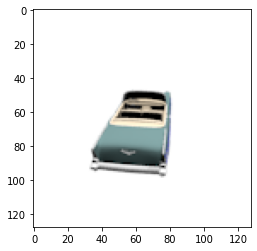

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


enc_img torch.Size([128, 128, 3])
tensor([[[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
torch.Size([3, 128, 128])


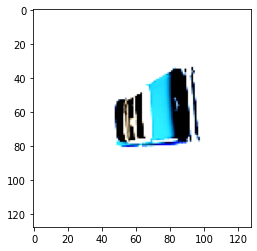

In [38]:
enc_img = img.reshape(128,128,3)

import matplotlib.pyplot as plt
plt.imshow(enc_img.numpy())
plt.show()

def normalize_image():
    ops = []
#     ops.extend(
#         [T.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),]
#     )
    ops.extend(
        [T.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])]
    )
#     mean=[0.485, 0.456, 0.406],
#                      std=[0.229, 0.224, 0.225]
    return T.Compose(ops)

print("enc_img", enc_img.shape)
enc_img = enc_img.permute(2,1,0)
norm_img = normalize_image()

print(enc_img)
encoded_image = norm_img(enc_img)

print(encoded_image.shape)

plt.imshow(encoded_image.permute(1,2,0).numpy())
plt.show()

In [2]:
import torch
def extract_model_state_dict(ckpt_path, model_name='model', prefixes_to_ignore=[]):
    checkpoint = torch.load(ckpt_path, map_location=torch.device('cpu'))
    checkpoint_ = {}
    if 'state_dict' in checkpoint: # if it's a pytorch-lightning checkpoint
        checkpoint = checkpoint['state_dict']
    for k, v in checkpoint.items():
        if not k.startswith(model_name):
            continue
        k = k[len(model_name)+1:]
        for prefix in prefixes_to_ignore:
            if k.startswith(prefix):
                print('ignore', k)
                break
        else:
            checkpoint_[k] = v
    return checkpoint_

checkpoint_ = extract_model_state_dict('/home/zubair/epoch=582.ckpt', 'image_encoder', [])

In [8]:
import numpy as np

ex_0 = np.load('/home/zubair/Downloads/Compressed/carla_poses/000034_extrinsics.npy')

ex_1 = np.load('/home/zubair/Downloads/Compressed/carla_poses/000035_extrinsics.npy')
intrinsics = np.load('/home/zubair/Downloads/Compressed/carla_poses/intrinsics.npy')

In [9]:
print(ex_0)
print(ex_1)
print(intrinsics)

[[-8.2120019e-01  3.5623613e-01 -4.4578710e-01 -4.4578629e+00]
 [-5.7062119e-01 -5.1903105e-01  6.3639486e-01  6.3639526e+00]
 [-4.6704966e-03  7.7698308e-01  6.2950414e-01  6.2950444e+00]]
[[-3.9443240e-01 -3.1319129e-01  8.6390644e-01  8.6390781e+00]
 [ 9.1892213e-01 -1.3211875e-01  3.7165400e-01  3.7165408e+00]
 [-2.2605360e-03  9.4045514e-01  3.3991036e-01  3.3991022e+00]]
[[[[955.40500674   0.         256.        ]
   [  0.         955.40500674 256.        ]
   [  0.           0.           1.        ]]]]


In [12]:
import os

input_folder = '/home/zubair/Downloads/Compressed/training_images'
files = os.listdir(input_folder)
output_folder = '/home/zubair/Downloads/Compressed/training_images/images'

os.makedirs(output_folder, exist_ok=True)

from PIL import Image
import pillow_heif

output_size = (504,378)



for file in files:
    if file.endswith('.HEIC'):
#         filename ='/home/zubair/Downloads/Compressed/training_images/IMG_2469.HEIC'
        heif_file = pillow_heif.read_heif(os.path.join(input_folder, file))
        image = Image.frombytes(
            heif_file.mode,
            heif_file.size,
            heif_file.data,
            "raw",
        )
        image = image.resize(output_size)
        output_path = os.path.join(output_folder, file.split('.')[0]+'.png')
        image.save(output_path, format="png")
        

# import matplotlib.pyplot as plt
# import numpy as np
# print(np.array(image).shape)
# plt.imshow(np.array(image))



(504, 378, 3)


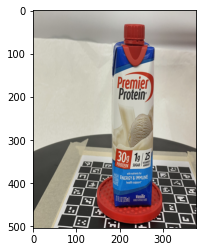

In [7]:
output_size = (504,378)
image = image.resize(output_size)
print(np.array(image).shape)
plt.imshow(np.array(image))

In [10]:
filename = 'IMG_2469.HEIC'
print(filename.split('.')[0])

IMG_2469
